<table class="table table-bordered">
    <tr>
        <th style="text-align:center; vertical-align: middle; width:50%"><img src='https://www.np.edu.sg/images/default-source/default-album/img-logo.png'"></th>
        <th style="text-align:center;"><h1>Deep Learning</h1><h2>Assignment 1 - Food Classification Model (Individual)</h2><h3>AY2023/24 Semester</h3></th>
    </tr>
</table>

In [1]:
# Import the Required Packages
import os
import random
from PIL import Image
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import BatchNormalization
from keras.callbacks import LearningRateScheduler
from tensorflow.keras.layers import LeakyReLU


import matplotlib.pyplot as plt
%matplotlib inline

## Step 1: Data Loading

In [3]:
base_dir = 'C:\\Users\\User\\OneDrive\\DS - Yr2\\Semester 2\\DL\\ASG1\\'
#base_dir = 'C:\\Users\\User\\Desktop\\DL ASG1 Data\\'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

In [68]:
img_size = 150
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [3]:
def accloss(history):
    # Plot the Training and Validation Accuracy & Loss Scores
    acc = history.history['acc']
    val_acc = history.history['val_acc']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    # accuracy
    plt.figure(figsize=(15,5))
    plt.plot(epochs, acc, 'b-o', label='Training acc')
    plt.plot(epochs, val_acc, 'r-o', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    plt.show()

    # loss
    plt.figure(figsize=(15,5))
    plt.plot(epochs, loss, 'b-o', label='Training loss')
    plt.plot(epochs, val_loss, 'r-o', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.show()

In [4]:
def accloss1(history):
    acc = history.history['acc']
    val_acc = history.history['val_acc']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.plot(epochs, acc, 'bo', label='Training acc')
    plt.plot(epochs, val_acc, 'b', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()

    plt.figure()

    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.show()

## Step 2:  Develop the Image Classification Models

### Model #1

In [3]:
img_size = 150

In [4]:
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [5]:
for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    tmp_plot=data_batch[0]
    print('labels batch shape:', labels_batch.shape)
    break

data batch shape: (32, 150, 150, 3)
labels batch shape: (32, 10)


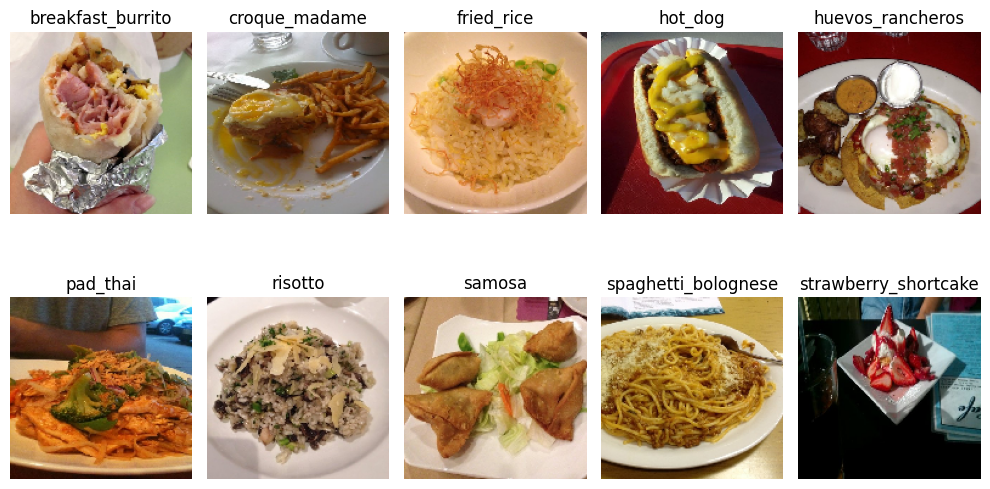

In [6]:
# Get the class indices from the generator
class_indices = train_generator.class_indices

# Get the class labels (assuming the directory names are the class labels)
class_labels = sorted(class_indices.keys())

# Define the number of samples (1 sample per class)
num_samples = len(class_labels)

# Create a figure to display the random images
plt.figure(figsize=(10, 6))

# Loop through each class
for class_label in class_labels:
    # Get one batch of data for the specific class
    train_generator.reset()  # Reset generator to start from the beginning
    images = []
    labels = []
    while len(images) < 1:  # Get at least one image for the class
        batch = train_generator.next()
        for i, label in enumerate(batch[1]):
            if label[class_indices[class_label]] == 1:
                images.append(batch[0][i])
                labels.append(class_label)

    # Choose a random image from the retrieved images for display
    random_index = random.randint(0, len(images) - 1)
    random_image = images[random_index]

    # Display the image with the corresponding class label
    plt.subplot(2, 5, class_indices[class_label] + 1)  # Adjust subplot layout as per your class count
    plt.imshow(random_image)
    plt.title(labels[random_index])
    plt.axis('off')

plt.tight_layout()
plt.show()


<b>Baseline Model<b>

In [7]:
# Build the Model
baseline_model = models.Sequential()

# input layer
baseline_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
baseline_model.add(layers.MaxPooling2D((2, 2)))

# hidden layer 1
baseline_model.add(layers.Conv2D(32, (3, 3), activation='relu'))
baseline_model.add(layers.MaxPooling2D((2, 2)))
# flatten
baseline_model.add(layers.Flatten())
# dense layers
baseline_model.add(layers.Dense(10, activation='softmax'))

baseline_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

baseline_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 41472)             0         
                                                                 
 dense (Dense)               (None, 10)                4

In [8]:
# Train the Model
baseline = baseline_model.fit(
      train_generator,
      steps_per_epoch=7500/32, #train_sample_size/data_batch_size
      epochs=50,
      validation_data=validation_generator,
      validation_steps=2000/32) #validation_sample_size/data_batch_size

Epoch 1/50
234/234 [==============================] - 20s 72ms/step - loss: 2.1405 - acc: 0.2227 - val_loss: 1.9944 - val_acc: 0.2805
Epoch 2/50
234/234 [==============================] - 16s 70ms/step - loss: 1.8774 - acc: 0.3559 - val_loss: 1.8702 - val_acc: 0.3470
Epoch 3/50
234/234 [==============================] - 16s 69ms/step - loss: 1.7486 - acc: 0.4036 - val_loss: 1.8446 - val_acc: 0.3480
Epoch 4/50
234/234 [==============================] - 16s 69ms/step - loss: 1.6511 - acc: 0.4457 - val_loss: 1.8134 - val_acc: 0.3640
Epoch 5/50
234/234 [==============================] - 16s 69ms/step - loss: 1.5762 - acc: 0.4715 - val_loss: 1.7564 - val_acc: 0.3985
Epoch 6/50
234/234 [==============================] - 16s 69ms/step - loss: 1.4924 - acc: 0.5071 - val_loss: 1.7645 - val_acc: 0.3890
Epoch 7/50
234/234 [==============================] - 16s 69ms/step - loss: 1.4269 - acc: 0.5348 - val_loss: 1.7424 - val_acc: 0.3975
Epoch 8/50
234/234 [==============================] - 16s 70ms

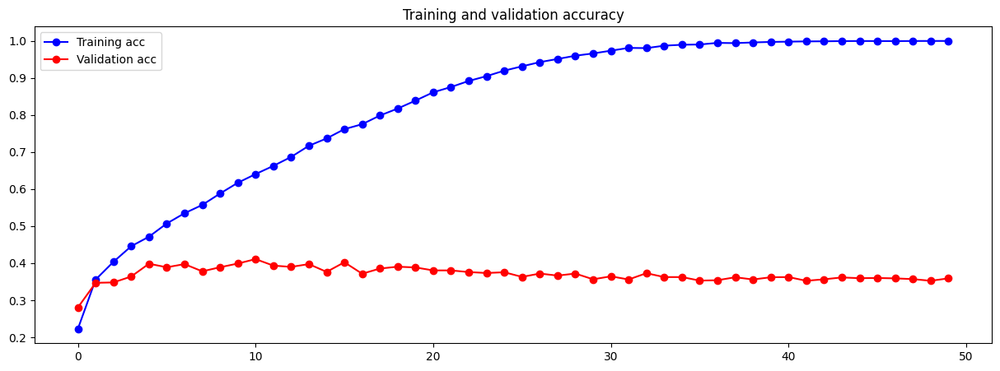

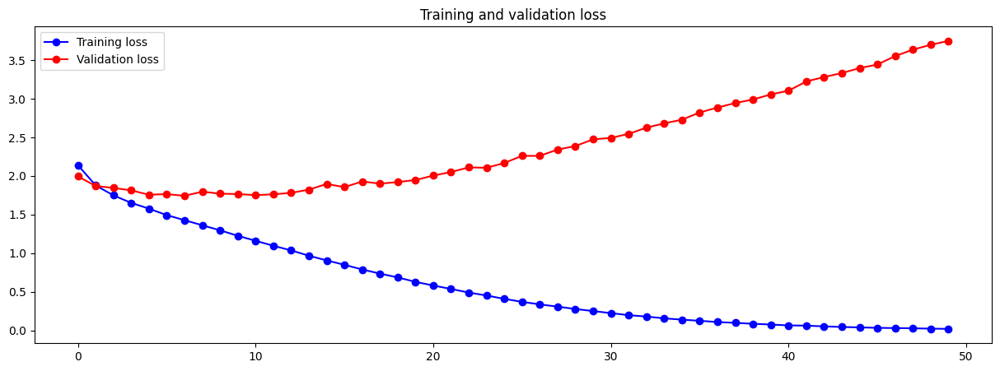

In [9]:
accloss(baseline)

In [10]:
# Save the Model
baseline_model.save('food_model_one_baseline.h5')

<b>Data Augmentation<b>
- It is a common practice to utilise Data Augmentation to counter noisy datasets.

In [70]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


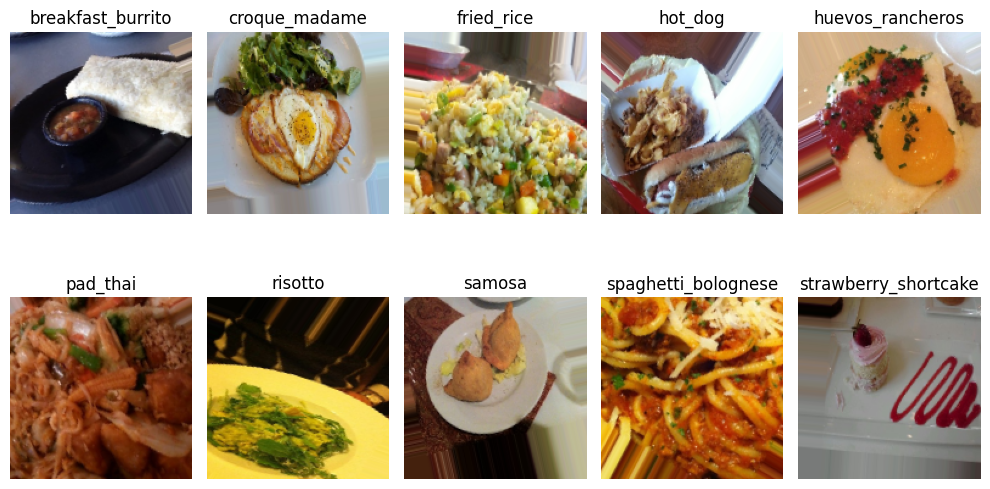

In [12]:
# Get the class indices from the generator
class_indices = train_generator.class_indices

# Get the class labels (assuming the directory names are the class labels)
class_labels = sorted(class_indices.keys())

# Define the number of samples (1 sample per class)
num_samples = len(class_labels)

# Create a figure to display the random images
plt.figure(figsize=(10, 6))

# Loop through each class
for class_label in class_labels:
    # Get one batch of data for the specific class
    train_generator.reset()  # Reset generator to start from the beginning
    images = []
    labels = []
    while len(images) < 1:  # Get at least one image for the class
        batch = train_generator.next()
        for i, label in enumerate(batch[1]):
            if label[class_indices[class_label]] == 1:
                images.append(batch[0][i])
                labels.append(class_label)

    # Choose a random image from the retrieved images for display
    random_index = random.randint(0, len(images) - 1)
    random_image = images[random_index]

    # Display the image with the corresponding class label
    plt.subplot(2, 5, class_indices[class_label] + 1)  # Adjust subplot layout as per your class count
    plt.imshow(random_image)
    plt.title(labels[random_index])
    plt.axis('off')

plt.tight_layout()
plt.show()


In [13]:
# Build the Model
aug1_model = models.Sequential()

# input layer
aug1_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
aug1_model.add(layers.MaxPooling2D((2, 2)))

# hidden layer 1
aug1_model.add(layers.Conv2D(32, (3, 3), activation='relu'))
aug1_model.add(layers.MaxPooling2D((2, 2)))
# flatten
aug1_model.add(layers.Flatten())
# dense layers
aug1_model.add(layers.Dense(10, activation='softmax'))

aug1_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

aug1_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 72, 72, 32)        9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 41472)             0         
                                                                 
 dense_1 (Dense)             (None, 10)               

In [15]:
# Train the Model
aug1 = aug1_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=50,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/50
234/234 [==============================] - 40s 172ms/step - loss: 1.8557 - acc: 0.3588 - val_loss: 1.8167 - val_acc: 0.3785
Epoch 2/50
234/234 [==============================] - 41s 173ms/step - loss: 1.8380 - acc: 0.3639 - val_loss: 1.8741 - val_acc: 0.3475
Epoch 3/50
234/234 [==============================] - 40s 170ms/step - loss: 1.8215 - acc: 0.3695 - val_loss: 1.9732 - val_acc: 0.3350
Epoch 4/50
234/234 [==============================] - 40s 172ms/step - loss: 1.8088 - acc: 0.3767 - val_loss: 1.7753 - val_acc: 0.3840
Epoch 5/50
234/234 [==============================] - 41s 174ms/step - loss: 1.8005 - acc: 0.3728 - val_loss: 2.0173 - val_acc: 0.3265
Epoch 6/50
234/234 [==============================] - 38s 163ms/step - loss: 1.7999 - acc: 0.3801 - val_loss: 1.7483 - val_acc: 0.3935
Epoch 7/50
234/234 [==============================] - 38s 164ms/step - loss: 1.7860 - acc: 0.3744 - val_loss: 1.8506 - val_acc: 0.3590
Epoch 8/50
234/234 [==============================] - 3

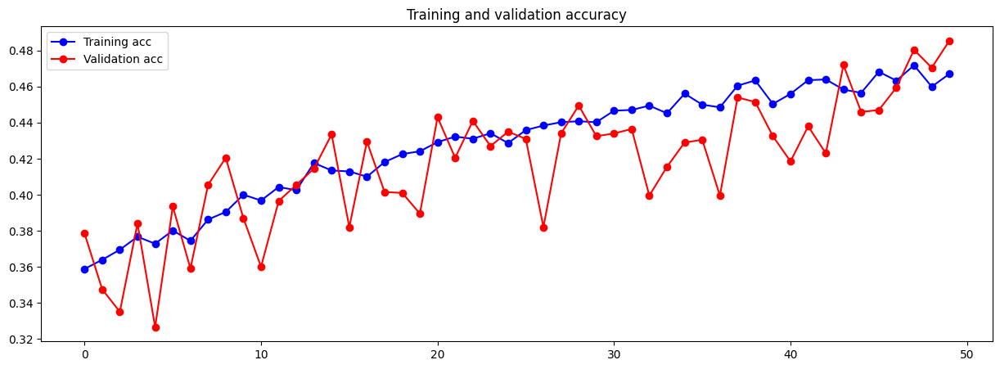

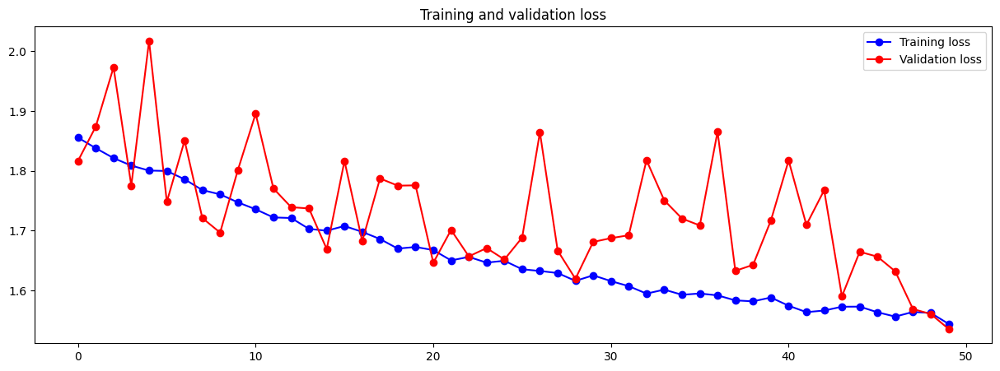

In [16]:
accloss(aug1)

In [17]:
# Save the Model
aug1_model.save('food_model_one_aug1.h5')

<b>Scaling Up<b>

- Adding more layers
- Adding more units
- Training for more epoch

In [18]:
# Build the Model
scaleup1_model = models.Sequential()

# input layer
scaleup1_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
scaleup1_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
scaleup1_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
scaleup1_model.add(layers.MaxPooling2D((2, 2)))

scaleup1_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
scaleup1_model.add(layers.MaxPooling2D((2, 2)))

scaleup1_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
scaleup1_model.add(layers.MaxPooling2D((2, 2)))
# flatten
scaleup1_model.add(layers.Flatten())
# dense layer
scaleup1_model.add(layers.Dense(256, activation='relu'))
# output layer
scaleup1_model.add(layers.Dense(10, activation='softmax'))

scaleup1_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

scaleup1_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 17, 17, 128)     

In [19]:
# Train the Model
scaleup1 = scaleup1_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 39s 163ms/step - loss: 2.1997 - acc: 0.1884 - val_loss: 2.0365 - val_acc: 0.2820
Epoch 2/100
234/234 [==============================] - 39s 167ms/step - loss: 2.0433 - acc: 0.2711 - val_loss: 1.8781 - val_acc: 0.3355
Epoch 3/100
234/234 [==============================] - 39s 164ms/step - loss: 1.9305 - acc: 0.3109 - val_loss: 2.2421 - val_acc: 0.2370
Epoch 4/100
234/234 [==============================] - 38s 161ms/step - loss: 1.8213 - acc: 0.3496 - val_loss: 1.7775 - val_acc: 0.3540
Epoch 5/100
234/234 [==============================] - 38s 163ms/step - loss: 1.7519 - acc: 0.3785 - val_loss: 1.7779 - val_acc: 0.3685
Epoch 6/100
234/234 [==============================] - 38s 162ms/step - loss: 1.6987 - acc: 0.3980 - val_loss: 1.7747 - val_acc: 0.3735
Epoch 7/100
234/234 [==============================] - 38s 164ms/step - loss: 1.6603 - acc: 0.4124 - val_loss: 1.6822 - val_acc: 0.4075
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 38s 163ms/step - loss: 1.0266 - acc: 0.6429 - val_loss: 1.2558 - val_acc: 0.5680
Epoch 62/100
234/234 [==============================] - 38s 164ms/step - loss: 1.0131 - acc: 0.6504 - val_loss: 1.1960 - val_acc: 0.6010
Epoch 63/100
234/234 [==============================] - 40s 169ms/step - loss: 1.0068 - acc: 0.6529 - val_loss: 1.1944 - val_acc: 0.5945
Epoch 64/100
234/234 [==============================] - 40s 172ms/step - loss: 1.0237 - acc: 0.6439 - val_loss: 1.3178 - val_acc: 0.5710
Epoch 65/100
234/234 [==============================] - 40s 170ms/step - loss: 1.0025 - acc: 0.6608 - val_loss: 1.3223 - val_acc: 0.5625
Epoch 66/100
234/234 [==============================] - 38s 163ms/step - loss: 0.9929 - acc: 0.6571 - val_loss: 1.2847 - val_acc: 0.5815
Epoch 67/100
234/234 [==============================] - 38s 163ms/step - loss: 0.9967 - acc: 0.6512 - val_loss: 1.2137 - val_acc: 0.5825
Epoch 68/100
234/234 [===================

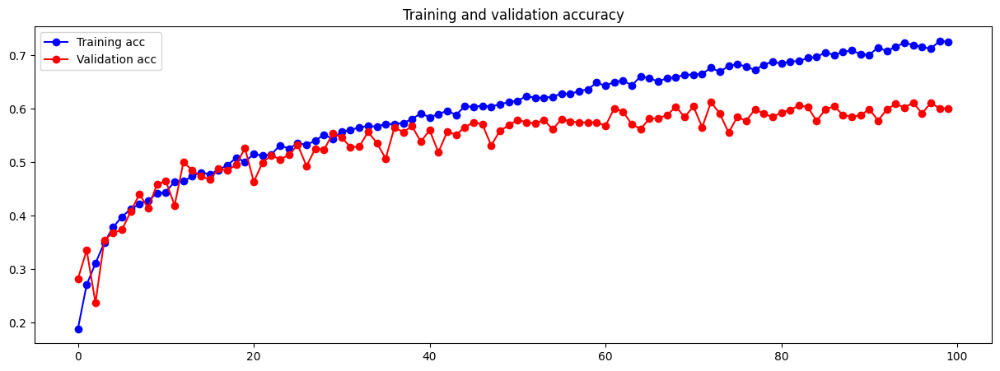

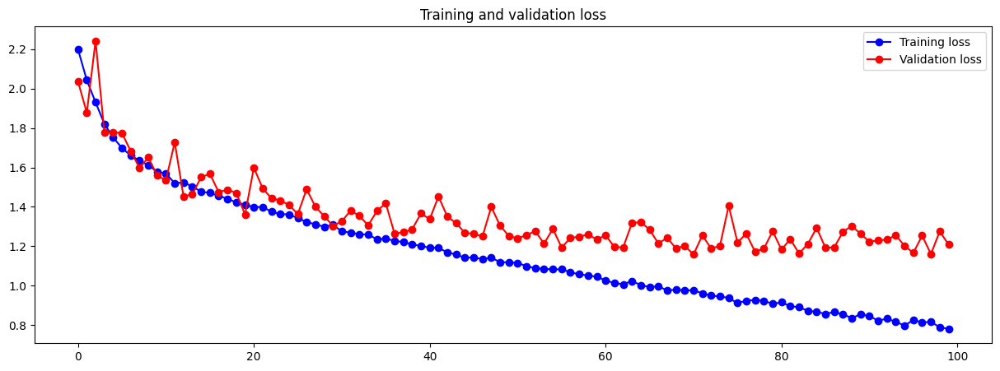

In [20]:
accloss(scaleup1)

In [21]:
# Save the Model
scaleup1_model.save('food_model_one_scaleup1.h5')

<b>ScaleUp2<b>

In [22]:
# Build the Model
scaleup2_model = models.Sequential()

# input layer
scaleup2_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
scaleup2_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
scaleup2_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
scaleup2_model.add(layers.MaxPooling2D((2, 2)))

scaleup2_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
scaleup2_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
scaleup2_model.add(layers.MaxPooling2D((2, 2)))

scaleup2_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
scaleup2_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
scaleup2_model.add(layers.MaxPooling2D((2, 2)))
# flatten
scaleup2_model.add(layers.Flatten())
# dense layer
scaleup2_model.add(layers.Dense(256, activation='relu'))
# output layer
scaleup2_model.add(layers.Dense(10, activation='softmax'))

scaleup2_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

scaleup2_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 conv2d_11 (Conv2D)          (None, 32, 32, 128)      

In [23]:
train_generator.reset();
validation_generator.reset();
# Train the Model
scaleup2 = scaleup2_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 40s 166ms/step - loss: 2.2200 - acc: 0.1631 - val_loss: 2.0474 - val_acc: 0.2550
Epoch 2/100
234/234 [==============================] - 38s 164ms/step - loss: 2.0320 - acc: 0.2636 - val_loss: 1.8859 - val_acc: 0.3290
Epoch 3/100
234/234 [==============================] - 38s 164ms/step - loss: 1.8877 - acc: 0.3237 - val_loss: 1.8524 - val_acc: 0.3500
Epoch 4/100
234/234 [==============================] - 39s 164ms/step - loss: 1.8034 - acc: 0.3565 - val_loss: 1.9212 - val_acc: 0.3210
Epoch 5/100
234/234 [==============================] - 39s 164ms/step - loss: 1.7423 - acc: 0.3768 - val_loss: 1.6873 - val_acc: 0.3970
Epoch 6/100
234/234 [==============================] - 39s 165ms/step - loss: 1.6987 - acc: 0.3959 - val_loss: 1.6764 - val_acc: 0.3915
Epoch 7/100
234/234 [==============================] - 38s 164ms/step - loss: 1.6429 - acc: 0.4095 - val_loss: 1.6043 - val_acc: 0.4310
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 38s 164ms/step - loss: 0.8160 - acc: 0.7109 - val_loss: 1.2184 - val_acc: 0.5865
Epoch 62/100
234/234 [==============================] - 39s 164ms/step - loss: 0.7892 - acc: 0.7189 - val_loss: 1.2496 - val_acc: 0.5985
Epoch 63/100
234/234 [==============================] - 39s 165ms/step - loss: 0.7967 - acc: 0.7243 - val_loss: 1.2369 - val_acc: 0.6100
Epoch 64/100
234/234 [==============================] - 38s 163ms/step - loss: 0.7884 - acc: 0.7256 - val_loss: 1.1781 - val_acc: 0.6155
Epoch 65/100
234/234 [==============================] - 38s 164ms/step - loss: 0.7793 - acc: 0.7259 - val_loss: 1.2819 - val_acc: 0.6000
Epoch 66/100
234/234 [==============================] - 39s 165ms/step - loss: 0.7552 - acc: 0.7348 - val_loss: 1.2398 - val_acc: 0.5855
Epoch 67/100
234/234 [==============================] - 38s 163ms/step - loss: 0.7575 - acc: 0.7376 - val_loss: 1.2073 - val_acc: 0.6205
Epoch 68/100
234/234 [===================

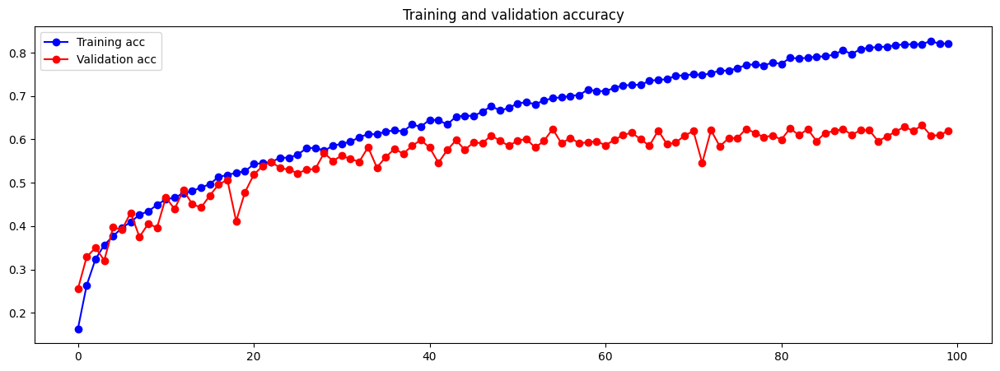

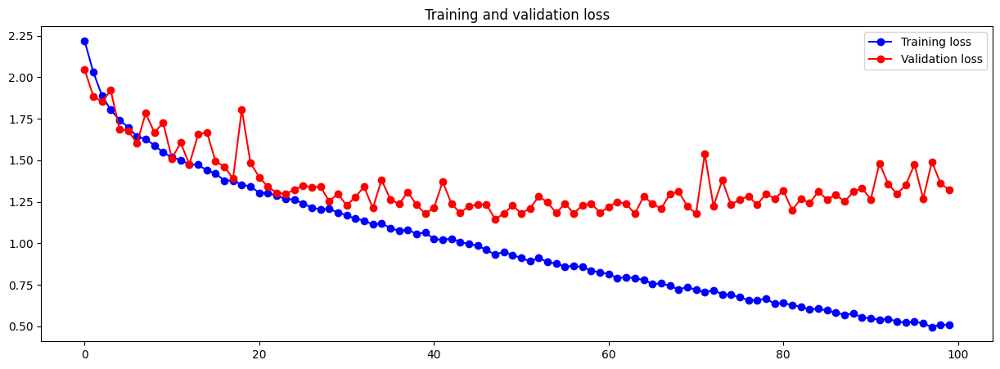

In [24]:
accloss(scaleup2)

In [25]:
scaleup2_model.save('food_model_one_scaleup2.h5')

<b>Regulate<b>

In [26]:
# Build the Model
reg1_model = models.Sequential()

# input layer
reg1_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
reg1_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
reg1_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
reg1_model.add(layers.MaxPooling2D((2, 2)))

reg1_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
reg1_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
reg1_model.add(layers.MaxPooling2D((2, 2)))

reg1_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
reg1_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
reg1_model.add(layers.MaxPooling2D((2, 2)))
# flatten
reg1_model.add(layers.Flatten())
# dense layer
reg1_model.add(layers.Dense(256, activation='relu'))
reg1_model.add(layers.Dropout(0.3))
# output layer
reg1_model.add(layers.Dense(10, activation='softmax'))

reg1_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

reg1_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_15 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_16 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 conv2d_17 (Conv2D)          (None, 32, 32, 128)      

In [27]:
train_generator.reset();
validation_generator.reset();
# Train the Model
reg1 = reg1_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 41s 174ms/step - loss: 2.2514 - acc: 0.1497 - val_loss: 2.1282 - val_acc: 0.2440
Epoch 2/100
234/234 [==============================] - 40s 170ms/step - loss: 2.0809 - acc: 0.2417 - val_loss: 2.0475 - val_acc: 0.2545
Epoch 3/100
234/234 [==============================] - 40s 169ms/step - loss: 1.9723 - acc: 0.2880 - val_loss: 1.8462 - val_acc: 0.3405
Epoch 4/100
234/234 [==============================] - 39s 167ms/step - loss: 1.8505 - acc: 0.3388 - val_loss: 1.8501 - val_acc: 0.3520
Epoch 5/100
234/234 [==============================] - 39s 166ms/step - loss: 1.7947 - acc: 0.3584 - val_loss: 1.6896 - val_acc: 0.3900
Epoch 6/100
234/234 [==============================] - 39s 165ms/step - loss: 1.7466 - acc: 0.3751 - val_loss: 1.7278 - val_acc: 0.3795
Epoch 7/100
234/234 [==============================] - 39s 165ms/step - loss: 1.7125 - acc: 0.3817 - val_loss: 1.6334 - val_acc: 0.4125
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 37s 158ms/step - loss: 0.9525 - acc: 0.6733 - val_loss: 1.1450 - val_acc: 0.6105
Epoch 62/100
234/234 [==============================] - 41s 177ms/step - loss: 0.9494 - acc: 0.6744 - val_loss: 1.2023 - val_acc: 0.5940
Epoch 63/100
234/234 [==============================] - 39s 167ms/step - loss: 0.9398 - acc: 0.6707 - val_loss: 1.1595 - val_acc: 0.6015
Epoch 64/100
234/234 [==============================] - 36s 154ms/step - loss: 0.9300 - acc: 0.6816 - val_loss: 1.1669 - val_acc: 0.6000
Epoch 65/100
234/234 [==============================] - 36s 153ms/step - loss: 0.9274 - acc: 0.6761 - val_loss: 1.1397 - val_acc: 0.6095
Epoch 66/100
234/234 [==============================] - 36s 154ms/step - loss: 0.9229 - acc: 0.6789 - val_loss: 1.2765 - val_acc: 0.5875
Epoch 67/100
234/234 [==============================] - 36s 155ms/step - loss: 0.9000 - acc: 0.6849 - val_loss: 1.1359 - val_acc: 0.6285
Epoch 68/100
234/234 [===================

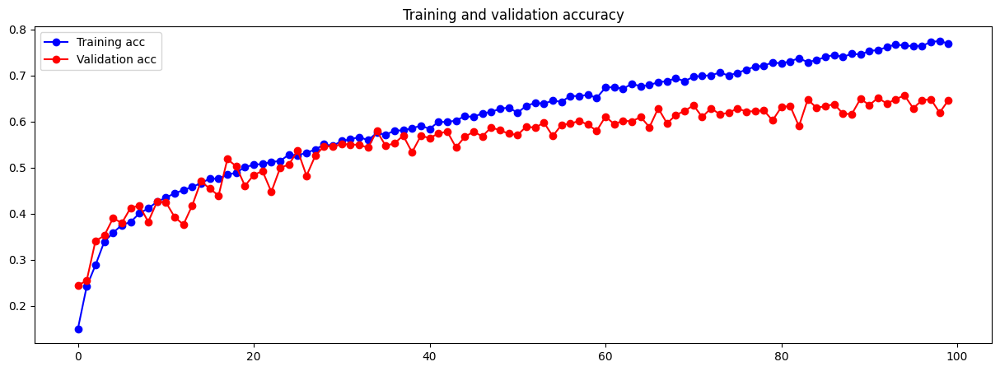

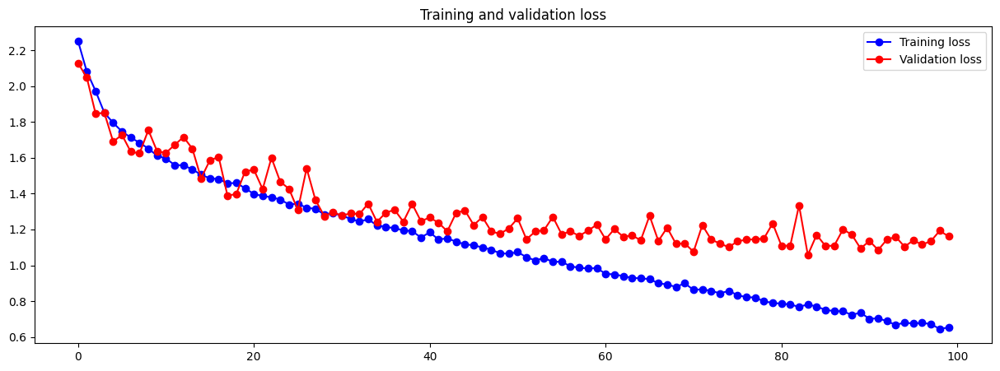

In [28]:
accloss(reg1)

In [29]:
reg1_model.save('food_model_one_reg1.h5')

In [30]:
# Build the Model
reg2_model = models.Sequential()

# input layer
reg2_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
reg2_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
reg2_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
reg2_model.add(layers.MaxPooling2D((2, 2)))

reg2_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
reg2_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
reg2_model.add(layers.MaxPooling2D((2, 2)))

reg2_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
reg2_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
reg2_model.add(layers.MaxPooling2D((2, 2)))
# flatten
reg2_model.add(layers.Flatten())
# dense layer
reg2_model.add(layers.Dense(256, activation='relu'))
reg2_model.add(layers.Dropout(0.5))
# output layer
reg2_model.add(layers.Dense(10, activation='softmax'))

reg2_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

reg2_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_22 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 conv2d_23 (Conv2D)          (None, 32, 32, 128)      

In [31]:
train_generator.reset();
validation_generator.reset();
# Train the Model
reg2 = reg2_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 44s 184ms/step - loss: 2.2673 - acc: 0.1337 - val_loss: 2.2445 - val_acc: 0.1450
Epoch 2/100
234/234 [==============================] - 45s 190ms/step - loss: 2.1219 - acc: 0.2177 - val_loss: 1.9164 - val_acc: 0.2910
Epoch 3/100
234/234 [==============================] - 43s 183ms/step - loss: 1.9788 - acc: 0.2791 - val_loss: 1.8965 - val_acc: 0.3290
Epoch 4/100
234/234 [==============================] - 42s 177ms/step - loss: 1.8785 - acc: 0.3209 - val_loss: 2.0644 - val_acc: 0.2915
Epoch 5/100
234/234 [==============================] - 43s 182ms/step - loss: 1.8469 - acc: 0.3391 - val_loss: 1.8103 - val_acc: 0.3545
Epoch 6/100
234/234 [==============================] - 41s 174ms/step - loss: 1.7859 - acc: 0.3547 - val_loss: 1.6940 - val_acc: 0.3950
Epoch 7/100
234/234 [==============================] - 42s 181ms/step - loss: 1.7583 - acc: 0.3731 - val_loss: 1.6270 - val_acc: 0.4260
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 40s 172ms/step - loss: 0.9819 - acc: 0.6625 - val_loss: 1.1517 - val_acc: 0.6040
Epoch 62/100
234/234 [==============================] - 40s 170ms/step - loss: 0.9747 - acc: 0.6668 - val_loss: 1.0894 - val_acc: 0.6355
Epoch 63/100
234/234 [==============================] - 40s 171ms/step - loss: 0.9427 - acc: 0.6717 - val_loss: 1.1471 - val_acc: 0.6160
Epoch 64/100
234/234 [==============================] - 40s 171ms/step - loss: 0.9492 - acc: 0.6780 - val_loss: 1.0999 - val_acc: 0.6250
Epoch 65/100
234/234 [==============================] - 40s 173ms/step - loss: 0.9420 - acc: 0.6703 - val_loss: 1.1240 - val_acc: 0.6180
Epoch 66/100
234/234 [==============================] - 40s 170ms/step - loss: 0.9342 - acc: 0.6843 - val_loss: 1.1121 - val_acc: 0.6260
Epoch 67/100
234/234 [==============================] - 40s 171ms/step - loss: 0.9304 - acc: 0.6811 - val_loss: 1.0973 - val_acc: 0.6250
Epoch 68/100
234/234 [===================

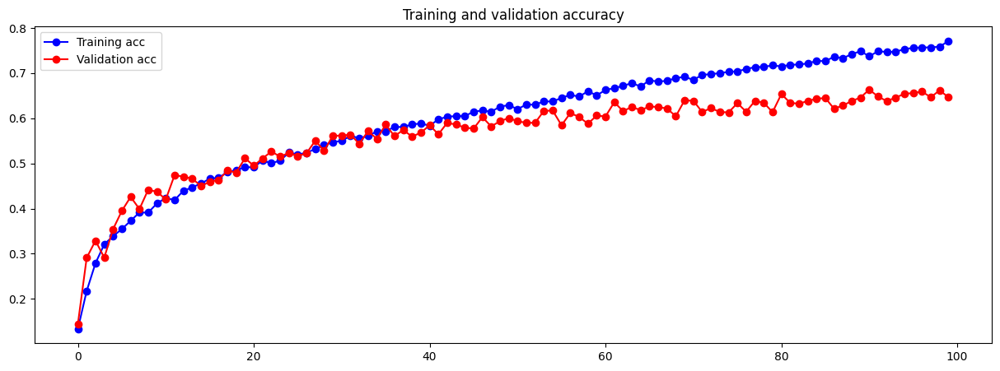

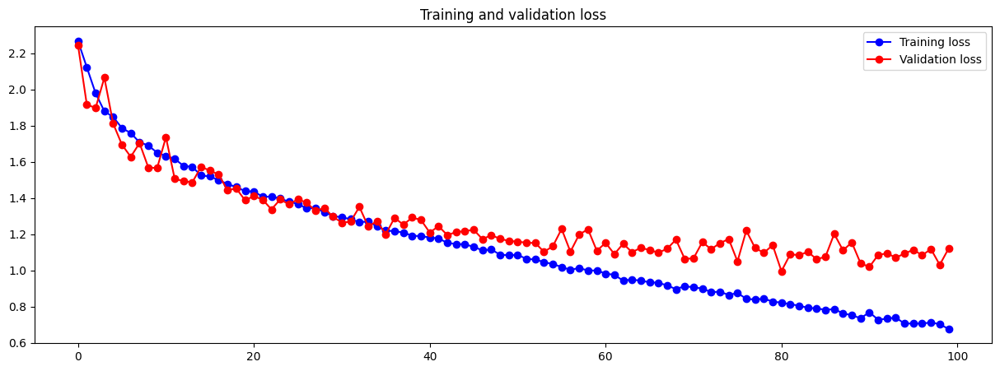

In [32]:
accloss(reg2)

In [33]:
reg2_model.save('food_model_one_reg2.h5')

In [4]:
# Build the Model
scaleup3_model = models.Sequential()

# input layer
scaleup3_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
scaleup3_model.add(layers.Conv2D(32, (3, 3), activation='relu'))
scaleup3_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
scaleup3_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
scaleup3_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
scaleup3_model.add(layers.MaxPooling2D((2, 2)))

scaleup3_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
scaleup3_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
scaleup3_model.add(layers.MaxPooling2D((2, 2)))

scaleup3_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
scaleup3_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
scaleup3_model.add(layers.MaxPooling2D((2, 2)))
# flatten
scaleup3_model.add(layers.Flatten())
# dense layer
scaleup3_model.add(layers.Dense(256, activation='relu'))
scaleup3_model.add(layers.Dropout(0.5))
# output layer
scaleup3_model.add(layers.Dense(10, activation='softmax'))

scaleup3_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

scaleup3_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 146, 146, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 73, 73, 32)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 71, 71, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 69, 69, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 34, 34, 64)       0         
 2D)                                                    

In [5]:
train_generator.reset();
validation_generator.reset();
# Train the Model
scaleup3 = scaleup3_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 51s 202ms/step - loss: 2.2606 - acc: 0.1459 - val_loss: 2.1156 - val_acc: 0.2280
Epoch 2/100
234/234 [==============================] - 42s 181ms/step - loss: 2.1091 - acc: 0.2280 - val_loss: 1.9554 - val_acc: 0.3115
Epoch 3/100
234/234 [==============================] - 42s 179ms/step - loss: 2.0434 - acc: 0.2607 - val_loss: 1.9606 - val_acc: 0.2855
Epoch 4/100
234/234 [==============================] - 42s 177ms/step - loss: 1.9904 - acc: 0.2720 - val_loss: 1.8704 - val_acc: 0.3155
Epoch 5/100
234/234 [==============================] - 41s 176ms/step - loss: 1.9383 - acc: 0.2991 - val_loss: 1.9392 - val_acc: 0.3000
Epoch 6/100
234/234 [==============================] - 42s 178ms/step - loss: 1.8994 - acc: 0.3084 - val_loss: 1.7701 - val_acc: 0.3610
Epoch 7/100
234/234 [==============================] - 41s 177ms/step - loss: 1.8353 - acc: 0.3381 - val_loss: 2.3193 - val_acc: 0.2415
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 39s 167ms/step - loss: 1.0251 - acc: 0.6476 - val_loss: 1.1180 - val_acc: 0.6090
Epoch 62/100
234/234 [==============================] - 39s 167ms/step - loss: 1.0309 - acc: 0.6393 - val_loss: 1.1453 - val_acc: 0.6005
Epoch 63/100
234/234 [==============================] - 40s 170ms/step - loss: 1.0157 - acc: 0.6493 - val_loss: 1.2316 - val_acc: 0.5865
Epoch 64/100
234/234 [==============================] - 39s 166ms/step - loss: 0.9941 - acc: 0.6617 - val_loss: 1.0888 - val_acc: 0.6350
Epoch 65/100
234/234 [==============================] - 39s 167ms/step - loss: 1.0058 - acc: 0.6477 - val_loss: 1.1232 - val_acc: 0.6030
Epoch 66/100
234/234 [==============================] - 40s 169ms/step - loss: 0.9723 - acc: 0.6636 - val_loss: 1.1050 - val_acc: 0.6230
Epoch 67/100
234/234 [==============================] - 39s 167ms/step - loss: 0.9753 - acc: 0.6617 - val_loss: 1.0826 - val_acc: 0.6325
Epoch 68/100
234/234 [===================

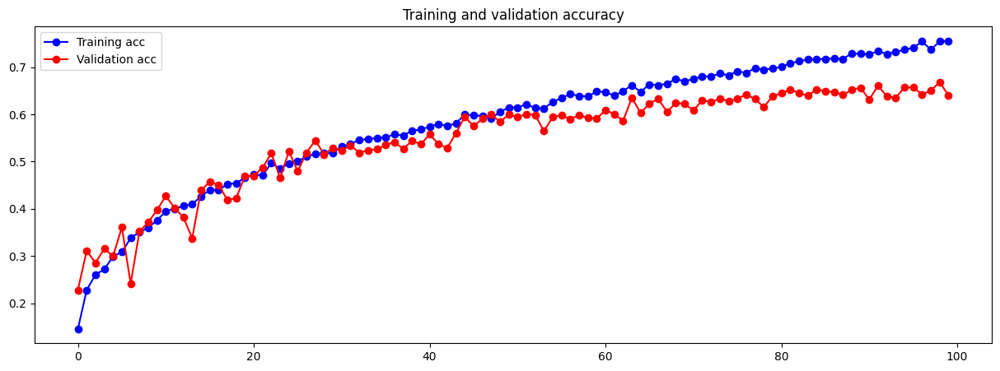

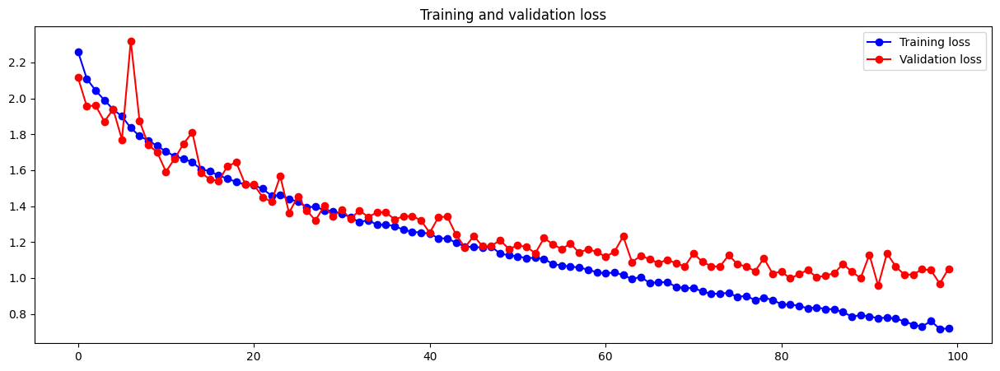

In [6]:
accloss(scaleup3)

In [7]:
scaleup3_model.save('food_model_one_scaleup3.h5')

In [48]:
# Build the Model
scaleup4_model = models.Sequential()

# input layer
scaleup4_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
scaleup4_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
scaleup4_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
scaleup4_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
scaleup4_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
scaleup4_model.add(layers.MaxPooling2D((2, 2)))

scaleup4_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
scaleup4_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
scaleup4_model.add(layers.MaxPooling2D((2, 2)))

scaleup4_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
scaleup4_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
scaleup4_model.add(layers.MaxPooling2D((2, 2)))
# flatten
scaleup4_model.add(layers.Flatten())
# dense layer
scaleup4_model.add(layers.Dense(256, activation='relu'))
scaleup4_model.add(layers.Dropout(0.5))
# output layer
scaleup4_model.add(layers.Dense(10, activation='softmax'))

scaleup4_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

scaleup4_model.summary()

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_178 (Conv2D)         (None, 148, 148, 64)      1792      
                                                                 
 conv2d_179 (Conv2D)         (None, 146, 146, 64)      36928     
                                                                 
 max_pooling2d_75 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_180 (Conv2D)         (None, 71, 71, 128)       73856     
                                                                 
 conv2d_181 (Conv2D)         (None, 69, 69, 128)       147584    
                                                                 
 max_pooling2d_76 (MaxPoolin  (None, 34, 34, 128)      0         
 g2D)                                                

In [49]:
train_generator.reset();
validation_generator.reset();
# Train the Model
scaleup4 = scaleup4_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 79s 336ms/step - loss: 2.2598 - acc: 0.1413 - val_loss: 2.1469 - val_acc: 0.2075
Epoch 2/100
234/234 [==============================] - 42s 178ms/step - loss: 2.1368 - acc: 0.2163 - val_loss: 1.9568 - val_acc: 0.2940
Epoch 3/100
234/234 [==============================] - 41s 176ms/step - loss: 2.0212 - acc: 0.2651 - val_loss: 1.8838 - val_acc: 0.3210
Epoch 4/100
234/234 [==============================] - 40s 172ms/step - loss: 1.9484 - acc: 0.2909 - val_loss: 2.0889 - val_acc: 0.2770
Epoch 5/100
234/234 [==============================] - 40s 172ms/step - loss: 1.8762 - acc: 0.3199 - val_loss: 1.7515 - val_acc: 0.3540
Epoch 6/100
234/234 [==============================] - 40s 171ms/step - loss: 1.8128 - acc: 0.3503 - val_loss: 1.8030 - val_acc: 0.3555
Epoch 7/100
234/234 [==============================] - 41s 175ms/step - loss: 1.7443 - acc: 0.3727 - val_loss: 1.8443 - val_acc: 0.3570
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 40s 171ms/step - loss: 0.7075 - acc: 0.7619 - val_loss: 1.0012 - val_acc: 0.6845
Epoch 62/100
234/234 [==============================] - 38s 161ms/step - loss: 0.6954 - acc: 0.7704 - val_loss: 0.9649 - val_acc: 0.6760
Epoch 63/100
234/234 [==============================] - 38s 160ms/step - loss: 0.6948 - acc: 0.7703 - val_loss: 0.9203 - val_acc: 0.6925
Epoch 64/100
234/234 [==============================] - 38s 162ms/step - loss: 0.6654 - acc: 0.7752 - val_loss: 1.0373 - val_acc: 0.6620
Epoch 65/100
234/234 [==============================] - 38s 160ms/step - loss: 0.6672 - acc: 0.7791 - val_loss: 0.9300 - val_acc: 0.6950
Epoch 66/100
234/234 [==============================] - 38s 161ms/step - loss: 0.6494 - acc: 0.7780 - val_loss: 0.9523 - val_acc: 0.7035
Epoch 67/100
234/234 [==============================] - 38s 163ms/step - loss: 0.6416 - acc: 0.7789 - val_loss: 0.9871 - val_acc: 0.6605
Epoch 68/100
234/234 [===================

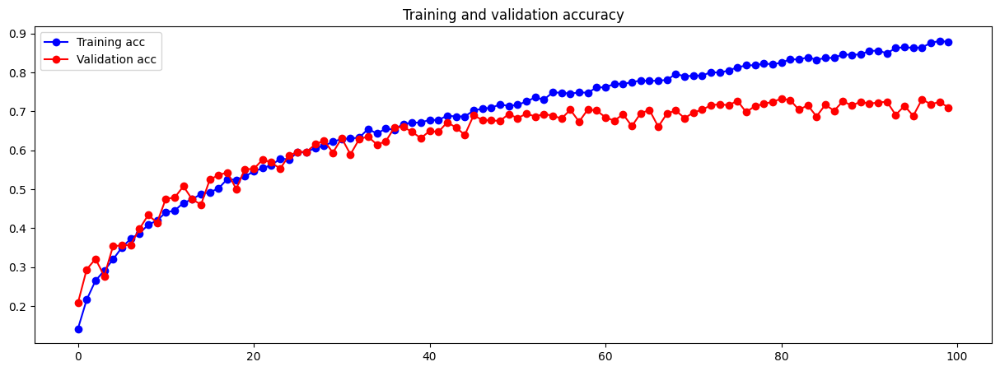

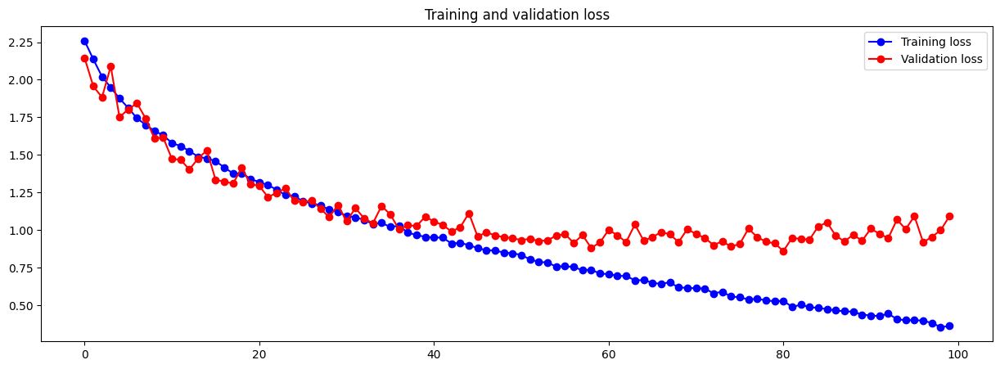

In [50]:
accloss(scaleup4)

In [51]:
scaleup4_model.save('food_model_one_scaleup4.h5')

In [52]:
# Build the Model
scaleup5_model = models.Sequential()

# input layer
scaleup5_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
scaleup5_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
scaleup5_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
scaleup5_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
scaleup5_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
scaleup5_model.add(layers.MaxPooling2D((2, 2)))

scaleup5_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
scaleup5_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
scaleup5_model.add(layers.MaxPooling2D((2, 2)))

scaleup5_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
scaleup5_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
scaleup5_model.add(layers.MaxPooling2D((2, 2)))
# flatten
scaleup5_model.add(layers.Flatten())
# dense layer
scaleup5_model.add(layers.Dense(256, activation='relu'))
scaleup5_model.add(layers.Dropout(0.5))
scaleup5_model.add(layers.Dense(256, activation='relu'))
scaleup5_model.add(layers.Dropout(0.5))
# output layer
scaleup5_model.add(layers.Dense(10, activation='softmax'))

scaleup5_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

scaleup5_model.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_186 (Conv2D)         (None, 148, 148, 64)      1792      
                                                                 
 conv2d_187 (Conv2D)         (None, 146, 146, 64)      36928     
                                                                 
 max_pooling2d_79 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_188 (Conv2D)         (None, 71, 71, 128)       73856     
                                                                 
 conv2d_189 (Conv2D)         (None, 69, 69, 128)       147584    
                                                                 
 max_pooling2d_80 (MaxPoolin  (None, 34, 34, 128)      0         
 g2D)                                                

In [53]:
train_generator.reset();
validation_generator.reset();
# Train the Model
scaleup5 = scaleup5_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 41s 170ms/step - loss: 2.3030 - acc: 0.0960 - val_loss: 2.3023 - val_acc: 0.1040
Epoch 2/100
234/234 [==============================] - 39s 167ms/step - loss: 2.2882 - acc: 0.1261 - val_loss: 2.2365 - val_acc: 0.2030
Epoch 3/100
234/234 [==============================] - 39s 166ms/step - loss: 2.2146 - acc: 0.1728 - val_loss: 2.0832 - val_acc: 0.2220
Epoch 4/100
234/234 [==============================] - 39s 166ms/step - loss: 2.1214 - acc: 0.2127 - val_loss: 2.0153 - val_acc: 0.2645
Epoch 5/100
234/234 [==============================] - 39s 167ms/step - loss: 2.0566 - acc: 0.2343 - val_loss: 1.9116 - val_acc: 0.2950
Epoch 6/100
234/234 [==============================] - 39s 166ms/step - loss: 2.0172 - acc: 0.2600 - val_loss: 1.9133 - val_acc: 0.2880
Epoch 7/100
234/234 [==============================] - 39s 167ms/step - loss: 1.9467 - acc: 0.2727 - val_loss: 1.8134 - val_acc: 0.3220
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 39s 166ms/step - loss: 0.8898 - acc: 0.7008 - val_loss: 0.9897 - val_acc: 0.6760
Epoch 62/100
234/234 [==============================] - 39s 166ms/step - loss: 0.8671 - acc: 0.7111 - val_loss: 0.9619 - val_acc: 0.6810
Epoch 63/100
234/234 [==============================] - 39s 167ms/step - loss: 0.8687 - acc: 0.7092 - val_loss: 1.0602 - val_acc: 0.6460
Epoch 64/100
234/234 [==============================] - 39s 165ms/step - loss: 0.8534 - acc: 0.7167 - val_loss: 1.0224 - val_acc: 0.6635
Epoch 65/100
234/234 [==============================] - 39s 165ms/step - loss: 0.8244 - acc: 0.7248 - val_loss: 1.0354 - val_acc: 0.6710
Epoch 66/100
234/234 [==============================] - 39s 165ms/step - loss: 0.8171 - acc: 0.7289 - val_loss: 1.0011 - val_acc: 0.6725
Epoch 67/100
234/234 [==============================] - 39s 165ms/step - loss: 0.8213 - acc: 0.7231 - val_loss: 0.9607 - val_acc: 0.6910
Epoch 68/100
234/234 [===================

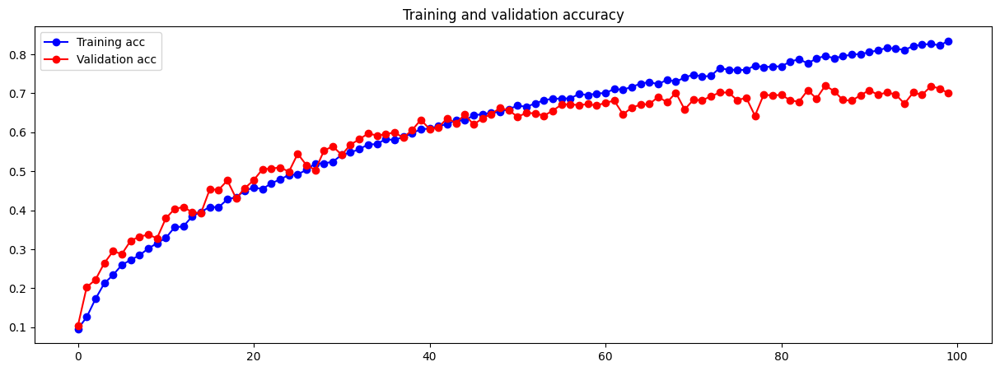

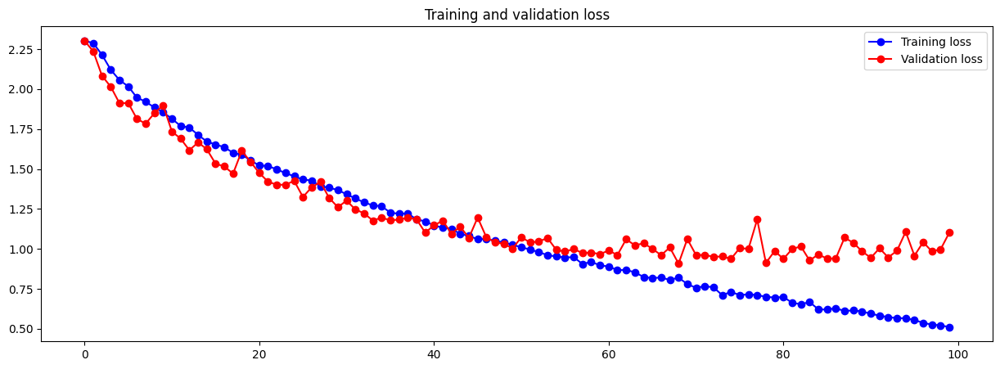

In [54]:
accloss(scaleup5)

In [55]:
scaleup5_model.save('food_model_one_scaleup5.h5')

<b>Batch Normalize<b>

In [56]:
# Build the Model
bn1_model = models.Sequential()

# input layer
bn1_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
bn1_model.add(layers.BatchNormalization())
bn1_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
bn1_model.add(layers.BatchNormalization())
bn1_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
bn1_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
bn1_model.add(layers.BatchNormalization())
bn1_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
bn1_model.add(layers.BatchNormalization())
bn1_model.add(layers.MaxPooling2D((2, 2)))

bn1_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
bn1_model.add(layers.BatchNormalization())
bn1_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
bn1_model.add(layers.BatchNormalization())
bn1_model.add(layers.MaxPooling2D((2, 2)))

bn1_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
bn1_model.add(layers.BatchNormalization())
bn1_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
bn1_model.add(layers.BatchNormalization())
bn1_model.add(layers.MaxPooling2D((2, 2)))
# flatten
bn1_model.add(layers.Flatten())
# dense layer
bn1_model.add(layers.Dense(256, activation='relu'))
bn1_model.add(layers.BatchNormalization())
bn1_model.add(layers.Dropout(0.5))
bn1_model.add(layers.Dense(256, activation='relu'))
bn1_model.add(layers.BatchNormalization())
bn1_model.add(layers.Dropout(0.5))
# output layer
bn1_model.add(layers.Dense(10, activation='softmax'))

bn1_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

bn1_model.summary()

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_194 (Conv2D)         (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_158 (Ba  (None, 148, 148, 64)     256       
 tchNormalization)                                               
                                                                 
 conv2d_195 (Conv2D)         (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_159 (Ba  (None, 146, 146, 64)     256       
 tchNormalization)                                               
                                                                 
 max_pooling2d_83 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                     

In [57]:
train_generator.reset();
validation_generator.reset();
# Train the Model
bn1 = bn1_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 40s 167ms/step - loss: 3.1428 - acc: 0.1720 - val_loss: 3.5094 - val_acc: 0.1050
Epoch 2/100
234/234 [==============================] - 39s 166ms/step - loss: 2.7614 - acc: 0.2181 - val_loss: 3.1493 - val_acc: 0.1680
Epoch 3/100
234/234 [==============================] - 39s 165ms/step - loss: 2.5631 - acc: 0.2424 - val_loss: 2.2658 - val_acc: 0.3145
Epoch 4/100
234/234 [==============================] - 39s 167ms/step - loss: 2.4248 - acc: 0.2693 - val_loss: 2.1950 - val_acc: 0.3105
Epoch 5/100
234/234 [==============================] - 39s 164ms/step - loss: 2.3498 - acc: 0.2853 - val_loss: 1.9120 - val_acc: 0.3555
Epoch 6/100
234/234 [==============================] - 39s 166ms/step - loss: 2.2676 - acc: 0.2955 - val_loss: 1.7810 - val_acc: 0.4055
Epoch 7/100
234/234 [==============================] - 39s 165ms/step - loss: 2.1782 - acc: 0.3067 - val_loss: 1.7860 - val_acc: 0.4240
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 40s 169ms/step - loss: 0.6022 - acc: 0.7980 - val_loss: 0.9854 - val_acc: 0.6800
Epoch 62/100
234/234 [==============================] - 40s 172ms/step - loss: 0.5810 - acc: 0.8072 - val_loss: 0.9313 - val_acc: 0.7195
Epoch 63/100
234/234 [==============================] - 40s 169ms/step - loss: 0.5857 - acc: 0.8048 - val_loss: 1.0098 - val_acc: 0.6870
Epoch 64/100
234/234 [==============================] - 40s 170ms/step - loss: 0.5557 - acc: 0.8165 - val_loss: 0.8992 - val_acc: 0.7160
Epoch 65/100
234/234 [==============================] - 40s 169ms/step - loss: 0.5579 - acc: 0.8155 - val_loss: 0.8684 - val_acc: 0.7235
Epoch 66/100
234/234 [==============================] - 40s 169ms/step - loss: 0.5219 - acc: 0.8325 - val_loss: 0.8907 - val_acc: 0.7190
Epoch 67/100
234/234 [==============================] - 40s 169ms/step - loss: 0.5150 - acc: 0.8317 - val_loss: 1.0312 - val_acc: 0.6795
Epoch 68/100
234/234 [===================

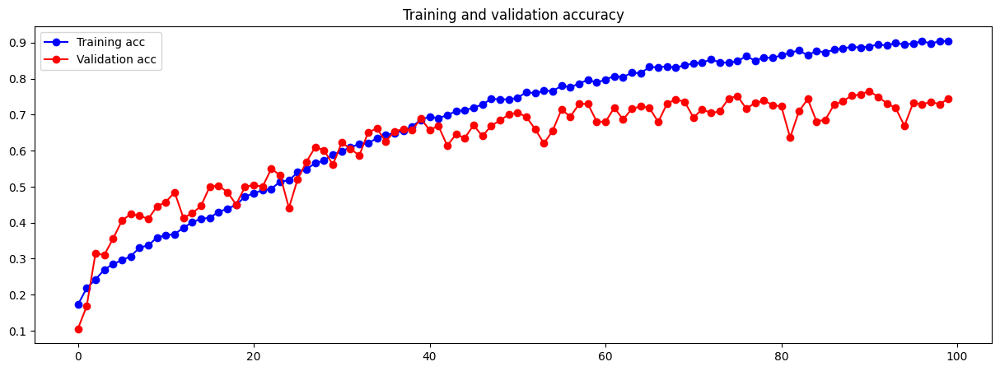

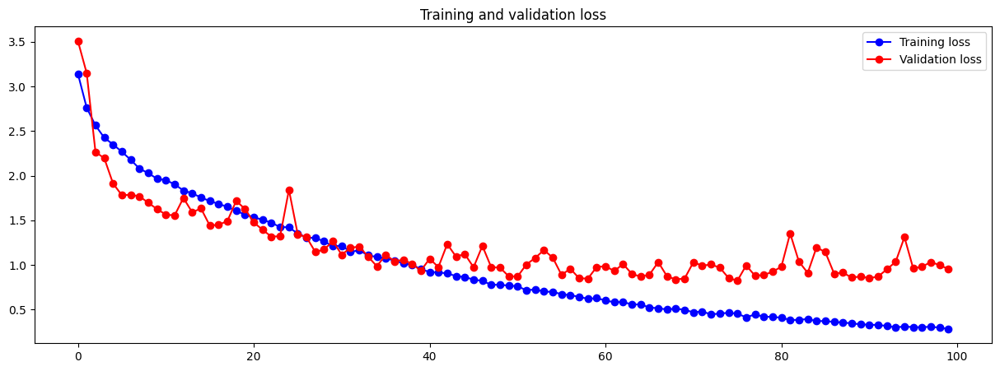

In [58]:
accloss(bn1)

In [59]:
bn1_model.save('food_model_one_bn1.h5')

<b>Test Padding<b>

In [6]:
# Build the Model
padding_model = models.Sequential()

# input layer
padding_model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(img_size, img_size, 3)))
padding_model.add(layers.BatchNormalization())
padding_model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
padding_model.add(layers.BatchNormalization())
padding_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
padding_model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
padding_model.add(layers.BatchNormalization())
padding_model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
padding_model.add(layers.BatchNormalization())
padding_model.add(layers.MaxPooling2D((2, 2)))

padding_model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
padding_model.add(layers.BatchNormalization())
padding_model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
padding_model.add(layers.BatchNormalization())
padding_model.add(layers.MaxPooling2D((2, 2)))

padding_model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
padding_model.add(layers.BatchNormalization())
padding_model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
padding_model.add(layers.BatchNormalization())
padding_model.add(layers.MaxPooling2D((2, 2)))
# flatten
padding_model.add(layers.Flatten())
# dense layer
padding_model.add(layers.Dense(256, activation='relu'))
padding_model.add(layers.BatchNormalization())
padding_model.add(layers.Dropout(0.5))
padding_model.add(layers.Dense(256, activation='relu'))
padding_model.add(layers.BatchNormalization())
padding_model.add(layers.Dropout(0.5))
# output layer
padding_model.add(layers.Dense(10, activation='softmax'))

padding_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

padding_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 64)      1792      
                                                                 
 batch_normalization (BatchN  (None, 150, 150, 64)     256       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 64)      36928     
                                                                 
 batch_normalization_1 (Batc  (None, 150, 150, 64)     256       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 64)       0         
 )                                                               
                                                        

In [7]:
train_generator.reset();
validation_generator.reset();
# Train the Model
padding = padding_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 93s 342ms/step - loss: 3.0074 - acc: 0.1884 - val_loss: 3.3265 - val_acc: 0.1005
Epoch 2/100
234/234 [==============================] - 40s 170ms/step - loss: 2.6097 - acc: 0.2493 - val_loss: 2.1344 - val_acc: 0.2680
Epoch 3/100
234/234 [==============================] - 41s 173ms/step - loss: 2.4384 - acc: 0.2777 - val_loss: 2.0267 - val_acc: 0.3495
Epoch 4/100
234/234 [==============================] - 39s 165ms/step - loss: 2.3458 - acc: 0.2783 - val_loss: 2.0304 - val_acc: 0.3775
Epoch 5/100
234/234 [==============================] - 38s 163ms/step - loss: 2.2316 - acc: 0.3060 - val_loss: 1.7302 - val_acc: 0.3950
Epoch 6/100
234/234 [==============================] - 39s 164ms/step - loss: 2.1573 - acc: 0.3167 - val_loss: 1.9212 - val_acc: 0.3895
Epoch 7/100
234/234 [==============================] - 38s 163ms/step - loss: 2.0964 - acc: 0.3263 - val_loss: 1.7437 - val_acc: 0.4320
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 39s 165ms/step - loss: 0.4453 - acc: 0.8479 - val_loss: 0.9772 - val_acc: 0.7045
Epoch 62/100
234/234 [==============================] - 39s 166ms/step - loss: 0.4217 - acc: 0.8625 - val_loss: 0.9997 - val_acc: 0.7170
Epoch 63/100
234/234 [==============================] - 39s 167ms/step - loss: 0.4300 - acc: 0.8540 - val_loss: 1.0623 - val_acc: 0.6995
Epoch 64/100
234/234 [==============================] - 39s 166ms/step - loss: 0.4274 - acc: 0.8585 - val_loss: 0.8643 - val_acc: 0.7385
Epoch 65/100
234/234 [==============================] - 39s 166ms/step - loss: 0.3993 - acc: 0.8728 - val_loss: 0.9033 - val_acc: 0.7375
Epoch 66/100
234/234 [==============================] - 40s 170ms/step - loss: 0.3583 - acc: 0.8825 - val_loss: 1.2077 - val_acc: 0.6600
Epoch 67/100
234/234 [==============================] - 39s 166ms/step - loss: 0.3903 - acc: 0.8700 - val_loss: 1.0366 - val_acc: 0.7130
Epoch 68/100
234/234 [===================

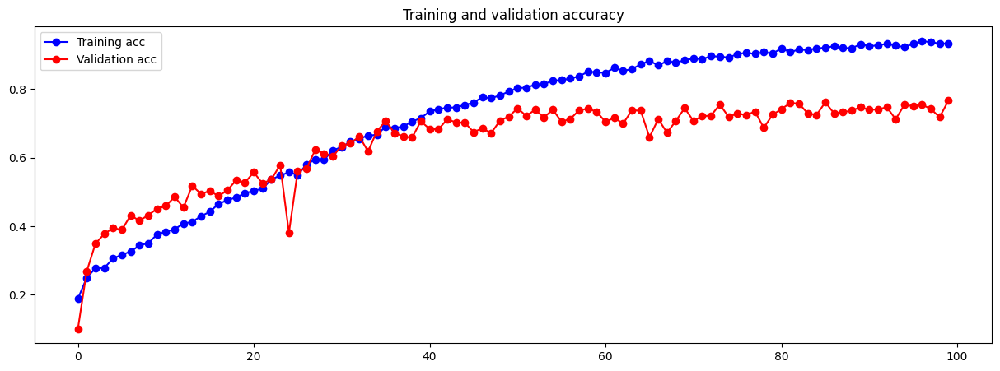

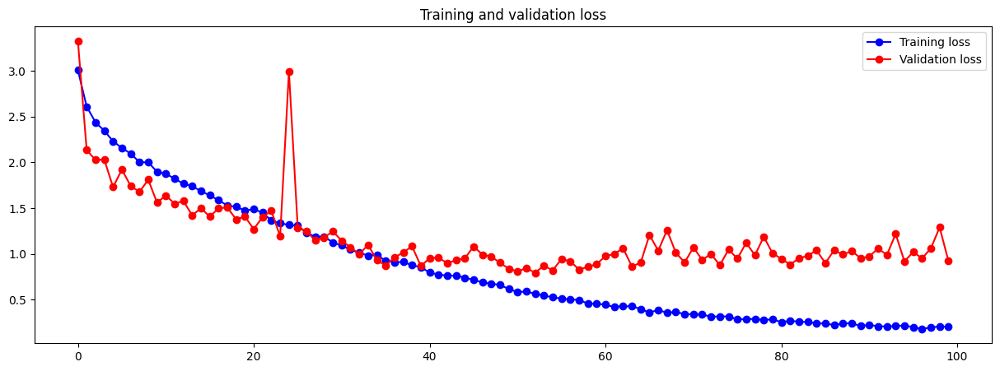

In [8]:
accloss(padding)

In [9]:
padding_model.save('food_model_one_padding.h5')

<b>Learning Rate Tuning<b>

In [10]:
# Build the Model
adamlr1_model = models.Sequential()

# input layer
adamlr1_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
adamlr1_model.add(layers.BatchNormalization())
adamlr1_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
adamlr1_model.add(layers.BatchNormalization())
adamlr1_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
adamlr1_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
adamlr1_model.add(layers.BatchNormalization())
adamlr1_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
adamlr1_model.add(layers.BatchNormalization())
adamlr1_model.add(layers.MaxPooling2D((2, 2)))

adamlr1_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
adamlr1_model.add(layers.BatchNormalization())
adamlr1_model.add(layers.Conv2D(256, (3, 3), activation='relu'))Q
adamlr1_model.add(layers.BatchNormalization())
adamlr1_model.add(layers.MaxPooling2D((2, 2)))

adamlr1_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
adamlr1_model.add(layers.BatchNormalization())
adamlr1_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
adamlr1_model.add(layers.BatchNormalization())
adamlr1_model.add(layers.MaxPooling2D((2, 2)))
# flatten
adamlr1_model.add(layers.Flatten())
# dense layer
adamlr1_model.add(layers.Dense(256, activation='relu'))
adamlr1_model.add(layers.BatchNormalization())
adamlr1_model.add(layers.Dropout(0.5))
adamlr1_model.add(layers.Dense(256, activation='relu'))
adamlr1_model.add(layers.BatchNormalization())
adamlr1_model.add(layers.Dropout(0.5))
# output layer
adamlr1_model.add(layers.Dense(10, activation='softmax'))

adamlr1_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=5*1e-4),
              metrics=['acc'])

adamlr1_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_10 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_9 (Conv2D)           (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_11 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 73, 73, 64)       0         
 2D)                                                             
                                                      

In [11]:
train_generator.reset();
validation_generator.reset();
# Train the Model
adamlr1 = adamlr1_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 45s 173ms/step - loss: 2.9454 - acc: 0.1765 - val_loss: 3.3199 - val_acc: 0.1065
Epoch 2/100
234/234 [==============================] - 39s 166ms/step - loss: 2.4634 - acc: 0.2288 - val_loss: 2.5609 - val_acc: 0.2070
Epoch 3/100
234/234 [==============================] - 38s 163ms/step - loss: 2.2290 - acc: 0.2561 - val_loss: 2.0697 - val_acc: 0.3035
Epoch 4/100
234/234 [==============================] - 39s 166ms/step - loss: 2.0856 - acc: 0.2863 - val_loss: 1.8305 - val_acc: 0.3720
Epoch 5/100
234/234 [==============================] - 39s 164ms/step - loss: 1.9277 - acc: 0.3220 - val_loss: 1.7072 - val_acc: 0.3920
Epoch 6/100
234/234 [==============================] - 38s 164ms/step - loss: 1.8222 - acc: 0.3639 - val_loss: 1.8625 - val_acc: 0.3390
Epoch 7/100
234/234 [==============================] - 38s 164ms/step - loss: 1.7605 - acc: 0.3768 - val_loss: 1.7570 - val_acc: 0.3935
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 39s 167ms/step - loss: 0.3863 - acc: 0.8717 - val_loss: 0.8086 - val_acc: 0.7645
Epoch 62/100
234/234 [==============================] - 39s 168ms/step - loss: 0.3985 - acc: 0.8704 - val_loss: 0.7667 - val_acc: 0.7735
Epoch 63/100
234/234 [==============================] - 39s 167ms/step - loss: 0.3700 - acc: 0.8775 - val_loss: 0.8404 - val_acc: 0.7400
Epoch 64/100
234/234 [==============================] - 39s 166ms/step - loss: 0.3781 - acc: 0.8737 - val_loss: 0.9713 - val_acc: 0.7160
Epoch 65/100
234/234 [==============================] - 39s 165ms/step - loss: 0.3538 - acc: 0.8867 - val_loss: 0.9649 - val_acc: 0.7350
Epoch 66/100
234/234 [==============================] - 39s 168ms/step - loss: 0.3656 - acc: 0.8781 - val_loss: 0.9663 - val_acc: 0.7130
Epoch 67/100
234/234 [==============================] - 39s 166ms/step - loss: 0.3346 - acc: 0.8908 - val_loss: 0.8861 - val_acc: 0.7355
Epoch 68/100
234/234 [===================

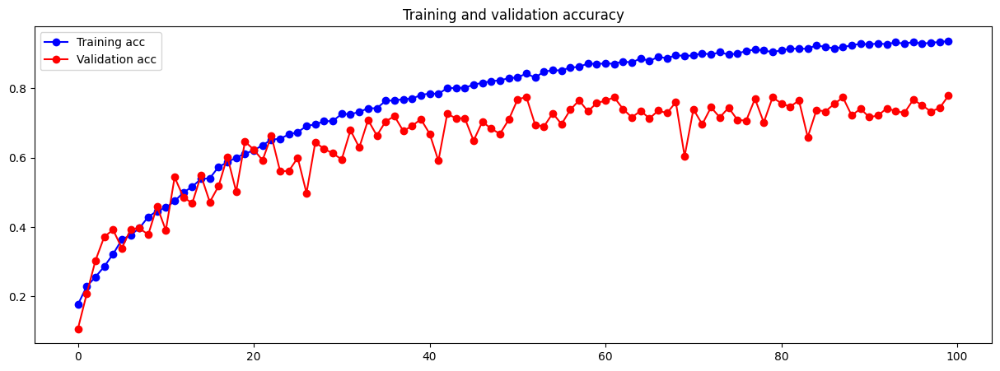

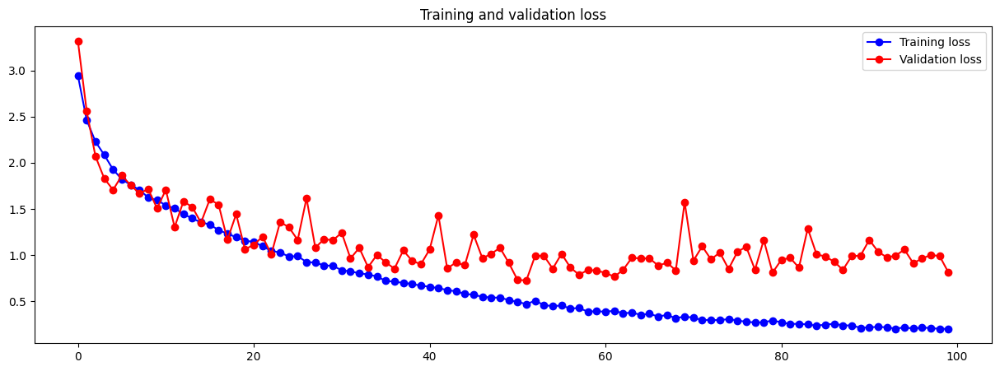

In [12]:
accloss(adamlr1)

In [13]:
adamlr1_model.save('food_model_one_adamlr1.h5')

In [28]:
# Build the Model
adamlr2_model = models.Sequential()

# input layer
adamlr2_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
adamlr2_model.add(layers.BatchNormalization())
adamlr2_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
adamlr2_model.add(layers.BatchNormalization())
adamlr2_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
adamlr2_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
adamlr2_model.add(layers.BatchNormalization())
adamlr2_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
adamlr2_model.add(layers.BatchNormalization())
adamlr2_model.add(layers.MaxPooling2D((2, 2)))

adamlr2_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
adamlr2_model.add(layers.BatchNormalization())
adamlr2_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
adamlr2_model.add(layers.BatchNormalization())
adamlr2_model.add(layers.MaxPooling2D((2, 2)))

adamlr2_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
adamlr2_model.add(layers.BatchNormalization())
adamlr2_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
adamlr2_model.add(layers.BatchNormalization())
adamlr2_model.add(layers.MaxPooling2D((2, 2)))
# flatten
adamlr2_model.add(layers.Flatten())
# dense layer
adamlr2_model.add(layers.Dense(256, activation='relu'))
adamlr2_model.add(layers.BatchNormalization())
adamlr2_model.add(layers.Dropout(0.5))
adamlr2_model.add(layers.Dense(256, activation='relu'))
adamlr2_model.add(layers.BatchNormalization())
adamlr2_model.add(layers.Dropout(0.5))
# output layer
adamlr2_model.add(layers.Dense(10, activation='softmax'))

adamlr2_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-3),
              metrics=['acc'])

adamlr2_model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_56 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_70 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_57 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_71 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                      

In [29]:
train_generator.reset();
validation_generator.reset();
# Train the Model
adamlr2 = adamlr2_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 42s 174ms/step - loss: 2.8900 - acc: 0.1643 - val_loss: 3.2552 - val_acc: 0.1005
Epoch 2/100
234/234 [==============================] - 40s 171ms/step - loss: 2.2793 - acc: 0.2391 - val_loss: 2.1420 - val_acc: 0.2165
Epoch 3/100
234/234 [==============================] - 41s 175ms/step - loss: 2.0131 - acc: 0.2881 - val_loss: 1.8625 - val_acc: 0.3045
Epoch 4/100
234/234 [==============================] - 40s 172ms/step - loss: 1.9107 - acc: 0.3101 - val_loss: 2.0371 - val_acc: 0.2840
Epoch 5/100
234/234 [==============================] - 40s 172ms/step - loss: 1.8434 - acc: 0.3365 - val_loss: 2.0662 - val_acc: 0.2980
Epoch 6/100
234/234 [==============================] - 41s 175ms/step - loss: 1.7723 - acc: 0.3601 - val_loss: 1.7224 - val_acc: 0.3825
Epoch 7/100
234/234 [==============================] - 40s 172ms/step - loss: 1.7298 - acc: 0.3717 - val_loss: 1.8148 - val_acc: 0.3330
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 38s 164ms/step - loss: 0.4311 - acc: 0.8556 - val_loss: 0.8720 - val_acc: 0.7300
Epoch 62/100
234/234 [==============================] - 38s 163ms/step - loss: 0.4010 - acc: 0.8651 - val_loss: 0.9160 - val_acc: 0.7255
Epoch 63/100
234/234 [==============================] - 39s 165ms/step - loss: 0.4181 - acc: 0.8661 - val_loss: 1.2628 - val_acc: 0.6450
Epoch 64/100
234/234 [==============================] - 38s 163ms/step - loss: 0.4170 - acc: 0.8624 - val_loss: 0.9184 - val_acc: 0.7375
Epoch 65/100
234/234 [==============================] - 38s 162ms/step - loss: 0.4174 - acc: 0.8620 - val_loss: 1.2147 - val_acc: 0.6490
Epoch 66/100
234/234 [==============================] - 39s 165ms/step - loss: 0.3863 - acc: 0.8736 - val_loss: 1.0042 - val_acc: 0.7175
Epoch 67/100
234/234 [==============================] - 38s 160ms/step - loss: 0.3818 - acc: 0.8703 - val_loss: 1.0778 - val_acc: 0.6995
Epoch 68/100
234/234 [===================

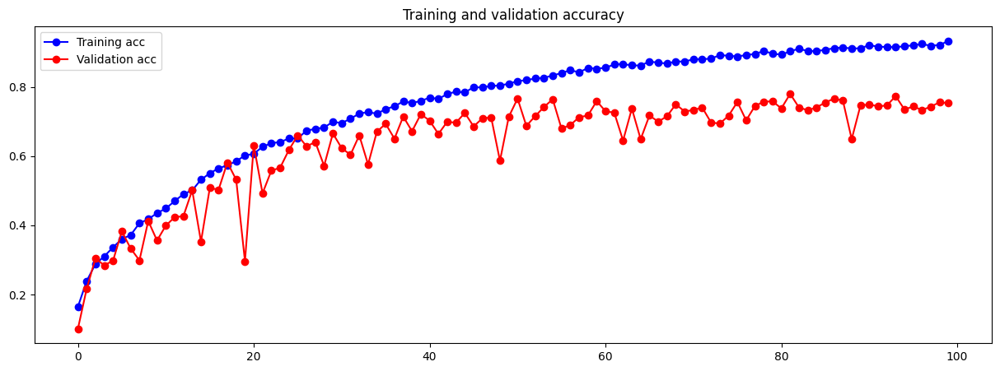

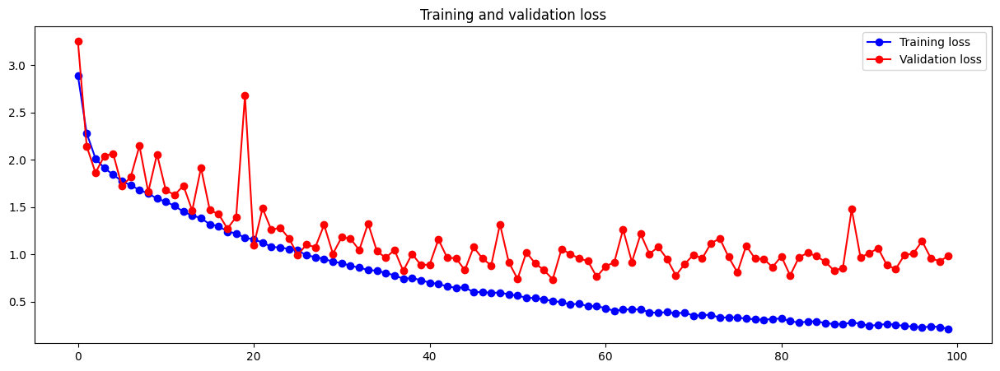

In [30]:
accloss(adamlr2)

In [31]:
adamlr2_model.save('food_model_one_adamlr2.h5')

In [32]:
# Build the Model
adamlr3_model = models.Sequential()

# input layer
adamlr3_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
adamlr3_model.add(layers.BatchNormalization())
adamlr3_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
adamlr3_model.add(layers.BatchNormalization())
adamlr3_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
adamlr3_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
adamlr3_model.add(layers.BatchNormalization())
adamlr3_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
adamlr3_model.add(layers.BatchNormalization())
adamlr3_model.add(layers.MaxPooling2D((2, 2)))

adamlr3_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
adamlr3_model.add(layers.BatchNormalization())
adamlr3_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
adamlr3_model.add(layers.BatchNormalization())
adamlr3_model.add(layers.MaxPooling2D((2, 2)))

adamlr3_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
adamlr3_model.add(layers.BatchNormalization())
adamlr3_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
adamlr3_model.add(layers.BatchNormalization())
adamlr3_model.add(layers.MaxPooling2D((2, 2)))
# flatten
adamlr3_model.add(layers.Flatten())
# dense layer
adamlr3_model.add(layers.Dense(256, activation='relu'))
adamlr3_model.add(layers.BatchNormalization())
adamlr3_model.add(layers.Dropout(0.5))
adamlr3_model.add(layers.Dense(256, activation='relu'))
adamlr3_model.add(layers.BatchNormalization())
adamlr3_model.add(layers.Dropout(0.5))
# output layer
adamlr3_model.add(layers.Dense(10, activation='softmax'))

adamlr3_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=2*1e-3),
              metrics=['acc'])

adamlr3_model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_64 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_80 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_65 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_81 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                      

In [33]:
train_generator.reset();
validation_generator.reset();
# Train the Model
adamlr3 = adamlr3_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 41s 171ms/step - loss: 2.7773 - acc: 0.1471 - val_loss: 3.1294 - val_acc: 0.1220
Epoch 2/100
234/234 [==============================] - 39s 165ms/step - loss: 2.2024 - acc: 0.2316 - val_loss: 2.0377 - val_acc: 0.2410
Epoch 3/100
234/234 [==============================] - 39s 165ms/step - loss: 1.9872 - acc: 0.2756 - val_loss: 2.2234 - val_acc: 0.2720
Epoch 4/100
234/234 [==============================] - 40s 170ms/step - loss: 1.9123 - acc: 0.3120 - val_loss: 2.5468 - val_acc: 0.2375
Epoch 5/100
234/234 [==============================] - 40s 170ms/step - loss: 1.8523 - acc: 0.3327 - val_loss: 1.8744 - val_acc: 0.3560
Epoch 6/100
234/234 [==============================] - 40s 171ms/step - loss: 1.8173 - acc: 0.3423 - val_loss: 2.4800 - val_acc: 0.1940
Epoch 7/100
234/234 [==============================] - 40s 172ms/step - loss: 1.7945 - acc: 0.3572 - val_loss: 2.0691 - val_acc: 0.3200
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 40s 171ms/step - loss: 0.5467 - acc: 0.8184 - val_loss: 1.0959 - val_acc: 0.6655
Epoch 62/100
234/234 [==============================] - 40s 170ms/step - loss: 0.5271 - acc: 0.8237 - val_loss: 0.8578 - val_acc: 0.7345
Epoch 63/100
234/234 [==============================] - 40s 171ms/step - loss: 0.5131 - acc: 0.8339 - val_loss: 1.1446 - val_acc: 0.6590
Epoch 64/100
234/234 [==============================] - 40s 170ms/step - loss: 0.5084 - acc: 0.8297 - val_loss: 0.9079 - val_acc: 0.7160
Epoch 65/100
234/234 [==============================] - 40s 170ms/step - loss: 0.5144 - acc: 0.8287 - val_loss: 1.6325 - val_acc: 0.5085
Epoch 66/100
234/234 [==============================] - 40s 169ms/step - loss: 0.4776 - acc: 0.8391 - val_loss: 1.0375 - val_acc: 0.7125
Epoch 67/100
234/234 [==============================] - 40s 170ms/step - loss: 0.4740 - acc: 0.8408 - val_loss: 1.1789 - val_acc: 0.6705
Epoch 68/100
234/234 [===================

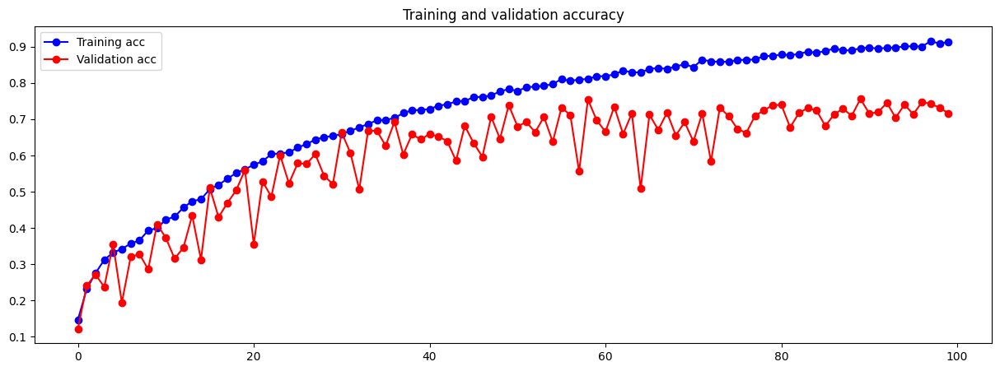

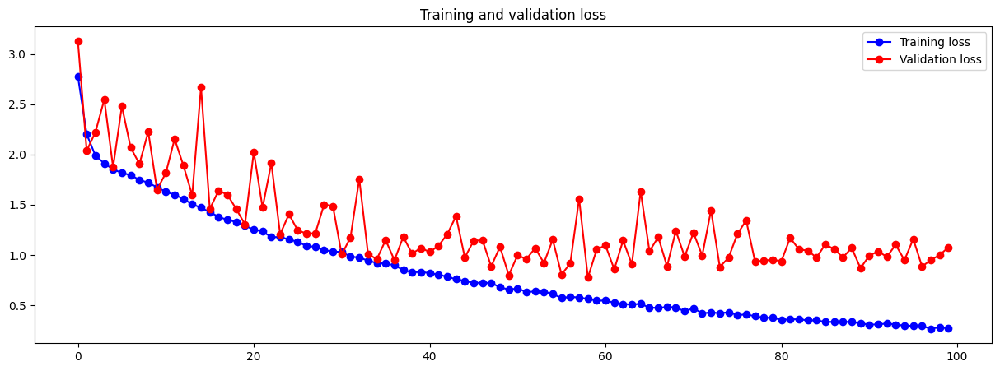

In [34]:
accloss(adamlr3)

In [37]:
adamlr3_model.save('food_model_one_adamlr3.h5')

In [40]:
# Build the Model
adamlr4_model = models.Sequential()

# input layer
adamlr4_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
adamlr4_model.add(layers.BatchNormalization())
adamlr4_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
adamlr4_model.add(layers.BatchNormalization())
adamlr4_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
adamlr4_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
adamlr4_model.add(layers.BatchNormalization())
adamlr4_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
adamlr4_model.add(layers.BatchNormalization())
adamlr4_model.add(layers.MaxPooling2D((2, 2)))

adamlr4_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
adamlr4_model.add(layers.BatchNormalization())
adamlr4_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
adamlr4_model.add(layers.BatchNormalization())
adamlr4_model.add(layers.MaxPooling2D((2, 2)))

adamlr4_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
adamlr4_model.add(layers.BatchNormalization())
adamlr4_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
adamlr4_model.add(layers.BatchNormalization())
adamlr4_model.add(layers.MaxPooling2D((2, 2)))
# flatten
adamlr4_model.add(layers.Flatten())
# dense layer
adamlr4_model.add(layers.Dense(256, activation='relu'))
adamlr4_model.add(layers.BatchNormalization())
adamlr4_model.add(layers.Dropout(0.5))
adamlr4_model.add(layers.Dense(256, activation='relu'))
adamlr4_model.add(layers.BatchNormalization())
adamlr4_model.add(layers.Dropout(0.5))
# output layer
adamlr4_model.add(layers.Dense(10, activation='softmax'))

adamlr4_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=0.9*1e-3),
              metrics=['acc'])

adamlr4_model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_80 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_100 (Ba  (None, 148, 148, 64)     256       
 tchNormalization)                                               
                                                                 
 conv2d_81 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_101 (Ba  (None, 146, 146, 64)     256       
 tchNormalization)                                               
                                                                 
 max_pooling2d_40 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                     

In [41]:
train_generator.reset();
validation_generator.reset();
# Train the Model
adamlr4 = adamlr4_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32) 

Epoch 1/100
234/234 [==============================] - 42s 175ms/step - loss: 2.8467 - acc: 0.1675 - val_loss: 3.8491 - val_acc: 0.1120
Epoch 2/100
234/234 [==============================] - 38s 161ms/step - loss: 2.3502 - acc: 0.2329 - val_loss: 3.0012 - val_acc: 0.1595
Epoch 3/100
234/234 [==============================] - 38s 163ms/step - loss: 2.0878 - acc: 0.2724 - val_loss: 1.8354 - val_acc: 0.3470
Epoch 4/100
234/234 [==============================] - 38s 162ms/step - loss: 1.9412 - acc: 0.3101 - val_loss: 2.3465 - val_acc: 0.2385
Epoch 5/100
234/234 [==============================] - 40s 170ms/step - loss: 1.8891 - acc: 0.3256 - val_loss: 2.0346 - val_acc: 0.3170
Epoch 6/100
234/234 [==============================] - 42s 181ms/step - loss: 1.7887 - acc: 0.3601 - val_loss: 1.7274 - val_acc: 0.3475
Epoch 7/100
234/234 [==============================] - 43s 182ms/step - loss: 1.7282 - acc: 0.3843 - val_loss: 1.6755 - val_acc: 0.3995
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 38s 163ms/step - loss: 0.4325 - acc: 0.8572 - val_loss: 1.2178 - val_acc: 0.6330
Epoch 62/100
234/234 [==============================] - 39s 164ms/step - loss: 0.4096 - acc: 0.8675 - val_loss: 0.9264 - val_acc: 0.7210
Epoch 63/100
234/234 [==============================] - 38s 162ms/step - loss: 0.4059 - acc: 0.8665 - val_loss: 1.0040 - val_acc: 0.7080
Epoch 64/100
234/234 [==============================] - 38s 161ms/step - loss: 0.3955 - acc: 0.8705 - val_loss: 1.0401 - val_acc: 0.7135
Epoch 65/100
234/234 [==============================] - 41s 177ms/step - loss: 0.3943 - acc: 0.8713 - val_loss: 1.0210 - val_acc: 0.6815
Epoch 66/100
234/234 [==============================] - 39s 165ms/step - loss: 0.3945 - acc: 0.8721 - val_loss: 0.8934 - val_acc: 0.7255
Epoch 67/100
234/234 [==============================] - 39s 168ms/step - loss: 0.3774 - acc: 0.8732 - val_loss: 0.7206 - val_acc: 0.7805
Epoch 68/100
234/234 [===================

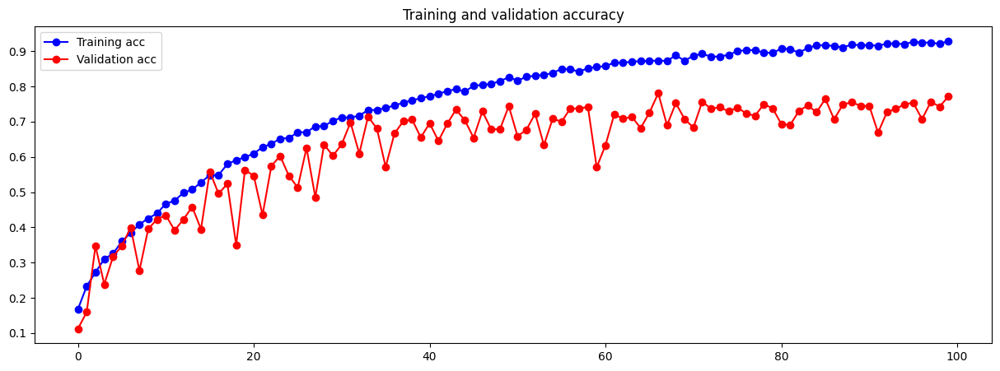

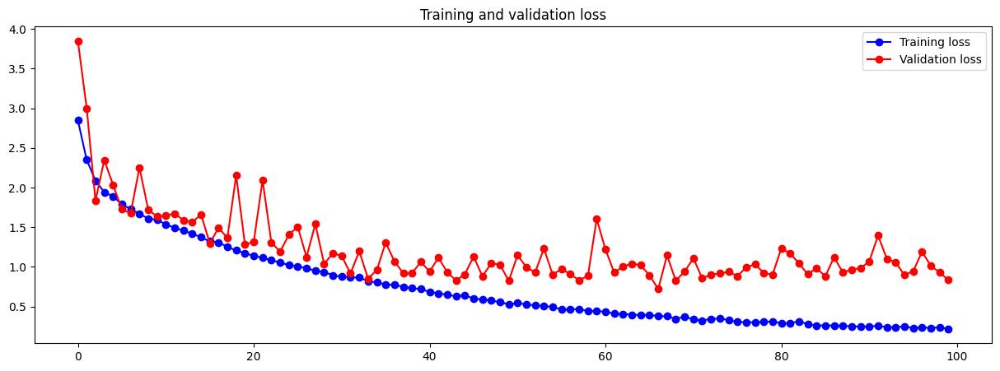

In [42]:
accloss(adamlr4)

In [44]:
adamlr4_model.save('food_model_one_adamlr4.h5')

<b>Implement Learning Rate decay<b>

In [70]:
import math
decay_factor = (5*1e-4 / 1e-3) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

In [71]:
# Build the Model
adamlr5_model = models.Sequential()

# input layer
adamlr5_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
adamlr5_model.add(layers.BatchNormalization())
adamlr5_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
adamlr5_model.add(layers.BatchNormalization())
adamlr5_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
adamlr5_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
adamlr5_model.add(layers.BatchNormalization())
adamlr5_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
adamlr5_model.add(layers.BatchNormalization())
adamlr5_model.add(layers.MaxPooling2D((2, 2)))

adamlr5_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
adamlr5_model.add(layers.BatchNormalization())
adamlr5_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
adamlr5_model.add(layers.BatchNormalization())
adamlr5_model.add(layers.MaxPooling2D((2, 2)))

adamlr5_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
adamlr5_model.add(layers.BatchNormalization())
adamlr5_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
adamlr5_model.add(layers.BatchNormalization())
adamlr5_model.add(layers.MaxPooling2D((2, 2)))
# flatten
adamlr5_model.add(layers.Flatten())
# dense layer
adamlr5_model.add(layers.Dense(256, activation='relu'))
adamlr5_model.add(layers.BatchNormalization())
adamlr5_model.add(layers.Dropout(0.5))
adamlr5_model.add(layers.Dense(256, activation='relu'))
adamlr5_model.add(layers.BatchNormalization())
adamlr5_model.add(layers.Dropout(0.5))
# output layer
adamlr5_model.add(layers.Dense(10, activation='softmax'))

adamlr5_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-3),
              metrics=['acc'])

adamlr5_model.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_160 (Conv2D)         (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_200 (Ba  (None, 148, 148, 64)     256       
 tchNormalization)                                               
                                                                 
 conv2d_161 (Conv2D)         (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_201 (Ba  (None, 146, 146, 64)     256       
 tchNormalization)                                               
                                                                 
 max_pooling2d_80 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                     

In [72]:
lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=0)
train_generator.reset();
validation_generator.reset();
# Train the Model
adamlr5 = adamlr5_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 

Epoch 1/100
234/234 [==============================] - 43s 178ms/step - loss: 2.7888 - acc: 0.1793 - val_loss: 3.4875 - val_acc: 0.1010 - lr: 9.9309e-04
Epoch 2/100
234/234 [==============================] - 42s 179ms/step - loss: 2.2567 - acc: 0.2449 - val_loss: 3.0223 - val_acc: 0.2010 - lr: 9.8623e-04
Epoch 3/100
234/234 [==============================] - 43s 182ms/step - loss: 2.0371 - acc: 0.2856 - val_loss: 2.3590 - val_acc: 0.2130 - lr: 9.7942e-04
Epoch 4/100
234/234 [==============================] - 44s 189ms/step - loss: 1.9277 - acc: 0.3053 - val_loss: 1.8438 - val_acc: 0.3645 - lr: 9.7266e-04
Epoch 5/100
234/234 [==============================] - 43s 183ms/step - loss: 1.8383 - acc: 0.3355 - val_loss: 1.9762 - val_acc: 0.2950 - lr: 9.6594e-04
Epoch 6/100
234/234 [==============================] - 44s 187ms/step - loss: 1.7702 - acc: 0.3608 - val_loss: 1.9979 - val_acc: 0.3185 - lr: 9.5926e-04
Epoch 7/100
234/234 [==============================] - 44s 187ms/step - loss: 1.74

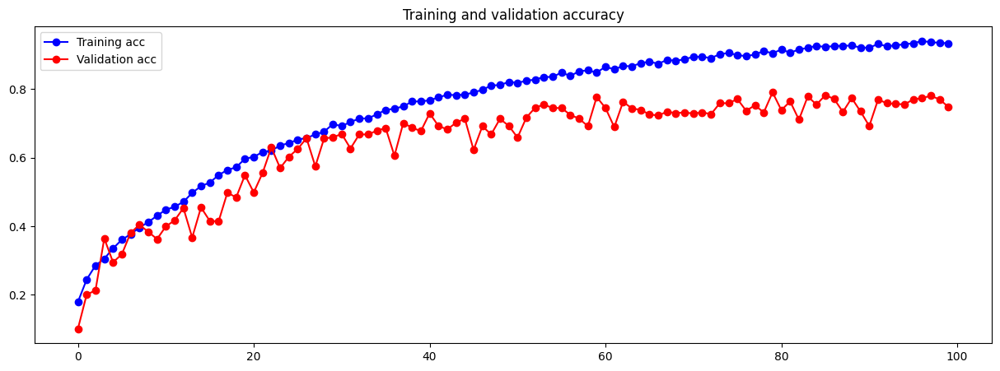

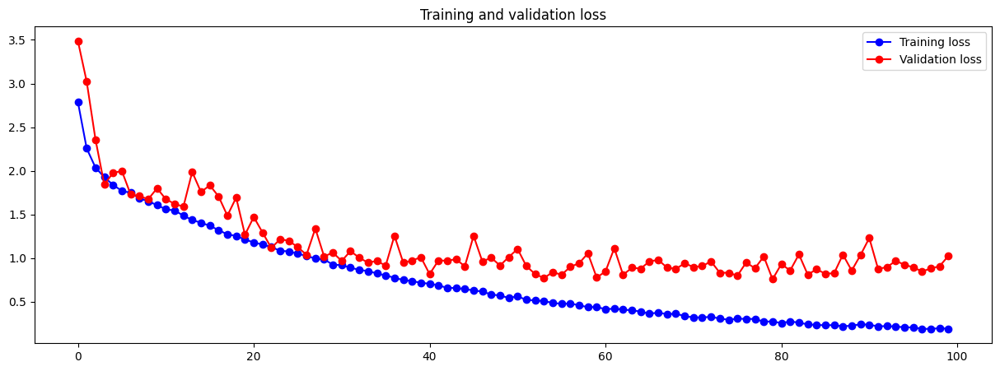

In [73]:
accloss(adamlr5)

In [74]:
adamlr5_model.save('food_model_one_adamlr5.h5')

In [93]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

In [94]:
# Build the Model
adamlr6_model = models.Sequential()

# input layer
adamlr6_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
adamlr6_model.add(layers.BatchNormalization())
adamlr6_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
adamlr6_model.add(layers.BatchNormalization())
adamlr6_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
adamlr6_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
adamlr6_model.add(layers.BatchNormalization())
adamlr6_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
adamlr6_model.add(layers.BatchNormalization())
adamlr6_model.add(layers.MaxPooling2D((2, 2)))

adamlr6_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
adamlr6_model.add(layers.BatchNormalization())
adamlr6_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
adamlr6_model.add(layers.BatchNormalization())
adamlr6_model.add(layers.MaxPooling2D((2, 2)))

adamlr6_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
adamlr6_model.add(layers.BatchNormalization())
adamlr6_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
adamlr6_model.add(layers.BatchNormalization())
adamlr6_model.add(layers.MaxPooling2D((2, 2)))
# flatten
adamlr6_model.add(layers.Flatten())
# dense layer
adamlr6_model.add(layers.Dense(256, activation='relu'))
adamlr6_model.add(layers.BatchNormalization())
adamlr6_model.add(layers.Dropout(0.5))
adamlr6_model.add(layers.Dense(256, activation='relu'))
adamlr6_model.add(layers.BatchNormalization())
adamlr6_model.add(layers.Dropout(0.5))
# output layer
adamlr6_model.add(layers.Dense(10, activation='softmax'))

adamlr6_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

adamlr6_model.summary()

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_216 (Conv2D)         (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_270 (Ba  (None, 148, 148, 64)     256       
 tchNormalization)                                               
                                                                 
 conv2d_217 (Conv2D)         (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_271 (Ba  (None, 146, 146, 64)     256       
 tchNormalization)                                               
                                                                 
 max_pooling2d_108 (MaxPooli  (None, 73, 73, 64)       0         
 ng2D)                                                           
                                                     

In [95]:
lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# train the Model
adamlr6 = adamlr6_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 43s 176ms/step - loss: 2.8199 - acc: 0.1859 - val_loss: 3.5955 - val_acc: 0.1135 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 41s 175ms/step - loss: 2.3381 - acc: 0.2420 - val_loss: 2.6860 - val_acc: 0.2030 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 40s 171ms/step - loss: 2.1244 - acc: 0.2791 - val_loss: 1.9531 - val_acc: 0.3140 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 40s 172ms/step - loss: 1.9815 - acc: 0.3132 - val_loss: 1.7747 - val_acc: 0.3790 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00067096392


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 40s 171ms/step - loss: 0.7217 - acc: 0.7620 - val_loss: 0.8894 - val_acc: 0.7145 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 40s 172ms/step - loss: 0.6969 - acc: 0.7699 - val_loss: 0.8427 - val_acc: 0.7160 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 41s 174ms/step - loss: 0.6987 - acc: 0.7661 - val_loss: 0.8647 - val_acc: 0.7130 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 42s 178ms/step - loss: 0.6743 - acc: 0.7776 - val_loss: 0.9530 - val_acc: 0.6855 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 40s 172ms/step - loss: 0.2834 - acc: 0.9089 - val_loss: 0.7741 - val_acc: 0.7825 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 40s 172ms/step - loss: 0.2926 - acc: 0.9032 - val_loss: 0.9096 - val_acc: 0.7540 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 42s 178ms/step - loss: 0.2672 - acc: 0.9137 - val_loss: 0.8712 - val_acc: 0.7550 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 43s 185ms/step - loss: 0.2687 - acc: 0.9076 - val_loss: 0.9509 - val_acc: 0.7450 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

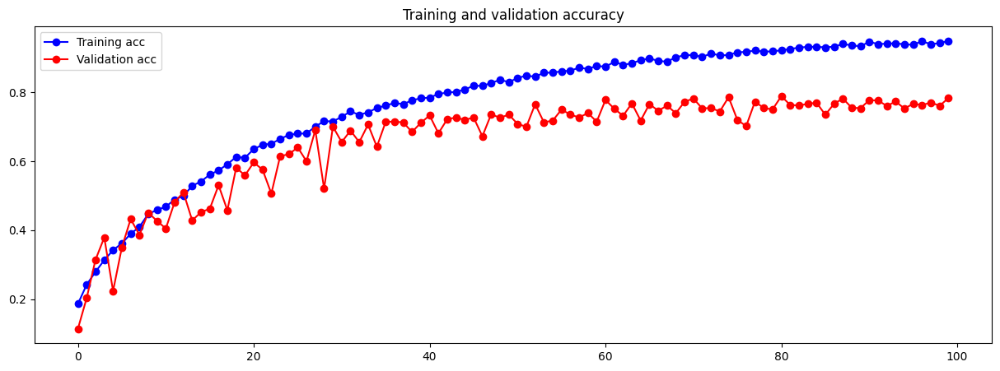

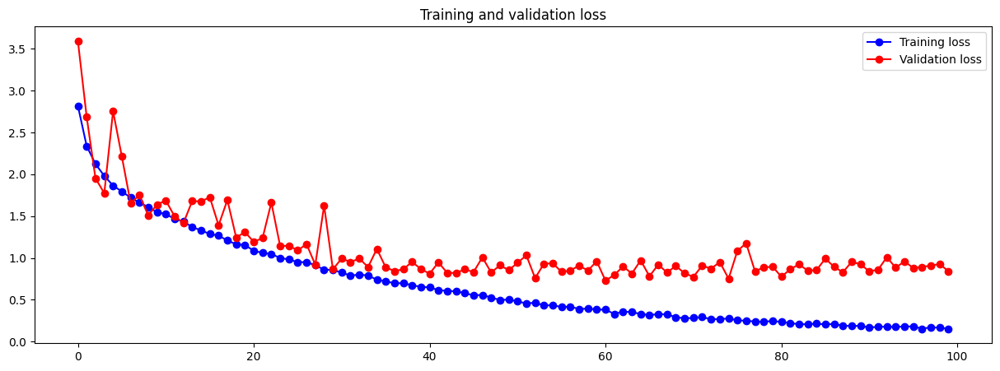

In [96]:
accloss(adamlr6)

In [98]:
adamlr6_model.save('food_model_one_adamlr6.h5')

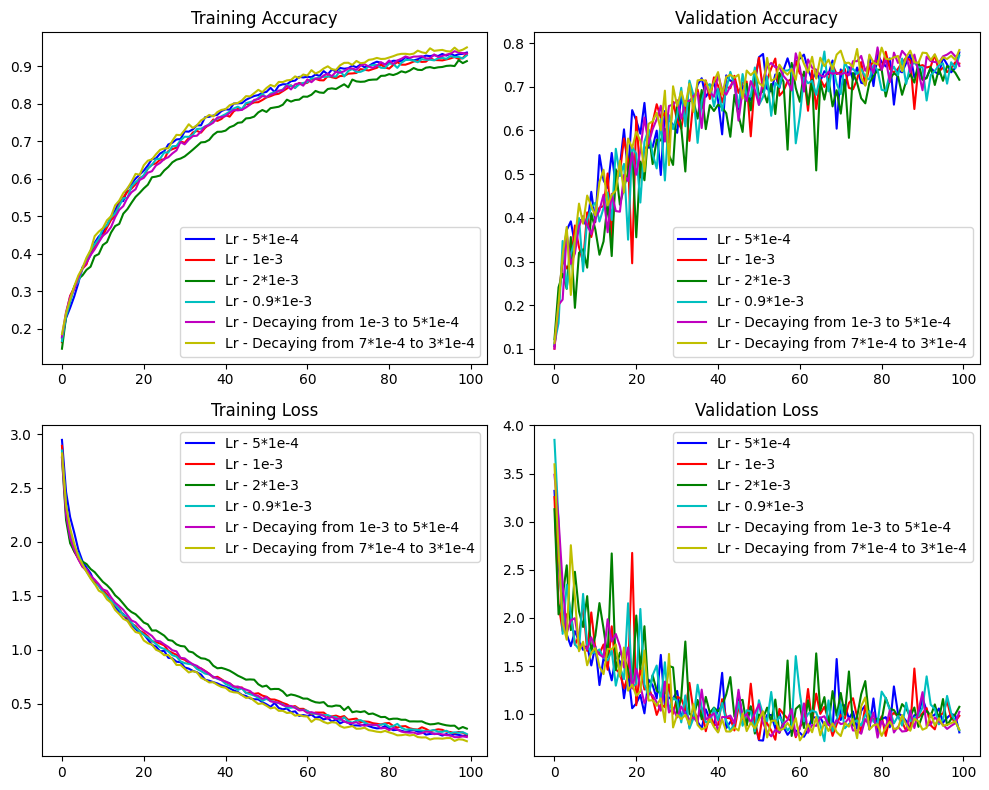

In [148]:
adamlr1_acc = adamlr1.history['acc']
epochs = range(len(adamlr1_acc))

plt.figure(figsize=(10,8))
plt.subplot(2, 2, 1)
plt.plot(epochs, adamlr1.history['acc'],'b',label='Lr - 5*1e-4')
plt.plot(epochs, adamlr2.history['acc'],'r',label='Lr - 1e-3')
plt.plot(epochs, adamlr3.history['acc'],'g',label='Lr - 2*1e-3')
plt.plot(epochs, adamlr4.history['acc'],'c',label='Lr - 0.9*1e-3')
plt.plot(epochs, adamlr5.history['acc'],'m',label='Lr - Decaying from 1e-3 to 5*1e-4')
plt.plot(epochs, adamlr6.history['acc'],'y',label='Lr - Decaying from 7*1e-4 to 3*1e-4')
plt.title('Training Accuracy')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(epochs, adamlr1.history['val_acc'],'b',label='Lr - 5*1e-4')
plt.plot(epochs, adamlr2.history['val_acc'],'r',label='Lr - 1e-3')
plt.plot(epochs, adamlr3.history['val_acc'],'g',label='Lr - 2*1e-3')
plt.plot(epochs, adamlr4.history['val_acc'],'c',label='Lr - 0.9*1e-3')
plt.plot(epochs, adamlr5.history['val_acc'],'m',label='Lr - Decaying from 1e-3 to 5*1e-4')
plt.plot(epochs, adamlr6.history['val_acc'],'y',label='Lr - Decaying from 7*1e-4 to 3*1e-4')
plt.title('Validation Accuracy')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(epochs, adamlr1.history['loss'],'b',label='Lr - 5*1e-4')
plt.plot(epochs, adamlr2.history['loss'],'r',label='Lr - 1e-3')
plt.plot(epochs, adamlr3.history['loss'],'g',label='Lr - 2*1e-3')
plt.plot(epochs, adamlr4.history['loss'],'c',label='Lr - 0.9*1e-3')
plt.plot(epochs, adamlr5.history['loss'],'m',label='Lr - Decaying from 1e-3 to 5*1e-4')
plt.plot(epochs, adamlr6.history['loss'],'y',label='Lr - Decaying from 7*1e-4 to 3*1e-4')
plt.title('Training Loss')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(epochs, adamlr1.history['val_loss'],'b',label='Lr - 5*1e-4')
plt.plot(epochs, adamlr2.history['val_loss'],'r',label='Lr - 1e-3')
plt.plot(epochs, adamlr3.history['val_loss'],'g',label='Lr - 2*1e-3')
plt.plot(epochs, adamlr4.history['val_loss'],'c',label='Lr - 0.9*1e-3')
plt.plot(epochs, adamlr5.history['val_loss'],'m',label='Lr - Decaying from 1e-3 to 5*1e-4')
plt.plot(epochs, adamlr6.history['val_loss'],'y',label='Lr - Decaying from 7*1e-4 to 3*1e-4')
plt.title('Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

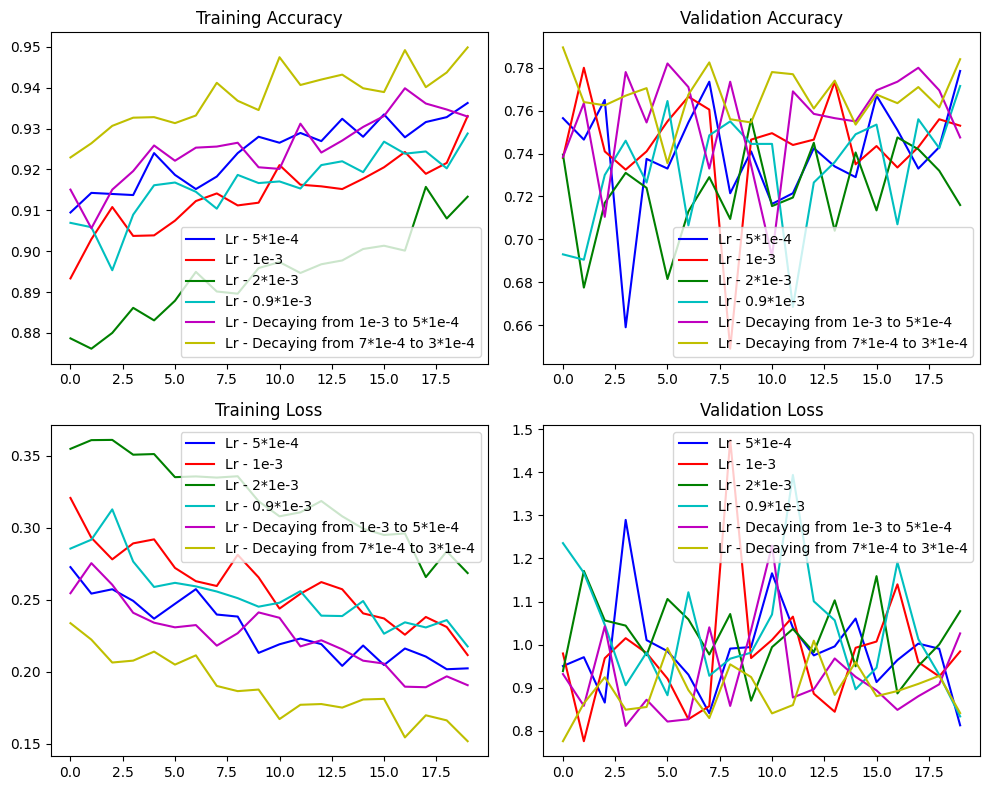

In [150]:
adamlr1_acc = adamlr1.history['acc'][-n:]
#epochs = range(len(adamlr1_acc))
n = 20

epochs = range(len(adamlr1_acc) - n, len(adamlr1_acc))

plt.figure(figsize=(10,8))
plt.subplot(2, 2, 1)
plt.plot(epochs, adamlr1.history['acc'][-n:],'b',label='Lr - 5*1e-4')
plt.plot(epochs, adamlr2.history['acc'][-n:],'r',label='Lr - 1e-3')
plt.plot(epochs, adamlr3.history['acc'][-n:],'g',label='Lr - 2*1e-3')
plt.plot(epochs, adamlr4.history['acc'][-n:],'c',label='Lr - 0.9*1e-3')
plt.plot(epochs, adamlr5.history['acc'][-n:],'m',label='Lr - Decaying from 1e-3 to 5*1e-4')
plt.plot(epochs, adamlr6.history['acc'][-n:],'y',label='Lr - Decaying from 7*1e-4 to 3*1e-4')
plt.title('Training Accuracy')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(epochs, adamlr1.history['val_acc'][-n:],'b',label='Lr - 5*1e-4')
plt.plot(epochs, adamlr2.history['val_acc'][-n:],'r',label='Lr - 1e-3')
plt.plot(epochs, adamlr3.history['val_acc'][-n:],'g',label='Lr - 2*1e-3')
plt.plot(epochs, adamlr4.history['val_acc'][-n:],'c',label='Lr - 0.9*1e-3')
plt.plot(epochs, adamlr5.history['val_acc'][-n:],'m',label='Lr - Decaying from 1e-3 to 5*1e-4')
plt.plot(epochs, adamlr6.history['val_acc'][-n:],'y',label='Lr - Decaying from 7*1e-4 to 3*1e-4')
plt.title('Validation Accuracy')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(epochs, adamlr1.history['loss'][-n:],'b',label='Lr - 5*1e-4')
plt.plot(epochs, adamlr2.history['loss'][-n:],'r',label='Lr - 1e-3')
plt.plot(epochs, adamlr3.history['loss'][-n:],'g',label='Lr - 2*1e-3')
plt.plot(epochs, adamlr4.history['loss'][-n:],'c',label='Lr - 0.9*1e-3')
plt.plot(epochs, adamlr5.history['loss'][-n:],'m',label='Lr - Decaying from 1e-3 to 5*1e-4')
plt.plot(epochs, adamlr6.history['loss'][-n:],'y',label='Lr - Decaying from 7*1e-4 to 3*1e-4')
plt.title('Training Loss')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(epochs, adamlr1.history['val_loss'][-n:],'b',label='Lr - 5*1e-4')
plt.plot(epochs, adamlr2.history['val_loss'][-n:],'r',label='Lr - 1e-3')
plt.plot(epochs, adamlr3.history['val_loss'][-n:],'g',label='Lr - 2*1e-3')
plt.plot(epochs, adamlr4.history['val_loss'][-n:],'c',label='Lr - 0.9*1e-3')
plt.plot(epochs, adamlr5.history['val_loss'][-n:],'m',label='Lr - Decaying from 1e-3 to 5*1e-4')
plt.plot(epochs, adamlr6.history['val_loss'][-n:],'y',label='Lr - Decaying from 7*1e-4 to 3*1e-4')
plt.title('Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

<b>Batch Size<b>

In [108]:
img_size = 150
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=64,
    class_mode='categorical'  
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_size, img_size),
    batch_size=64,
    class_mode='categorical'  
)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [111]:
# Build the Model
bs1_model = models.Sequential()

# input layer
bs1_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
bs1_model.add(layers.BatchNormalization())
bs1_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
bs1_model.add(layers.BatchNormalization())
bs1_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
bs1_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
bs1_model.add(layers.BatchNormalization())
bs1_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
bs1_model.add(layers.BatchNormalization())
bs1_model.add(layers.MaxPooling2D((2, 2)))

bs1_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
bs1_model.add(layers.BatchNormalization())
bs1_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
bs1_model.add(layers.BatchNormalization())
bs1_model.add(layers.MaxPooling2D((2, 2)))

bs1_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
bs1_model.add(layers.BatchNormalization())
bs1_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
bs1_model.add(layers.BatchNormalization())
bs1_model.add(layers.MaxPooling2D((2, 2)))
# flatten
bs1_model.add(layers.Flatten())
# dense layer
bs1_model.add(layers.Dense(256, activation='relu'))
bs1_model.add(layers.BatchNormalization())
bs1_model.add(layers.Dropout(0.5))
bs1_model.add(layers.Dense(256, activation='relu'))
bs1_model.add(layers.BatchNormalization())
bs1_model.add(layers.Dropout(0.5))
# output layer
bs1_model.add(layers.Dense(10, activation='softmax'))

bs1_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

bs1_model.summary()

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_232 (Conv2D)         (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_290 (Ba  (None, 148, 148, 64)     256       
 tchNormalization)                                               
                                                                 
 conv2d_233 (Conv2D)         (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_291 (Ba  (None, 146, 146, 64)     256       
 tchNormalization)                                               
                                                                 
 max_pooling2d_116 (MaxPooli  (None, 73, 73, 64)       0         
 ng2D)                                                           
                                                     

In [110]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
bs1 = bs1_model.fit(
      train_generator,
      steps_per_epoch=7500/64, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/64,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
117/117 [==============================] - 47s 356ms/step - loss: 2.9584 - acc: 0.1719 - val_loss: 4.6488 - val_acc: 0.1000 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
117/117 [==============================] - 41s 346ms/step - loss: 2.4185 - acc: 0.2373 - val_loss: 3.8316 - val_acc: 0.1165 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
117/117 [==============================] - 41s 349ms/step - loss: 2.1900 - acc: 0.2725 - val_loss: 2.9598 - val_acc: 0.1630 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
117/117 [==============================] - 43s 367ms/step - loss: 2.0745 - acc: 0.2979 - val_loss: 2.2366 - val_acc: 0.2740 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00067096392


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
117/117 [==============================] - 44s 372ms/step - loss: 0.7605 - acc: 0.7476 - val_loss: 1.3110 - val_acc: 0.5795 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
117/117 [==============================] - 41s 352ms/step - loss: 0.7239 - acc: 0.7560 - val_loss: 1.1446 - val_acc: 0.6245 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
117/117 [==============================] - 41s 349ms/step - loss: 0.7128 - acc: 0.7669 - val_loss: 1.1254 - val_acc: 0.6360 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
117/117 [==============================] - 41s 347ms/step - loss: 0.7041 - acc: 0.7625 - val_loss: 1.0454 - val_acc: 0.6695 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
117/117 [==============================] - 40s 341ms/step - loss: 0.2674 - acc: 0.9101 - val_loss: 0.8809 - val_acc: 0.7565 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
117/117 [==============================] - 41s 347ms/step - loss: 0.2772 - acc: 0.9079 - val_loss: 0.9185 - val_acc: 0.7490 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
117/117 [==============================] - 40s 343ms/step - loss: 0.2616 - acc: 0.9139 - val_loss: 0.8947 - val_acc: 0.7575 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
117/117 [==============================] - 40s 344ms/step - loss: 0.2606 - acc: 0.9148 - val_loss: 1.1103 - val_acc: 0.7150 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

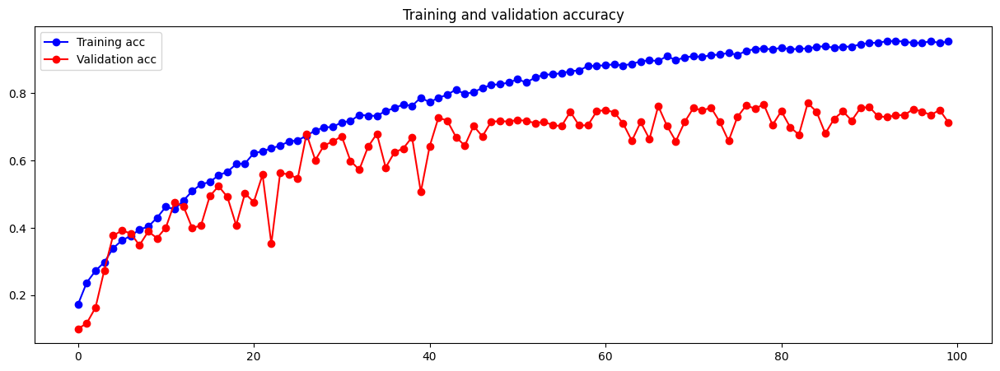

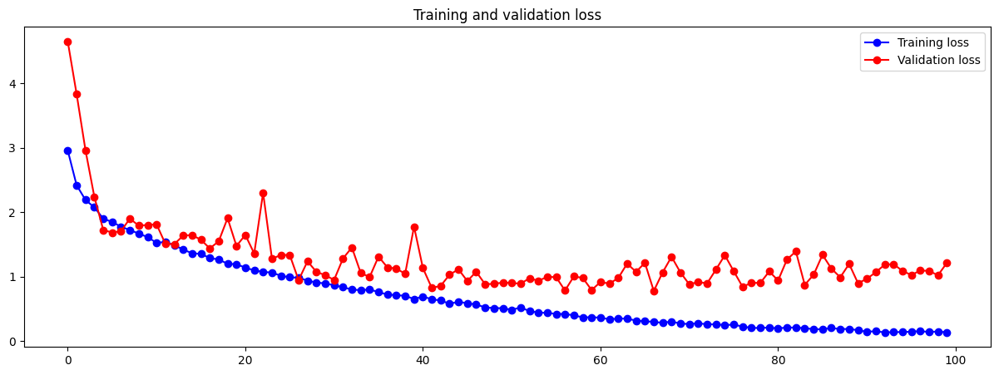

In [112]:
accloss(bs1)

In [113]:
bs1_model.save('food_model_one_bs1.h5')

In [131]:
img_size = 150
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=16,
    class_mode='categorical'  
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_size, img_size),
    batch_size=16,
    class_mode='categorical'  
)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [132]:
# Build the Model
bs2_model = models.Sequential()

# input layer
bs2_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
bs2_model.add(layers.BatchNormalization())
bs2_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
bs2_model.add(layers.BatchNormalization())
bs2_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
bs2_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
bs2_model.add(layers.BatchNormalization())
bs2_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
bs2_model.add(layers.BatchNormalization())
bs2_model.add(layers.MaxPooling2D((2, 2)))

bs2_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
bs2_model.add(layers.BatchNormalization())
bs2_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
bs2_model.add(layers.BatchNormalization())
bs2_model.add(layers.MaxPooling2D((2, 2)))

bs2_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
bs2_model.add(layers.BatchNormalization())
bs2_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
bs2_model.add(layers.BatchNormalization())
bs2_model.add(layers.MaxPooling2D((2, 2)))
# flatten
bs2_model.add(layers.Flatten())
# dense layer
bs2_model.add(layers.Dense(256, activation='relu'))
bs2_model.add(layers.BatchNormalization())
bs2_model.add(layers.Dropout(0.5))
bs2_model.add(layers.Dense(256, activation='relu'))
bs2_model.add(layers.BatchNormalization())
bs2_model.add(layers.Dropout(0.5))
# output layer
bs2_model.add(layers.Dense(10, activation='softmax'))

bs2_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

bs2_model.summary()

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_280 (Conv2D)         (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_350 (Ba  (None, 148, 148, 64)     256       
 tchNormalization)                                               
                                                                 
 conv2d_281 (Conv2D)         (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_351 (Ba  (None, 146, 146, 64)     256       
 tchNormalization)                                               
                                                                 
 max_pooling2d_140 (MaxPooli  (None, 73, 73, 64)       0         
 ng2D)                                                           
                                                     

In [133]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
bs2 = bs2_model.fit(
      train_generator,
      steps_per_epoch=7500/16, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/16,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
468/468 [==============================] - 42s 87ms/step - loss: 2.8629 - acc: 0.1615 - val_loss: 2.2742 - val_acc: 0.2365 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
468/468 [==============================] - 41s 87ms/step - loss: 2.3358 - acc: 0.2196 - val_loss: 1.9669 - val_acc: 0.2860 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
468/468 [==============================] - 41s 87ms/step - loss: 2.1004 - acc: 0.2611 - val_loss: 1.8336 - val_acc: 0.3330 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
468/468 [==============================] - 41s 87ms/step - loss: 1.9730 - acc: 0.2920 - val_loss: 2.1224 - val_acc: 0.2920 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.000670963922677

Epoch 36/100
468/468 [==============================] - 41s 86ms/step - loss: 0.8484 - acc: 0.7164 - val_loss: 0.8664 - val_acc: 0.6995 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
468/468 [==============================] - 41s 87ms/step - loss: 0.8198 - acc: 0.7315 - val_loss: 0.9899 - val_acc: 0.6815 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
468/468 [==============================] - 41s 87ms/step - loss: 0.8090 - acc: 0.7319 - val_loss: 1.0298 - val_acc: 0.6620 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
468/468 [==============================] - 42s 88ms/step - loss: 0.7682 - acc: 0.7465 - val_loss: 1.0074 - val_acc: 0.6590 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.000498778132609514.
Epoch 40/100
468/468 [==============================] - 41s 87ms/

Epoch 71/100
468/468 [==============================] - 41s 87ms/step - loss: 0.4330 - acc: 0.8539 - val_loss: 0.8342 - val_acc: 0.7515 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
468/468 [==============================] - 41s 88ms/step - loss: 0.4023 - acc: 0.8651 - val_loss: 0.8172 - val_acc: 0.7660 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
468/468 [==============================] - 41s 88ms/step - loss: 0.4143 - acc: 0.8643 - val_loss: 0.7331 - val_acc: 0.7885 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
468/468 [==============================] - 42s 89ms/step - loss: 0.3623 - acc: 0.8800 - val_loss: 0.9154 - val_acc: 0.7285 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0.0003707793268458013.
Epoch 75/100
468/468 [==============================] - 40s 86ms

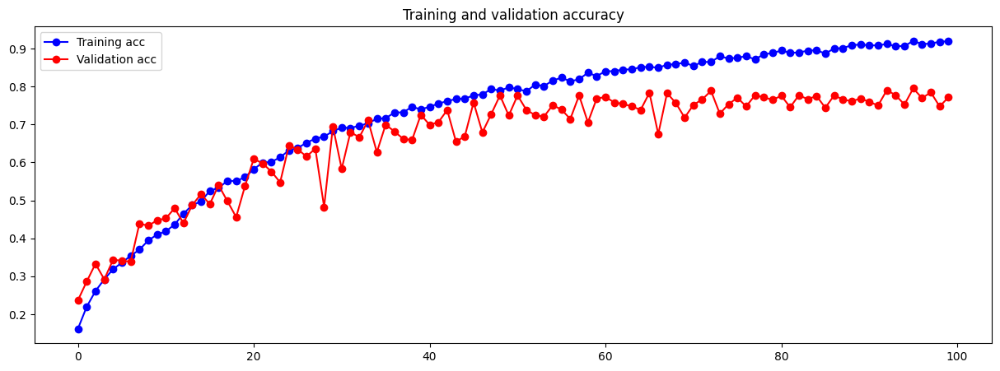

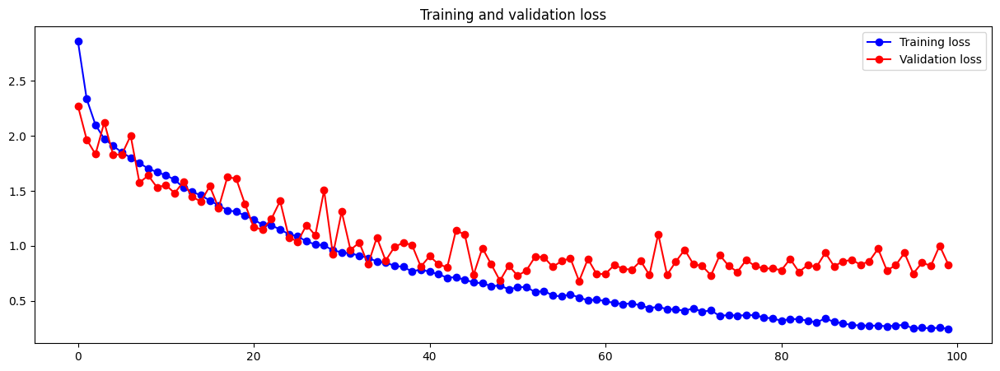

In [134]:
accloss(bs2)

In [135]:
bs2_model.save('food_model_one_bs2.h5')

In [136]:
img_size = 150
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=100,
    class_mode='categorical'  
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_size, img_size),
    batch_size=100,
    class_mode='categorical'  
)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [137]:
# Build the Model
bs3_model = models.Sequential()

# input layer
bs3_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
bs3_model.add(layers.BatchNormalization())
bs3_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
bs3_model.add(layers.BatchNormalization())
bs3_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
bs3_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
bs3_model.add(layers.BatchNormalization())
bs3_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
bs3_model.add(layers.BatchNormalization())
bs3_model.add(layers.MaxPooling2D((2, 2)))

bs3_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
bs3_model.add(layers.BatchNormalization())
bs3_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
bs3_model.add(layers.BatchNormalization())
bs3_model.add(layers.MaxPooling2D((2, 2)))

bs3_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
bs3_model.add(layers.BatchNormalization())
bs3_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
bs3_model.add(layers.BatchNormalization())
bs3_model.add(layers.MaxPooling2D((2, 2)))
# flatten
bs3_model.add(layers.Flatten())
# dense layer
bs3_model.add(layers.Dense(256, activation='relu'))
bs3_model.add(layers.BatchNormalization())
bs3_model.add(layers.Dropout(0.5))
bs3_model.add(layers.Dense(256, activation='relu'))
bs3_model.add(layers.BatchNormalization())
bs3_model.add(layers.Dropout(0.5))
# output layer
bs3_model.add(layers.Dense(10, activation='softmax'))

bs3_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

bs3_model.summary()

Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_288 (Conv2D)         (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_360 (Ba  (None, 148, 148, 64)     256       
 tchNormalization)                                               
                                                                 
 conv2d_289 (Conv2D)         (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_361 (Ba  (None, 146, 146, 64)     256       
 tchNormalization)                                               
                                                                 
 max_pooling2d_144 (MaxPooli  (None, 73, 73, 64)       0         
 ng2D)                                                           
                                                     

In [138]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
bs3 = bs3_model.fit(
      train_generator,
      steps_per_epoch=7500/100, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/100,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
75/75 [==============================] - 41s 526ms/step - loss: 2.9217 - acc: 0.1769 - val_loss: 2.8968 - val_acc: 0.1000 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
75/75 [==============================] - 39s 522ms/step - loss: 2.3847 - acc: 0.2499 - val_loss: 3.1935 - val_acc: 0.1300 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
75/75 [==============================] - 39s 517ms/step - loss: 2.1849 - acc: 0.2776 - val_loss: 4.4294 - val_acc: 0.1160 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
75/75 [==============================] - 39s 519ms/step - loss: 2.0540 - acc: 0.3076 - val_loss: 3.5003 - val_acc: 0.1675 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0006709639226775229

Epoch 36/100
75/75 [==============================] - 39s 522ms/step - loss: 0.7537 - acc: 0.7532 - val_loss: 1.1237 - val_acc: 0.6475 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
75/75 [==============================] - 39s 518ms/step - loss: 0.7364 - acc: 0.7565 - val_loss: 1.2555 - val_acc: 0.6340 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
75/75 [==============================] - 40s 529ms/step - loss: 0.7231 - acc: 0.7639 - val_loss: 1.0937 - val_acc: 0.6335 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
75/75 [==============================] - 39s 516ms/step - loss: 0.6911 - acc: 0.7700 - val_loss: 0.9532 - val_acc: 0.6865 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.000498778132609514.
Epoch 40/100
75/75 [==============================] - 39s 519ms/step 

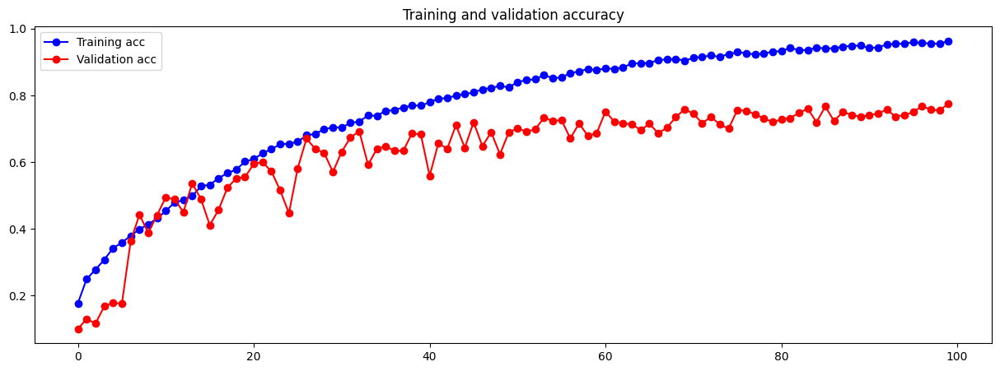

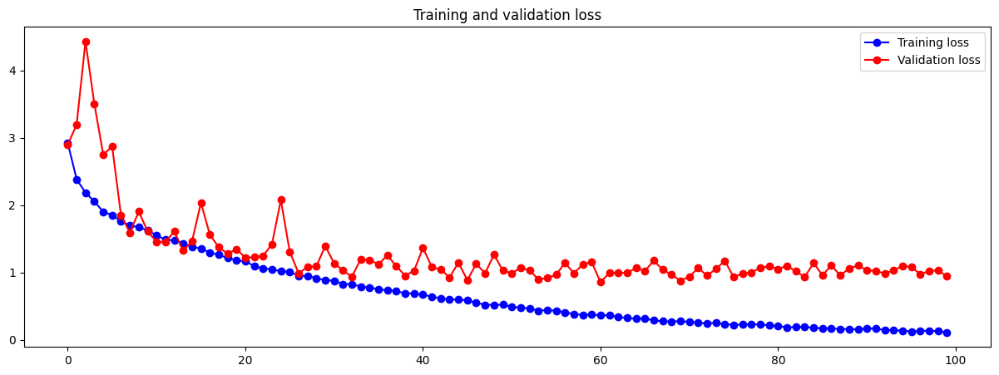

In [139]:
accloss(bs3)

In [140]:
bs3_model.save('food_model_one_bs3.h5')

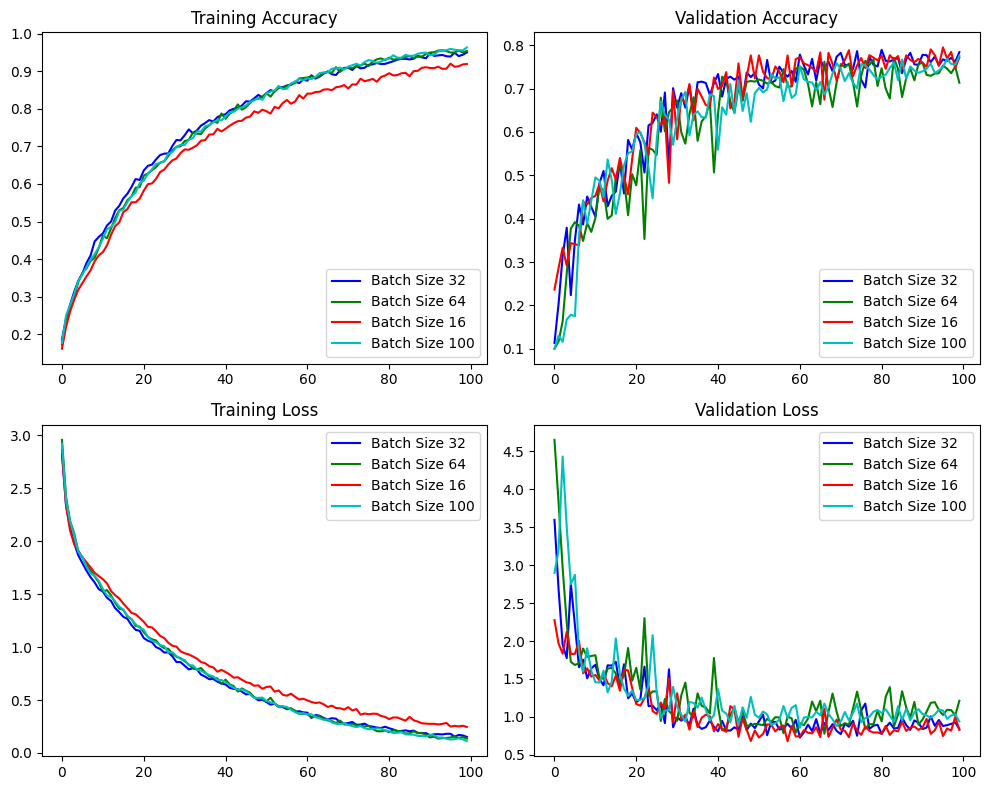

In [147]:
adamlr1_acc = adamlr1.history['acc']
epochs = range(len(adamlr1_acc))

plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.plot(epochs, adamlr6.history['acc'],'b',label='Batch Size 32')
plt.plot(epochs, bs1.history['acc'],'g',label='Batch Size 64')
plt.plot(epochs, bs2.history['acc'],'r',label='Batch Size 16')
plt.plot(epochs, bs3.history['acc'],'c',label='Batch Size 100')
plt.title('Training Accuracy')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(epochs, adamlr6.history['val_acc'],'b',label='Batch Size 32')
plt.plot(epochs, bs1.history['val_acc'],'g',label='Batch Size 64')
plt.plot(epochs, bs2.history['val_acc'],'r',label='Batch Size 16')
plt.plot(epochs, bs3.history['val_acc'],'c',label='Batch Size 100')
plt.title('Validation Accuracy')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(epochs, adamlr6.history['loss'],'b',label='Batch Size 32')
plt.plot(epochs, bs1.history['loss'],'g',label='Batch Size 64')
plt.plot(epochs, bs2.history['loss'],'r',label='Batch Size 16')
plt.plot(epochs, bs3.history['loss'],'c',label='Batch Size 100')
plt.title('Training Loss')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(epochs, adamlr6.history['val_loss'],'b',label='Batch Size 32')
plt.plot(epochs, bs1.history['val_loss'],'g',label='Batch Size 64')
plt.plot(epochs, bs2.history['val_loss'],'r',label='Batch Size 16')
plt.plot(epochs, bs3.history['val_loss'],'c',label='Batch Size 100')
plt.title('Validation Loss')
plt.legend()


# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

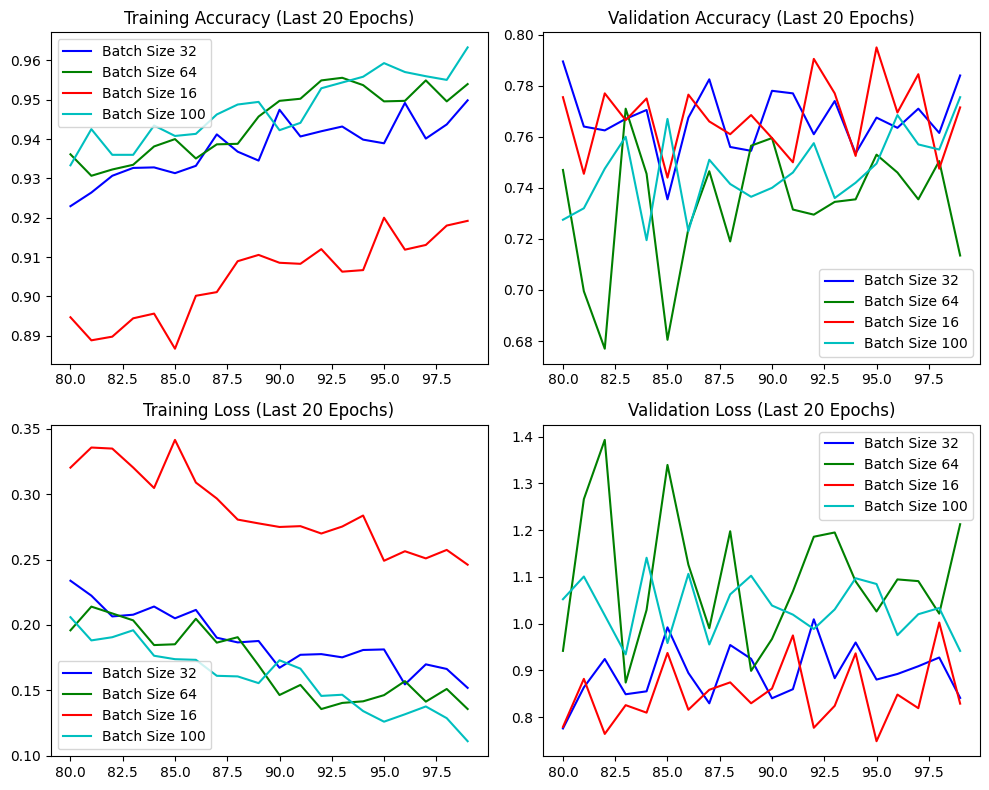

In [146]:
adamlr1_acc = adamlr1.history['acc']
epochs = range(len(adamlr1_acc))

# Define the number of epochs to plot (last 20 epochs)
num_epochs_to_plot = 20

# Update epochs to only include the last 20 epochs
epochs_to_plot = range(len(adamlr1_acc) - num_epochs_to_plot, len(adamlr1_acc))

# Create a subplot structure with a 2x2 format
plt.figure(figsize=(10, 8))

# Plot Training Accuracy (Last 20 Epochs)
plt.subplot(2, 2, 1)
plt.plot(epochs_to_plot, adamlr6.history['acc'][-num_epochs_to_plot:], 'b', label='Batch Size 32')
plt.plot(epochs_to_plot, bs1.history['acc'][-num_epochs_to_plot:], 'g', label='Batch Size 64')
plt.plot(epochs_to_plot, bs2.history['acc'][-num_epochs_to_plot:], 'r', label='Batch Size 16')
plt.plot(epochs_to_plot, bs3.history['acc'][-num_epochs_to_plot:], 'c', label='Batch Size 100')
plt.title('Training Accuracy (Last 20 Epochs)')
plt.legend()

# Plot Validation Accuracy (Last 20 Epochs)
plt.subplot(2, 2, 2)
plt.plot(epochs_to_plot, adamlr6.history['val_acc'][-num_epochs_to_plot:], 'b', label='Batch Size 32')
plt.plot(epochs_to_plot, bs1.history['val_acc'][-num_epochs_to_plot:], 'g', label='Batch Size 64')
plt.plot(epochs_to_plot, bs2.history['val_acc'][-num_epochs_to_plot:], 'r', label='Batch Size 16')
plt.plot(epochs_to_plot, bs3.history['val_acc'][-num_epochs_to_plot:], 'c', label='Batch Size 100')
plt.title('Validation Accuracy (Last 20 Epochs)')
plt.legend()

# Plot Training Loss (Last 20 Epochs)
plt.subplot(2, 2, 3)
plt.plot(epochs_to_plot, adamlr6.history['loss'][-num_epochs_to_plot:], 'b', label='Batch Size 32')
plt.plot(epochs_to_plot, bs1.history['loss'][-num_epochs_to_plot:], 'g', label='Batch Size 64')
plt.plot(epochs_to_plot, bs2.history['loss'][-num_epochs_to_plot:], 'r', label='Batch Size 16')
plt.plot(epochs_to_plot, bs3.history['loss'][-num_epochs_to_plot:], 'c', label='Batch Size 100')
plt.title('Training Loss (Last 20 Epochs)')
plt.legend()

# Plot Validation Loss (Last 20 Epochs)
plt.subplot(2, 2, 4)
plt.plot(epochs_to_plot, adamlr6.history['val_loss'][-num_epochs_to_plot:], 'b', label='Batch Size 32')
plt.plot(epochs_to_plot, bs1.history['val_loss'][-num_epochs_to_plot:], 'g', label='Batch Size 64')
plt.plot(epochs_to_plot, bs2.history['val_loss'][-num_epochs_to_plot:], 'r', label='Batch Size 16')
plt.plot(epochs_to_plot, bs3.history['val_loss'][-num_epochs_to_plot:], 'c', label='Batch Size 100')
plt.title('Validation Loss (Last 20 Epochs)')
plt.legend()

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()


<b>Tuning Data Augmentation<b>

In [78]:
param_grid = {
    'rotation_range': [20, 40, 60],
    'width_shift_range': [0.1, 0.2, 0.3],
    'height_shift_range': [0.1, 0.2, 0.3],
    'shear_range': [0.1, 0.2, 0.3],
    'zoom_range': [0.1, 0.2, 0.3],
    'horizontal_flip': [True, False]
}

num_combinations = 1
for key in param_grid:
    num_combinations *= len(param_grid[key])

print("Total number of combinations:", num_combinations)

Total number of combinations: 486


In [83]:
param_grid = {
    'shear_range': [0.3, 0.35],
    'zoom_range': [0.3, 0.35]
}

num_combinations = 1
for key in param_grid:
    num_combinations *= len(param_grid[key])

print("Total number of combinations:", num_combinations)

Total number of combinations: 4


In [84]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

In [85]:
from itertools import product

results = []
best_val_acc = 0 
best_params = None 

for params in product(*[param_grid[key] for key in param_grid]):
    # set the ImageDataGenerator parameters based on params
    train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=params[0],
        zoom_range=params[1],
        horizontal_flip=True
    )
    
    test_datagen = ImageDataGenerator(rescale=1./255)

    train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_size, img_size),
        batch_size=32,
        class_mode='categorical'  
    )

    validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=32,
        class_mode='categorical'  
    )
    
    
    model = models.Sequential()

    # input layer
    model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    # hidden layers
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(256, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(256, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(512, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(512, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))
    # flatten
    model.add(layers.Flatten())
    # dense layer
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))
    # output layer
    model.add(layers.Dense(10, activation='softmax'))

    model.compile(loss='categorical_crossentropy',
                  optimizer=optimizers.Adam(learning_rate=7*1e-4),
                  metrics=['acc'])


    lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
    train_generator.reset();
    validation_generator.reset();
    # train the Model
    history = model.fit(
          train_generator,
          steps_per_epoch=7500/32, 
          epochs=100,
          validation_data=validation_generator,
          validation_steps=2000/32,
          callbacks=[lr_decay_callback]) 
    
    # get the best metrics during training
    max_val_acc = max(history.history['val_acc'])
    min_val_loss = min(history.history['val_loss'])
    
    # store the best metrics and parameters used
    results.append((params, {
        'best_acc': max(history.history['acc']),
        'best_val_acc': max_val_acc,
        'best_loss': min(history.history['loss']),
        'best_val_loss': min_val_loss
    }))
    
    # check if the current model's validation accuracy is better than the previous best
    if max_val_acc > best_val_acc:
        best_val_acc = max_val_acc
        best_params = params
        
# printing of best param combi and best val_acc
print(f"Best Validation Accuracy: {best_val_acc}")
print(f"Best Parameters: {best_params}")

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.

Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 41s 168ms/step - loss: 2.9143 - acc: 0.1584 - val_loss: 2.8784 - val_acc: 0.1265 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 39s 166ms/step - loss: 2.3541 - acc: 0.2307 - val_loss: 3.0501 - val_acc: 0.1890 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 39s 167ms/step - loss: 2.1418 - acc: 0.2704 - val_loss: 1.9190 - val_acc: 0.3170 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 39s 167ms/step - loss: 1.9831 - acc: 0.3025 - val_loss: 1.8272 - val_acc: 0.3610 -

Epoch 70/100
234/234 [==============================] - 41s 173ms/step - loss: 0.3563 - acc: 0.8832 - val_loss: 0.7009 - val_acc: 0.7865 - lr: 3.8682e-04

Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 41s 174ms/step - loss: 0.3360 - acc: 0.8883 - val_loss: 0.8162 - val_acc: 0.7635 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 39s 167ms/step - loss: 0.3343 - acc: 0.8876 - val_loss: 0.7989 - val_acc: 0.7715 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 39s 167ms/step - loss: 0.3184 - acc: 0.8937 - val_loss: 0.8912 - val_acc: 0.7545 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 39s


Epoch 5: LearningRateScheduler setting learning rate to 0.0006709639226775229.
Epoch 5/100
234/234 [==============================] - 39s 165ms/step - loss: 1.9182 - acc: 0.3256 - val_loss: 1.6985 - val_acc: 0.3645 - lr: 6.7096e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.000665302852375163.
Epoch 6/100
234/234 [==============================] - 39s 164ms/step - loss: 1.8547 - acc: 0.3369 - val_loss: 1.7128 - val_acc: 0.3820 - lr: 6.6530e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0006596895713779939.
Epoch 7/100
234/234 [==============================] - 39s 166ms/step - loss: 1.7864 - acc: 0.3656 - val_loss: 1.7550 - val_acc: 0.3935 - lr: 6.5969e-04

Epoch 8: LearningRateScheduler setting learning rate to 0.0006541236756701508.
Epoch 8/100
234/234 [==============================] - 39s 165ms/step - loss: 1.7211 - acc: 0.3845 - val_loss: 1.6909 - val_acc: 0.4130 - lr: 6.5412e-04

Epoch 9: LearningRateScheduler setting learning rate to 0.0006486047


Epoch 40: LearningRateScheduler setting learning rate to 0.000498778132609514.
Epoch 40/100
234/234 [==============================] - 38s 164ms/step - loss: 0.7402 - acc: 0.7528 - val_loss: 1.0879 - val_acc: 0.6530 - lr: 4.9878e-04

Epoch 41: LearningRateScheduler setting learning rate to 0.0004945698456416501.
Epoch 41/100
234/234 [==============================] - 40s 172ms/step - loss: 0.7185 - acc: 0.7608 - val_loss: 0.9442 - val_acc: 0.6910 - lr: 4.9457e-04

Epoch 42: LearningRateScheduler setting learning rate to 0.0004903970543533663.
Epoch 42/100
234/234 [==============================] - 39s 166ms/step - loss: 0.7222 - acc: 0.7599 - val_loss: 0.7114 - val_acc: 0.7665 - lr: 4.9040e-04

Epoch 43: LearningRateScheduler setting learning rate to 0.000486259470161902.
Epoch 43/100
234/234 [==============================] - 39s 165ms/step - loss: 0.6977 - acc: 0.7703 - val_loss: 0.8318 - val_acc: 0.7275 - lr: 4.8626e-04

Epoch 44: LearningRateScheduler setting learning rate to 0.00


Epoch 75: LearningRateScheduler setting learning rate to 0.0003707793268458013.
Epoch 75/100
234/234 [==============================] - 40s 169ms/step - loss: 0.3390 - acc: 0.8876 - val_loss: 0.8303 - val_acc: 0.7610 - lr: 3.7078e-04

Epoch 76: LearningRateScheduler setting learning rate to 0.00036765100314373607.
Epoch 76/100
234/234 [==============================] - 39s 165ms/step - loss: 0.3380 - acc: 0.8904 - val_loss: 0.8329 - val_acc: 0.7610 - lr: 3.6765e-04

Epoch 77: LearningRateScheduler setting learning rate to 0.00036454905590600935.
Epoch 77/100
234/234 [==============================] - 39s 164ms/step - loss: 0.3176 - acc: 0.8937 - val_loss: 0.7652 - val_acc: 0.7800 - lr: 3.6455e-04

Epoch 78: LearningRateScheduler setting learning rate to 0.0003614732831246886.
Epoch 78/100
234/234 [==============================] - 39s 166ms/step - loss: 0.3220 - acc: 0.8923 - val_loss: 0.7265 - val_acc: 0.7750 - lr: 3.6147e-04

Epoch 79: LearningRateScheduler setting learning rate to 

Epoch 44/100
234/234 [==============================] - 39s 164ms/step - loss: 0.6569 - acc: 0.7772 - val_loss: 0.7374 - val_acc: 0.7445 - lr: 4.8216e-04

Epoch 45: LearningRateScheduler setting learning rate to 0.00047808876873838853.
Epoch 45/100
234/234 [==============================] - 39s 165ms/step - loss: 0.6346 - acc: 0.7903 - val_loss: 0.8805 - val_acc: 0.7190 - lr: 4.7809e-04

Epoch 46: LearningRateScheduler setting learning rate to 0.00047405504548254164.
Epoch 46/100
234/234 [==============================] - 39s 167ms/step - loss: 0.6251 - acc: 0.7992 - val_loss: 1.0286 - val_acc: 0.6815 - lr: 4.7406e-04

Epoch 47: LearningRateScheduler setting learning rate to 0.00047005534613419486.
Epoch 47/100
234/234 [==============================] - 39s 166ms/step - loss: 0.5794 - acc: 0.8105 - val_loss: 0.7850 - val_acc: 0.7545 - lr: 4.7006e-04

Epoch 48: LearningRateScheduler setting learning rate to 0.0004660894109688635.
Epoch 48/100
234/234 [==============================] - 3

Epoch 79/100
234/234 [==============================] - 39s 167ms/step - loss: 0.2654 - acc: 0.9108 - val_loss: 0.7631 - val_acc: 0.7810 - lr: 3.5842e-04

Epoch 80: LearningRateScheduler setting learning rate to 0.0003553993663247063.
Epoch 80/100
234/234 [==============================] - 39s 167ms/step - loss: 0.2719 - acc: 0.9063 - val_loss: 0.7994 - val_acc: 0.7720 - lr: 3.5540e-04

Epoch 81: LearningRateScheduler setting learning rate to 0.00035240078943190364.
Epoch 81/100
234/234 [==============================] - 39s 164ms/step - loss: 0.2770 - acc: 0.9064 - val_loss: 0.8894 - val_acc: 0.7450 - lr: 3.5240e-04

Epoch 82: LearningRateScheduler setting learning rate to 0.0003494275212472244.
Epoch 82/100
234/234 [==============================] - 39s 166ms/step - loss: 0.2794 - acc: 0.9075 - val_loss: 0.9273 - val_acc: 0.7450 - lr: 3.4943e-04

Epoch 83: LearningRateScheduler setting learning rate to 0.00034647933090446004.
Epoch 83/100
234/234 [==============================] - 39


Epoch 14: LearningRateScheduler setting learning rate to 0.0006217005944608306.
Epoch 14/100
234/234 [==============================] - 40s 168ms/step - loss: 1.4593 - acc: 0.4915 - val_loss: 1.3225 - val_acc: 0.5490 - lr: 6.2170e-04

Epoch 15: LearningRateScheduler setting learning rate to 0.0006164551987671489.
Epoch 15/100
234/234 [==============================] - 39s 166ms/step - loss: 1.4085 - acc: 0.5169 - val_loss: 1.5437 - val_acc: 0.4985 - lr: 6.1646e-04

Epoch 16: LearningRateScheduler setting learning rate to 0.0006112540716689762.
Epoch 16/100
234/234 [==============================] - 39s 167ms/step - loss: 1.3836 - acc: 0.5212 - val_loss: 2.0739 - val_acc: 0.3510 - lr: 6.1125e-04

Epoch 17: LearningRateScheduler setting learning rate to 0.0006060968091504474.
Epoch 17/100
234/234 [==============================] - 39s 168ms/step - loss: 1.3637 - acc: 0.5352 - val_loss: 1.6499 - val_acc: 0.4470 - lr: 6.0610e-04

Epoch 18: LearningRateScheduler setting learning rate to 0.


Epoch 49: LearningRateScheduler setting learning rate to 0.00046215692254551055.
Epoch 49/100
234/234 [==============================] - 42s 180ms/step - loss: 0.6147 - acc: 0.7952 - val_loss: 0.8625 - val_acc: 0.7330 - lr: 4.6216e-04

Epoch 50: LearningRateScheduler setting learning rate to 0.0004582576211396514.
Epoch 50/100
234/234 [==============================] - 40s 172ms/step - loss: 0.5863 - acc: 0.8029 - val_loss: 0.7513 - val_acc: 0.7525 - lr: 4.5826e-04

Epoch 51: LearningRateScheduler setting learning rate to 0.00045439121816852514.
Epoch 51/100
234/234 [==============================] - 40s 169ms/step - loss: 0.5766 - acc: 0.8131 - val_loss: 0.7287 - val_acc: 0.7685 - lr: 4.5439e-04

Epoch 52: LearningRateScheduler setting learning rate to 0.000450557425049371.
Epoch 52/100
234/234 [==============================] - 40s 169ms/step - loss: 0.5948 - acc: 0.8077 - val_loss: 0.7286 - val_acc: 0.7725 - lr: 4.5056e-04

Epoch 53: LearningRateScheduler setting learning rate to 0


Epoch 84: LearningRateScheduler setting learning rate to 0.00034355601639567796.
Epoch 84/100
234/234 [==============================] - 40s 170ms/step - loss: 0.2806 - acc: 0.9041 - val_loss: 0.7874 - val_acc: 0.7725 - lr: 3.4356e-04

Epoch 85: LearningRateScheduler setting learning rate to 0.0003406573757129456.
Epoch 85/100
234/234 [==============================] - 39s 168ms/step - loss: 0.2744 - acc: 0.9100 - val_loss: 0.6987 - val_acc: 0.8025 - lr: 3.4066e-04

Epoch 86: LearningRateScheduler setting learning rate to 0.0003377831779900542.
Epoch 86/100
234/234 [==============================] - 40s 171ms/step - loss: 0.2805 - acc: 0.9088 - val_loss: 0.7927 - val_acc: 0.7725 - lr: 3.3778e-04

Epoch 87: LearningRateScheduler setting learning rate to 0.00033493325007734743.
Epoch 87/100
234/234 [==============================] - 40s 171ms/step - loss: 0.2634 - acc: 0.9133 - val_loss: 0.7718 - val_acc: 0.7875 - lr: 3.3493e-04

Epoch 88: LearningRateScheduler setting learning rate to 

In [5]:
img_size = 150
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.35,
    zoom_range=0.35,
    horizontal_flip=True,)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [33]:
# Build the Model
aug2_model = models.Sequential()

# input layer
aug2_model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
aug2_model.add(layers.BatchNormalization())
aug2_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
aug2_model.add(layers.BatchNormalization())
aug2_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
aug2_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
aug2_model.add(layers.BatchNormalization())
aug2_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
aug2_model.add(layers.BatchNormalization())
aug2_model.add(layers.MaxPooling2D((2, 2)))

aug2_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
aug2_model.add(layers.BatchNormalization())
aug2_model.add(layers.Conv2D(256, (3, 3), activation='relu'))
aug2_model.add(layers.BatchNormalization())
aug2_model.add(layers.MaxPooling2D((2, 2)))

aug2_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
aug2_model.add(layers.BatchNormalization())
aug2_model.add(layers.Conv2D(512, (3, 3), activation='relu'))
aug2_model.add(layers.BatchNormalization())
aug2_model.add(layers.MaxPooling2D((2, 2)))
# flatten
aug2_model.add(layers.Flatten())
# dense layer
aug2_model.add(layers.Dense(256, activation='relu'))
aug2_model.add(layers.BatchNormalization())
aug2_model.add(layers.Dropout(0.5))
aug2_model.add(layers.Dense(256, activation='relu'))
aug2_model.add(layers.BatchNormalization())
aug2_model.add(layers.Dropout(0.5))
# output layer
aug2_model.add(layers.Dense(10, activation='softmax'))

aug2_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

aug2_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_32 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_40 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_33 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_41 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                      

In [34]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
aug2 = aug2_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 43s 176ms/step - loss: 2.9572 - acc: 0.1577 - val_loss: 5.0464 - val_acc: 0.1000 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 40s 170ms/step - loss: 2.4401 - acc: 0.2167 - val_loss: 2.5587 - val_acc: 0.1955 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 40s 170ms/step - loss: 2.1950 - acc: 0.2580 - val_loss: 1.7678 - val_acc: 0.3640 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 39s 167ms/step - loss: 2.0452 - acc: 0.2861 - val_loss: 1.7875 - val_acc: 0.3455 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00067096392


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 39s 167ms/step - loss: 0.8259 - acc: 0.7280 - val_loss: 0.9478 - val_acc: 0.6945 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 39s 167ms/step - loss: 0.8038 - acc: 0.7295 - val_loss: 0.8500 - val_acc: 0.7120 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 39s 167ms/step - loss: 0.7907 - acc: 0.7403 - val_loss: 0.8402 - val_acc: 0.7105 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 39s 168ms/step - loss: 0.7715 - acc: 0.7391 - val_loss: 1.2603 - val_acc: 0.6095 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 40s 169ms/step - loss: 0.3621 - acc: 0.8837 - val_loss: 0.9376 - val_acc: 0.7200 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 39s 167ms/step - loss: 0.3671 - acc: 0.8836 - val_loss: 0.7542 - val_acc: 0.7735 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 40s 169ms/step - loss: 0.3609 - acc: 0.8808 - val_loss: 0.8069 - val_acc: 0.7700 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 39s 165ms/step - loss: 0.3542 - acc: 0.8809 - val_loss: 0.8637 - val_acc: 0.7580 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

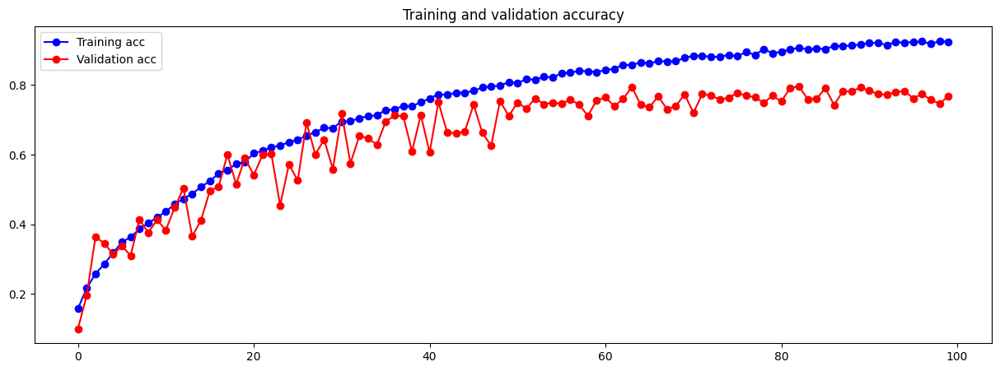

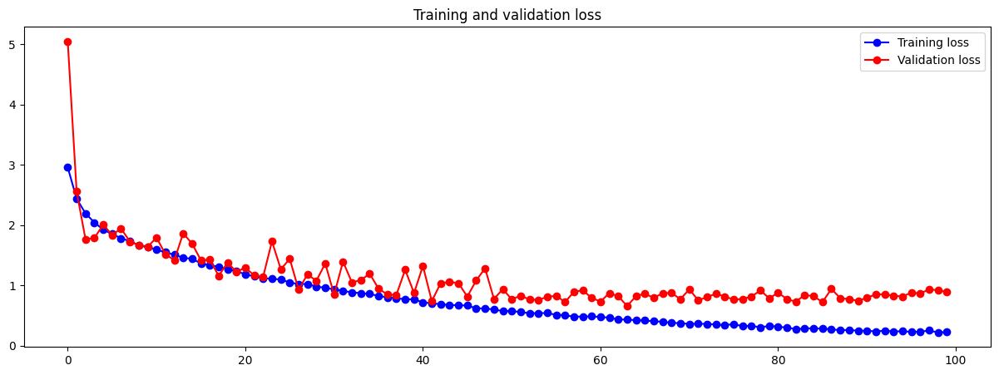

In [35]:
accloss(aug2)

In [36]:
aug2_model.save('food_model_one_aug2.h5')

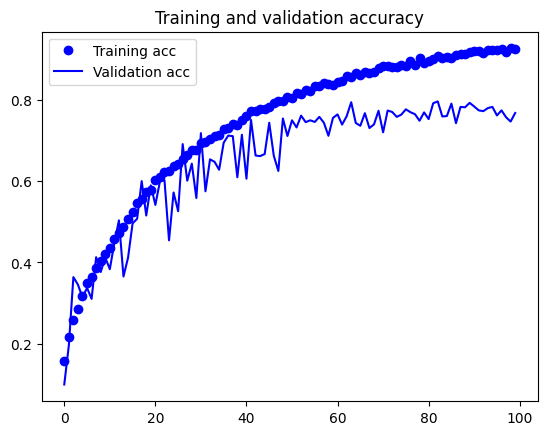

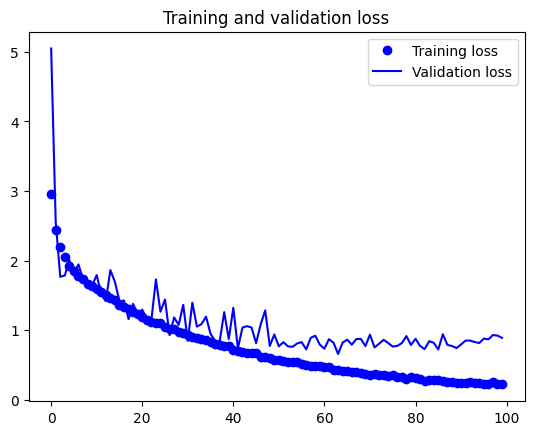

In [37]:
acc = aug2.history['acc']
val_acc = aug2.history['val_acc']
loss = aug2.history['loss']
val_loss = aug2.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

<b>Testing Activation Function<b>

In [6]:
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
af1_model = models.Sequential()

# input layer
af1_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu, input_shape=(img_size, img_size, 3)))
af1_model.add(layers.BatchNormalization())
af1_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu))
af1_model.add(layers.BatchNormalization())
af1_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
af1_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
af1_model.add(layers.BatchNormalization())
af1_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
af1_model.add(layers.BatchNormalization())
af1_model.add(layers.MaxPooling2D((2, 2)))

af1_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
af1_model.add(layers.BatchNormalization())
af1_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
af1_model.add(layers.BatchNormalization())
af1_model.add(layers.MaxPooling2D((2, 2)))

af1_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
af1_model.add(layers.BatchNormalization())
af1_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
af1_model.add(layers.BatchNormalization())
af1_model.add(layers.MaxPooling2D((2, 2)))
# flatten
af1_model.add(layers.Flatten())
# dense layer
af1_model.add(layers.Dense(256, activation=leaky_relu))
af1_model.add(layers.BatchNormalization())
af1_model.add(layers.Dropout(0.5))
af1_model.add(layers.Dense(256, activation=leaky_relu))
af1_model.add(layers.BatchNormalization())
af1_model.add(layers.Dropout(0.5))
# output layer
af1_model.add(layers.Dense(10, activation='softmax'))

af1_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

af1_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization (BatchN  (None, 148, 148, 64)     256       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_1 (Batc  (None, 146, 146, 64)     256       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 73, 73, 64)       0         
 )                                                               
                                                        

In [7]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
af1 = af1_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 94s 350ms/step - loss: 2.9221 - acc: 0.1665 - val_loss: 3.3802 - val_acc: 0.1080 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 41s 174ms/step - loss: 2.4441 - acc: 0.2189 - val_loss: 2.2830 - val_acc: 0.2700 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 40s 172ms/step - loss: 2.1585 - acc: 0.2635 - val_loss: 2.1442 - val_acc: 0.2965 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 40s 169ms/step - loss: 2.0040 - acc: 0.2963 - val_loss: 1.7495 - val_acc: 0.3620 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00067096392


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 40s 169ms/step - loss: 0.8092 - acc: 0.7311 - val_loss: 0.9986 - val_acc: 0.6675 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 40s 170ms/step - loss: 0.7959 - acc: 0.7397 - val_loss: 1.0083 - val_acc: 0.6705 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 40s 169ms/step - loss: 0.7638 - acc: 0.7493 - val_loss: 0.8970 - val_acc: 0.6990 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 40s 169ms/step - loss: 0.7623 - acc: 0.7551 - val_loss: 0.8742 - val_acc: 0.7030 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 40s 171ms/step - loss: 0.3627 - acc: 0.8783 - val_loss: 0.7985 - val_acc: 0.7615 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 40s 169ms/step - loss: 0.3520 - acc: 0.8843 - val_loss: 0.8385 - val_acc: 0.7575 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 40s 169ms/step - loss: 0.3569 - acc: 0.8805 - val_loss: 0.7418 - val_acc: 0.7875 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 40s 169ms/step - loss: 0.3572 - acc: 0.8824 - val_loss: 0.8114 - val_acc: 0.7640 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

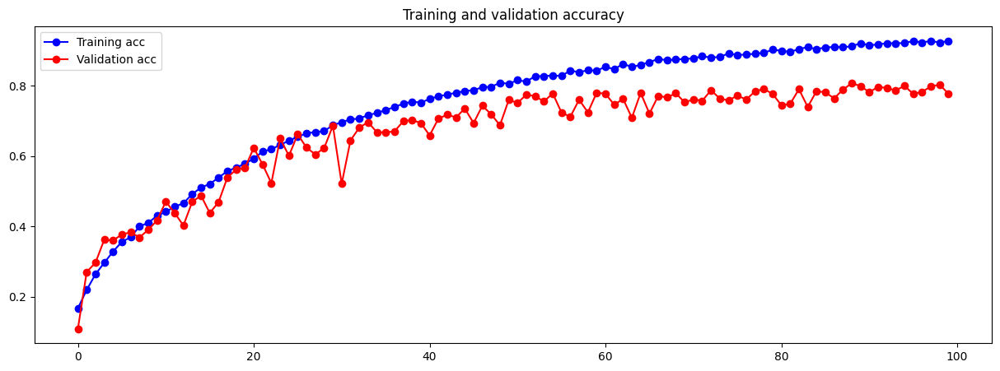

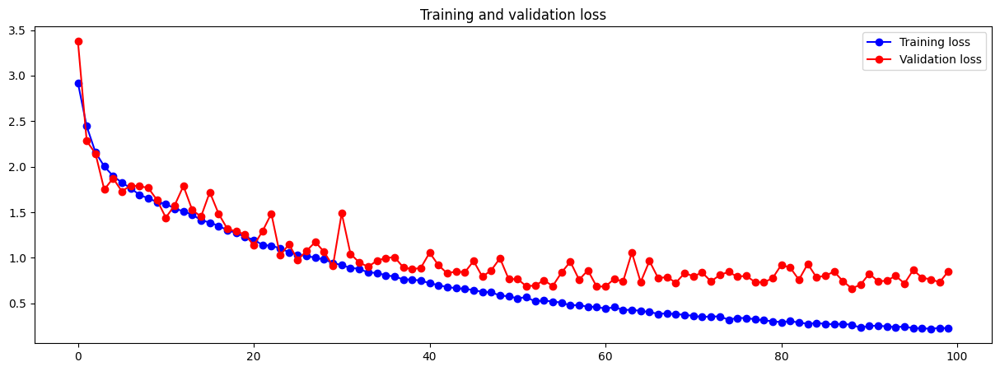

In [8]:
accloss(af1)

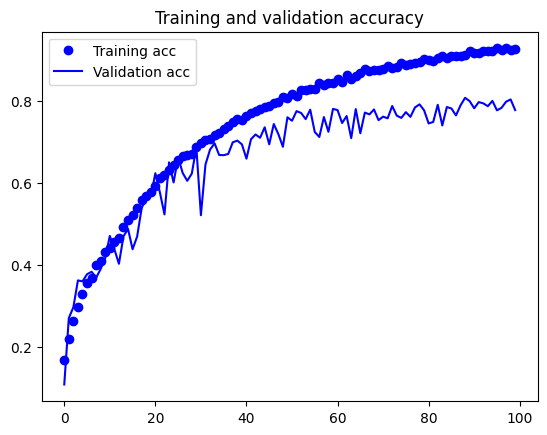

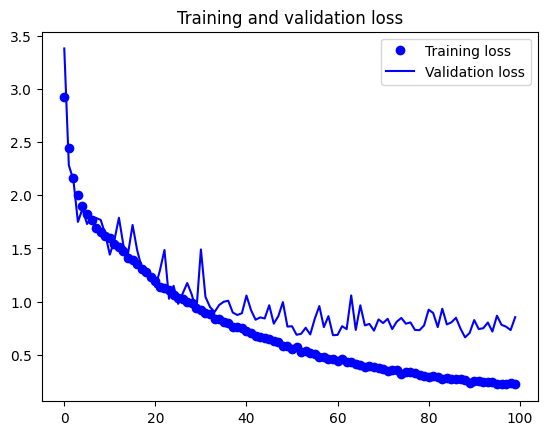

In [9]:
acc = af1.history['acc']
val_acc = af1.history['val_acc']
loss = af1.history['loss']
val_loss = af1.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [10]:
af1_model.save('food_model_one_af1.h5')

In [42]:
from tensorflow.keras.layers import ELU


elu_activation = ELU(alpha=1.0)

# Build the Model
af2_model = models.Sequential()

# input layer
af2_model.add(layers.Conv2D(64, (3, 3), activation=elu_activation, input_shape=(img_size, img_size, 3)))
af2_model.add(layers.BatchNormalization())
af2_model.add(layers.Conv2D(64, (3, 3), activation=elu_activation))
af2_model.add(layers.BatchNormalization())
af2_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
af2_model.add(layers.Conv2D(128, (3, 3), activation=elu_activation))
af2_model.add(layers.BatchNormalization())
af2_model.add(layers.Conv2D(128, (3, 3), activation=elu_activation))
af2_model.add(layers.BatchNormalization())
af2_model.add(layers.MaxPooling2D((2, 2)))

af2_model.add(layers.Conv2D(256, (3, 3), activation=elu_activation))
af2_model.add(layers.BatchNormalization())
af2_model.add(layers.Conv2D(256, (3, 3), activation=elu_activation))
af2_model.add(layers.BatchNormalization())
af2_model.add(layers.MaxPooling2D((2, 2)))

af2_model.add(layers.Conv2D(512, (3, 3), activation=elu_activation))
af2_model.add(layers.BatchNormalization())
af2_model.add(layers.Conv2D(512, (3, 3), activation=elu_activation))
af2_model.add(layers.BatchNormalization())
af2_model.add(layers.MaxPooling2D((2, 2)))
# flatten
af2_model.add(layers.Flatten())
# dense layer
af2_model.add(layers.Dense(256, activation=elu_activation))
af2_model.add(layers.BatchNormalization())
af2_model.add(layers.Dropout(0.5))
af2_model.add(layers.Dense(256, activation=elu_activation))
af2_model.add(layers.BatchNormalization())
af2_model.add(layers.Dropout(0.5))
# output layer
af2_model.add(layers.Dense(10, activation='softmax'))

af2_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

af2_model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_60 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_49 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_61 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                      

In [43]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
af2 = af2_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 41s 170ms/step - loss: 2.8797 - acc: 0.1708 - val_loss: 4.0111 - val_acc: 0.1180 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 39s 168ms/step - loss: 2.3790 - acc: 0.2271 - val_loss: 2.6213 - val_acc: 0.2220 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 39s 166ms/step - loss: 2.1723 - acc: 0.2523 - val_loss: 2.2475 - val_acc: 0.2550 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 39s 167ms/step - loss: 2.0292 - acc: 0.2820 - val_loss: 2.1287 - val_acc: 0.2980 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00067096392


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 40s 168ms/step - loss: 0.8050 - acc: 0.7323 - val_loss: 1.1226 - val_acc: 0.6320 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 39s 166ms/step - loss: 0.7793 - acc: 0.7475 - val_loss: 0.9062 - val_acc: 0.6985 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 39s 168ms/step - loss: 0.7732 - acc: 0.7463 - val_loss: 0.9486 - val_acc: 0.6820 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 39s 165ms/step - loss: 0.7453 - acc: 0.7520 - val_loss: 0.8990 - val_acc: 0.6990 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 39s 166ms/step - loss: 0.3755 - acc: 0.8741 - val_loss: 0.7780 - val_acc: 0.7720 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 39s 167ms/step - loss: 0.3622 - acc: 0.8809 - val_loss: 0.7564 - val_acc: 0.7795 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 39s 165ms/step - loss: 0.3509 - acc: 0.8827 - val_loss: 0.7260 - val_acc: 0.7865 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 40s 168ms/step - loss: 0.3443 - acc: 0.8856 - val_loss: 0.8177 - val_acc: 0.7525 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

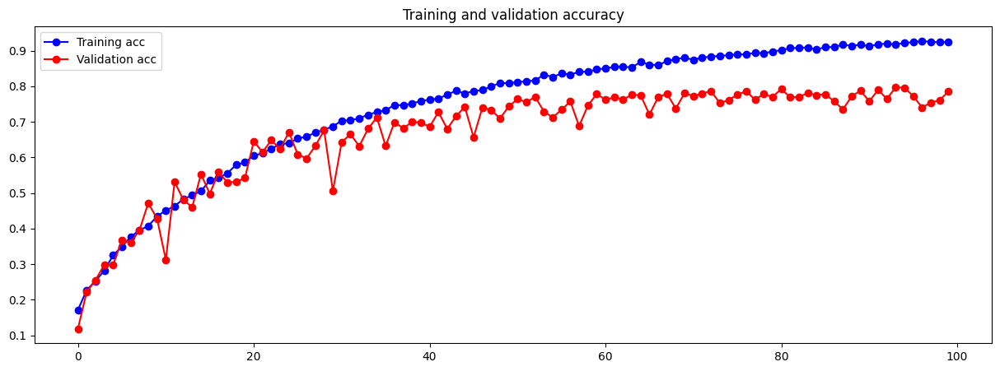

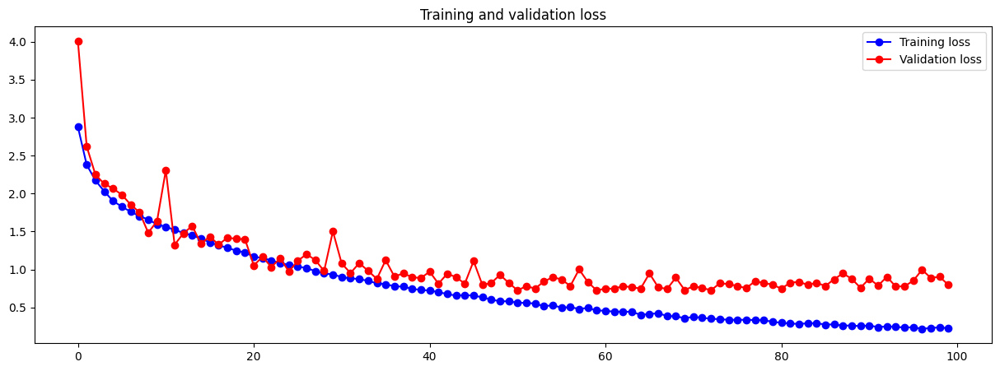

In [44]:
accloss(af2)

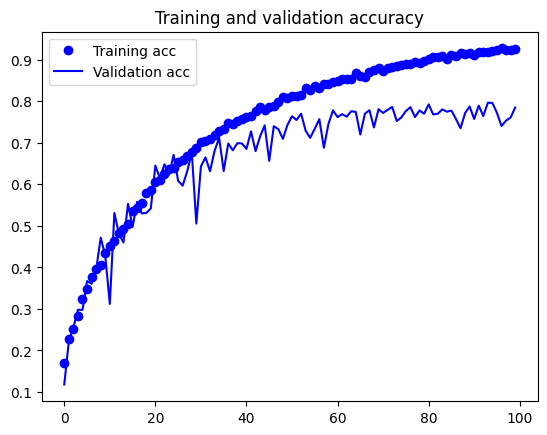

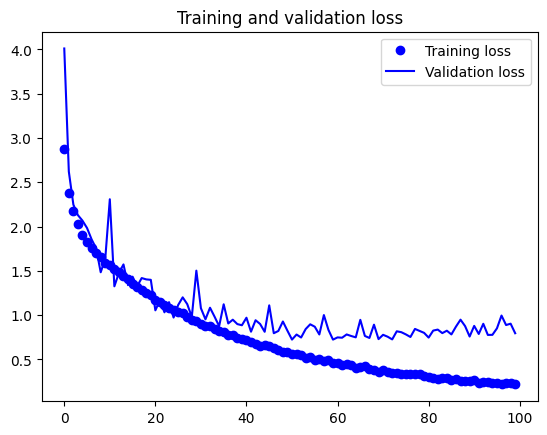

In [52]:
acc = af2.history['acc']
val_acc = af2.history['val_acc']
loss = af2.history['loss']
val_loss = af2.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [45]:
af2_model.save('food_model_one_af2.h5')

In [46]:
from tensorflow.keras.layers import Activation
from tensorflow.keras.activations import swish

# Build the Model
af3_model = models.Sequential()

# input layer
af3_model.add(layers.Conv2D(64, (3, 3), activation=swish, input_shape=(img_size, img_size, 3)))
af3_model.add(layers.BatchNormalization())
af3_model.add(layers.Conv2D(64, (3, 3), activation=swish))
af3_model.add(layers.BatchNormalization())
af3_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
af3_model.add(layers.Conv2D(128, (3, 3), activation=swish))
af3_model.add(layers.BatchNormalization())
af3_model.add(layers.Conv2D(128, (3, 3), activation=swish))
af3_model.add(layers.BatchNormalization())
af3_model.add(layers.MaxPooling2D((2, 2)))

af3_model.add(layers.Conv2D(256, (3, 3), activation=swish))
af3_model.add(layers.BatchNormalization())
af3_model.add(layers.Conv2D(256, (3, 3), activation=swish))
af3_model.add(layers.BatchNormalization())
af3_model.add(layers.MaxPooling2D((2, 2)))

af3_model.add(layers.Conv2D(512, (3, 3), activation=swish))
af3_model.add(layers.BatchNormalization())
af3_model.add(layers.Conv2D(512, (3, 3), activation=swish))
af3_model.add(layers.BatchNormalization())
af3_model.add(layers.MaxPooling2D((2, 2)))
# flatten
af3_model.add(layers.Flatten())
# dense layer
af3_model.add(layers.Dense(256, activation=swish))
af3_model.add(layers.BatchNormalization())
af3_model.add(layers.Dropout(0.5))
af3_model.add(layers.Dense(256, activation=swish))
af3_model.add(layers.BatchNormalization())
af3_model.add(layers.Dropout(0.5))
# output layer
af3_model.add(layers.Dense(10, activation='softmax'))

af3_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

af3_model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_56 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_70 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_57 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_71 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                      

In [47]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
af3 = af3_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 43s 176ms/step - loss: 3.0081 - acc: 0.1549 - val_loss: 2.9418 - val_acc: 0.1005 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 40s 171ms/step - loss: 2.4464 - acc: 0.2145 - val_loss: 2.5771 - val_acc: 0.1590 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 40s 170ms/step - loss: 2.2065 - acc: 0.2535 - val_loss: 1.9620 - val_acc: 0.3050 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 40s 171ms/step - loss: 2.0161 - acc: 0.3079 - val_loss: 2.1346 - val_acc: 0.3165 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00067096392


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 40s 171ms/step - loss: 0.8012 - acc: 0.7363 - val_loss: 0.8509 - val_acc: 0.7130 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 40s 172ms/step - loss: 0.7564 - acc: 0.7452 - val_loss: 1.0389 - val_acc: 0.6565 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 40s 171ms/step - loss: 0.7489 - acc: 0.7493 - val_loss: 0.8408 - val_acc: 0.7240 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 40s 171ms/step - loss: 0.7083 - acc: 0.7664 - val_loss: 0.7215 - val_acc: 0.7695 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 41s 172ms/step - loss: 0.3250 - acc: 0.8944 - val_loss: 0.8651 - val_acc: 0.7535 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 40s 171ms/step - loss: 0.3353 - acc: 0.8889 - val_loss: 0.8696 - val_acc: 0.7485 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 41s 172ms/step - loss: 0.3279 - acc: 0.8924 - val_loss: 0.7498 - val_acc: 0.7725 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 40s 172ms/step - loss: 0.3394 - acc: 0.8887 - val_loss: 0.8085 - val_acc: 0.7600 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

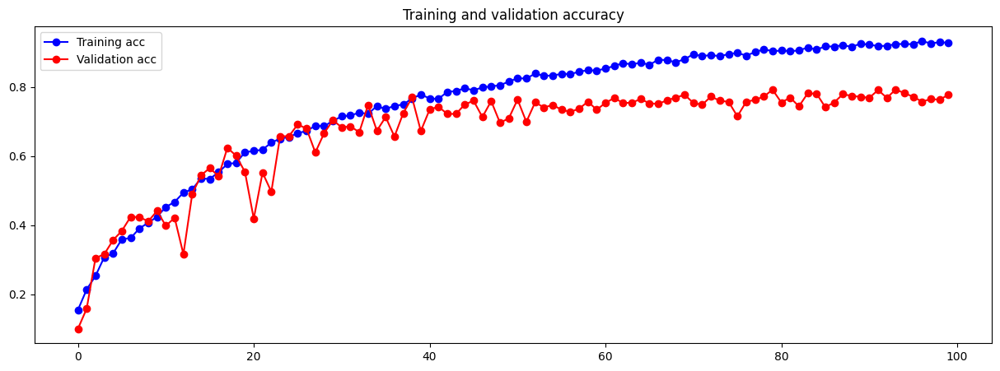

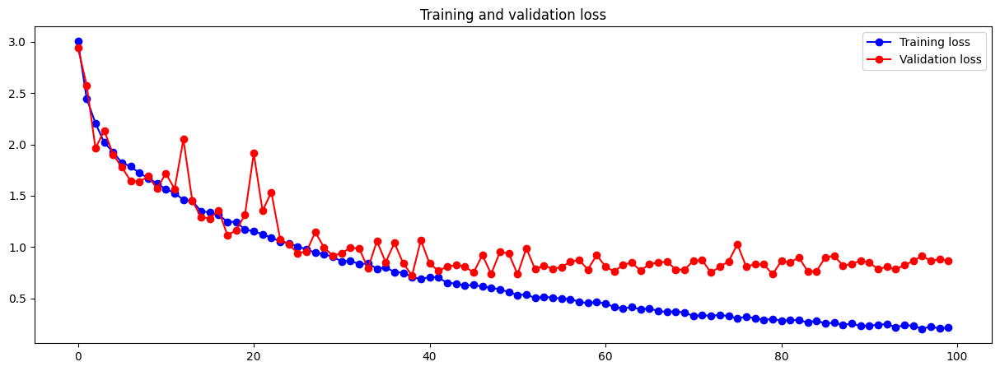

In [48]:
accloss(af3)

In [49]:
af3_model.save('food_model_one_af3.h5')

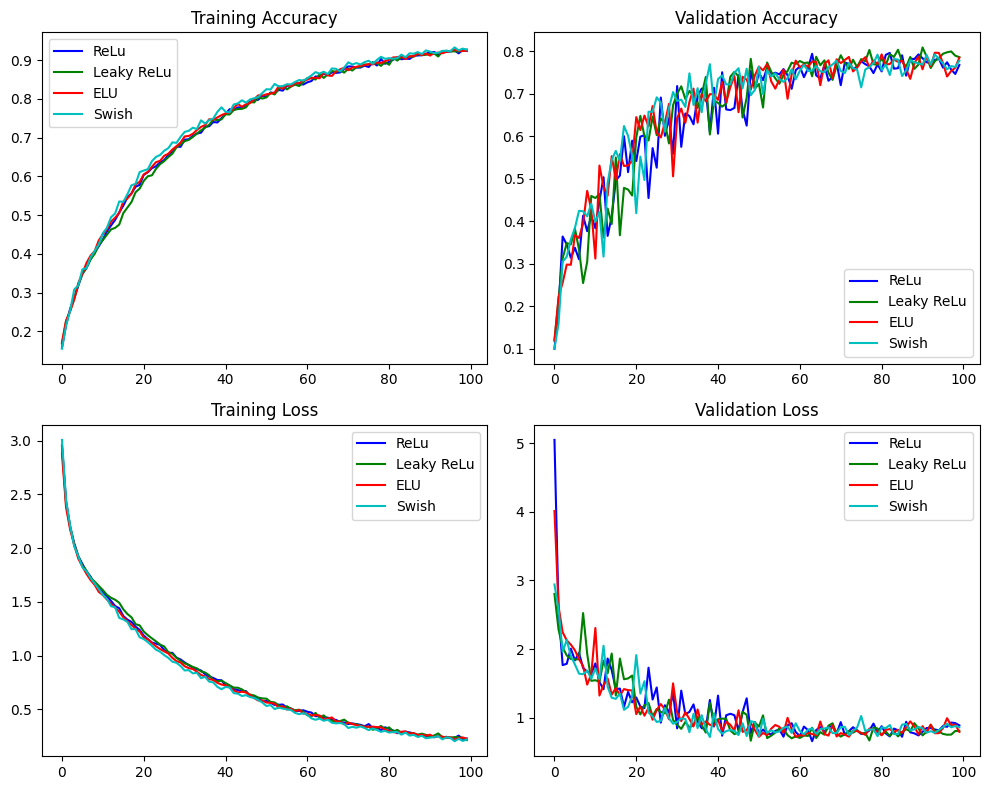

In [50]:
aug2_acc = aug2.history['acc']
epochs = range(len(aug2_acc))

plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.plot(epochs, aug2.history['acc'],'b',label='ReLu')
plt.plot(epochs, af1.history['acc'],'g',label='Leaky ReLu')
plt.plot(epochs, af2.history['acc'],'r',label='ELU')
plt.plot(epochs, af3.history['acc'],'c',label='Swish')
plt.title('Training Accuracy')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(epochs, aug2.history['val_acc'],'b',label='ReLu')
plt.plot(epochs, af1.history['val_acc'],'g',label='Leaky ReLu')
plt.plot(epochs, af2.history['val_acc'],'r',label='ELU')
plt.plot(epochs, af3.history['val_acc'],'c',label='Swish')
plt.title('Validation Accuracy')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(epochs, aug2.history['loss'],'b',label='ReLu')
plt.plot(epochs, af1.history['loss'],'g',label='Leaky ReLu')
plt.plot(epochs, af2.history['loss'],'r',label='ELU')
plt.plot(epochs, af3.history['loss'],'c',label='Swish')
plt.title('Training Loss')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(epochs, aug2.history['val_loss'],'b',label='ReLu')
plt.plot(epochs, af1.history['val_loss'],'g',label='Leaky ReLu')
plt.plot(epochs, af2.history['val_loss'],'r',label='ELU')
plt.plot(epochs, af3.history['val_loss'],'c',label='Swish')
plt.title('Validation Loss')
plt.legend()


# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

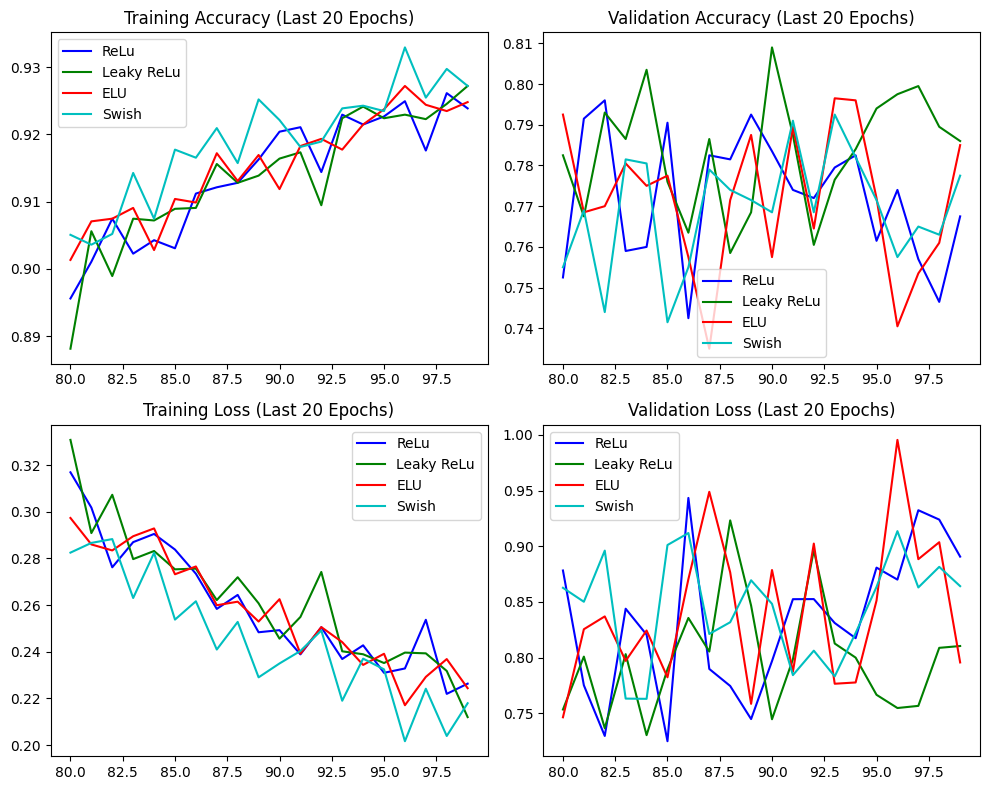

In [51]:
aug2_acc = aug2.history['acc']
epochs = range(len(aug2_acc))

# Define the number of epochs to plot (last 20 epochs)
num_epochs_to_plot = 20

# Update epochs to only include the last 20 epochs
epochs_to_plot = range(len(aug2_acc) - num_epochs_to_plot, len(aug2_acc))

# Create a subplot structure with a 2x2 format
plt.figure(figsize=(10, 8))

# Plot Training Accuracy (Last 20 Epochs)
plt.subplot(2, 2, 1)
plt.plot(epochs_to_plot, aug2.history['acc'][-num_epochs_to_plot:], 'b', label='ReLu')
plt.plot(epochs_to_plot, af1.history['acc'][-num_epochs_to_plot:], 'g', label='Leaky ReLu')
plt.plot(epochs_to_plot, af2.history['acc'][-num_epochs_to_plot:], 'r', label='ELU')
plt.plot(epochs_to_plot, af3.history['acc'][-num_epochs_to_plot:], 'c', label='Swish')
plt.title('Training Accuracy (Last 20 Epochs)')
plt.legend()

# Plot Validation Accuracy (Last 20 Epochs)
plt.subplot(2, 2, 2)
plt.plot(epochs_to_plot, aug2.history['val_acc'][-num_epochs_to_plot:], 'b', label='ReLu')
plt.plot(epochs_to_plot, af1.history['val_acc'][-num_epochs_to_plot:], 'g', label='Leaky ReLu')
plt.plot(epochs_to_plot, af2.history['val_acc'][-num_epochs_to_plot:], 'r', label='ELU')
plt.plot(epochs_to_plot, af3.history['val_acc'][-num_epochs_to_plot:], 'c', label='Swish')
plt.title('Validation Accuracy (Last 20 Epochs)')
plt.legend()

# Plot Training Loss (Last 20 Epochs)
plt.subplot(2, 2, 3)
plt.plot(epochs_to_plot, aug2.history['loss'][-num_epochs_to_plot:], 'b', label='ReLu')
plt.plot(epochs_to_plot, af1.history['loss'][-num_epochs_to_plot:], 'g', label='Leaky ReLu')
plt.plot(epochs_to_plot, af2.history['loss'][-num_epochs_to_plot:], 'r', label='ELU')
plt.plot(epochs_to_plot, af3.history['loss'][-num_epochs_to_plot:], 'c', label='Swish')
plt.title('Training Loss (Last 20 Epochs)')
plt.legend()

# Plot Validation Loss (Last 20 Epochs)
plt.subplot(2, 2, 4)
plt.plot(epochs_to_plot, aug2.history['val_loss'][-num_epochs_to_plot:], 'b', label='ReLu')
plt.plot(epochs_to_plot, af1.history['val_loss'][-num_epochs_to_plot:], 'g', label='Leaky ReLu')
plt.plot(epochs_to_plot, af2.history['val_loss'][-num_epochs_to_plot:], 'r', label='ELU')
plt.plot(epochs_to_plot, af3.history['val_loss'][-num_epochs_to_plot:], 'c', label='Swish')
plt.title('Validation Loss (Last 20 Epochs)')
plt.legend()

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()


<b>Increase kernel size<b>

In [5]:
img_size = 150
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.35,
    zoom_range=0.35,
    horizontal_flip=True,)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [6]:
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
ks1_model = models.Sequential()

# input layer
ks1_model.add(layers.Conv2D(64, (4, 4), activation=leaky_relu, input_shape=(img_size, img_size, 3)))
ks1_model.add(layers.BatchNormalization())
ks1_model.add(layers.Conv2D(64, (4, 4), activation=leaky_relu))
ks1_model.add(layers.BatchNormalization())
ks1_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
ks1_model.add(layers.Conv2D(128, (4, 4), activation=leaky_relu))
ks1_model.add(layers.BatchNormalization())
ks1_model.add(layers.Conv2D(128, (4, 4), activation=leaky_relu))
ks1_model.add(layers.BatchNormalization())
ks1_model.add(layers.MaxPooling2D((2, 2)))

ks1_model.add(layers.Conv2D(256, (4, 4), activation=leaky_relu))
ks1_model.add(layers.BatchNormalization())
ks1_model.add(layers.Conv2D(256, (4, 4), activation=leaky_relu))
ks1_model.add(layers.BatchNormalization())
ks1_model.add(layers.MaxPooling2D((2, 2)))

ks1_model.add(layers.Conv2D(512, (4, 4), activation=leaky_relu))
ks1_model.add(layers.BatchNormalization())
ks1_model.add(layers.Conv2D(512, (4, 4), activation=leaky_relu))
ks1_model.add(layers.BatchNormalization())
ks1_model.add(layers.MaxPooling2D((2, 2)))

# flatten
ks1_model.add(layers.Flatten())
# dense layer
ks1_model.add(layers.Dense(256,activation=leaky_relu))
ks1_model.add(layers.BatchNormalization())
ks1_model.add(layers.Dropout(0.5))
ks1_model.add(layers.Dense(256,activation=leaky_relu))
ks1_model.add(layers.BatchNormalization())
ks1_model.add(layers.Dropout(0.5))
# output layer
ks1_model.add(layers.Dense(10, activation='softmax'))

ks1_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

ks1_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 147, 147, 64)      3136      
                                                                 
 batch_normalization (BatchN  (None, 147, 147, 64)     256       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 144, 144, 64)      65600     
                                                                 
 batch_normalization_1 (Batc  (None, 144, 144, 64)     256       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 72, 72, 64)       0         
 )                                                               
                                                        

In [7]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
ks1 = ks1_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 97s 333ms/step - loss: 2.9923 - acc: 0.1480 - val_loss: 2.9417 - val_acc: 0.1020 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 41s 174ms/step - loss: 2.5361 - acc: 0.1755 - val_loss: 2.2786 - val_acc: 0.1900 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 41s 175ms/step - loss: 2.2813 - acc: 0.2248 - val_loss: 1.9722 - val_acc: 0.2920 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 41s 175ms/step - loss: 2.1160 - acc: 0.2540 - val_loss: 1.9940 - val_acc: 0.3175 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00067096392


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 41s 175ms/step - loss: 1.0132 - acc: 0.6589 - val_loss: 0.9865 - val_acc: 0.6745 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 41s 175ms/step - loss: 0.9869 - acc: 0.6665 - val_loss: 1.0672 - val_acc: 0.6375 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 41s 176ms/step - loss: 0.9749 - acc: 0.6739 - val_loss: 1.0377 - val_acc: 0.6550 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 41s 175ms/step - loss: 0.9623 - acc: 0.6855 - val_loss: 1.0237 - val_acc: 0.6600 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 41s 175ms/step - loss: 0.4772 - acc: 0.8428 - val_loss: 0.8153 - val_acc: 0.7350 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 41s 175ms/step - loss: 0.4704 - acc: 0.8423 - val_loss: 0.8587 - val_acc: 0.7360 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 41s 176ms/step - loss: 0.4868 - acc: 0.8411 - val_loss: 0.9549 - val_acc: 0.7050 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 41s 175ms/step - loss: 0.4749 - acc: 0.8440 - val_loss: 0.7632 - val_acc: 0.7690 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

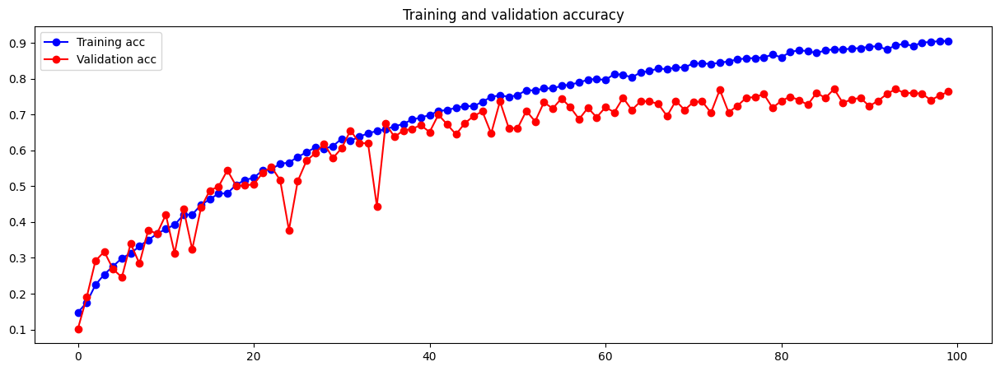

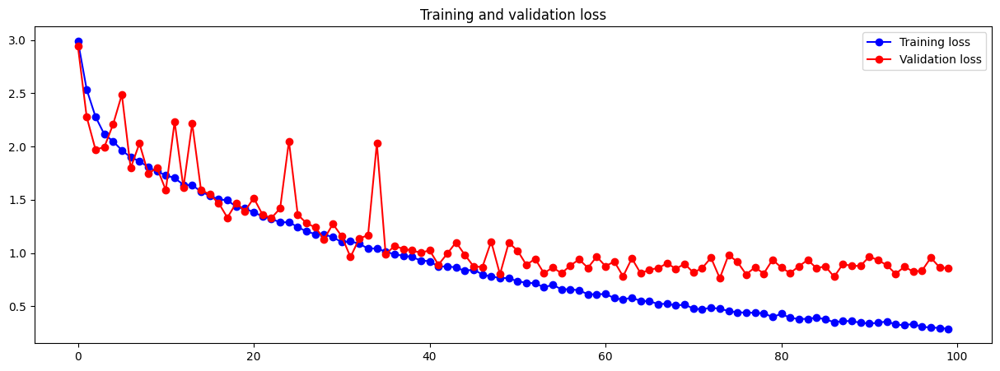

In [8]:
accloss(ks1)

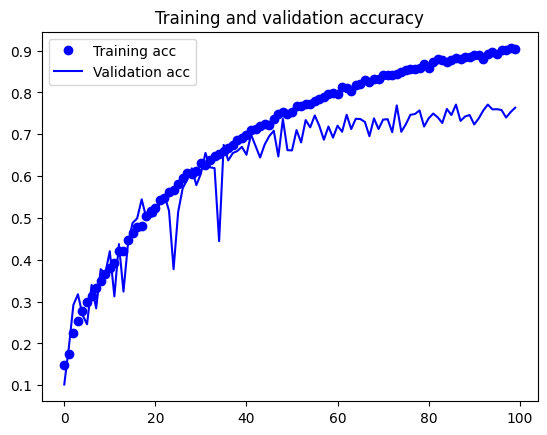

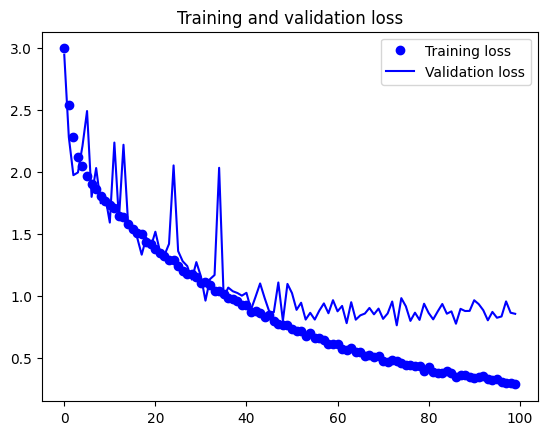

In [9]:
accloss1(ks1)

In [10]:
ks1_model.save('food_model_one_ks1.h5')

<b>Regulating Using Kernel Regularizer<b>

In [12]:
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
kr1_model = models.Sequential()

# input layer
kr1_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu, input_shape=(img_size, img_size, 3)))
kr1_model.add(layers.BatchNormalization())
kr1_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu))
kr1_model.add(layers.BatchNormalization())
kr1_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
kr1_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
kr1_model.add(layers.BatchNormalization())
kr1_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
kr1_model.add(layers.BatchNormalization())
kr1_model.add(layers.MaxPooling2D((2, 2)))

kr1_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
kr1_model.add(layers.BatchNormalization())
kr1_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
kr1_model.add(layers.BatchNormalization())
kr1_model.add(layers.MaxPooling2D((2, 2)))

kr1_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
kr1_model.add(layers.BatchNormalization())
kr1_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
kr1_model.add(layers.BatchNormalization())
kr1_model.add(layers.MaxPooling2D((2, 2)))
# flatten
kr1_model.add(layers.Flatten())
# dense layer
kr1_model.add(layers.Dense(256, kernel_regularizer=regularizers.l1(l1=0.001),activation=leaky_relu))
kr1_model.add(layers.BatchNormalization())
kr1_model.add(layers.Dropout(0.5))
kr1_model.add(layers.Dense(256, kernel_regularizer=regularizers.l1(l1=0.001),activation=leaky_relu))
kr1_model.add(layers.BatchNormalization())
kr1_model.add(layers.Dropout(0.5))
# output layer
kr1_model.add(layers.Dense(10, activation='softmax'))

kr1_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

kr1_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_18 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_17 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_19 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 73, 73, 64)       0         
 2D)                                                             
                                                      

In [13]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
kr1 = kr1_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 42s 173ms/step - loss: 24.2430 - acc: 0.1707 - val_loss: 11.1796 - val_acc: 0.1160 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 40s 170ms/step - loss: 9.8403 - acc: 0.2017 - val_loss: 8.6191 - val_acc: 0.2240 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 40s 171ms/step - loss: 8.3602 - acc: 0.2189 - val_loss: 7.6097 - val_acc: 0.3095 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 40s 171ms/step - loss: 7.4316 - acc: 0.2367 - val_loss: 6.9207 - val_acc: 0.2260 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.000670963


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 40s 170ms/step - loss: 3.4593 - acc: 0.6240 - val_loss: 3.4716 - val_acc: 0.5435 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 40s 169ms/step - loss: 3.3643 - acc: 0.6352 - val_loss: 3.6350 - val_acc: 0.6105 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 40s 170ms/step - loss: 3.2755 - acc: 0.6467 - val_loss: 3.5464 - val_acc: 0.5975 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 40s 172ms/step - loss: 3.1422 - acc: 0.6529 - val_loss: 3.0884 - val_acc: 0.6525 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 40s 170ms/step - loss: 1.8700 - acc: 0.8064 - val_loss: 2.1642 - val_acc: 0.7245 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 40s 171ms/step - loss: 1.8031 - acc: 0.8099 - val_loss: 1.8989 - val_acc: 0.7805 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 40s 170ms/step - loss: 1.8537 - acc: 0.7993 - val_loss: 2.2118 - val_acc: 0.7095 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 40s 171ms/step - loss: 1.7427 - acc: 0.8173 - val_loss: 2.0623 - val_acc: 0.7330 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

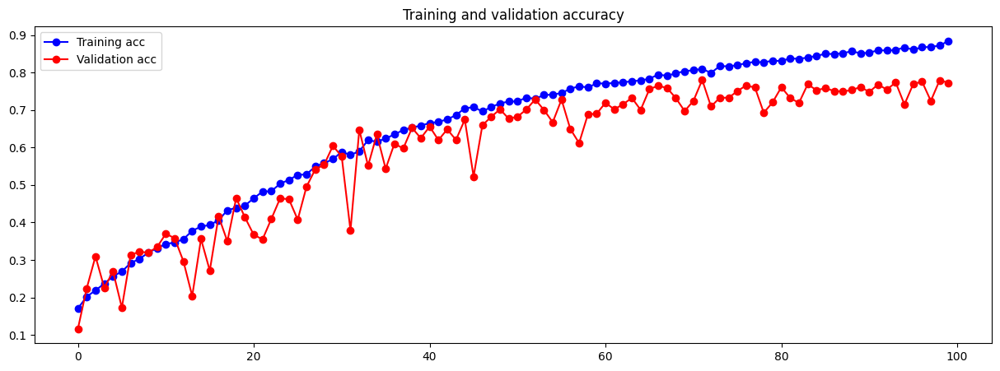

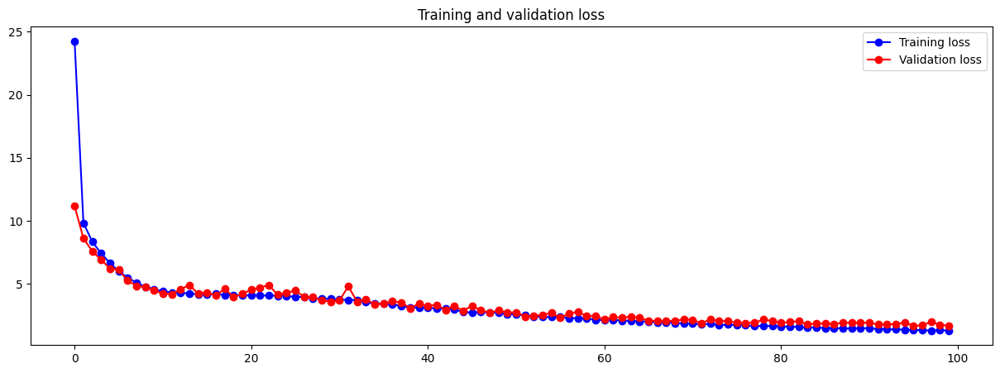

In [14]:
accloss(kr1)

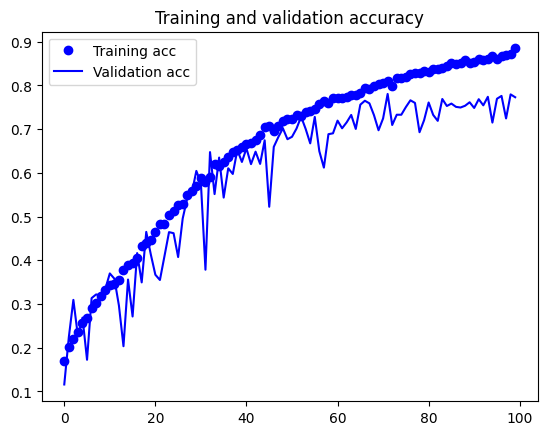

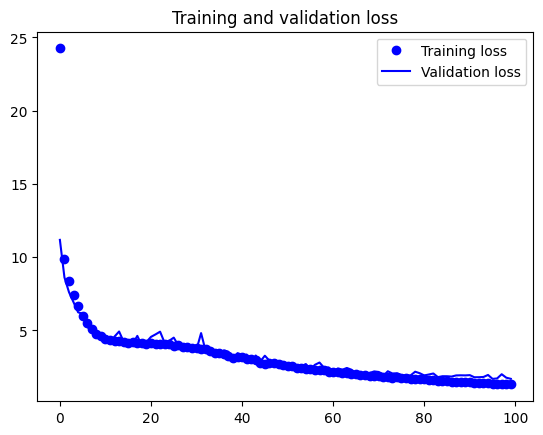

In [15]:
accloss1(kr1)

In [16]:
kr1_model.save('food_model_one_kr1.h5')

In [17]:
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
kr2_model = models.Sequential()

# input layer
kr2_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu, input_shape=(img_size, img_size, 3)))
kr2_model.add(layers.BatchNormalization())
kr2_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu))
kr2_model.add(layers.BatchNormalization())
kr2_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
kr2_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
kr2_model.add(layers.BatchNormalization())
kr2_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
kr2_model.add(layers.BatchNormalization())
kr2_model.add(layers.MaxPooling2D((2, 2)))

kr2_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
kr2_model.add(layers.BatchNormalization())
kr2_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
kr2_model.add(layers.BatchNormalization())
kr2_model.add(layers.MaxPooling2D((2, 2)))

kr2_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
kr2_model.add(layers.BatchNormalization())
kr2_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
kr2_model.add(layers.BatchNormalization())
kr2_model.add(layers.MaxPooling2D((2, 2)))
# flatten
kr2_model.add(layers.Flatten())
# dense layer
kr2_model.add(layers.Dense(256, kernel_regularizer=regularizers.l1(l1=0.0005),activation=leaky_relu))
kr2_model.add(layers.BatchNormalization())
kr2_model.add(layers.Dropout(0.5))
kr2_model.add(layers.Dense(256, kernel_regularizer=regularizers.l1(l1=0.0005),activation=leaky_relu))
kr2_model.add(layers.BatchNormalization())
kr2_model.add(layers.Dropout(0.5))
# output layer
kr2_model.add(layers.Dense(10, activation='softmax'))

kr2_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

kr2_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_28 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_25 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_29 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                      

In [18]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
kr2 = kr2_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 42s 172ms/step - loss: 16.8180 - acc: 0.1695 - val_loss: 10.5261 - val_acc: 0.1030 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 40s 171ms/step - loss: 7.8887 - acc: 0.2169 - val_loss: 6.4287 - val_acc: 0.2360 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 40s 172ms/step - loss: 6.1666 - acc: 0.2324 - val_loss: 5.8137 - val_acc: 0.2750 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 40s 171ms/step - loss: 5.6063 - acc: 0.2571 - val_loss: 5.4310 - val_acc: 0.2675 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.000670963


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 40s 171ms/step - loss: 2.6368 - acc: 0.6431 - val_loss: 2.8129 - val_acc: 0.5845 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 40s 170ms/step - loss: 2.5866 - acc: 0.6385 - val_loss: 3.0668 - val_acc: 0.4900 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 40s 171ms/step - loss: 2.5297 - acc: 0.6575 - val_loss: 2.7002 - val_acc: 0.6240 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 40s 170ms/step - loss: 2.4642 - acc: 0.6588 - val_loss: 2.2895 - val_acc: 0.6830 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 40s 170ms/step - loss: 1.4136 - acc: 0.8099 - val_loss: 1.6861 - val_acc: 0.7380 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 40s 172ms/step - loss: 1.3859 - acc: 0.8165 - val_loss: 1.6310 - val_acc: 0.7370 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 40s 172ms/step - loss: 1.3795 - acc: 0.8203 - val_loss: 1.6358 - val_acc: 0.7535 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 41s 174ms/step - loss: 1.3801 - acc: 0.8227 - val_loss: 1.5865 - val_acc: 0.7760 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

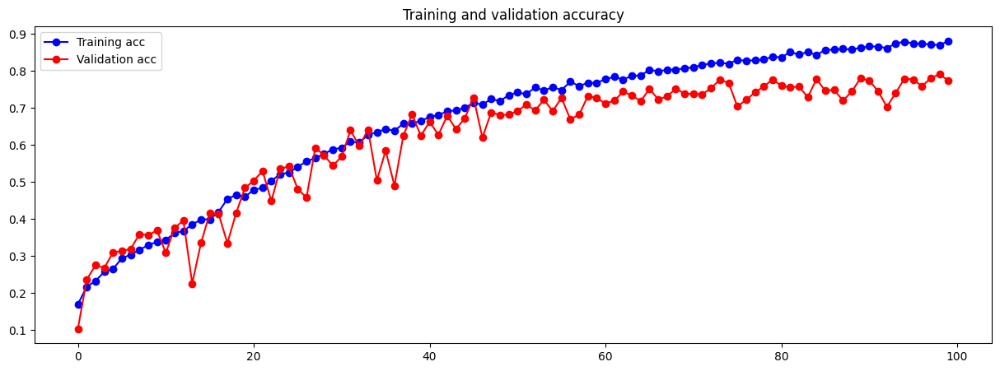

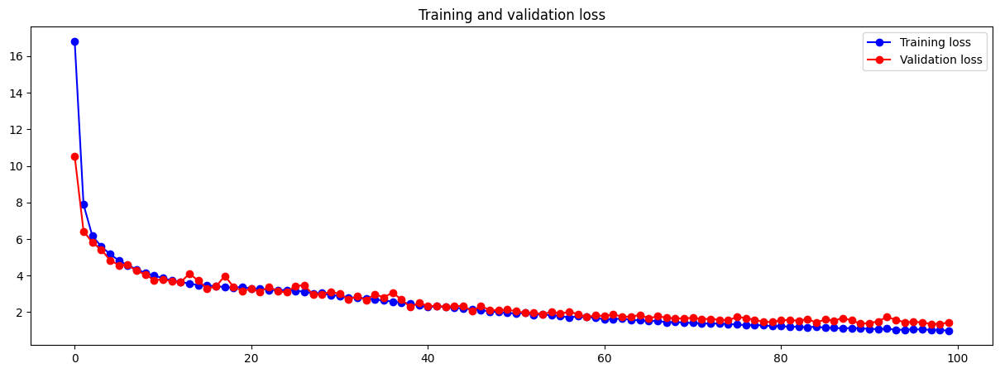

In [19]:
accloss(kr2)

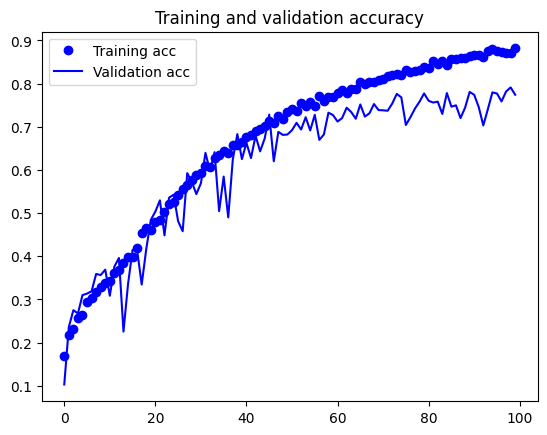

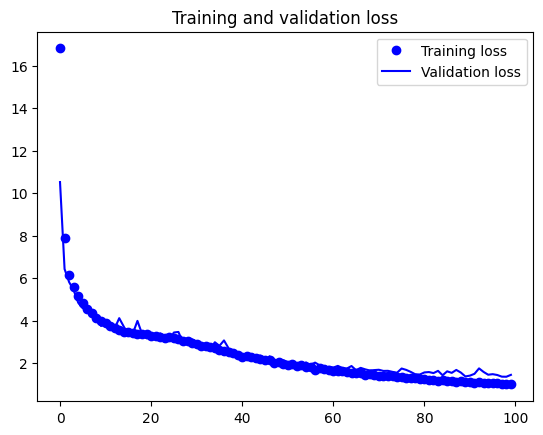

In [20]:
accloss1(kr2)

In [21]:
kr2_model.save('food_model_one_kr2.h5')

In [22]:
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
af1_model = models.Sequential()
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
kr3_model = models.Sequential()

# input layer
kr3_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu, input_shape=(img_size, img_size, 3)))
kr3_model.add(layers.BatchNormalization())
kr3_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu))
kr3_model.add(layers.BatchNormalization())
kr3_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
kr3_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
kr3_model.add(layers.BatchNormalization())
kr3_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
kr3_model.add(layers.BatchNormalization())
kr3_model.add(layers.MaxPooling2D((2, 2)))

kr3_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
kr3_model.add(layers.BatchNormalization())
kr3_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
kr3_model.add(layers.BatchNormalization())
kr3_model.add(layers.MaxPooling2D((2, 2)))

kr3_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
kr3_model.add(layers.BatchNormalization())
kr3_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
kr3_model.add(layers.BatchNormalization())
kr3_model.add(layers.MaxPooling2D((2, 2)))
# flatten
kr3_model.add(layers.Flatten())
# dense layer
kr3_model.add(layers.Dense(256, kernel_regularizer=regularizers.l1(l1=0.0001),activation=leaky_relu))
kr3_model.add(layers.BatchNormalization())
kr3_model.add(layers.Dropout(0.5))
kr3_model.add(layers.Dense(256, kernel_regularizer=regularizers.l1(l1=0.0001),activation=leaky_relu))
kr3_model.add(layers.BatchNormalization())
kr3_model.add(layers.Dropout(0.5))
# output layer
kr3_model.add(layers.Dense(10, activation='softmax'))

kr3_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

kr3_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_32 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_38 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_33 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_39 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                      

In [23]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
kr3 = kr3_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 42s 173ms/step - loss: 6.6976 - acc: 0.1664 - val_loss: 6.9333 - val_acc: 0.1045 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 40s 170ms/step - loss: 5.3880 - acc: 0.2185 - val_loss: 4.7172 - val_acc: 0.2230 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 40s 171ms/step - loss: 4.2632 - acc: 0.2657 - val_loss: 3.9178 - val_acc: 0.2615 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 40s 170ms/step - loss: 3.5784 - acc: 0.2725 - val_loss: 3.1381 - val_acc: 0.3610 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00067096392


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 40s 171ms/step - loss: 1.8022 - acc: 0.6812 - val_loss: 1.8319 - val_acc: 0.6735 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 41s 174ms/step - loss: 1.7607 - acc: 0.6924 - val_loss: 1.6955 - val_acc: 0.6960 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 40s 171ms/step - loss: 1.7527 - acc: 0.7016 - val_loss: 2.0536 - val_acc: 0.6015 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 41s 173ms/step - loss: 1.7106 - acc: 0.7081 - val_loss: 1.7931 - val_acc: 0.6810 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 40s 169ms/step - loss: 1.0386 - acc: 0.8503 - val_loss: 1.4043 - val_acc: 0.7505 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 40s 169ms/step - loss: 1.0482 - acc: 0.8497 - val_loss: 1.3759 - val_acc: 0.7540 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 40s 170ms/step - loss: 1.0755 - acc: 0.8441 - val_loss: 1.3995 - val_acc: 0.7575 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 39s 168ms/step - loss: 1.0335 - acc: 0.8492 - val_loss: 1.3948 - val_acc: 0.7575 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

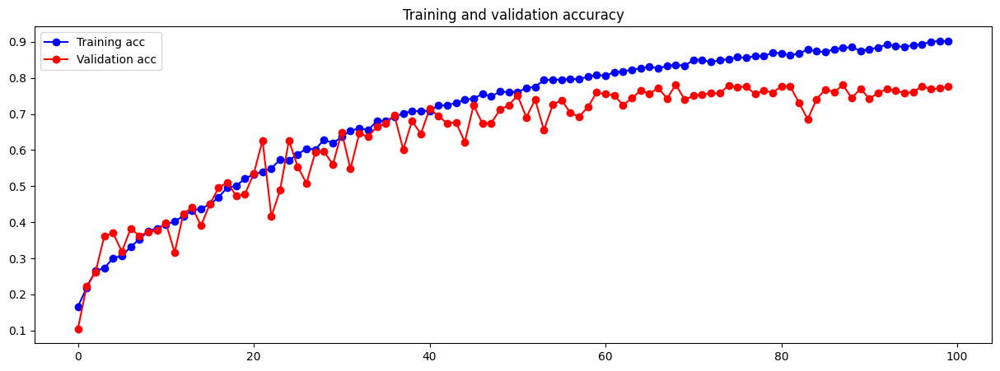

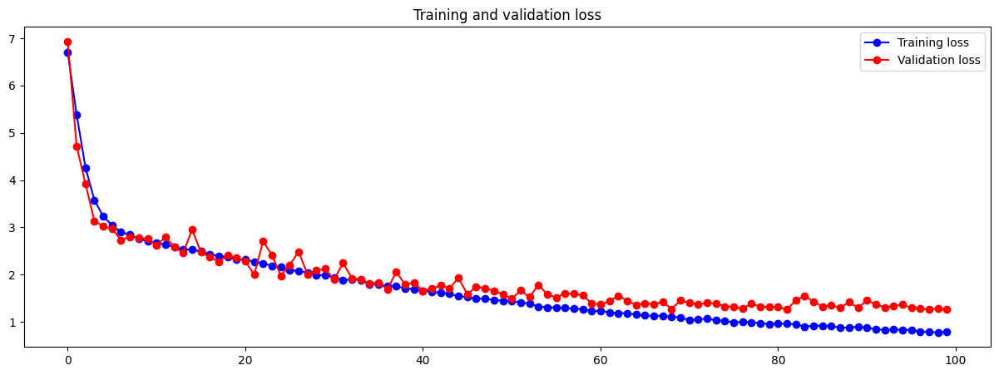

In [24]:
accloss(kr3)

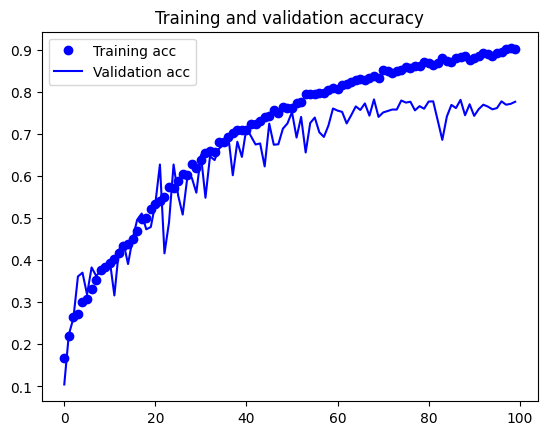

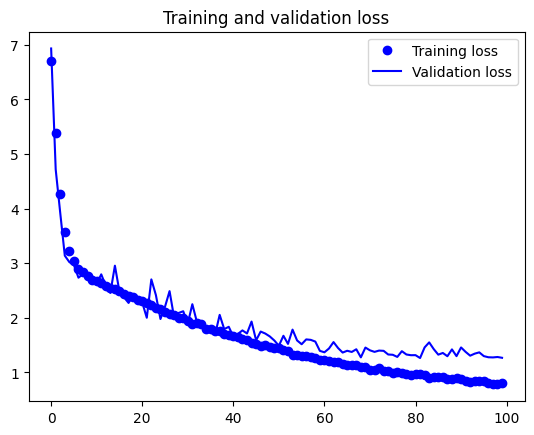

In [25]:
accloss1(kr3)

In [26]:
kr3_model.save('food_model_one_kr3.h5')

In [27]:
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
af1_model = models.Sequential()
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
kr4_model = models.Sequential()

# input layer
kr4_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu, input_shape=(img_size, img_size, 3)))
kr4_model.add(layers.BatchNormalization())
kr4_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu))
kr4_model.add(layers.BatchNormalization())
kr4_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
kr4_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
kr4_model.add(layers.BatchNormalization())
kr4_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
kr4_model.add(layers.BatchNormalization())
kr4_model.add(layers.MaxPooling2D((2, 2)))

kr4_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
kr4_model.add(layers.BatchNormalization())
kr4_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
kr4_model.add(layers.BatchNormalization())
kr4_model.add(layers.MaxPooling2D((2, 2)))

kr4_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
kr4_model.add(layers.BatchNormalization())
kr4_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
kr4_model.add(layers.BatchNormalization())
kr4_model.add(layers.MaxPooling2D((2, 2)))
# flatten
kr4_model.add(layers.Flatten())
# dense layer
kr4_model.add(layers.Dense(256, kernel_regularizer=regularizers.l2(l2=0.001),activation=leaky_relu))
kr4_model.add(layers.BatchNormalization())
kr4_model.add(layers.Dropout(0.5))
kr4_model.add(layers.Dense(256, kernel_regularizer=regularizers.l2(l2=0.001),activation=leaky_relu))
kr4_model.add(layers.BatchNormalization())
kr4_model.add(layers.Dropout(0.5))
# output layer
kr4_model.add(layers.Dense(10, activation='softmax'))

kr4_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

kr4_model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_40 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_48 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_41 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_49 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                      

In [28]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
kr4 = kr4_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 41s 169ms/step - loss: 3.7350 - acc: 0.1664 - val_loss: 4.1204 - val_acc: 0.0845 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 40s 170ms/step - loss: 3.1854 - acc: 0.2187 - val_loss: 3.3492 - val_acc: 0.2080 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 40s 171ms/step - loss: 2.8893 - acc: 0.2521 - val_loss: 2.8302 - val_acc: 0.2625 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 40s 169ms/step - loss: 2.6547 - acc: 0.2899 - val_loss: 2.8651 - val_acc: 0.2365 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00067096392


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 41s 174ms/step - loss: 1.1802 - acc: 0.6987 - val_loss: 1.2701 - val_acc: 0.6745 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 40s 171ms/step - loss: 1.1778 - acc: 0.7053 - val_loss: 1.2746 - val_acc: 0.6580 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 40s 170ms/step - loss: 1.1680 - acc: 0.7040 - val_loss: 1.1387 - val_acc: 0.7160 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 40s 169ms/step - loss: 1.1393 - acc: 0.7177 - val_loss: 1.1690 - val_acc: 0.6955 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 39s 167ms/step - loss: 0.6974 - acc: 0.8609 - val_loss: 1.0792 - val_acc: 0.7490 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 39s 167ms/step - loss: 0.7125 - acc: 0.8536 - val_loss: 0.9740 - val_acc: 0.7780 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 40s 169ms/step - loss: 0.7143 - acc: 0.8515 - val_loss: 1.0110 - val_acc: 0.7665 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 39s 166ms/step - loss: 0.7030 - acc: 0.8592 - val_loss: 1.0571 - val_acc: 0.7680 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

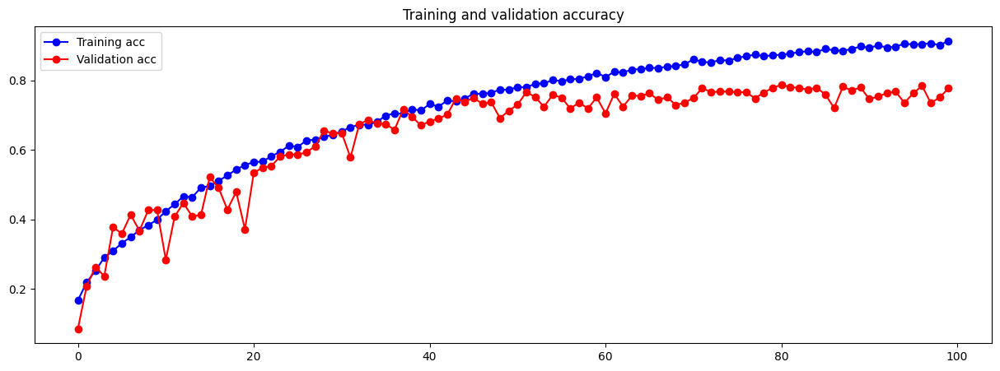

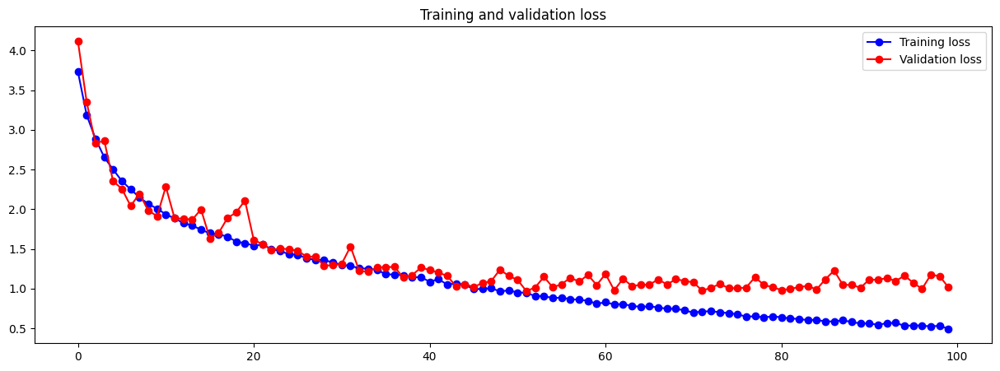

In [29]:
accloss(kr4)

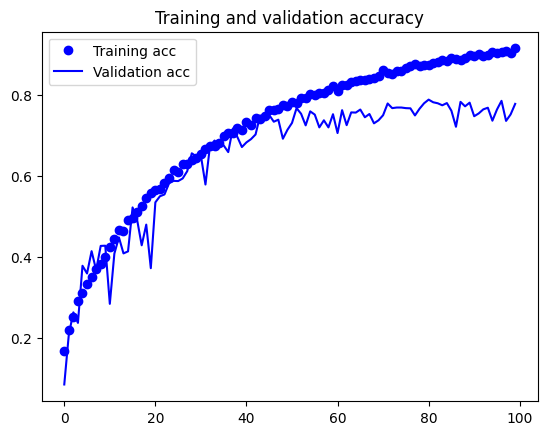

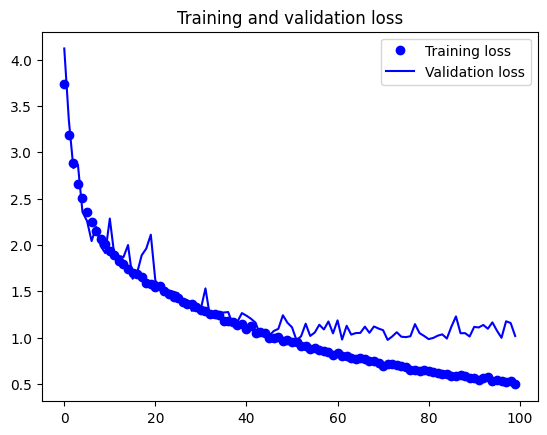

In [30]:
accloss1(kr4)

In [31]:
kr4_model.save('food_model_one_kr4.h5')

In [32]:
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
af1_model = models.Sequential()
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
kr5_model = models.Sequential()

# input layer
kr5_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu, input_shape=(img_size, img_size, 3)))
kr5_model.add(layers.BatchNormalization())
kr5_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu))
kr5_model.add(layers.BatchNormalization())
kr5_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
kr5_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
kr5_model.add(layers.BatchNormalization())
kr5_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
kr5_model.add(layers.BatchNormalization())
kr5_model.add(layers.MaxPooling2D((2, 2)))

kr5_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
kr5_model.add(layers.BatchNormalization())
kr5_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
kr5_model.add(layers.BatchNormalization())
kr5_model.add(layers.MaxPooling2D((2, 2)))

kr5_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
kr5_model.add(layers.BatchNormalization())
kr5_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
kr5_model.add(layers.BatchNormalization())
kr5_model.add(layers.MaxPooling2D((2, 2)))
# flatten
kr5_model.add(layers.Flatten())
# dense layer
kr5_model.add(layers.Dense(256, kernel_regularizer=regularizers.l2(l2=0.0005),activation=leaky_relu))
kr5_model.add(layers.BatchNormalization())
kr5_model.add(layers.Dropout(0.5))
kr5_model.add(layers.Dense(256, kernel_regularizer=regularizers.l2(l2=0.0005),activation=leaky_relu))
kr5_model.add(layers.BatchNormalization())
kr5_model.add(layers.Dropout(0.5))
# output layer
kr5_model.add(layers.Dense(10, activation='softmax'))

kr5_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

kr5_model.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_58 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_49 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_59 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                      

In [33]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
kr5 = kr5_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 40s 167ms/step - loss: 3.3553 - acc: 0.1696 - val_loss: 3.9410 - val_acc: 0.0965 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 39s 166ms/step - loss: 2.8232 - acc: 0.2307 - val_loss: 2.4659 - val_acc: 0.2615 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 39s 168ms/step - loss: 2.5791 - acc: 0.2628 - val_loss: 2.2737 - val_acc: 0.3535 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 39s 166ms/step - loss: 2.4026 - acc: 0.2900 - val_loss: 2.8334 - val_acc: 0.2855 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00067096392


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 39s 167ms/step - loss: 1.0901 - acc: 0.7168 - val_loss: 1.2235 - val_acc: 0.6650 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 39s 166ms/step - loss: 1.0932 - acc: 0.7144 - val_loss: 1.2313 - val_acc: 0.6570 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 39s 167ms/step - loss: 1.0423 - acc: 0.7332 - val_loss: 1.1884 - val_acc: 0.6810 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 39s 168ms/step - loss: 1.0227 - acc: 0.7336 - val_loss: 1.3043 - val_acc: 0.6430 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 39s 167ms/step - loss: 0.6344 - acc: 0.8611 - val_loss: 0.8913 - val_acc: 0.7875 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 39s 168ms/step - loss: 0.6255 - acc: 0.8653 - val_loss: 0.9422 - val_acc: 0.7735 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 39s 168ms/step - loss: 0.6356 - acc: 0.8589 - val_loss: 0.9826 - val_acc: 0.7570 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 39s 167ms/step - loss: 0.6093 - acc: 0.8661 - val_loss: 0.9510 - val_acc: 0.7835 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

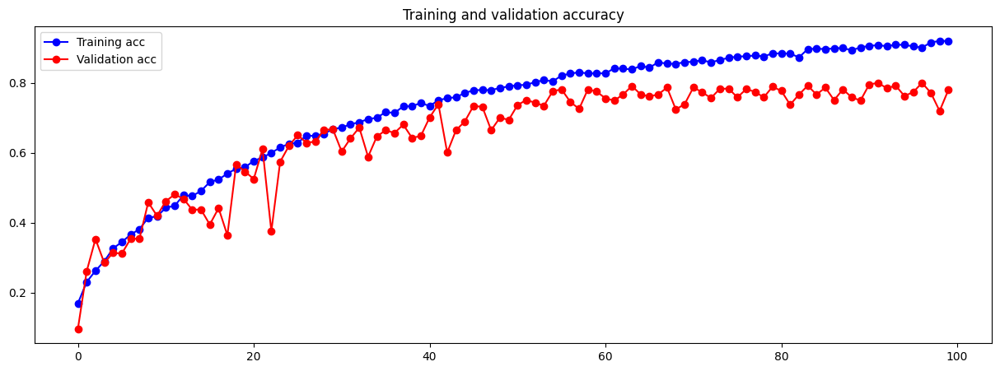

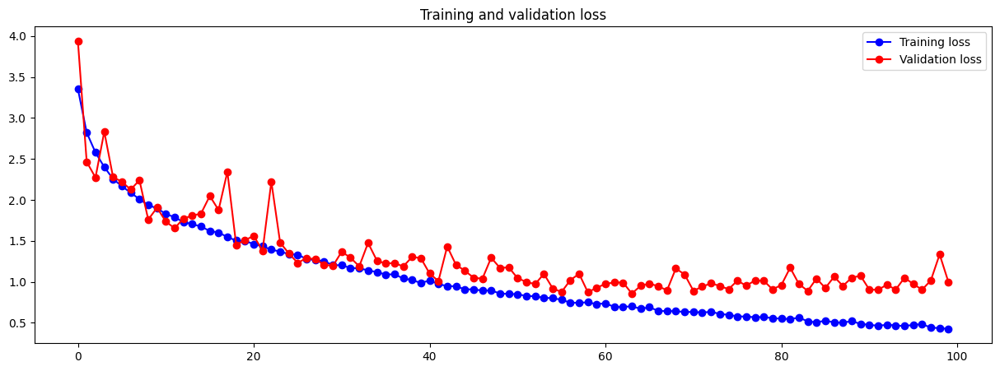

In [34]:
accloss(kr5)

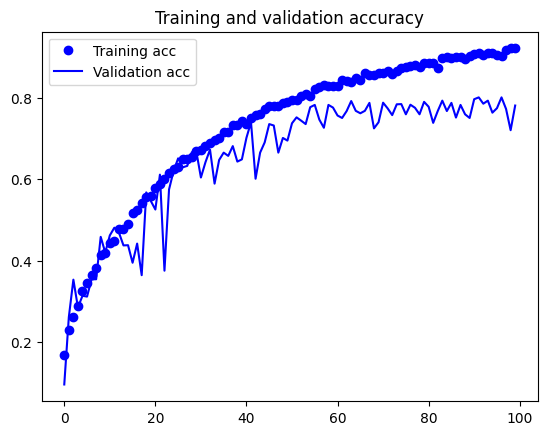

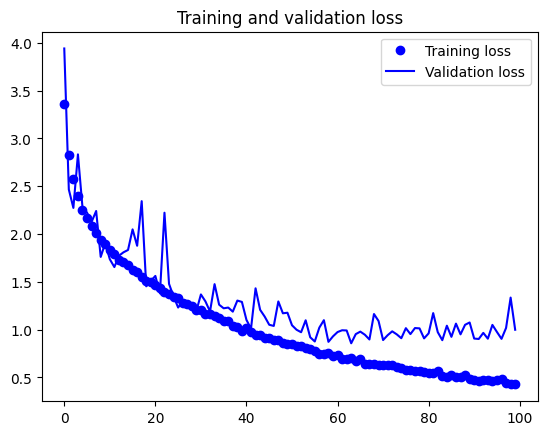

In [35]:
accloss1(kr5)

In [36]:
kr5_model.save('food_model_one_kr5.h5')

In [38]:
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
af1_model = models.Sequential()
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
kr6_model = models.Sequential()

# input layer
kr6_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu, input_shape=(img_size, img_size, 3)))
kr6_model.add(layers.BatchNormalization())
kr6_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu))
kr6_model.add(layers.BatchNormalization())
kr6_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
kr6_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
kr6_model.add(layers.BatchNormalization())
kr6_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
kr6_model.add(layers.BatchNormalization())
kr6_model.add(layers.MaxPooling2D((2, 2)))

kr6_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
kr6_model.add(layers.BatchNormalization())
kr6_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
kr6_model.add(layers.BatchNormalization())
kr6_model.add(layers.MaxPooling2D((2, 2)))

kr6_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
kr6_model.add(layers.BatchNormalization())
kr6_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
kr6_model.add(layers.BatchNormalization())
kr6_model.add(layers.MaxPooling2D((2, 2)))
# flatten
kr6_model.add(layers.Flatten())
# dense layer
kr6_model.add(layers.Dense(256, kernel_regularizer=regularizers.l2(l2=0.0001),activation=leaky_relu))
kr6_model.add(layers.BatchNormalization())
kr6_model.add(layers.Dropout(0.5))
kr6_model.add(layers.Dense(256, kernel_regularizer=regularizers.l2(l2=0.0001),activation=leaky_relu))
kr6_model.add(layers.BatchNormalization())
kr6_model.add(layers.Dropout(0.5))
# output layer
kr6_model.add(layers.Dense(10, activation='softmax'))

kr6_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

kr6_model.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_64 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_76 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_65 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_77 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                     

In [39]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
kr6 = kr6_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 77s 322ms/step - loss: 3.0362 - acc: 0.1667 - val_loss: 3.6396 - val_acc: 0.1000 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 39s 168ms/step - loss: 2.5193 - acc: 0.2187 - val_loss: 2.7648 - val_acc: 0.1765 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 39s 168ms/step - loss: 2.2158 - acc: 0.2748 - val_loss: 1.8974 - val_acc: 0.3535 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 40s 171ms/step - loss: 2.1010 - acc: 0.3011 - val_loss: 1.7882 - val_acc: 0.3755 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00067096392


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 40s 168ms/step - loss: 0.9393 - acc: 0.7316 - val_loss: 1.0805 - val_acc: 0.6895 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 39s 168ms/step - loss: 0.9562 - acc: 0.7251 - val_loss: 0.9610 - val_acc: 0.7165 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 40s 168ms/step - loss: 0.9219 - acc: 0.7383 - val_loss: 1.5312 - val_acc: 0.5490 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 40s 170ms/step - loss: 0.8935 - acc: 0.7557 - val_loss: 0.9600 - val_acc: 0.7285 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 40s 168ms/step - loss: 0.5159 - acc: 0.8764 - val_loss: 0.8180 - val_acc: 0.7925 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 40s 170ms/step - loss: 0.5089 - acc: 0.8727 - val_loss: 0.9179 - val_acc: 0.7735 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 40s 170ms/step - loss: 0.5193 - acc: 0.8733 - val_loss: 0.9212 - val_acc: 0.7665 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 40s 170ms/step - loss: 0.5031 - acc: 0.8815 - val_loss: 0.9708 - val_acc: 0.7450 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

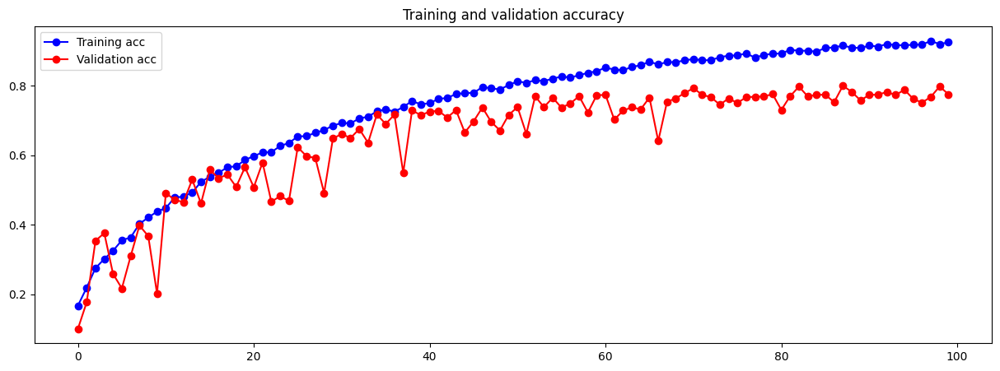

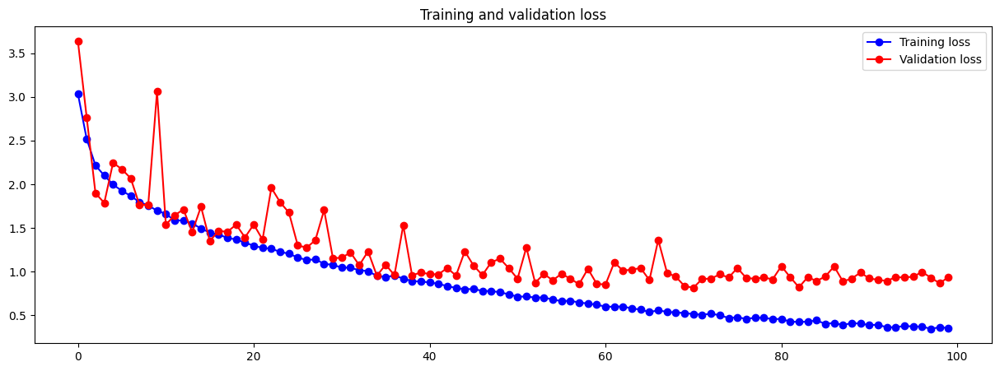

In [40]:
accloss(kr6)

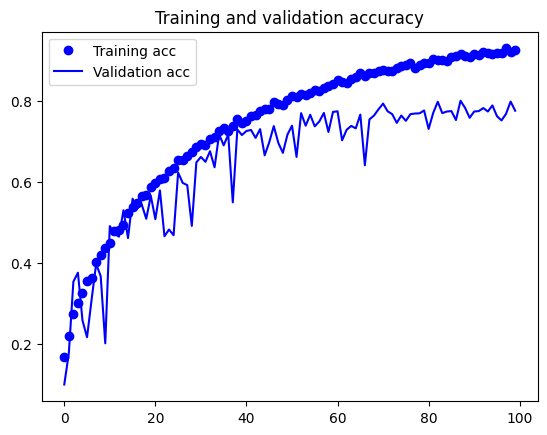

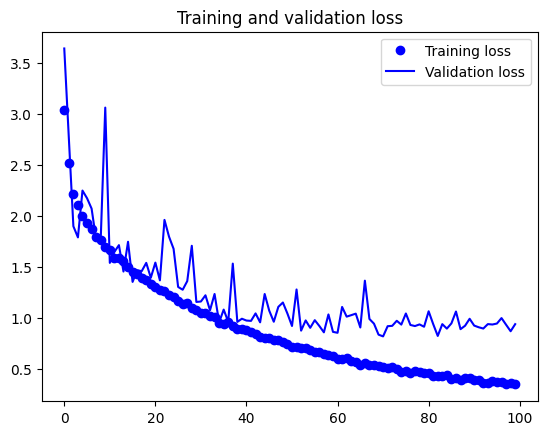

In [41]:
accloss1(kr6)

In [42]:
kr6_model.save('food_model_one_kr6.h5')

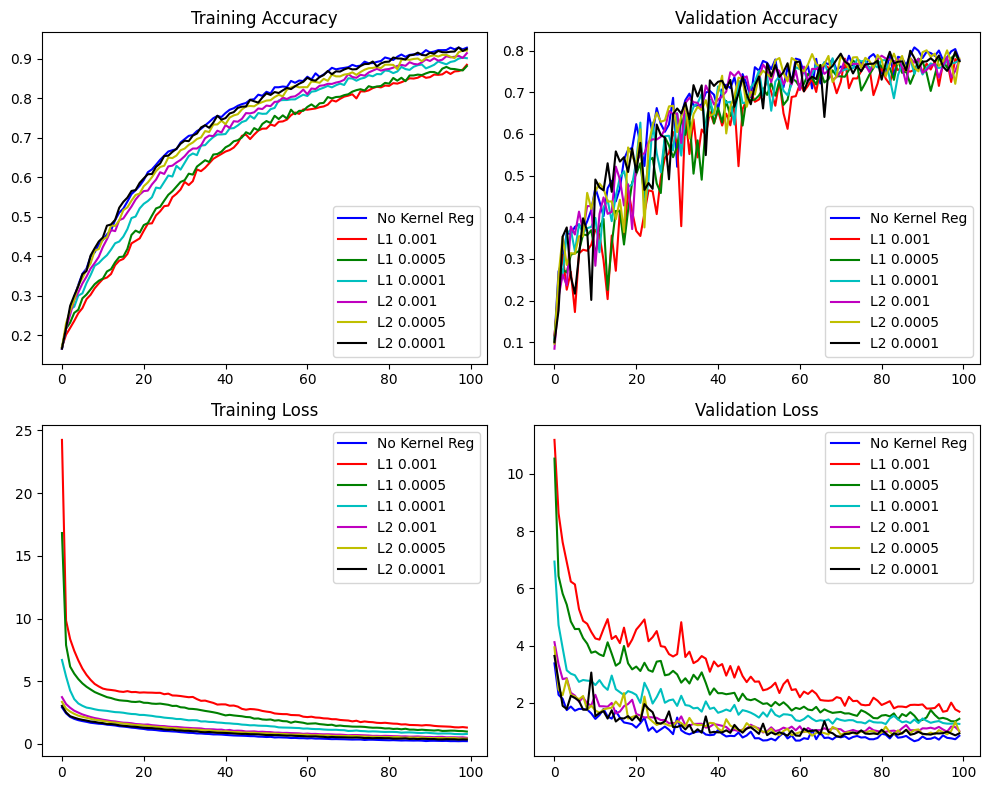

In [43]:
af1_acc = af1.history['acc']
epochs = range(len(af1_acc))

plt.figure(figsize=(10,8))
plt.subplot(2, 2, 1)
plt.plot(epochs, af1.history['acc'],'b',label='No Kernel Reg')
plt.plot(epochs, kr1.history['acc'],'r',label='L1 0.001')
plt.plot(epochs, kr2.history['acc'],'g',label='L1 0.0005')
plt.plot(epochs, kr3.history['acc'],'c',label='L1 0.0001')
plt.plot(epochs, kr4.history['acc'],'m',label='L2 0.001')
plt.plot(epochs, kr5.history['acc'],'y',label='L2 0.0005')
plt.plot(epochs, kr6.history['acc'],'k',label='L2 0.0001')
plt.title('Training Accuracy')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(epochs, af1.history['val_acc'],'b',label='No Kernel Reg')
plt.plot(epochs, kr1.history['val_acc'],'r',label='L1 0.001')
plt.plot(epochs, kr2.history['val_acc'],'g',label='L1 0.0005')
plt.plot(epochs, kr3.history['val_acc'],'c',label='L1 0.0001')
plt.plot(epochs, kr4.history['val_acc'],'m',label='L2 0.001')
plt.plot(epochs, kr5.history['val_acc'],'y',label='L2 0.0005')
plt.plot(epochs, kr6.history['val_acc'],'k',label='L2 0.0001')
plt.title('Validation Accuracy')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(epochs, af1.history['loss'],'b',label='No Kernel Reg')
plt.plot(epochs, kr1.history['loss'],'r',label='L1 0.001')
plt.plot(epochs, kr2.history['loss'],'g',label='L1 0.0005')
plt.plot(epochs, kr3.history['loss'],'c',label='L1 0.0001')
plt.plot(epochs, kr4.history['loss'],'m',label='L2 0.001')
plt.plot(epochs, kr5.history['loss'],'y',label='L2 0.0005')
plt.plot(epochs, kr6.history['loss'],'k',label='L2 0.0001')
plt.title('Training Loss')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(epochs, af1.history['val_loss'],'b',label='No Kernel Reg')
plt.plot(epochs, kr1.history['val_loss'],'r',label='L1 0.001')
plt.plot(epochs, kr2.history['val_loss'],'g',label='L1 0.0005')
plt.plot(epochs, kr3.history['val_loss'],'c',label='L1 0.0001')
plt.plot(epochs, kr4.history['val_loss'],'m',label='L2 0.001')
plt.plot(epochs, kr5.history['val_loss'],'y',label='L2 0.0005')
plt.plot(epochs, kr6.history['val_loss'],'k',label='L2 0.0001')
plt.title('Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

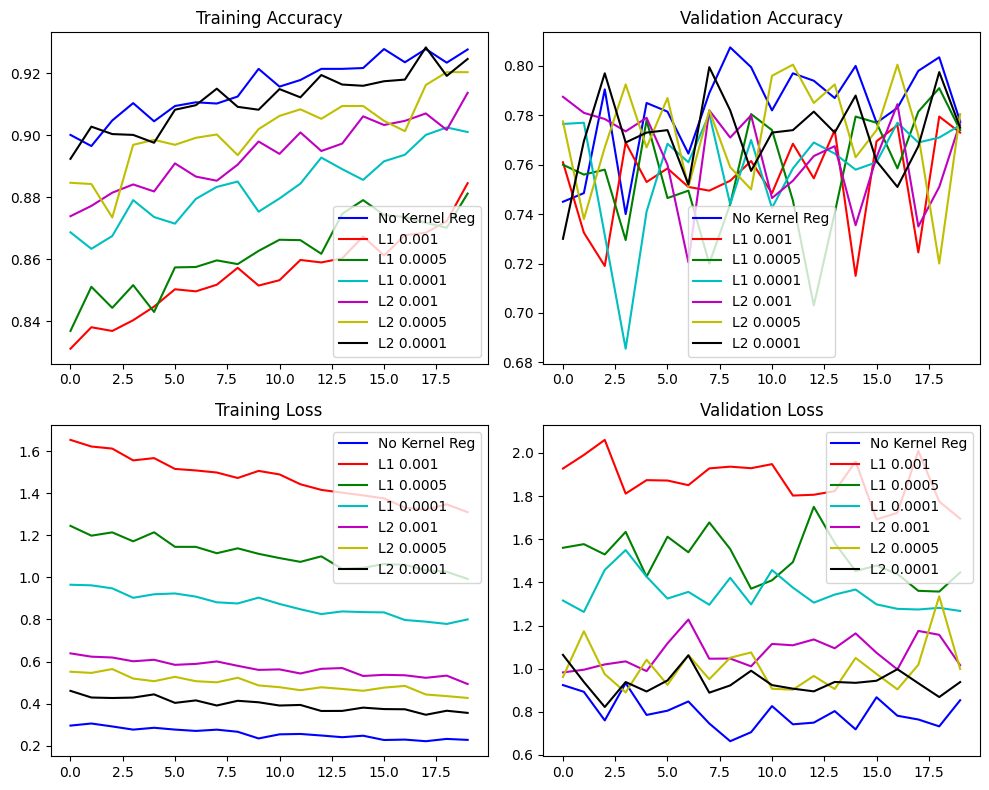

In [44]:
n=20
af1_acc = af1.history['acc'][-n:]
epochs = range(len(af1_acc) - n, len(af1_acc))

plt.figure(figsize=(10,8))
plt.subplot(2, 2, 1)
plt.plot(epochs, af1.history['acc'][-n:],'b',label='No Kernel Reg')
plt.plot(epochs, kr1.history['acc'][-n:],'r',label='L1 0.001')
plt.plot(epochs, kr2.history['acc'][-n:],'g',label='L1 0.0005')
plt.plot(epochs, kr3.history['acc'][-n:],'c',label='L1 0.0001')
plt.plot(epochs, kr4.history['acc'][-n:],'m',label='L2 0.001')
plt.plot(epochs, kr5.history['acc'][-n:],'y',label='L2 0.0005')
plt.plot(epochs, kr6.history['acc'][-n:],'k',label='L2 0.0001')
plt.title('Training Accuracy')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(epochs, af1.history['val_acc'][-n:],'b',label='No Kernel Reg')
plt.plot(epochs, kr1.history['val_acc'][-n:],'r',label='L1 0.001')
plt.plot(epochs, kr2.history['val_acc'][-n:],'g',label='L1 0.0005')
plt.plot(epochs, kr3.history['val_acc'][-n:],'c',label='L1 0.0001')
plt.plot(epochs, kr4.history['val_acc'][-n:],'m',label='L2 0.001')
plt.plot(epochs, kr5.history['val_acc'][-n:],'y',label='L2 0.0005')
plt.plot(epochs, kr6.history['val_acc'][-n:],'k',label='L2 0.0001')
plt.title('Validation Accuracy')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(epochs, af1.history['loss'][-n:],'b',label='No Kernel Reg')
plt.plot(epochs, kr1.history['loss'][-n:],'r',label='L1 0.001')
plt.plot(epochs, kr2.history['loss'][-n:],'g',label='L1 0.0005')
plt.plot(epochs, kr3.history['loss'][-n:],'c',label='L1 0.0001')
plt.plot(epochs, kr4.history['loss'][-n:],'m',label='L2 0.001')
plt.plot(epochs, kr5.history['loss'][-n:],'y',label='L2 0.0005')
plt.plot(epochs, kr6.history['loss'][-n:],'k',label='L2 0.0001')
plt.title('Training Loss')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(epochs, af1.history['val_loss'][-n:],'b',label='No Kernel Reg')
plt.plot(epochs, kr1.history['val_loss'][-n:],'r',label='L1 0.001')
plt.plot(epochs, kr2.history['val_loss'][-n:],'g',label='L1 0.0005')
plt.plot(epochs, kr3.history['val_loss'][-n:],'c',label='L1 0.0001')
plt.plot(epochs, kr4.history['val_loss'][-n:],'m',label='L2 0.001')
plt.plot(epochs, kr5.history['val_loss'][-n:],'y',label='L2 0.0005')
plt.plot(epochs, kr6.history['val_loss'][-n:],'k',label='L2 0.0001')
plt.title('Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

<b>Trying Spatial Dropout<b>

In [14]:
img_size = 150
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.35,
    zoom_range=0.35,
    horizontal_flip=True,)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [15]:
from tensorflow.keras.layers import SpatialDropout2D
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
af1_model = models.Sequential()
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
sd1_model = models.Sequential()

# input layer
sd1_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu, input_shape=(img_size, img_size, 3)))
sd1_model.add(layers.BatchNormalization())
sd1_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu))
sd1_model.add(layers.BatchNormalization())
sd1_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
sd1_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
sd1_model.add(layers.BatchNormalization())
sd1_model.add(SpatialDropout2D(0.25))
sd1_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
sd1_model.add(layers.BatchNormalization())
sd1_model.add(layers.MaxPooling2D((2, 2)))

sd1_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
sd1_model.add(layers.BatchNormalization())
sd1_model.add(SpatialDropout2D(0.25))
sd1_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
sd1_model.add(layers.BatchNormalization())
sd1_model.add(layers.MaxPooling2D((2, 2)))

sd1_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
sd1_model.add(layers.BatchNormalization())
sd1_model.add(SpatialDropout2D(0.25))
sd1_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
sd1_model.add(layers.BatchNormalization())
sd1_model.add(layers.MaxPooling2D((2, 2)))
# flatten
sd1_model.add(layers.Flatten())
# dense layer
#sd1_model.add(layers.Dense(256, kernel_regularizer=regularizers.l1_l2(l1=0.0001,l2=0.0001),activation=leaky_relu))
sd1_model.add(layers.Dense(256, activation=leaky_relu))
sd1_model.add(layers.BatchNormalization())
sd1_model.add(layers.Dropout(0.5))
#sd1_model.add(layers.Dense(256, kernel_regularizer=regularizers.l1_l2(l1=0.0001,l2=0.0001),activation=leaky_relu))
sd1_model.add(layers.Dense(256, activation=leaky_relu))
sd1_model.add(layers.BatchNormalization())
sd1_model.add(layers.Dropout(0.5))
# output layer
sd1_model.add(layers.Dense(10, activation='softmax'))

sd1_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

sd1_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_20 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_17 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_21 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 73, 73, 64)       0         
 2D)                                                             
                                                      

In [16]:
decay_factor = (0.0003 / 0.0007) ** (1 / 100)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
sd1 = sd1_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006940939463899672.
Epoch 1/100
234/234 [==============================] - 43s 178ms/step - loss: 3.0441 - acc: 0.1460 - val_loss: 3.2997 - val_acc: 0.1005 - lr: 6.9409e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.000688237736424744.
Epoch 2/100
234/234 [==============================] - 40s 171ms/step - loss: 2.4684 - acc: 0.2109 - val_loss: 2.0747 - val_acc: 0.2770 - lr: 6.8824e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006824309318281722.
Epoch 3/100
234/234 [==============================] - 41s 173ms/step - loss: 2.2196 - acc: 0.2457 - val_loss: 2.1766 - val_acc: 0.2845 - lr: 6.8243e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000676673128584387.
Epoch 4/100
234/234 [==============================] - 40s 168ms/step - loss: 2.0572 - acc: 0.2809 - val_loss: 2.2638 - val_acc: 0.2810 - lr: 6.7667e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00067096392


Epoch 36: LearningRateScheduler setting learning rate to 0.0005159723552313021.
Epoch 36/100
234/234 [==============================] - 39s 167ms/step - loss: 1.1383 - acc: 0.6116 - val_loss: 1.1034 - val_acc: 0.6165 - lr: 5.1597e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005116190265678524.
Epoch 37/100
234/234 [==============================] - 40s 168ms/step - loss: 1.1120 - acc: 0.6287 - val_loss: 1.0342 - val_acc: 0.6415 - lr: 5.1162e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005073024056315783.
Epoch 38/100
234/234 [==============================] - 39s 167ms/step - loss: 1.1077 - acc: 0.6300 - val_loss: 0.9839 - val_acc: 0.6615 - lr: 5.0730e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005030222038397192.
Epoch 39/100
234/234 [==============================] - 39s 167ms/step - loss: 1.0899 - acc: 0.6323 - val_loss: 1.0618 - val_acc: 0.6430 - lr: 5.0302e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.00038356111905472467.
Epoch 71/100
234/234 [==============================] - 39s 168ms/step - loss: 0.7414 - acc: 0.7484 - val_loss: 0.7764 - val_acc: 0.7365 - lr: 3.8356e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0003803249519749428.
Epoch 72/100
234/234 [==============================] - 40s 169ms/step - loss: 0.7237 - acc: 0.7569 - val_loss: 0.6488 - val_acc: 0.7805 - lr: 3.8032e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000377116084824334.
Epoch 73/100
234/234 [==============================] - 39s 168ms/step - loss: 0.7105 - acc: 0.7639 - val_loss: 0.6908 - val_acc: 0.7630 - lr: 3.7712e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.00037393428673668976.
Epoch 74/100
234/234 [==============================] - 40s 171ms/step - loss: 0.7070 - acc: 0.7680 - val_loss: 0.6424 - val_acc: 0.7960 - lr: 3.7393e-04

Epoch 75: LearningRateScheduler setting learning rate to 0

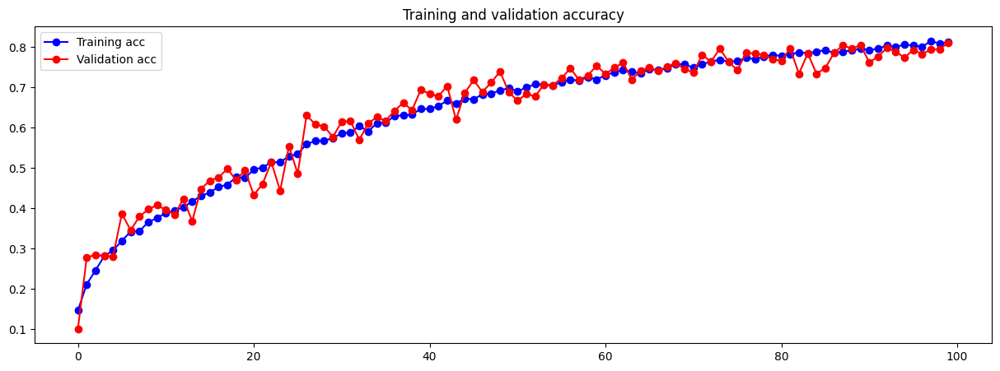

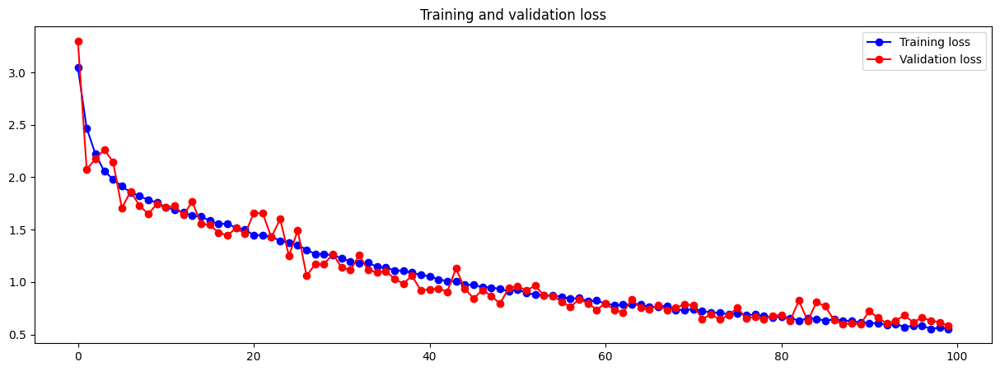

In [17]:
accloss(sd1)

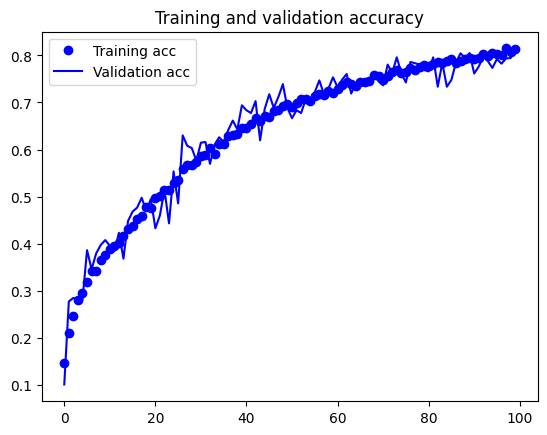

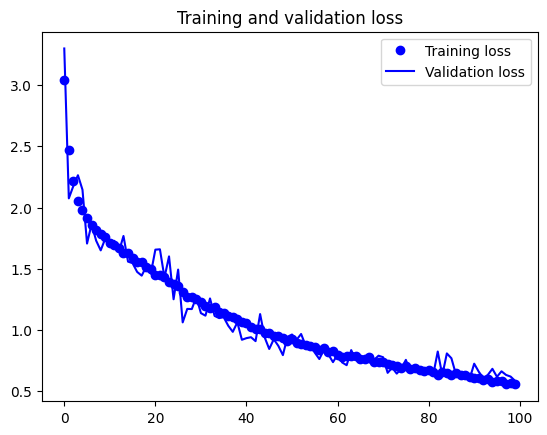

In [18]:
accloss1(sd1)

In [19]:
sd1_model.save('food_model_one_sd1.h5')

<b>Best Epoch<b>

In [13]:
from tensorflow.keras.layers import SpatialDropout2D
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
one_best_model = models.Sequential()

# input layer
one_best_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu, input_shape=(img_size, img_size, 3)))
one_best_model.add(layers.BatchNormalization())
one_best_model.add(layers.Conv2D(64, (3, 3), activation=leaky_relu))
one_best_model.add(layers.BatchNormalization())
one_best_model.add(layers.MaxPooling2D((2, 2)))

# hidden layers
one_best_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
one_best_model.add(layers.BatchNormalization())
one_best_model.add(SpatialDropout2D(0.3))
one_best_model.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
one_best_model.add(layers.BatchNormalization())
one_best_model.add(layers.MaxPooling2D((2, 2)))

one_best_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
one_best_model.add(layers.BatchNormalization())
one_best_model.add(SpatialDropout2D(0.3))
one_best_model.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
one_best_model.add(layers.BatchNormalization())
one_best_model.add(layers.MaxPooling2D((2, 2)))

one_best_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
one_best_model.add(layers.BatchNormalization())
one_best_model.add(SpatialDropout2D(0.3))
one_best_model.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
one_best_model.add(layers.BatchNormalization())
one_best_model.add(layers.MaxPooling2D((2, 2)))
# flatten
one_best_model.add(layers.Flatten())
# dense layer
one_best_model.add(layers.Dense(256, activation=leaky_relu))
one_best_model.add(layers.BatchNormalization())
one_best_model.add(layers.Dropout(0.5))
one_best_model.add(layers.Dense(256, activation=leaky_relu))
one_best_model.add(layers.BatchNormalization())
one_best_model.add(layers.Dropout(0.5))
# output layer
one_best_model.add(layers.Dense(10, activation='softmax'))

one_best_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

one_best_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_20 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_17 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_21 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 73, 73, 64)       0         
 2D)                                                             
                                                      

In [14]:
#from tensorflow.keras.callbacks import EarlyStopping

#early_stopping = EarlyStopping(monitor='val_acc', patience=10, restore_best_weights=True)

decay_factor = (0.0003 / 0.0007) ** (1 / 200)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
best = one_best_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=200,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006970407055178179.
Epoch 1/200
234/234 [==============================] - 43s 177ms/step - loss: 2.9403 - acc: 0.1520 - val_loss: 2.9345 - val_acc: 0.1205 - lr: 6.9704e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0006940939384655067.
Epoch 2/200
234/234 [==============================] - 41s 174ms/step - loss: 2.4442 - acc: 0.2111 - val_loss: 2.2141 - val_acc: 0.2205 - lr: 6.9409e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006911596331542703.
Epoch 3/200
234/234 [==============================] - 40s 172ms/step - loss: 2.2455 - acc: 0.2403 - val_loss: 2.0624 - val_acc: 0.3030 - lr: 6.9116e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0006882377316225225.
Epoch 4/200
234/234 [==============================] - 41s 172ms/step - loss: 2.0625 - acc: 0.2797 - val_loss: 2.1181 - val_acc: 0.3095 - lr: 6.8824e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.000685328


Epoch 36: LearningRateScheduler setting learning rate to 0.0006009828811180805.
Epoch 36/200
234/234 [==============================] - 41s 173ms/step - loss: 1.1829 - acc: 0.5969 - val_loss: 1.1022 - val_acc: 0.6260 - lr: 6.0098e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005984421929400512.
Epoch 37/200
234/234 [==============================] - 41s 174ms/step - loss: 1.1677 - acc: 0.6109 - val_loss: 1.1624 - val_acc: 0.6150 - lr: 5.9844e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005959122856170913.
Epoch 38/200
234/234 [==============================] - 41s 175ms/step - loss: 1.1560 - acc: 0.6080 - val_loss: 1.1153 - val_acc: 0.6130 - lr: 5.9591e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005933930432260281.
Epoch 39/200
234/234 [==============================] - 41s 172ms/step - loss: 1.1282 - acc: 0.6235 - val_loss: 1.3219 - val_acc: 0.5720 - lr: 5.9339e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.0005181626136271176.
Epoch 71/200
234/234 [==============================] - 41s 172ms/step - loss: 0.8367 - acc: 0.7193 - val_loss: 0.7604 - val_acc: 0.7425 - lr: 5.1816e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0005159720713924992.
Epoch 72/200
234/234 [==============================] - 41s 173ms/step - loss: 0.8121 - acc: 0.7260 - val_loss: 0.7997 - val_acc: 0.7370 - lr: 5.1597e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000513790803011704.
Epoch 73/200
234/234 [==============================] - 40s 172ms/step - loss: 0.7957 - acc: 0.7304 - val_loss: 0.7335 - val_acc: 0.7605 - lr: 5.1379e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.0005116187505231456.
Epoch 74/200
234/234 [==============================] - 43s 182ms/step - loss: 0.7894 - acc: 0.7388 - val_loss: 0.8884 - val_acc: 0.6935 - lr: 5.1162e-04

Epoch 75: LearningRateScheduler setting learning rate to 0.0


Epoch 106: LearningRateScheduler setting learning rate to 0.0004467557359979123.
Epoch 106/200
234/234 [==============================] - 41s 175ms/step - loss: 0.6316 - acc: 0.7901 - val_loss: 0.6054 - val_acc: 0.8005 - lr: 4.4676e-04

Epoch 107: LearningRateScheduler setting learning rate to 0.00044486705770523804.
Epoch 107/200
234/234 [==============================] - 41s 173ms/step - loss: 0.6198 - acc: 0.7895 - val_loss: 0.6644 - val_acc: 0.7765 - lr: 4.4487e-04

Epoch 108: LearningRateScheduler setting learning rate to 0.0004429863781114862.
Epoch 108/200
234/234 [==============================] - 41s 175ms/step - loss: 0.6293 - acc: 0.7873 - val_loss: 0.5909 - val_acc: 0.8080 - lr: 4.4299e-04

Epoch 109: LearningRateScheduler setting learning rate to 0.0004411136392550705.
Epoch 109/200
234/234 [==============================] - 41s 174ms/step - loss: 0.6247 - acc: 0.7897 - val_loss: 0.6418 - val_acc: 0.7910 - lr: 4.4111e-04

Epoch 110: LearningRateScheduler setting learning 


Epoch 175: LearningRateScheduler setting learning rate to 0.0003335171700053763.
Epoch 175/200
234/234 [==============================] - 41s 174ms/step - loss: 0.4252 - acc: 0.8551 - val_loss: 0.5976 - val_acc: 0.8080 - lr: 3.3352e-04

Epoch 176: LearningRateScheduler setting learning rate to 0.0003321072254355298.
Epoch 176/200
234/234 [==============================] - 41s 173ms/step - loss: 0.4149 - acc: 0.8595 - val_loss: 0.6424 - val_acc: 0.8025 - lr: 3.3211e-04

Epoch 177: LearningRateScheduler setting learning rate to 0.00033070322192828874.
Epoch 177/200
234/234 [==============================] - 41s 175ms/step - loss: 0.4077 - acc: 0.8656 - val_loss: 0.6485 - val_acc: 0.8015 - lr: 3.3070e-04

Epoch 178: LearningRateScheduler setting learning rate to 0.0003293051594836532.
Epoch 178/200
234/234 [==============================] - 41s 174ms/step - loss: 0.4338 - acc: 0.8552 - val_loss: 0.6006 - val_acc: 0.8210 - lr: 3.2931e-04

Epoch 179: LearningRateScheduler setting learning 

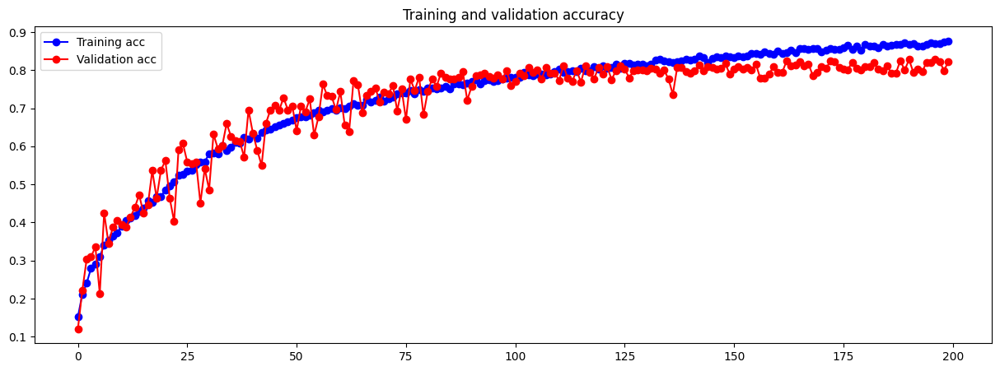

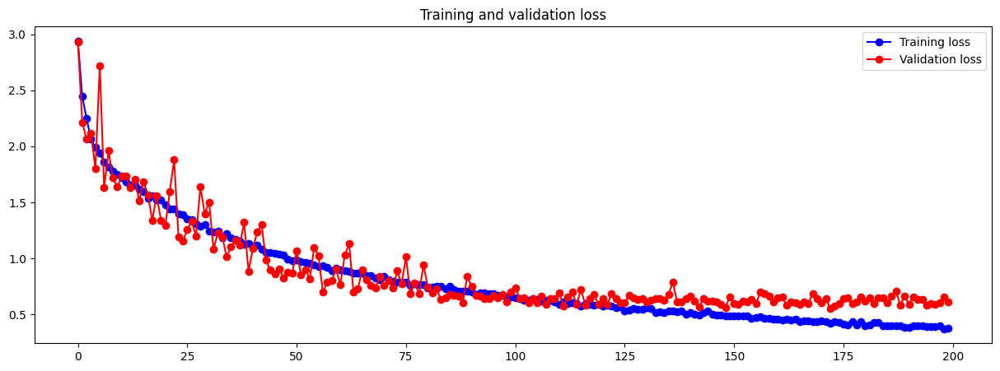

In [15]:
accloss(best)

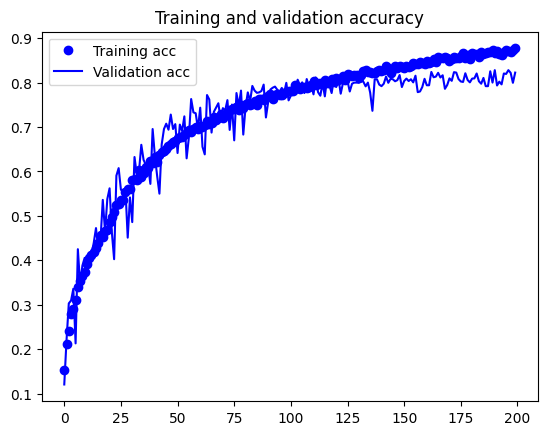

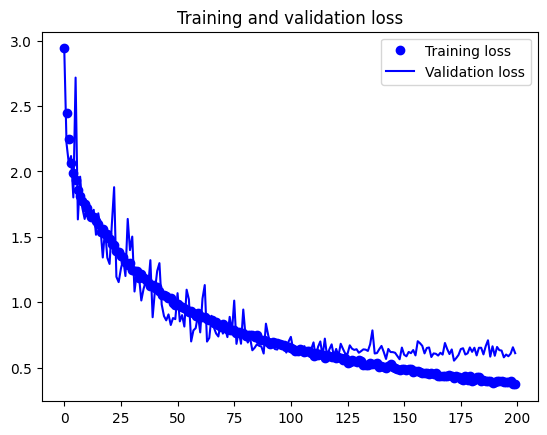

In [16]:
accloss1(best)

In [17]:
one_best_model.save('food_model_one_200epoch.h5')

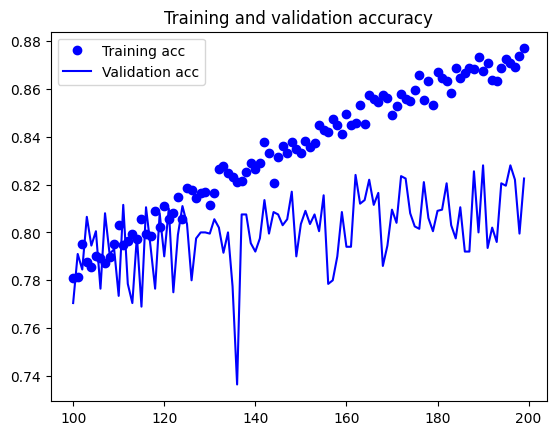

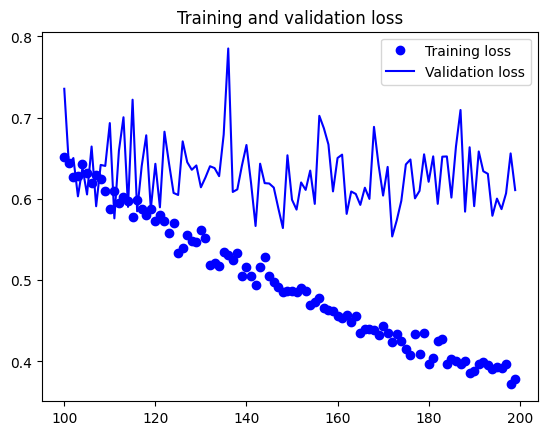

In [18]:
best_acc = best.history['acc']
epochs = range(len(best_acc))

num_epochs_to_plot = 100

# Update epochs to only include the last 20 epochs
epochs_to_plot = range(len(best_acc) - num_epochs_to_plot, len(best_acc))

acc = best.history['acc'][-num_epochs_to_plot:]
val_acc = best.history['val_acc'][-num_epochs_to_plot:]
loss = best.history['loss'][-num_epochs_to_plot:]
val_loss = best.history['val_loss'][-num_epochs_to_plot:]

epochs = range(len(acc))

plt.plot(epochs_to_plot, acc, 'bo', label='Training acc')
plt.plot(epochs_to_plot, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_to_plot, loss, 'bo', label='Training loss')
plt.plot(epochs_to_plot, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()


<b>Final Built from Scratch Model<b>

In [19]:
from tensorflow.keras.layers import SpatialDropout2D
leaky_relu = LeakyReLU(alpha=0.001)

# Build the Model
final_model_one = models.Sequential()

# input layer
final_model_one.add(layers.Conv2D(64, (3, 3), activation=leaky_relu, input_shape=(img_size, img_size, 3)))
final_model_one.add(layers.BatchNormalization())
final_model_one.add(layers.Conv2D(64, (3, 3), activation=leaky_relu))
final_model_one.add(layers.BatchNormalization())
final_model_one.add(layers.MaxPooling2D((2, 2)))

# hidden layers
final_model_one.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
final_model_one.add(layers.BatchNormalization())
final_model_one.add(SpatialDropout2D(0.3))
final_model_one.add(layers.Conv2D(128, (3, 3), activation=leaky_relu))
final_model_one.add(layers.BatchNormalization())
final_model_one.add(layers.MaxPooling2D((2, 2)))

final_model_one.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
final_model_one.add(layers.BatchNormalization())
final_model_one.add(SpatialDropout2D(0.3))
final_model_one.add(layers.Conv2D(256, (3, 3), activation=leaky_relu))
final_model_one.add(layers.BatchNormalization())
final_model_one.add(layers.MaxPooling2D((2, 2)))

final_model_one.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
final_model_one.add(layers.BatchNormalization())
final_model_one.add(SpatialDropout2D(0.3))
final_model_one.add(layers.Conv2D(512, (3, 3), activation=leaky_relu))
final_model_one.add(layers.BatchNormalization())
final_model_one.add(layers.MaxPooling2D((2, 2)))
# flatten
final_model_one.add(layers.Flatten())
# dense layer
final_model_one.add(layers.Dense(256, activation=leaky_relu))
final_model_one.add(layers.BatchNormalization())
final_model_one.add(layers.Dropout(0.5))
final_model_one.add(layers.Dense(256, activation=leaky_relu))
final_model_one.add(layers.BatchNormalization())
final_model_one.add(layers.Dropout(0.5))
# output layer
final_model_one.add(layers.Dense(10, activation='softmax'))

final_model_one.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=7*1e-4),
              metrics=['acc'])

final_model_one.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_30 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_25 (Conv2D)          (None, 146, 146, 64)      36928     
                                                                 
 batch_normalization_31 (Bat  (None, 146, 146, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 73, 73, 64)       0         
 g2D)                                                            
                                                      

In [20]:
decay_factor = (0.0003 / 0.0007) ** (1 / 200)
def lr_scheduler(epoch, lr):
    new_learning_rate = lr * decay_factor
    return new_learning_rate

lr_decay_callback = LearningRateScheduler(lr_scheduler,verbose=1)
train_generator.reset();
validation_generator.reset();
# Train the Model
final_one = final_model_one.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=163,
      validation_data=validation_generator,
      validation_steps=2000/32,
      callbacks=[lr_decay_callback]) 


Epoch 1: LearningRateScheduler setting learning rate to 0.0006970407055178179.
Epoch 1/163
234/234 [==============================] - 76s 319ms/step - loss: 2.9958 - acc: 0.1593 - val_loss: 4.1425 - val_acc: 0.1000 - lr: 6.9704e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0006940939384655067.
Epoch 2/163
234/234 [==============================] - 40s 169ms/step - loss: 2.4511 - acc: 0.2081 - val_loss: 2.2876 - val_acc: 0.2250 - lr: 6.9409e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006911596331542703.
Epoch 3/163
234/234 [==============================] - 40s 169ms/step - loss: 2.2562 - acc: 0.2425 - val_loss: 2.0669 - val_acc: 0.3105 - lr: 6.9116e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0006882377316225225.
Epoch 4/163
234/234 [==============================] - 39s 168ms/step - loss: 2.0854 - acc: 0.2659 - val_loss: 2.3253 - val_acc: 0.2835 - lr: 6.8824e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.000685328


Epoch 36: LearningRateScheduler setting learning rate to 0.0006009828811180805.
Epoch 36/163
234/234 [==============================] - 40s 168ms/step - loss: 1.1870 - acc: 0.6044 - val_loss: 1.1286 - val_acc: 0.6080 - lr: 6.0098e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0005984421929400512.
Epoch 37/163
234/234 [==============================] - 40s 169ms/step - loss: 1.2083 - acc: 0.5981 - val_loss: 0.9571 - val_acc: 0.6725 - lr: 5.9844e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005959122856170913.
Epoch 38/163
234/234 [==============================] - 39s 167ms/step - loss: 1.1361 - acc: 0.6179 - val_loss: 0.9823 - val_acc: 0.6700 - lr: 5.9591e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005933930432260281.
Epoch 39/163
234/234 [==============================] - 40s 169ms/step - loss: 1.1677 - acc: 0.6080 - val_loss: 0.9317 - val_acc: 0.6820 - lr: 5.9339e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.


Epoch 71: LearningRateScheduler setting learning rate to 0.0005181626136271176.
Epoch 71/163
234/234 [==============================] - 40s 169ms/step - loss: 0.8178 - acc: 0.7305 - val_loss: 0.7287 - val_acc: 0.7565 - lr: 5.1816e-04

Epoch 72: LearningRateScheduler setting learning rate to 0.0005159720713924992.
Epoch 72/163
234/234 [==============================] - 39s 168ms/step - loss: 0.8037 - acc: 0.7357 - val_loss: 0.7751 - val_acc: 0.7380 - lr: 5.1597e-04

Epoch 73: LearningRateScheduler setting learning rate to 0.000513790803011704.
Epoch 73/163
234/234 [==============================] - 40s 169ms/step - loss: 0.7930 - acc: 0.7353 - val_loss: 0.7813 - val_acc: 0.7410 - lr: 5.1379e-04

Epoch 74: LearningRateScheduler setting learning rate to 0.0005116187505231456.
Epoch 74/163
234/234 [==============================] - 39s 168ms/step - loss: 0.7895 - acc: 0.7368 - val_loss: 0.7808 - val_acc: 0.7450 - lr: 5.1162e-04

Epoch 75: LearningRateScheduler setting learning rate to 0.0


Epoch 106: LearningRateScheduler setting learning rate to 0.0004467557359979123.
Epoch 106/163
234/234 [==============================] - 39s 167ms/step - loss: 0.6443 - acc: 0.7820 - val_loss: 0.6047 - val_acc: 0.7945 - lr: 4.4676e-04

Epoch 107: LearningRateScheduler setting learning rate to 0.00044486705770523804.
Epoch 107/163
234/234 [==============================] - 39s 168ms/step - loss: 0.6268 - acc: 0.7887 - val_loss: 0.6669 - val_acc: 0.7785 - lr: 4.4487e-04

Epoch 108: LearningRateScheduler setting learning rate to 0.0004429863781114862.
Epoch 108/163
234/234 [==============================] - 39s 167ms/step - loss: 0.6344 - acc: 0.7873 - val_loss: 0.7779 - val_acc: 0.7490 - lr: 4.4299e-04

Epoch 109: LearningRateScheduler setting learning rate to 0.0004411136392550705.
Epoch 109/163
234/234 [==============================] - 40s 169ms/step - loss: 0.6222 - acc: 0.7881 - val_loss: 0.6563 - val_acc: 0.7755 - lr: 4.4111e-04

Epoch 110: LearningRateScheduler setting learning 

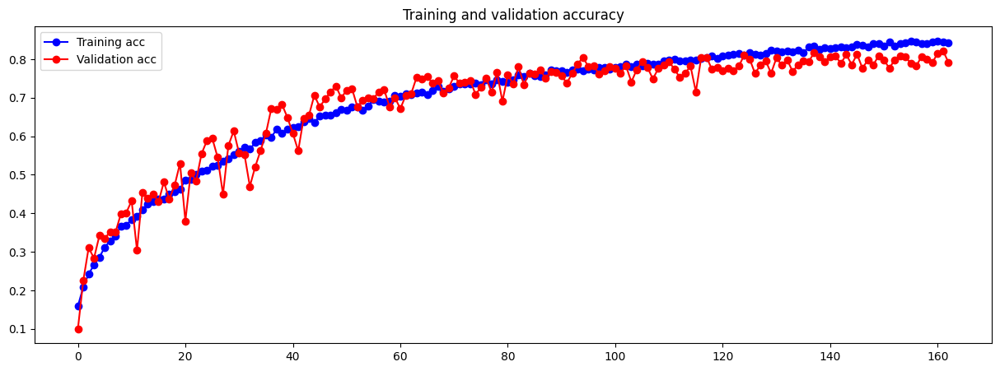

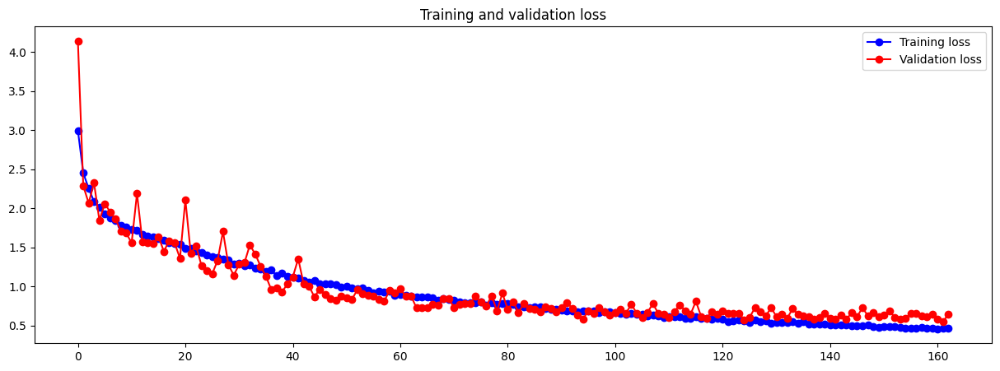

In [21]:
accloss(final_one)

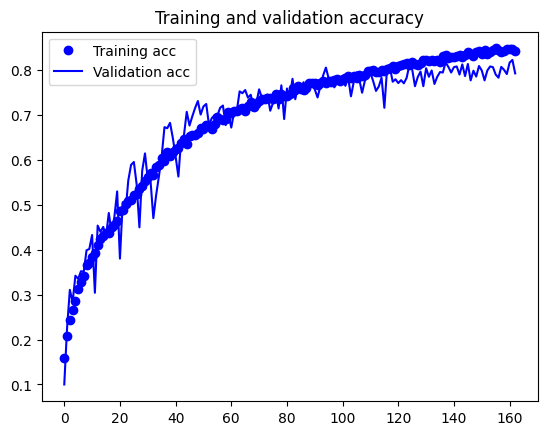

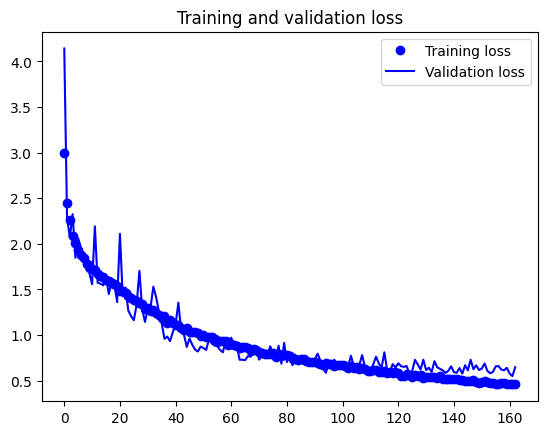

In [22]:
accloss1(final_one)

In [23]:
final_model_one.save('food_model_one_final.h5')

### Model #2

In [6]:
from tensorflow.keras.applications import VGG16

In [31]:
img_size = 224
conv_base = VGG16(weights='imagenet', include_top = False, input_shape=(img_size, img_size, 3))
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [5]:
img_size = 224
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='categorical'  
)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


<b>VGG16 Model 1 - baseline<b>

In [33]:
conv_base.trainable = False
for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_8 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 False
16 block5_conv2 False
17 block5_conv3 False
18 block5_pool False


In [34]:
vgg_model = models.Sequential()
vgg_model.add(conv_base)
vgg_model.add(layers.Flatten())
vgg_model.add(layers.Dense(256, activation='relu'))
vgg_model.add(layers.Dense(10, activation='softmax'))
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-5),
              metrics=['acc'])
vgg_model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_7 (Flatten)         (None, 25088)             0         
                                                                 
 dense_19 (Dense)            (None, 256)               6422784   
                                                                 
 dense_20 (Dense)            (None, 10)                2570      
                                                                 
Total params: 21,140,042
Trainable params: 6,425,354
Non-trainable params: 14,714,688
_________________________________________________________________


In [35]:
vgg1 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=30,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/30
234/234 [==============================] - 70s 297ms/step - loss: 2.0419 - acc: 0.2873 - val_loss: 1.7068 - val_acc: 0.4510
Epoch 2/30
234/234 [==============================] - 69s 294ms/step - loss: 1.6257 - acc: 0.4607 - val_loss: 1.4347 - val_acc: 0.5355
Epoch 3/30
234/234 [==============================] - 67s 286ms/step - loss: 1.4522 - acc: 0.5237 - val_loss: 1.3173 - val_acc: 0.5675
Epoch 4/30
234/234 [==============================] - 67s 286ms/step - loss: 1.3444 - acc: 0.5612 - val_loss: 1.2493 - val_acc: 0.5545
Epoch 5/30
234/234 [==============================] - 67s 286ms/step - loss: 1.2784 - acc: 0.5773 - val_loss: 1.1997 - val_acc: 0.5815
Epoch 6/30
234/234 [==============================] - 67s 285ms/step - loss: 1.2232 - acc: 0.5944 - val_loss: 1.1427 - val_acc: 0.6030
Epoch 7/30
234/234 [==============================] - 67s 286ms/step - loss: 1.1995 - acc: 0.5995 - val_loss: 1.1046 - val_acc: 0.6255
Epoch 8/30
234/234 [==============================] - 6

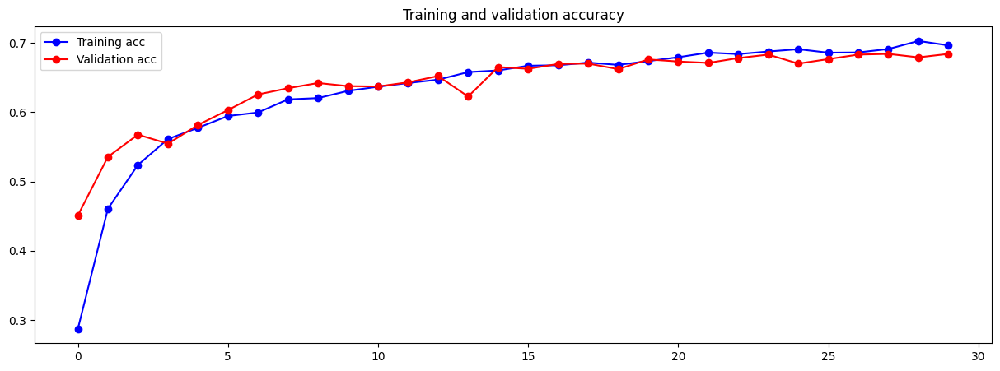

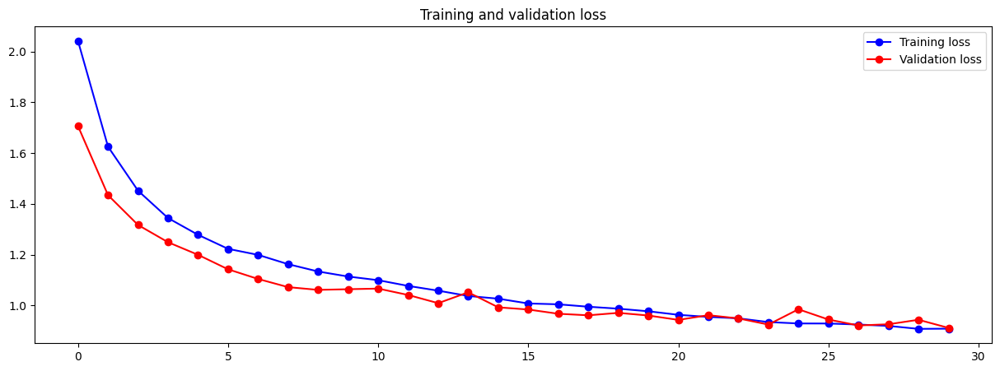

In [36]:
accloss(vgg1)

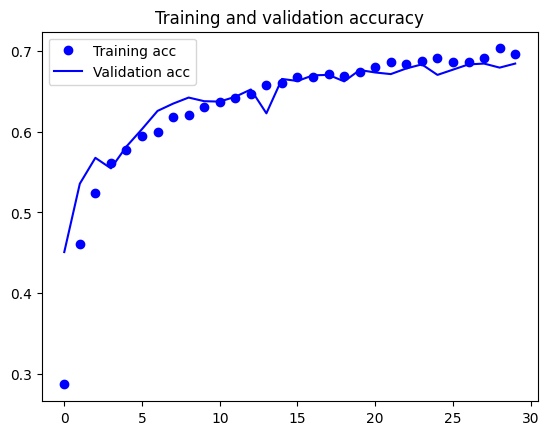

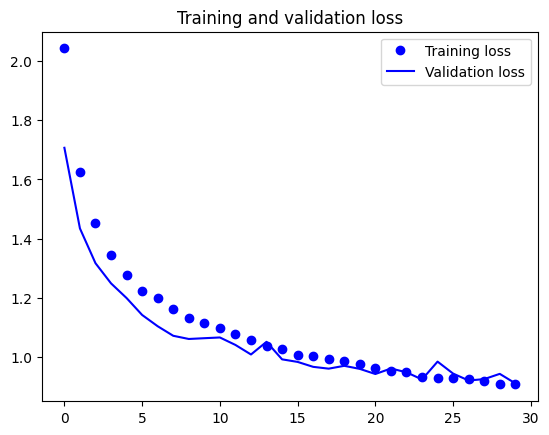

In [37]:
accloss1(vgg1)

In [38]:
vgg_model.save('food_model_two_vgg1.h5')

<b>Unfreeze 5th block<b>

In [39]:
conv_base.trainable = True
for layer in conv_base.layers[:15]:
    layer.trainable = False

for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_8 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 True
16 block5_conv2 True
17 block5_conv3 True
18 block5_pool True


In [40]:
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-5),
              metrics=['acc'])

train_generator.reset();
validation_generator.reset();
vgg1 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=30,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/30
234/234 [==============================] - 69s 285ms/step - loss: 0.8692 - acc: 0.7063 - val_loss: 0.8567 - val_acc: 0.7115
Epoch 2/30
234/234 [==============================] - 68s 288ms/step - loss: 0.8080 - acc: 0.7185 - val_loss: 0.8120 - val_acc: 0.7245
Epoch 3/30
234/234 [==============================] - 67s 284ms/step - loss: 0.7385 - acc: 0.7488 - val_loss: 0.7843 - val_acc: 0.7310
Epoch 4/30
234/234 [==============================] - 67s 284ms/step - loss: 0.7017 - acc: 0.7593 - val_loss: 0.7702 - val_acc: 0.7500
Epoch 5/30
234/234 [==============================] - 67s 285ms/step - loss: 0.6756 - acc: 0.7683 - val_loss: 0.7460 - val_acc: 0.7510
Epoch 6/30
234/234 [==============================] - 67s 285ms/step - loss: 0.6320 - acc: 0.7873 - val_loss: 0.7173 - val_acc: 0.7560
Epoch 7/30
234/234 [==============================] - 67s 284ms/step - loss: 0.5966 - acc: 0.7965 - val_loss: 0.7334 - val_acc: 0.7635
Epoch 8/30
234/234 [==============================] - 6

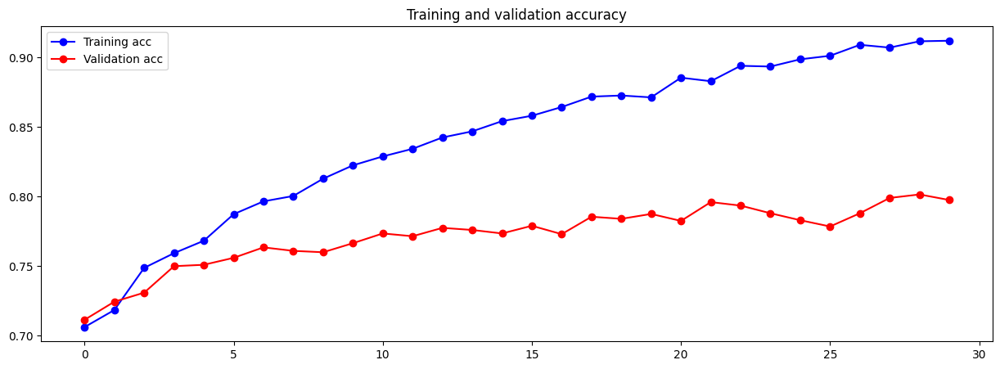

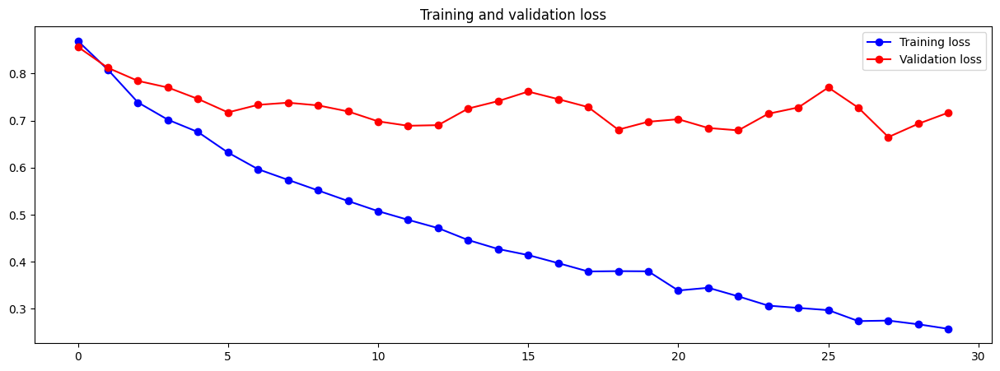

In [41]:
accloss(vgg1)

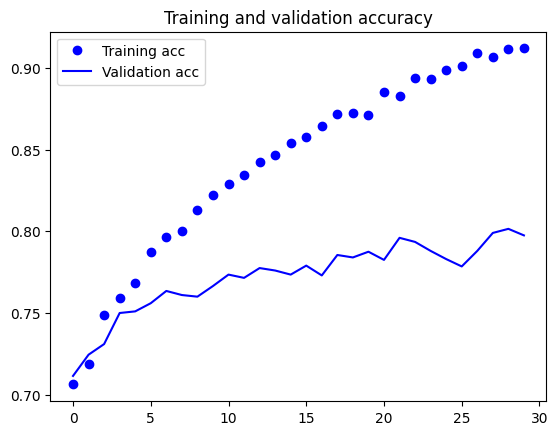

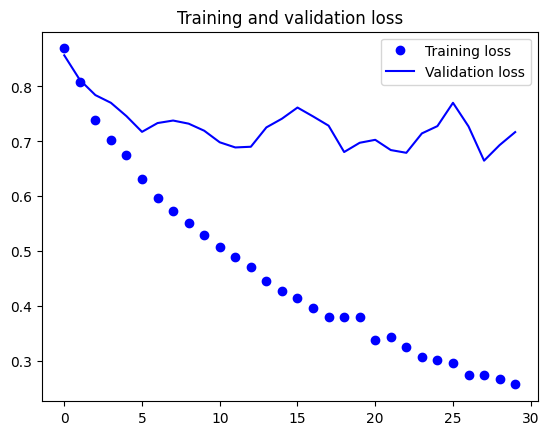

In [42]:
accloss1(vgg1)

In [43]:
vgg_model.save('food_model_two_vgg1.h5')

<b>VGG16 Model 2 - adding dropouts<b>

In [44]:
img_size = 224
conv_base = VGG16(weights='imagenet', include_top = False, input_shape=(img_size, img_size, 3))
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [45]:
conv_base.trainable = False
for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_9 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 False
16 block5_conv2 False
17 block5_conv3 False
18 block5_pool False


In [46]:
vgg_model = models.Sequential()
vgg_model.add(conv_base)
vgg_model.add(layers.Flatten())
vgg_model.add(layers.Dense(256, activation='relu'))
vgg_model.add(layers.Dropout(0.5))
vgg_model.add(layers.Dense(10, activation='softmax'))
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-5),
              metrics=['acc'])
vgg_model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_8 (Flatten)         (None, 25088)             0         
                                                                 
 dense_21 (Dense)            (None, 256)               6422784   
                                                                 
 dropout_12 (Dropout)        (None, 256)               0         
                                                                 
 dense_22 (Dense)            (None, 10)                2570      
                                                                 
Total params: 21,140,042
Trainable params: 6,425,354
Non-trainable params: 14,714,688
_________________________________________________________________


In [47]:
vgg2 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=50,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/50
234/234 [==============================] - 69s 291ms/step - loss: 2.2642 - acc: 0.1816 - val_loss: 1.9105 - val_acc: 0.3840
Epoch 2/50
234/234 [==============================] - 67s 285ms/step - loss: 1.9301 - acc: 0.3196 - val_loss: 1.6630 - val_acc: 0.4655
Epoch 3/50
234/234 [==============================] - 67s 284ms/step - loss: 1.7685 - acc: 0.3856 - val_loss: 1.5167 - val_acc: 0.5050
Epoch 4/50
234/234 [==============================] - 67s 285ms/step - loss: 1.6668 - acc: 0.4225 - val_loss: 1.4048 - val_acc: 0.5555
Epoch 5/50
234/234 [==============================] - 67s 284ms/step - loss: 1.5907 - acc: 0.4528 - val_loss: 1.3317 - val_acc: 0.5705
Epoch 6/50
234/234 [==============================] - 68s 288ms/step - loss: 1.5467 - acc: 0.4696 - val_loss: 1.2895 - val_acc: 0.5735
Epoch 7/50
234/234 [==============================] - 67s 288ms/step - loss: 1.4939 - acc: 0.4907 - val_loss: 1.2562 - val_acc: 0.5845
Epoch 8/50
234/234 [==============================] - 6

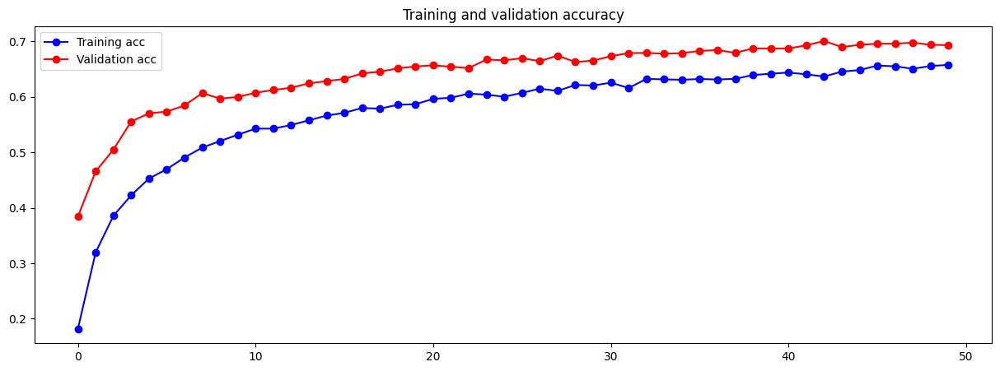

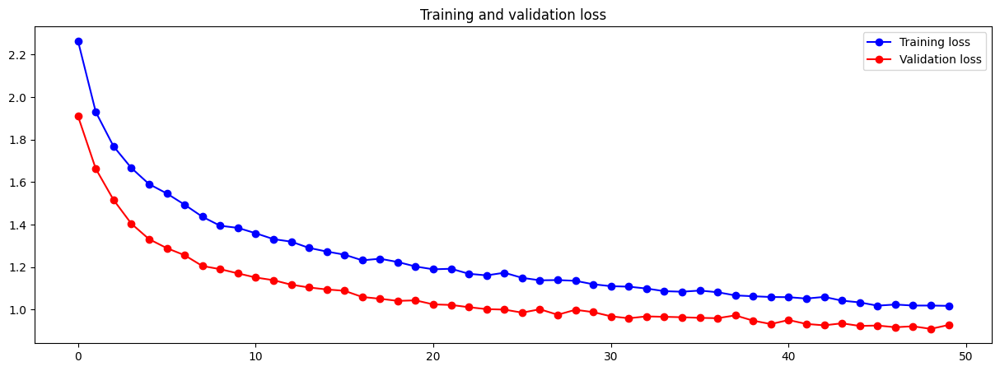

In [48]:
accloss(vgg2)

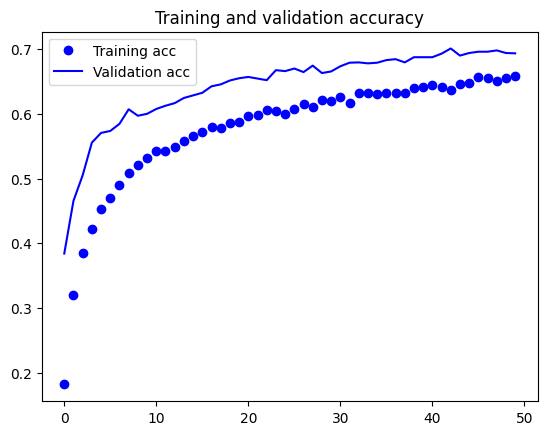

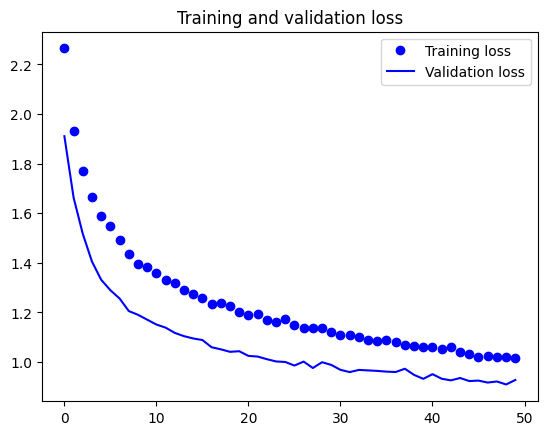

In [49]:
accloss1(vgg2)

In [50]:
vgg_model.save('food_model_two_vgg2.h5')

<b>Unfreeze 5th block<b>

In [51]:
conv_base.trainable = True
for layer in conv_base.layers[:15]:
    layer.trainable = False

for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_9 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 True
16 block5_conv2 True
17 block5_conv3 True
18 block5_pool True


In [52]:
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-5),
              metrics=['acc'])

train_generator.reset();
validation_generator.reset();
vgg2 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=30,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/30
234/234 [==============================] - 68s 286ms/step - loss: 0.9948 - acc: 0.6587 - val_loss: 0.8678 - val_acc: 0.7095
Epoch 2/30
234/234 [==============================] - 68s 288ms/step - loss: 0.8957 - acc: 0.6895 - val_loss: 0.8185 - val_acc: 0.7195
Epoch 3/30
234/234 [==============================] - 68s 288ms/step - loss: 0.8487 - acc: 0.7116 - val_loss: 0.7997 - val_acc: 0.7335
Epoch 4/30
234/234 [==============================] - 70s 300ms/step - loss: 0.8180 - acc: 0.7220 - val_loss: 0.7655 - val_acc: 0.7465
Epoch 5/30
234/234 [==============================] - 67s 285ms/step - loss: 0.7788 - acc: 0.7367 - val_loss: 0.7539 - val_acc: 0.7525
Epoch 6/30
234/234 [==============================] - 67s 284ms/step - loss: 0.7493 - acc: 0.7512 - val_loss: 0.7514 - val_acc: 0.7455
Epoch 7/30
234/234 [==============================] - 67s 285ms/step - loss: 0.7120 - acc: 0.7576 - val_loss: 0.7546 - val_acc: 0.7540
Epoch 8/30
234/234 [==============================] - 6

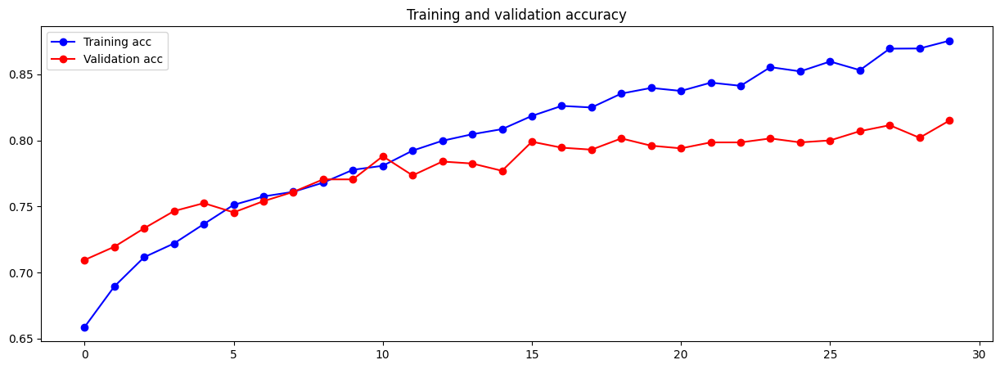

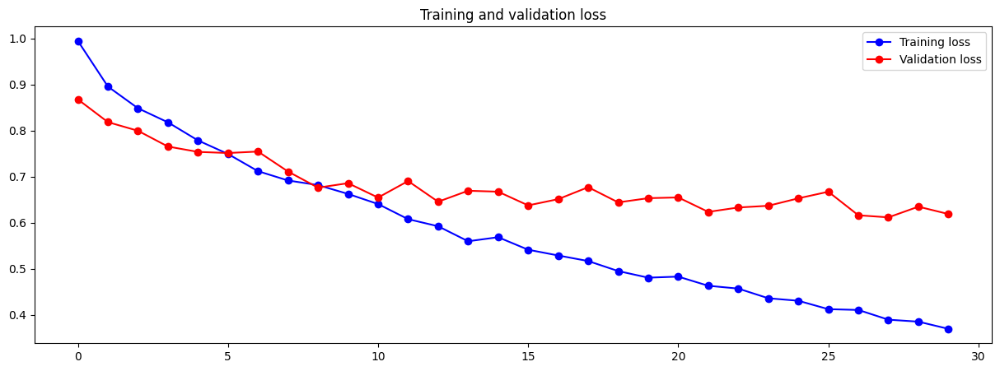

In [53]:
accloss(vgg2)

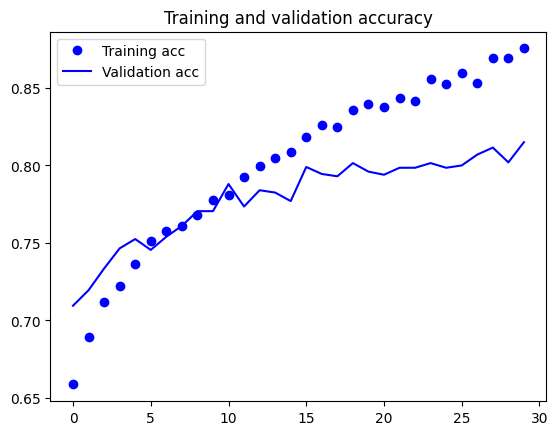

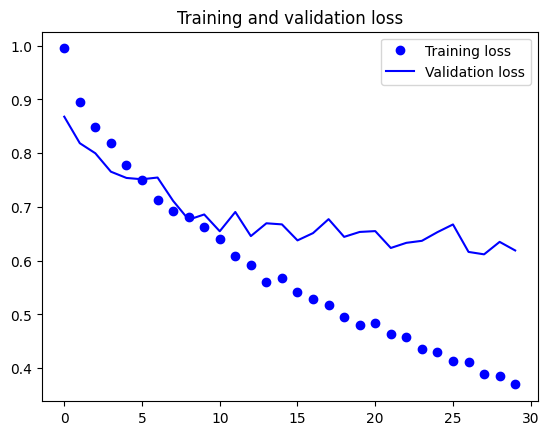

In [54]:
accloss1(vgg2)

In [55]:
vgg_model.save('food_model_two_vgg2.h5')

<b>VGG16 Model 3 - unfreeze 4th block<b>

In [113]:
img_size = 224
conv_base = VGG16(weights='imagenet', include_top = False, input_shape=(img_size, img_size, 3))
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_18 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [114]:
conv_base.trainable = False
for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_18 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 False
16 block5_conv2 False
17 block5_conv3 False
18 block5_pool False


In [115]:
vgg_model = models.Sequential()
vgg_model.add(conv_base)
vgg_model.add(layers.Flatten())
vgg_model.add(layers.Dense(256, activation='relu'))
vgg_model.add(layers.Dropout(0.5))
vgg_model.add(layers.Dense(10, activation='softmax'))
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-5),
              metrics=['acc'])
vgg_model.summary()

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_17 (Flatten)        (None, 25088)             0         
                                                                 
 dense_38 (Dense)            (None, 256)               6422784   
                                                                 
 dropout_21 (Dropout)        (None, 256)               0         
                                                                 
 dense_39 (Dense)            (None, 10)                2570      
                                                                 
Total params: 21,140,042
Trainable params: 6,425,354
Non-trainable params: 14,714,688
_________________________________________________________________


In [116]:
vgg3 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=50,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/50
234/234 [==============================] - 70s 298ms/step - loss: 2.2370 - acc: 0.1880 - val_loss: 1.9418 - val_acc: 0.3420
Epoch 2/50
234/234 [==============================] - 67s 286ms/step - loss: 1.9543 - acc: 0.2984 - val_loss: 1.6714 - val_acc: 0.4760
Epoch 3/50
234/234 [==============================] - 68s 288ms/step - loss: 1.7781 - acc: 0.3769 - val_loss: 1.5236 - val_acc: 0.5240
Epoch 4/50
234/234 [==============================] - 67s 287ms/step - loss: 1.6658 - acc: 0.4149 - val_loss: 1.4185 - val_acc: 0.5425
Epoch 5/50
234/234 [==============================] - 68s 290ms/step - loss: 1.5980 - acc: 0.4452 - val_loss: 1.3519 - val_acc: 0.5540
Epoch 6/50
234/234 [==============================] - 68s 290ms/step - loss: 1.5408 - acc: 0.4656 - val_loss: 1.2861 - val_acc: 0.5785
Epoch 7/50
234/234 [==============================] - 68s 288ms/step - loss: 1.4911 - acc: 0.4896 - val_loss: 1.2593 - val_acc: 0.5770
Epoch 8/50
234/234 [==============================] - 6

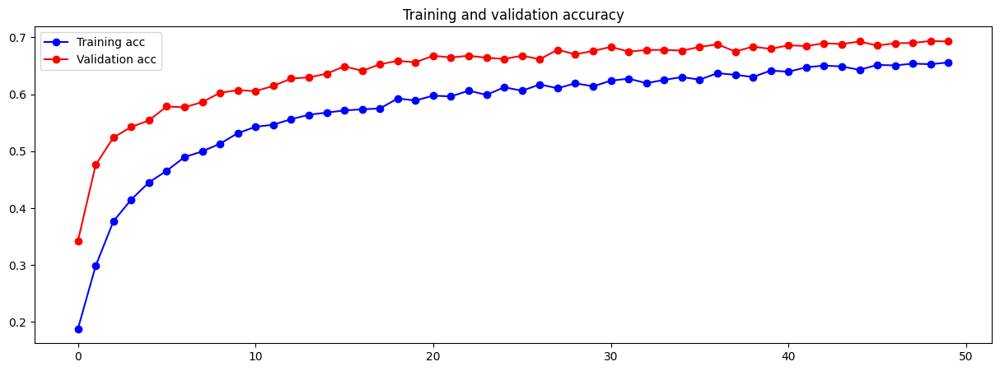

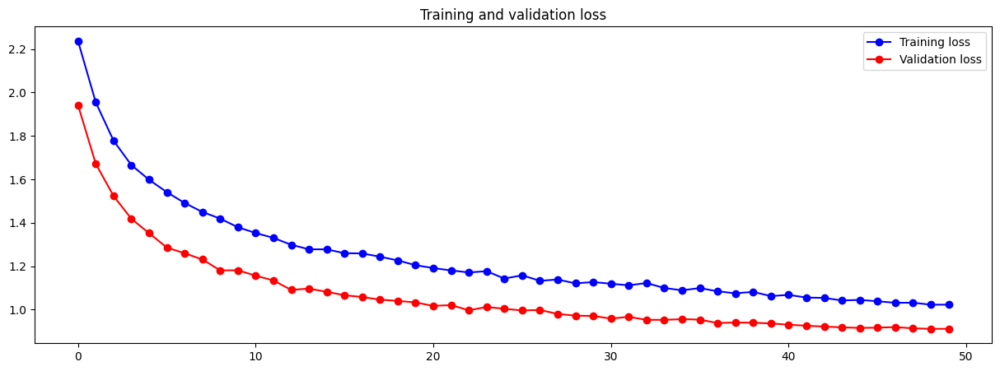

In [117]:
accloss(vgg3)

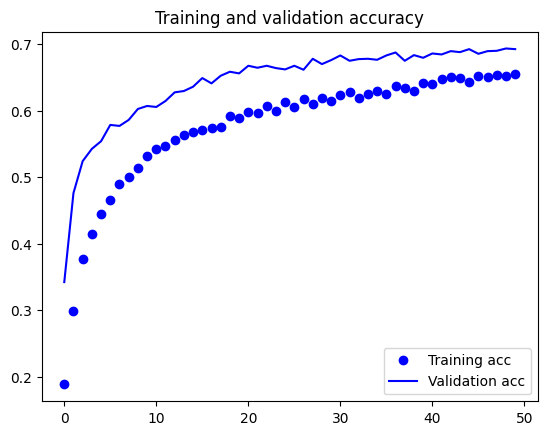

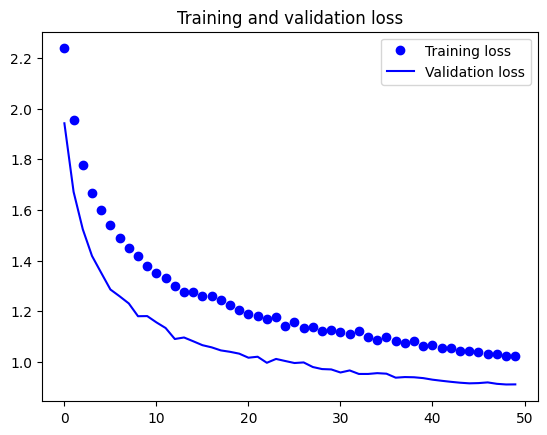

In [118]:
accloss1(vgg3)

In [119]:
vgg_model.save('food_model_two_vgg3.h5')

<b>Unfreeze 4th & 5th block<b>

In [120]:
conv_base.trainable = True
for layer in conv_base.layers[:11]:
    layer.trainable = False

for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_18 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 True
12 block4_conv2 True
13 block4_conv3 True
14 block4_pool True
15 block5_conv1 True
16 block5_conv2 True
17 block5_conv3 True
18 block5_pool True


In [121]:
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-5),
              metrics=['acc'])

train_generator.reset();
validation_generator.reset();
vgg3 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=30,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/30
234/234 [==============================] - 70s 295ms/step - loss: 0.9700 - acc: 0.6697 - val_loss: 0.7754 - val_acc: 0.7370
Epoch 2/30
234/234 [==============================] - 69s 292ms/step - loss: 0.8332 - acc: 0.7185 - val_loss: 0.7646 - val_acc: 0.7460
Epoch 3/30
234/234 [==============================] - 68s 291ms/step - loss: 0.7624 - acc: 0.7435 - val_loss: 0.6833 - val_acc: 0.7680
Epoch 4/30
234/234 [==============================] - 68s 291ms/step - loss: 0.7062 - acc: 0.7597 - val_loss: 0.6678 - val_acc: 0.7755
Epoch 5/30
234/234 [==============================] - 69s 296ms/step - loss: 0.6694 - acc: 0.7783 - val_loss: 0.6147 - val_acc: 0.7970
Epoch 6/30
234/234 [==============================] - 68s 291ms/step - loss: 0.6191 - acc: 0.7917 - val_loss: 0.6191 - val_acc: 0.7970
Epoch 7/30
234/234 [==============================] - 68s 291ms/step - loss: 0.5918 - acc: 0.7985 - val_loss: 0.6025 - val_acc: 0.8055
Epoch 8/30
234/234 [==============================] - 7

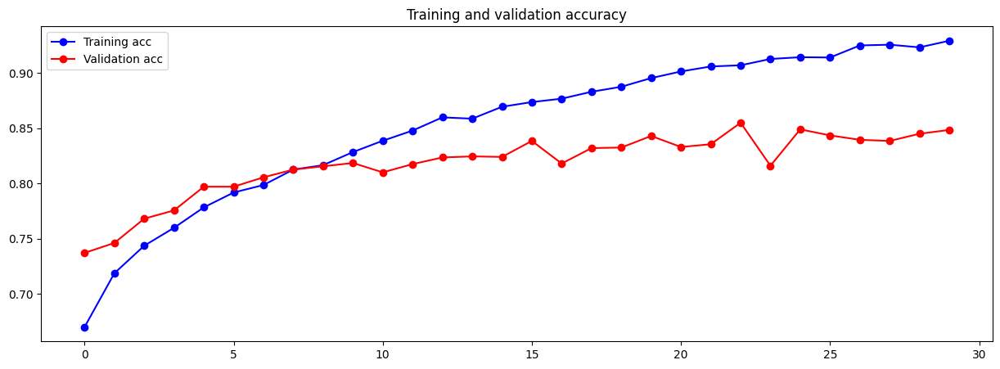

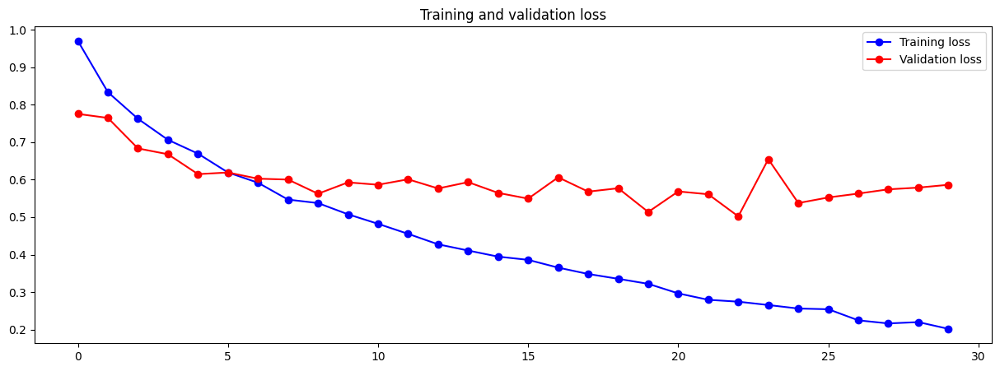

In [122]:
accloss(vgg3)

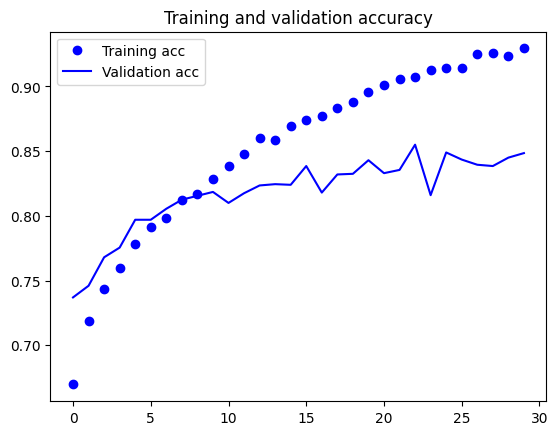

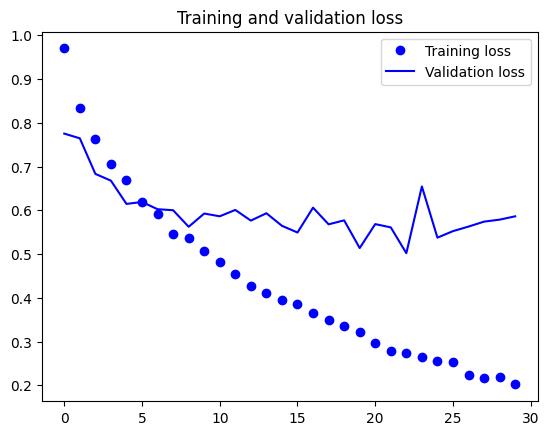

In [123]:
accloss1(vgg3)

In [124]:
vgg_model.save('food_model_two_vgg3.h5')

<b>VGG16 Model 4 - lowering batch size<b>

In [133]:
img_size = 224
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=16,
    class_mode='categorical'  
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_size, img_size),
    batch_size=16,
    class_mode='categorical'  
)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [134]:
img_size = 224
conv_base = VGG16(weights='imagenet', include_top = False, input_shape=(img_size, img_size, 3))
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [135]:
conv_base.trainable = False
for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_21 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 False
16 block5_conv2 False
17 block5_conv3 False
18 block5_pool False


In [136]:
vgg_model = models.Sequential()
vgg_model.add(conv_base)
vgg_model.add(layers.Flatten())
vgg_model.add(layers.Dense(256, activation='relu'))
vgg_model.add(layers.Dropout(0.5))
vgg_model.add(layers.Dense(10, activation='softmax'))
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-5),
              metrics=['acc'])
vgg_model.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_20 (Flatten)        (None, 25088)             0         
                                                                 
 dense_44 (Dense)            (None, 256)               6422784   
                                                                 
 dropout_24 (Dropout)        (None, 256)               0         
                                                                 
 dense_45 (Dense)            (None, 10)                2570      
                                                                 
Total params: 21,140,042
Trainable params: 6,425,354
Non-trainable params: 14,714,688
_________________________________________________________________


In [137]:
vgg4 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/16, 
      epochs=50,
      validation_data=validation_generator,
      validation_steps=2000/16
      ) 

Epoch 1/50
468/468 [==============================] - 70s 148ms/step - loss: 2.1747 - acc: 0.2073 - val_loss: 1.7925 - val_acc: 0.4255
Epoch 2/50
468/468 [==============================] - 69s 146ms/step - loss: 1.8327 - acc: 0.3501 - val_loss: 1.5654 - val_acc: 0.4735
Epoch 3/50
468/468 [==============================] - 68s 145ms/step - loss: 1.6635 - acc: 0.4169 - val_loss: 1.4177 - val_acc: 0.5245
Epoch 4/50
468/468 [==============================] - 69s 147ms/step - loss: 1.5653 - acc: 0.4544 - val_loss: 1.3446 - val_acc: 0.5415
Epoch 5/50
468/468 [==============================] - 68s 145ms/step - loss: 1.5020 - acc: 0.4872 - val_loss: 1.2604 - val_acc: 0.5705
Epoch 6/50
468/468 [==============================] - 68s 145ms/step - loss: 1.4349 - acc: 0.5099 - val_loss: 1.2122 - val_acc: 0.5940
Epoch 7/50
468/468 [==============================] - 69s 146ms/step - loss: 1.3995 - acc: 0.5185 - val_loss: 1.1695 - val_acc: 0.6030
Epoch 8/50
468/468 [==============================] - 6

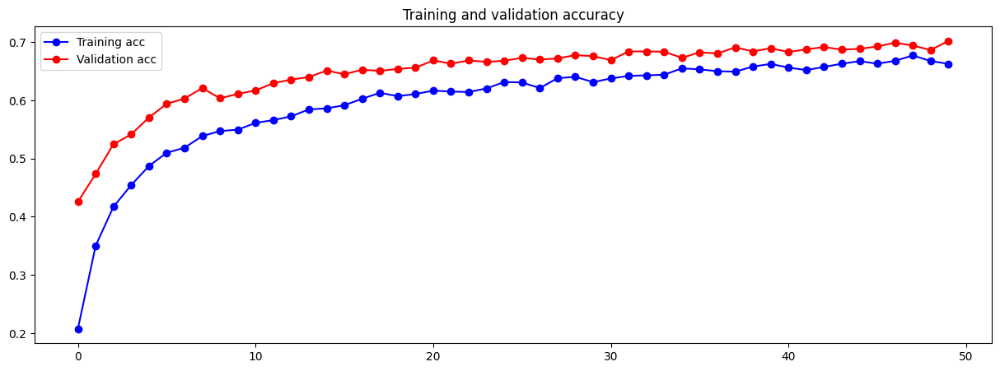

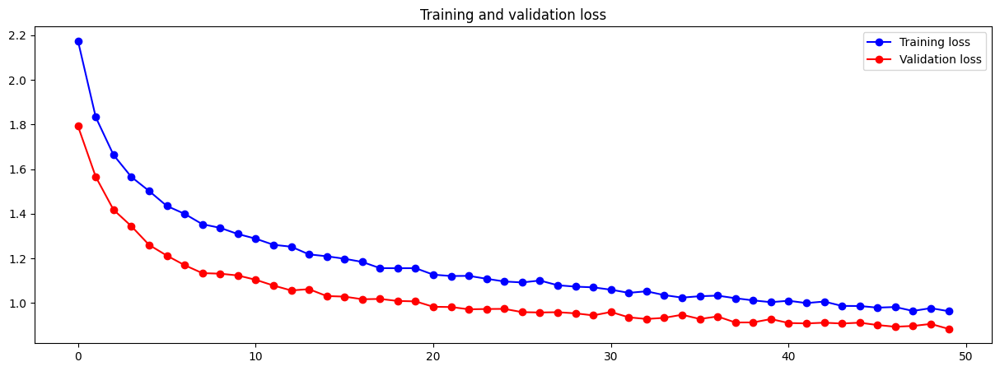

In [138]:
accloss(vgg4)

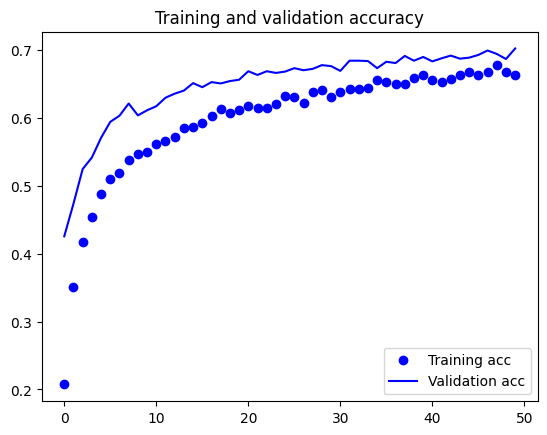

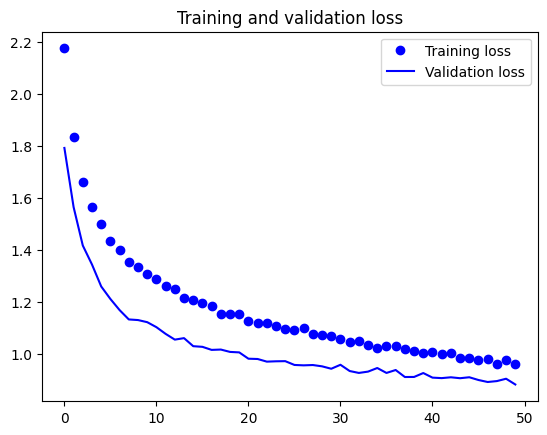

In [139]:
accloss1(vgg4)

In [140]:
vgg_model.save('food_model_two_vgg4.h5')

<b>Unfreeze 4th and 5th block<b>

In [141]:
conv_base.trainable = True
for layer in conv_base.layers[:11]:
    layer.trainable = False

for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_21 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 True
12 block4_conv2 True
13 block4_conv3 True
14 block4_pool True
15 block5_conv1 True
16 block5_conv2 True
17 block5_conv3 True
18 block5_pool True


In [142]:
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-5),
              metrics=['acc'])

train_generator.reset();
validation_generator.reset();
vgg4 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/16, 
      epochs=30,
      validation_data=validation_generator,
      validation_steps=2000/16
      ) 

Epoch 1/30
468/468 [==============================] - 71s 149ms/step - loss: 0.9460 - acc: 0.6788 - val_loss: 0.7671 - val_acc: 0.7400
Epoch 2/30
468/468 [==============================] - 69s 147ms/step - loss: 0.8046 - acc: 0.7287 - val_loss: 0.7404 - val_acc: 0.7535
Epoch 3/30
468/468 [==============================] - 69s 147ms/step - loss: 0.7262 - acc: 0.7548 - val_loss: 0.7298 - val_acc: 0.7510
Epoch 4/30
468/468 [==============================] - 71s 151ms/step - loss: 0.6757 - acc: 0.7735 - val_loss: 0.7327 - val_acc: 0.7630
Epoch 5/30
468/468 [==============================] - 69s 147ms/step - loss: 0.6202 - acc: 0.7893 - val_loss: 0.6047 - val_acc: 0.8005
Epoch 6/30
468/468 [==============================] - 69s 148ms/step - loss: 0.5712 - acc: 0.8044 - val_loss: 0.5980 - val_acc: 0.8005
Epoch 7/30
468/468 [==============================] - 69s 147ms/step - loss: 0.5522 - acc: 0.8203 - val_loss: 0.5482 - val_acc: 0.8155
Epoch 8/30
468/468 [==============================] - 6

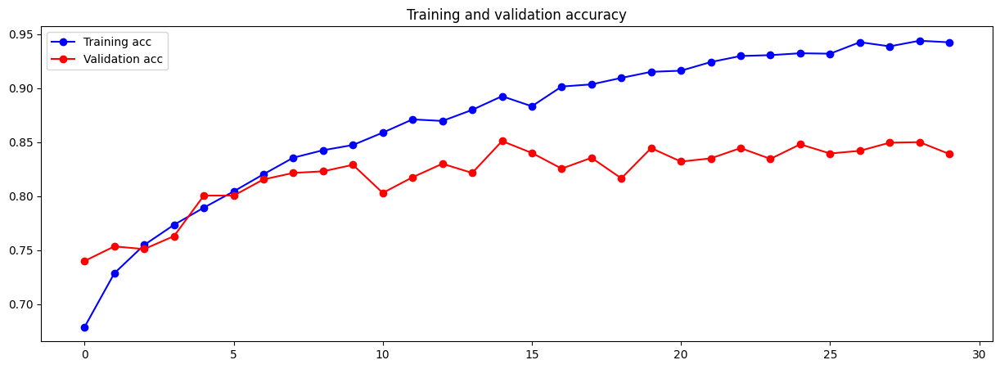

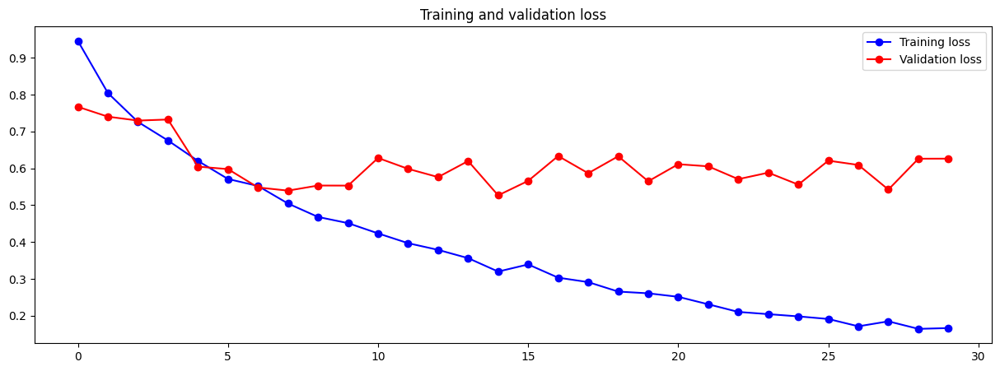

In [143]:
accloss(vgg4)

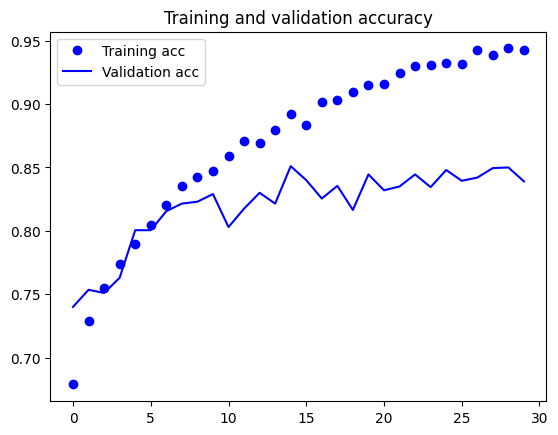

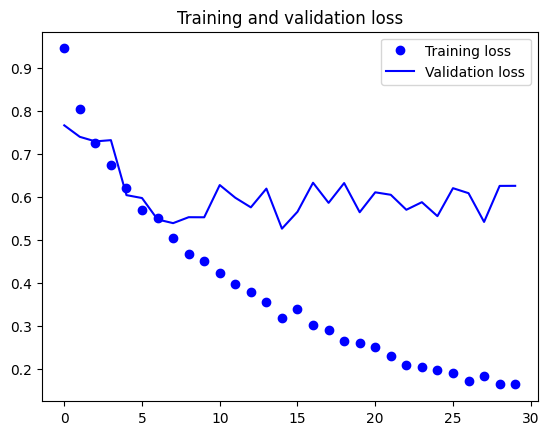

In [144]:
accloss1(vgg4)

In [145]:
vgg_model.save('food_model_two_vgg4.h5')

<b>VGG16 Model 5 - adding kernel regularizer<b>

In [147]:
img_size = 224
conv_base = VGG16(weights='imagenet', include_top = False, input_shape=(img_size, img_size, 3))
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [148]:
conv_base.trainable = False
for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_22 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 False
16 block5_conv2 False
17 block5_conv3 False
18 block5_pool False


In [149]:
vgg_model = models.Sequential()
vgg_model.add(conv_base)
vgg_model.add(layers.Flatten())
vgg_model.add(layers.Dense(256, activation='relu',kernel_regularizer=regularizers.l2(l2=0.001)))
vgg_model.add(layers.Dropout(0.5))
vgg_model.add(layers.Dense(10, activation='softmax'))
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-5),
              metrics=['acc'])
vgg_model.summary()

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_21 (Flatten)        (None, 25088)             0         
                                                                 
 dense_46 (Dense)            (None, 256)               6422784   
                                                                 
 dropout_25 (Dropout)        (None, 256)               0         
                                                                 
 dense_47 (Dense)            (None, 10)                2570      
                                                                 
Total params: 21,140,042
Trainable params: 6,425,354
Non-trainable params: 14,714,688
_________________________________________________________________


In [150]:
vgg5 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=50,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/50
234/234 [==============================] - 110s 467ms/step - loss: 2.7326 - acc: 0.1872 - val_loss: 2.3800 - val_acc: 0.3660
Epoch 2/50
234/234 [==============================] - 70s 299ms/step - loss: 2.3902 - acc: 0.3172 - val_loss: 2.1367 - val_acc: 0.4405
Epoch 3/50
234/234 [==============================] - 70s 299ms/step - loss: 2.2131 - acc: 0.3837 - val_loss: 1.9662 - val_acc: 0.4900
Epoch 4/50
234/234 [==============================] - 71s 304ms/step - loss: 2.1017 - acc: 0.4279 - val_loss: 1.8395 - val_acc: 0.5470
Epoch 5/50
234/234 [==============================] - 69s 295ms/step - loss: 2.0045 - acc: 0.4473 - val_loss: 1.7541 - val_acc: 0.5585
Epoch 6/50
234/234 [==============================] - 67s 286ms/step - loss: 1.9481 - acc: 0.4799 - val_loss: 1.6982 - val_acc: 0.5785
Epoch 7/50
234/234 [==============================] - 67s 285ms/step - loss: 1.9005 - acc: 0.4849 - val_loss: 1.6796 - val_acc: 0.5765
Epoch 8/50
234/234 [==============================] - 

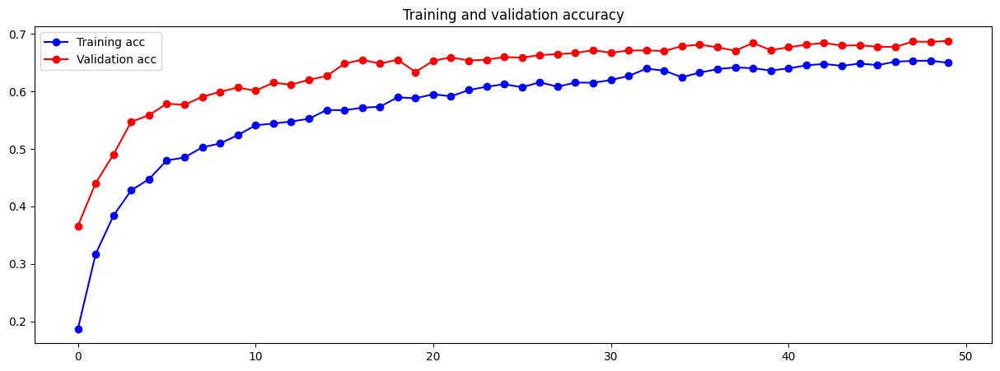

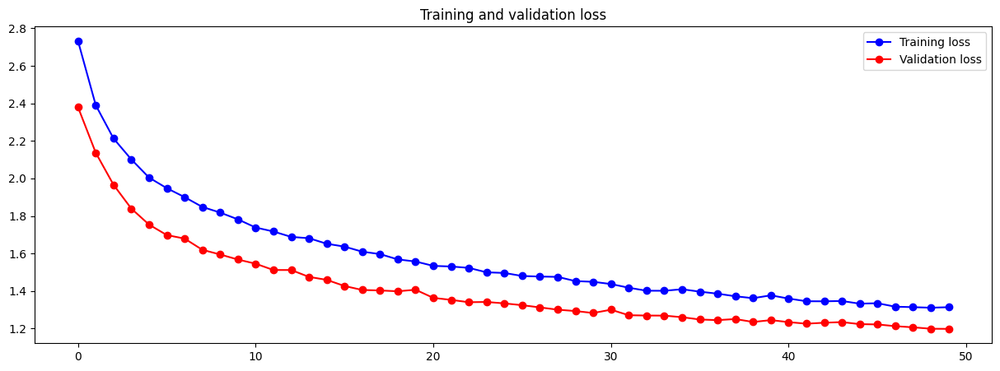

In [151]:
accloss(vgg5)

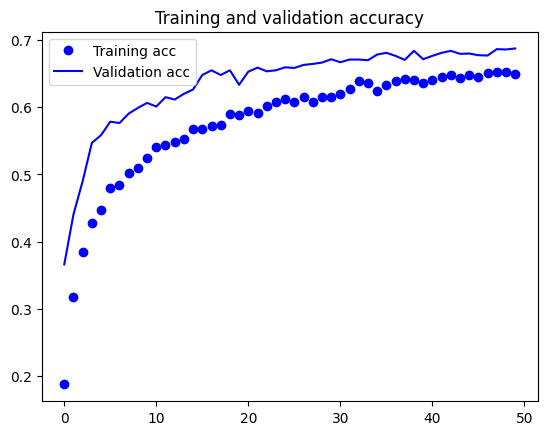

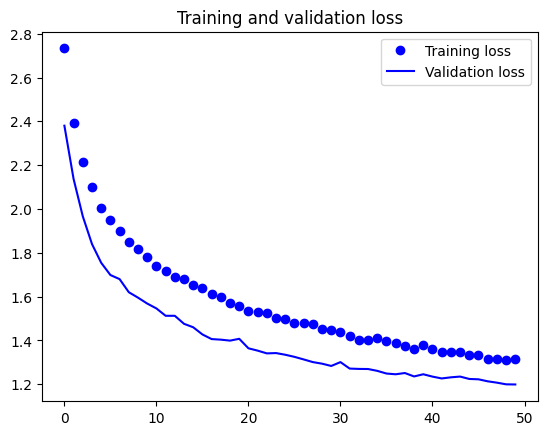

In [152]:
accloss1(vgg5)

In [153]:
vgg_model.save('food_model_two_vgg5.h5')

<b>Unfreeze 4th & 5th layer

In [154]:
conv_base.trainable = True
for layer in conv_base.layers[:11]:
    layer.trainable = False

for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_22 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 True
12 block4_conv2 True
13 block4_conv3 True
14 block4_pool True
15 block5_conv1 True
16 block5_conv2 True
17 block5_conv3 True
18 block5_pool True


In [155]:
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-5),
              metrics=['acc'])

train_generator.reset();
validation_generator.reset();
vgg5 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=30,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/30
234/234 [==============================] - 68s 288ms/step - loss: 1.2536 - acc: 0.6707 - val_loss: 1.0942 - val_acc: 0.7220
Epoch 2/30
234/234 [==============================] - 68s 289ms/step - loss: 1.1216 - acc: 0.7212 - val_loss: 1.0055 - val_acc: 0.7515
Epoch 3/30
234/234 [==============================] - 67s 285ms/step - loss: 1.0464 - acc: 0.7440 - val_loss: 0.9391 - val_acc: 0.7805
Epoch 4/30
234/234 [==============================] - 67s 286ms/step - loss: 0.9984 - acc: 0.7581 - val_loss: 0.9380 - val_acc: 0.7755
Epoch 5/30
234/234 [==============================] - 67s 285ms/step - loss: 0.9504 - acc: 0.7780 - val_loss: 0.9371 - val_acc: 0.7850
Epoch 6/30
234/234 [==============================] - 67s 284ms/step - loss: 0.9064 - acc: 0.7884 - val_loss: 0.8561 - val_acc: 0.8075
Epoch 7/30
234/234 [==============================] - 67s 285ms/step - loss: 0.8683 - acc: 0.8052 - val_loss: 0.8653 - val_acc: 0.8065
Epoch 8/30
234/234 [==============================] - 6

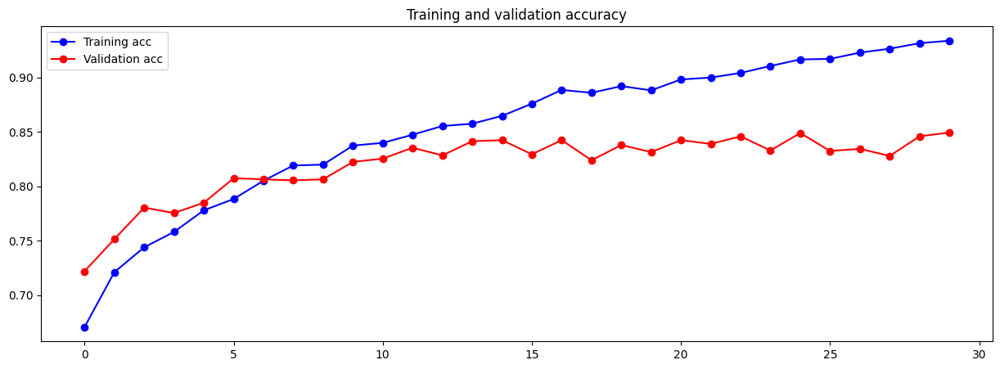

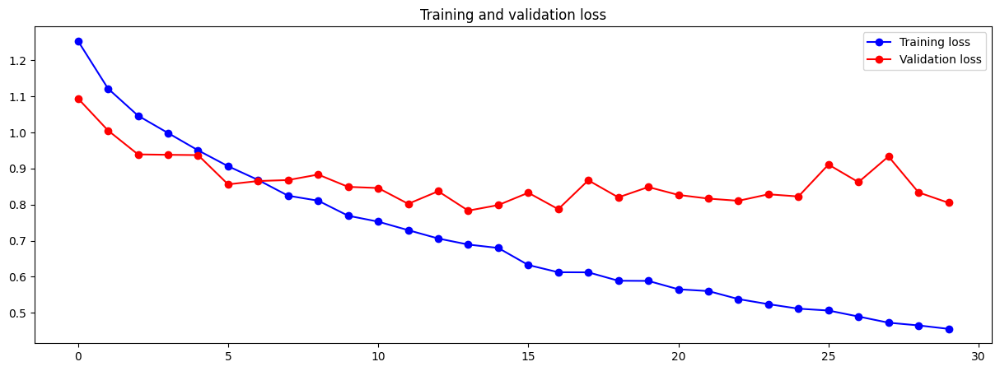

In [156]:
accloss(vgg5)

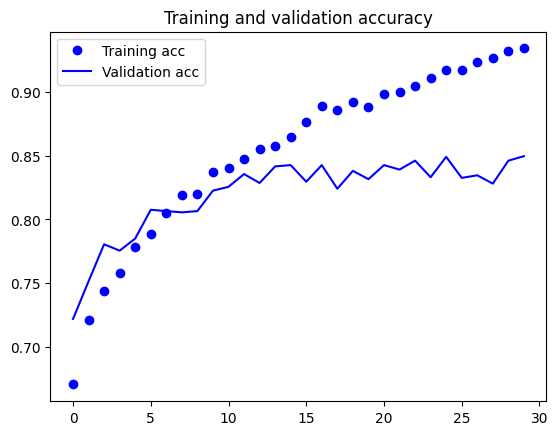

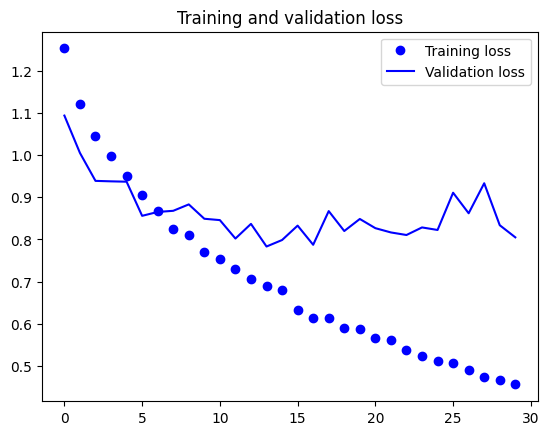

In [157]:
accloss1(vgg5)

In [158]:
vgg_model.save('food_model_two_vgg5.h5')

<b>VGG16 Model 6 - Tune learning rate<b>

In [183]:
img_size = 224
conv_base = VGG16(weights='imagenet', include_top = False, input_shape=(img_size, img_size, 3))
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_27 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [184]:
conv_base.trainable = False
for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_27 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 False
16 block5_conv2 False
17 block5_conv3 False
18 block5_pool False


In [185]:
vgg_model = models.Sequential()
vgg_model.add(conv_base)
vgg_model.add(layers.Flatten())
vgg_model.add(layers.Dense(256, activation='relu',kernel_regularizer=regularizers.l2(l2=0.001)))
vgg_model.add(layers.Dropout(0.5))
vgg_model.add(layers.Dense(10, activation='softmax'))
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=0.5*1e-5),
              metrics=['acc'])
vgg_model.summary()

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_26 (Flatten)        (None, 25088)             0         
                                                                 
 dense_56 (Dense)            (None, 256)               6422784   
                                                                 
 dropout_30 (Dropout)        (None, 256)               0         
                                                                 
 dense_57 (Dense)            (None, 10)                2570      
                                                                 
Total params: 21,140,042
Trainable params: 6,425,354
Non-trainable params: 14,714,688
_________________________________________________________________


In [186]:
vgg6 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=50,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/50
234/234 [==============================] - 67s 283ms/step - loss: 2.8579 - acc: 0.1469 - val_loss: 2.5444 - val_acc: 0.3085
Epoch 2/50
234/234 [==============================] - 66s 279ms/step - loss: 2.5717 - acc: 0.2419 - val_loss: 2.3597 - val_acc: 0.3965
Epoch 3/50
234/234 [==============================] - 66s 281ms/step - loss: 2.4291 - acc: 0.3044 - val_loss: 2.2145 - val_acc: 0.4575
Epoch 4/50
234/234 [==============================] - 66s 281ms/step - loss: 2.3132 - acc: 0.3420 - val_loss: 2.0954 - val_acc: 0.4920
Epoch 5/50
234/234 [==============================] - 66s 282ms/step - loss: 2.2291 - acc: 0.3751 - val_loss: 2.0005 - val_acc: 0.5170
Epoch 6/50
234/234 [==============================] - 67s 284ms/step - loss: 2.1776 - acc: 0.3927 - val_loss: 1.9337 - val_acc: 0.5270
Epoch 7/50
234/234 [==============================] - 67s 284ms/step - loss: 2.1013 - acc: 0.4277 - val_loss: 1.8626 - val_acc: 0.5620
Epoch 8/50
234/234 [==============================] - 6

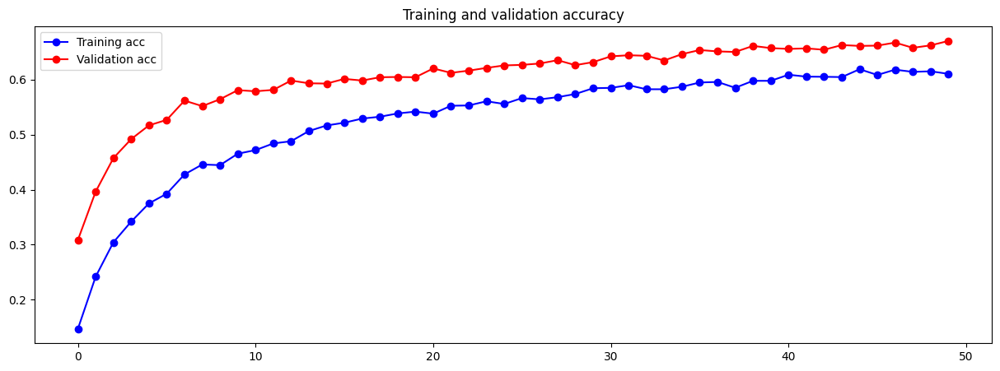

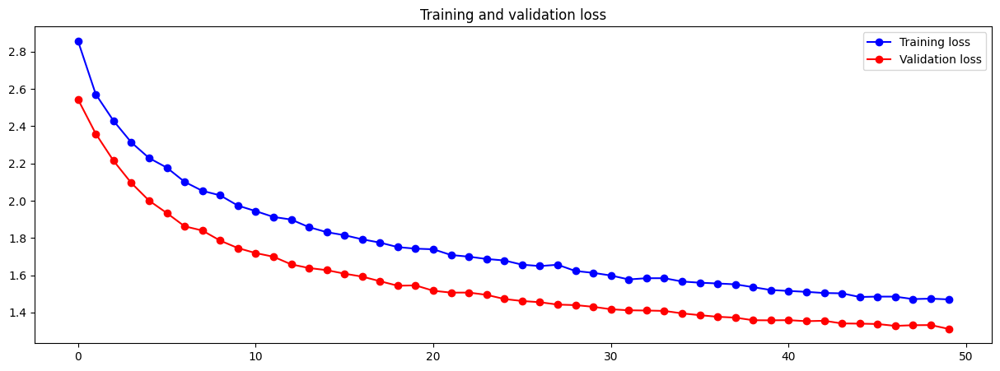

In [187]:
accloss(vgg6)

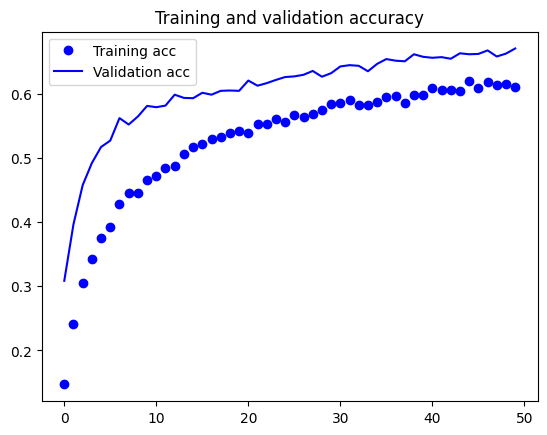

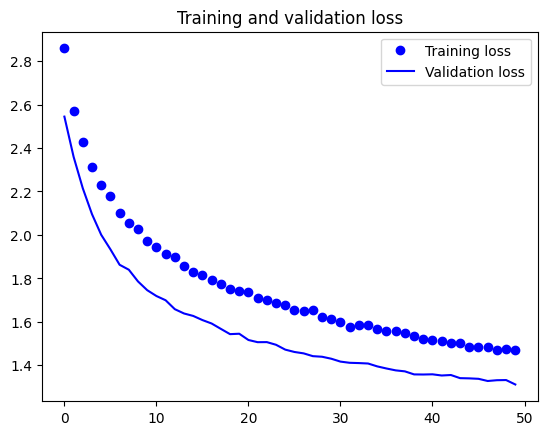

In [188]:
accloss1(vgg6)

In [189]:
vgg_model.save('food_model_two_vgg6.h5')

<b>Unfreeze 4th & 5th block<b>

In [190]:
conv_base.trainable = True
for layer in conv_base.layers[:11]:
    layer.trainable = False

for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_27 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 True
12 block4_conv2 True
13 block4_conv3 True
14 block4_pool True
15 block5_conv1 True
16 block5_conv2 True
17 block5_conv3 True
18 block5_pool True


In [191]:
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=0.5*1e-5),
              metrics=['acc'])

train_generator.reset();
validation_generator.reset();
vgg6 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=30,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/30
234/234 [==============================] - 67s 282ms/step - loss: 1.3934 - acc: 0.6381 - val_loss: 1.1852 - val_acc: 0.7075
Epoch 2/30
234/234 [==============================] - 67s 284ms/step - loss: 1.2668 - acc: 0.6833 - val_loss: 1.1053 - val_acc: 0.7415
Epoch 3/30
234/234 [==============================] - 66s 281ms/step - loss: 1.2174 - acc: 0.7041 - val_loss: 1.0890 - val_acc: 0.7470
Epoch 4/30
234/234 [==============================] - 66s 282ms/step - loss: 1.1531 - acc: 0.7221 - val_loss: 1.0448 - val_acc: 0.7540
Epoch 5/30
234/234 [==============================] - 66s 281ms/step - loss: 1.1026 - acc: 0.7419 - val_loss: 0.9997 - val_acc: 0.7800
Epoch 6/30
234/234 [==============================] - 67s 287ms/step - loss: 1.0733 - acc: 0.7497 - val_loss: 1.0038 - val_acc: 0.7730
Epoch 7/30
234/234 [==============================] - 67s 286ms/step - loss: 1.0308 - acc: 0.7725 - val_loss: 1.0301 - val_acc: 0.7735
Epoch 8/30
234/234 [==============================] - 6

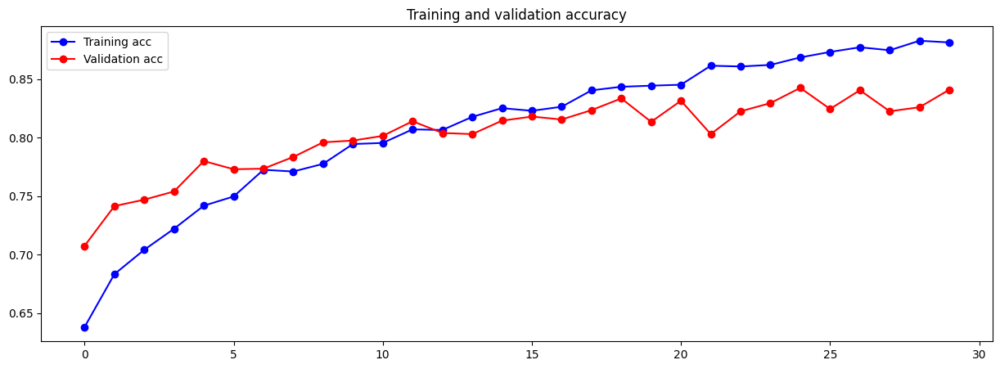

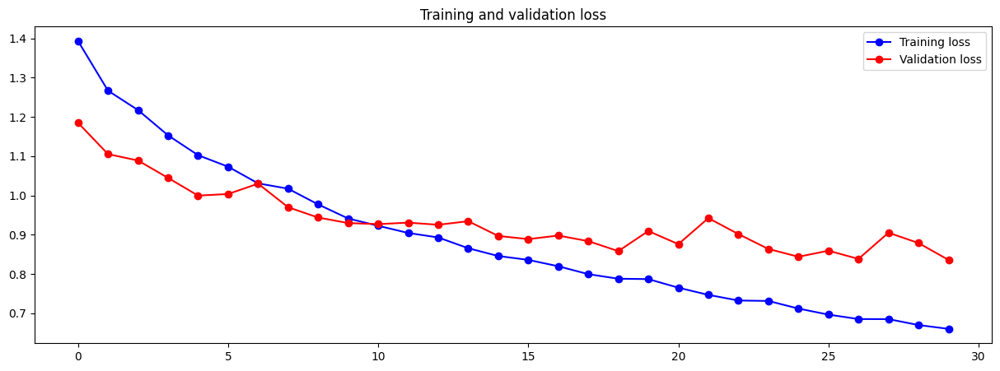

In [192]:
accloss(vgg6)

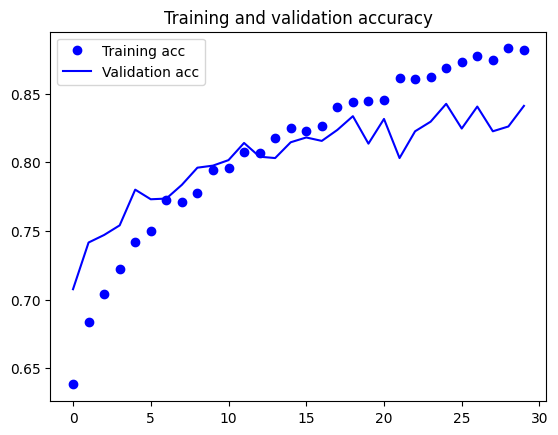

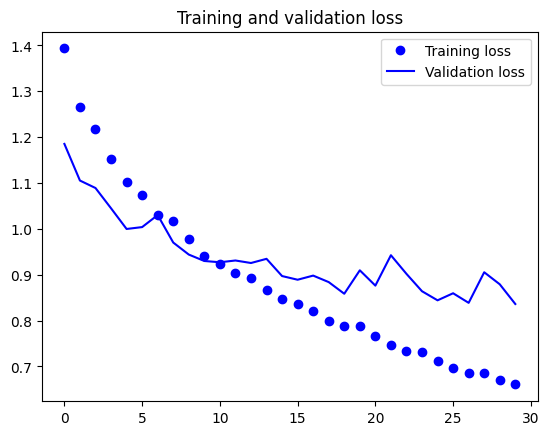

In [193]:
accloss1(vgg6)

In [194]:
vgg_model.save('food_model_two_vgg6.h5')

<b>VGG16 Model 7 - Unfreezing the third block<b>

In [195]:
img_size = 224
conv_base = VGG16(weights='imagenet', include_top = False, input_shape=(img_size, img_size, 3))
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_28 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [196]:
conv_base.trainable = False
for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_28 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 False
16 block5_conv2 False
17 block5_conv3 False
18 block5_pool False


In [197]:
vgg_model = models.Sequential()
vgg_model.add(conv_base)
vgg_model.add(layers.Flatten())
vgg_model.add(layers.Dense(256, activation='relu',kernel_regularizer=regularizers.l2(l2=0.001)))
vgg_model.add(layers.Dropout(0.5))
vgg_model.add(layers.Dense(10, activation='softmax'))
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=0.5*1e-5),
              metrics=['acc'])
vgg_model.summary()

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_27 (Flatten)        (None, 25088)             0         
                                                                 
 dense_58 (Dense)            (None, 256)               6422784   
                                                                 
 dropout_31 (Dropout)        (None, 256)               0         
                                                                 
 dense_59 (Dense)            (None, 10)                2570      
                                                                 
Total params: 21,140,042
Trainable params: 6,425,354
Non-trainable params: 14,714,688
_________________________________________________________________


In [198]:
vgg7 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=50,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/50
234/234 [==============================] - 69s 293ms/step - loss: 2.8960 - acc: 0.1307 - val_loss: 2.5785 - val_acc: 0.2970
Epoch 2/50
234/234 [==============================] - 67s 285ms/step - loss: 2.5974 - acc: 0.2289 - val_loss: 2.3742 - val_acc: 0.3990
Epoch 3/50
234/234 [==============================] - 66s 279ms/step - loss: 2.4372 - acc: 0.3048 - val_loss: 2.2100 - val_acc: 0.4610
Epoch 4/50
234/234 [==============================] - 66s 279ms/step - loss: 2.3265 - acc: 0.3460 - val_loss: 2.0989 - val_acc: 0.4740
Epoch 5/50
234/234 [==============================] - 65s 279ms/step - loss: 2.2259 - acc: 0.3796 - val_loss: 1.9917 - val_acc: 0.5090
Epoch 6/50
234/234 [==============================] - 66s 280ms/step - loss: 2.1583 - acc: 0.4020 - val_loss: 1.9252 - val_acc: 0.5315
Epoch 7/50
234/234 [==============================] - 65s 278ms/step - loss: 2.0991 - acc: 0.4268 - val_loss: 1.8703 - val_acc: 0.5285
Epoch 8/50
234/234 [==============================] - 6

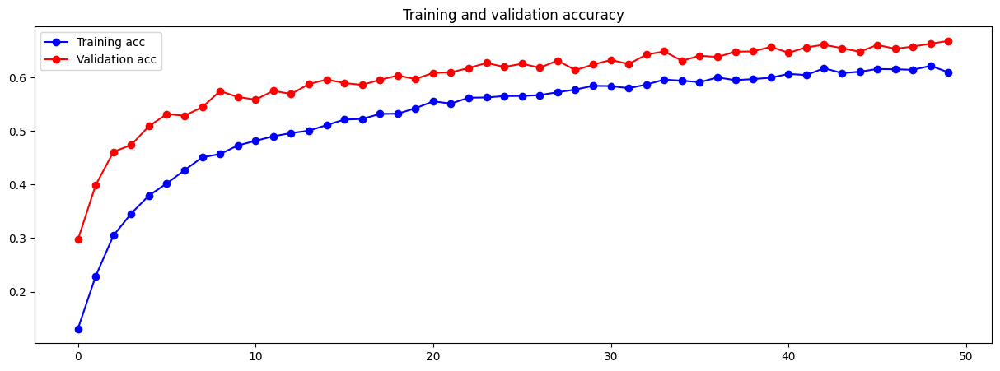

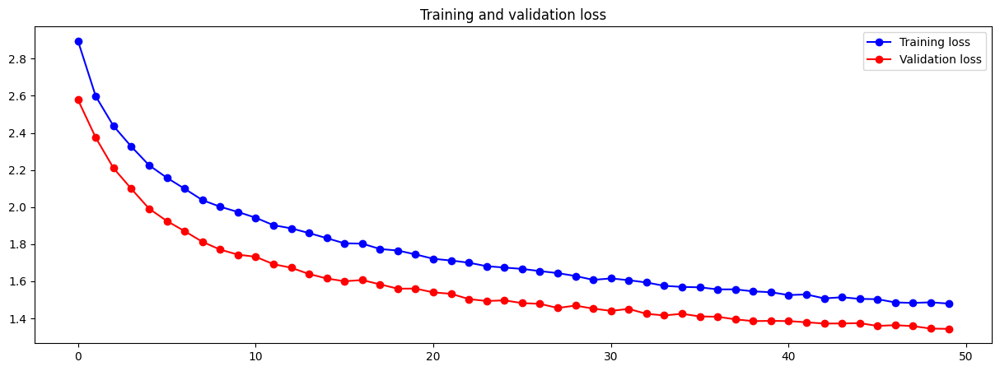

In [199]:
accloss(vgg7)

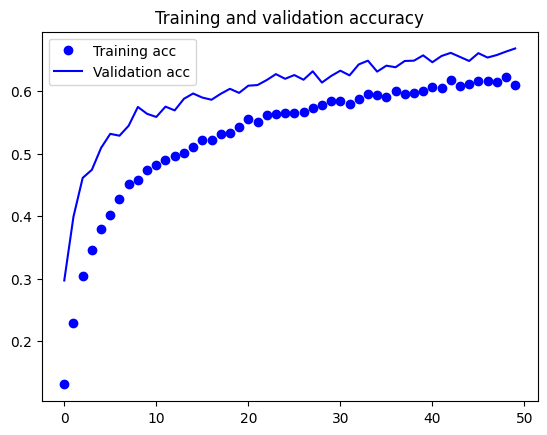

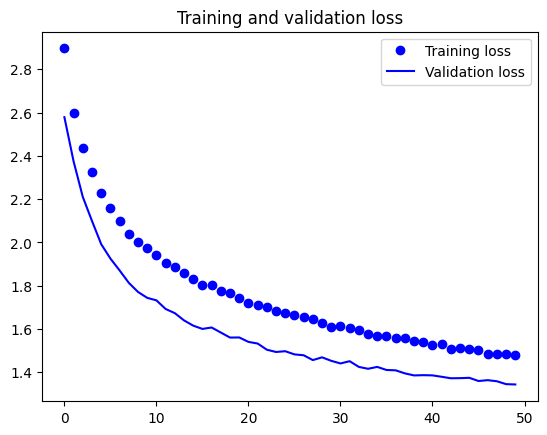

In [200]:
accloss1(vgg7)

In [201]:
vgg_model.save('food_model_two_vgg7.h5')

<b>Unfreeze 3rd, 4th & 5th block<b>

In [202]:
conv_base.trainable = True
for layer in conv_base.layers[:7]:
    layer.trainable = False

for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_28 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 True
8 block3_conv2 True
9 block3_conv3 True
10 block3_pool True
11 block4_conv1 True
12 block4_conv2 True
13 block4_conv3 True
14 block4_pool True
15 block5_conv1 True
16 block5_conv2 True
17 block5_conv3 True
18 block5_pool True


In [203]:
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=0.5*1e-5),
              metrics=['acc'])

train_generator.reset();
validation_generator.reset();
vgg7 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=30,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/30
234/234 [==============================] - 68s 283ms/step - loss: 1.3844 - acc: 0.6440 - val_loss: 1.1690 - val_acc: 0.7200
Epoch 2/30
234/234 [==============================] - 67s 286ms/step - loss: 1.2576 - acc: 0.6849 - val_loss: 1.1749 - val_acc: 0.7190
Epoch 3/30
234/234 [==============================] - 68s 291ms/step - loss: 1.1834 - acc: 0.7196 - val_loss: 1.0836 - val_acc: 0.7470
Epoch 4/30
234/234 [==============================] - 67s 285ms/step - loss: 1.1306 - acc: 0.7360 - val_loss: 1.0182 - val_acc: 0.7725
Epoch 5/30
234/234 [==============================] - 67s 284ms/step - loss: 1.0866 - acc: 0.7545 - val_loss: 0.9832 - val_acc: 0.7860
Epoch 6/30
234/234 [==============================] - 70s 297ms/step - loss: 1.0411 - acc: 0.7633 - val_loss: 0.9706 - val_acc: 0.7905
Epoch 7/30
234/234 [==============================] - 69s 293ms/step - loss: 1.0085 - acc: 0.7789 - val_loss: 0.9512 - val_acc: 0.8040
Epoch 8/30
234/234 [==============================] - 6

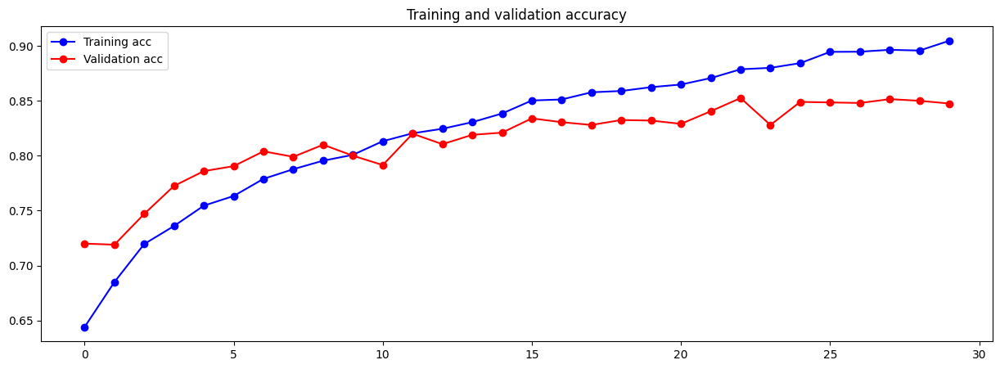

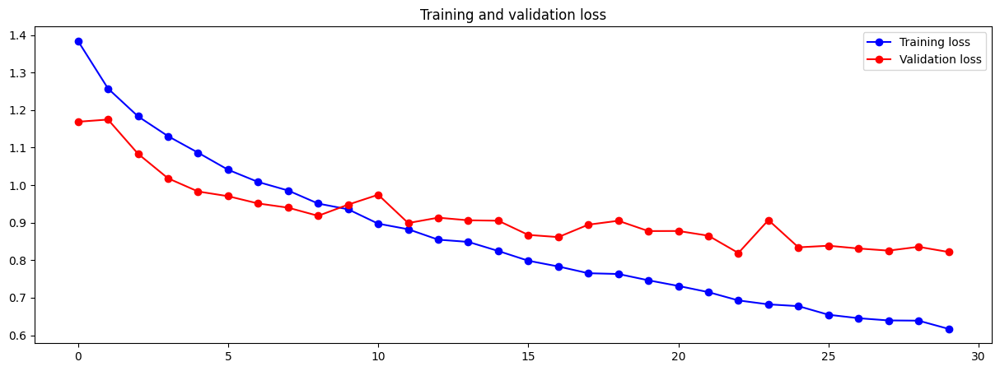

In [204]:
accloss(vgg7)

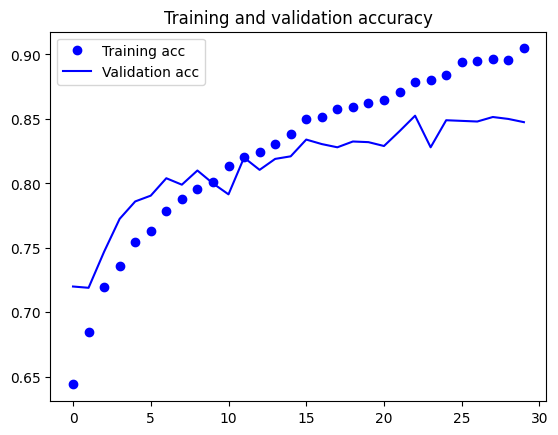

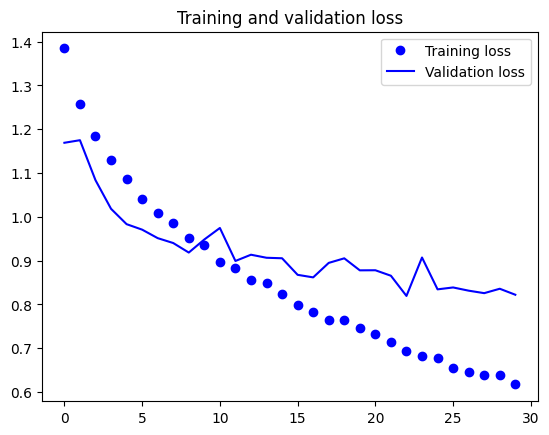

In [205]:
accloss1(vgg7)

In [206]:
vgg_model.save('food_model_two_vgg7.h5')

<b>VGG Model 8 - More tuning of learning rate<b>

In [7]:
img_size = 224
conv_base = VGG16(weights='imagenet', include_top = False, input_shape=(img_size, img_size, 3))
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [8]:
conv_base.trainable = False
for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_1 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 False
16 block5_conv2 False
17 block5_conv3 False
18 block5_pool False


In [9]:
vgg_model = models.Sequential()
vgg_model.add(conv_base)
vgg_model.add(layers.Flatten())
vgg_model.add(layers.Dense(256, activation='relu',kernel_regularizer=regularizers.l2(l2=0.001)))
vgg_model.add(layers.Dropout(0.5))
vgg_model.add(layers.Dense(10, activation='softmax'))
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=0.3*1e-5),
              metrics=['acc'])
vgg_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 256)               6422784   
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 10)                2570      
                                                                 
Total params: 21,140,042
Trainable params: 6,425,354
Non-trainable params: 14,714,688
_________________________________________________________________


In [10]:
vgg8 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=50,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/50
234/234 [==============================] - 79s 302ms/step - loss: 2.9622 - acc: 0.1221 - val_loss: 2.6666 - val_acc: 0.2225
Epoch 2/50
234/234 [==============================] - 68s 289ms/step - loss: 2.7257 - acc: 0.1719 - val_loss: 2.5339 - val_acc: 0.3205
Epoch 3/50
234/234 [==============================] - 67s 286ms/step - loss: 2.5946 - acc: 0.2365 - val_loss: 2.4205 - val_acc: 0.3790
Epoch 4/50
234/234 [==============================] - 68s 290ms/step - loss: 2.5069 - acc: 0.2720 - val_loss: 2.3105 - val_acc: 0.4365
Epoch 5/50
234/234 [==============================] - 70s 300ms/step - loss: 2.4284 - acc: 0.3057 - val_loss: 2.2202 - val_acc: 0.4675
Epoch 6/50
234/234 [==============================] - 72s 307ms/step - loss: 2.3539 - acc: 0.3308 - val_loss: 2.1442 - val_acc: 0.4795
Epoch 7/50
234/234 [==============================] - 71s 304ms/step - loss: 2.2973 - acc: 0.3559 - val_loss: 2.0807 - val_acc: 0.5015
Epoch 8/50
234/234 [==============================] - 6

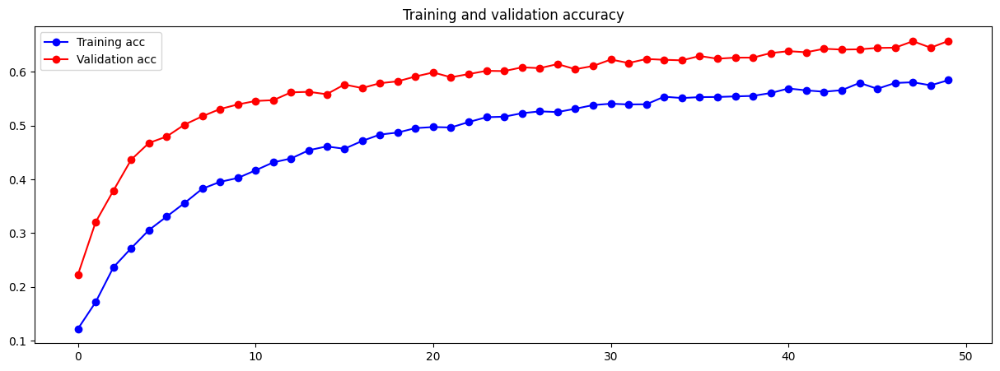

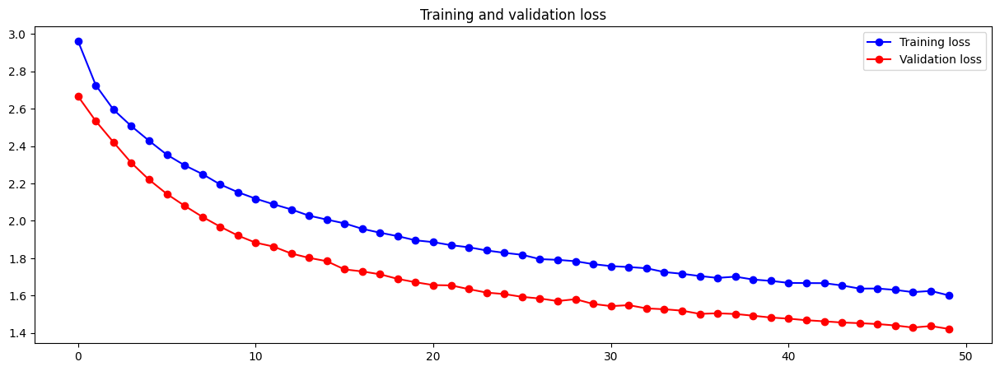

In [11]:
accloss(vgg8)

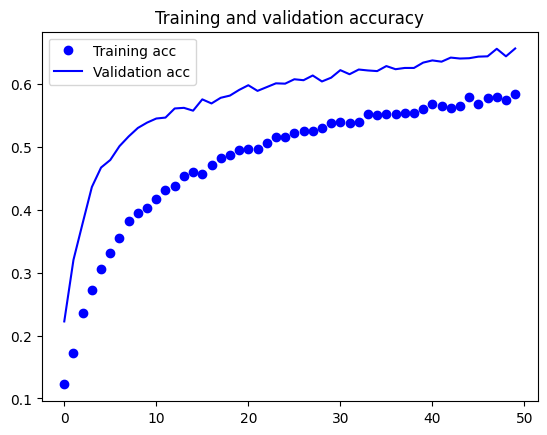

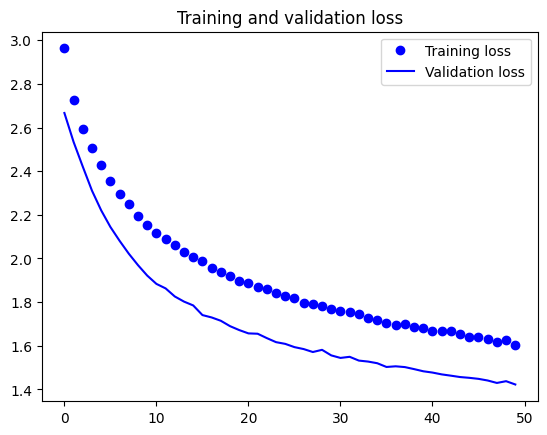

In [12]:
accloss1(vgg8)

In [13]:
vgg_model.save('food_model_two_vgg8.h5')

<b>Unfreeze 3rd, 4th & 5th block<b>
   

In [14]:
conv_base.trainable = True
for layer in conv_base.layers[:7]:
    layer.trainable = False

for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_1 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 True
8 block3_conv2 True
9 block3_conv3 True
10 block3_pool True
11 block4_conv1 True
12 block4_conv2 True
13 block4_conv3 True
14 block4_pool True
15 block5_conv1 True
16 block5_conv2 True
17 block5_conv3 True
18 block5_pool True


In [15]:
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=0.3*1e-5),
              metrics=['acc'])

train_generator.reset();
validation_generator.reset();
vgg8 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=30,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/30
234/234 [==============================] - 75s 293ms/step - loss: 1.5096 - acc: 0.6157 - val_loss: 1.2764 - val_acc: 0.6900
Epoch 2/30
234/234 [==============================] - 68s 291ms/step - loss: 1.4101 - acc: 0.6423 - val_loss: 1.1881 - val_acc: 0.7165
Epoch 3/30
234/234 [==============================] - 69s 295ms/step - loss: 1.3349 - acc: 0.6671 - val_loss: 1.1432 - val_acc: 0.7370
Epoch 4/30
234/234 [==============================] - 68s 290ms/step - loss: 1.2674 - acc: 0.6928 - val_loss: 1.1442 - val_acc: 0.7410
Epoch 5/30
234/234 [==============================] - 69s 293ms/step - loss: 1.2304 - acc: 0.7081 - val_loss: 1.0767 - val_acc: 0.7605
Epoch 6/30
234/234 [==============================] - 69s 293ms/step - loss: 1.1871 - acc: 0.7241 - val_loss: 1.0395 - val_acc: 0.7700
Epoch 7/30
234/234 [==============================] - 69s 294ms/step - loss: 1.1499 - acc: 0.7376 - val_loss: 1.0656 - val_acc: 0.7765
Epoch 8/30
234/234 [==============================] - 6

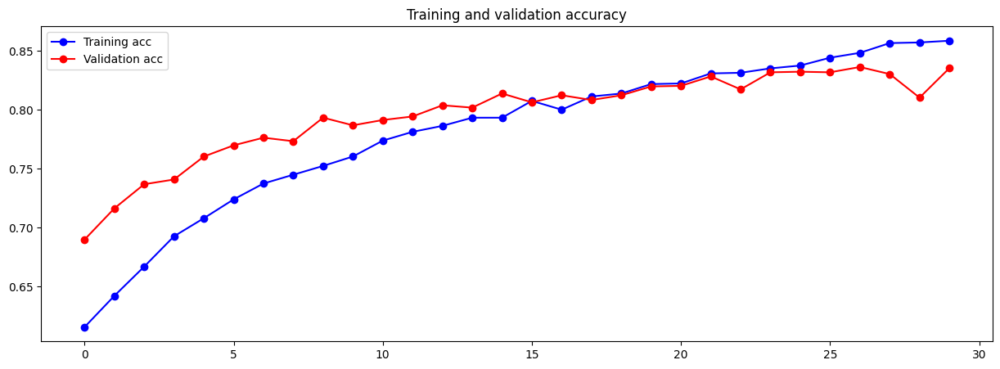

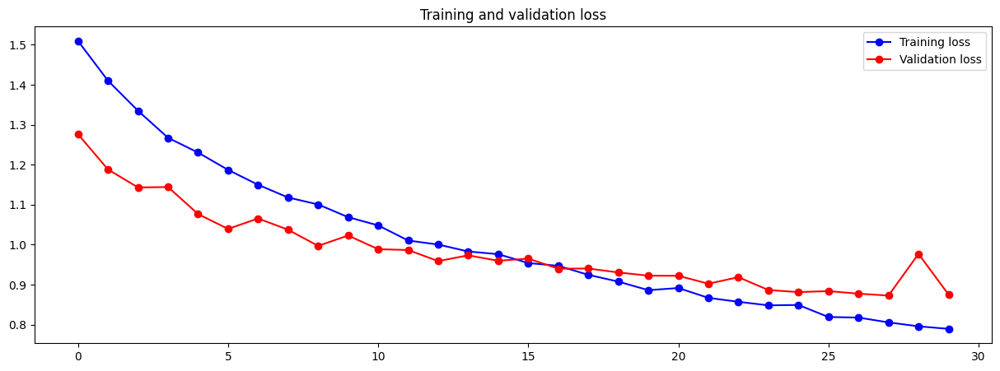

In [16]:
accloss(vgg8)

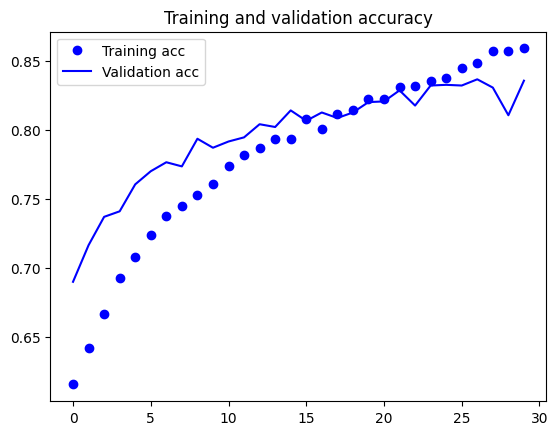

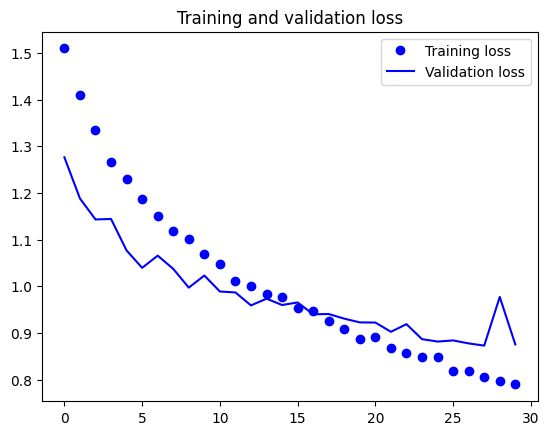

In [17]:
accloss1(vgg8)

In [18]:
vgg_model.save('food_model_two_vgg8.h5')

<b>VGG Model 9 - Training for more epoch<b>

In [19]:
img_size = 224
conv_base = VGG16(weights='imagenet', include_top = False, input_shape=(img_size, img_size, 3))
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [20]:
conv_base.trainable = False
for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_2 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 False
16 block5_conv2 False
17 block5_conv3 False
18 block5_pool False


In [21]:
vgg_model = models.Sequential()
vgg_model.add(conv_base)
vgg_model.add(layers.Flatten())
vgg_model.add(layers.Dense(256, activation='relu',kernel_regularizer=regularizers.l2(l2=0.001)))
vgg_model.add(layers.Dropout(0.5))
vgg_model.add(layers.Dense(10, activation='softmax'))
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=0.3*1e-5),
              metrics=['acc'])
vgg_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dense_2 (Dense)             (None, 256)               6422784   
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 10)                2570      
                                                                 
Total params: 21,140,042
Trainable params: 6,425,354
Non-trainable params: 14,714,688
_________________________________________________________________


In [22]:
vgg9 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=50,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/50
234/234 [==============================] - 68s 287ms/step - loss: 2.9794 - acc: 0.1211 - val_loss: 2.6686 - val_acc: 0.2185
Epoch 2/50
234/234 [==============================] - 67s 287ms/step - loss: 2.7180 - acc: 0.1813 - val_loss: 2.5208 - val_acc: 0.3250
Epoch 3/50
234/234 [==============================] - 68s 291ms/step - loss: 2.5807 - acc: 0.2405 - val_loss: 2.4079 - val_acc: 0.3795
Epoch 4/50
234/234 [==============================] - 67s 286ms/step - loss: 2.4874 - acc: 0.2784 - val_loss: 2.3100 - val_acc: 0.4290
Epoch 5/50
234/234 [==============================] - 68s 292ms/step - loss: 2.4173 - acc: 0.3075 - val_loss: 2.2216 - val_acc: 0.4610
Epoch 6/50
234/234 [==============================] - 67s 287ms/step - loss: 2.3341 - acc: 0.3459 - val_loss: 2.1415 - val_acc: 0.4785
Epoch 7/50
234/234 [==============================] - 67s 288ms/step - loss: 2.2783 - acc: 0.3605 - val_loss: 2.0633 - val_acc: 0.5010
Epoch 8/50
234/234 [==============================] - 6

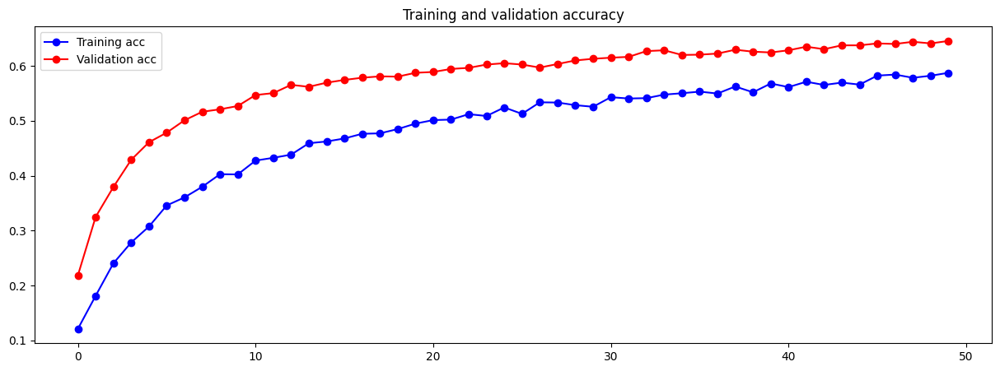

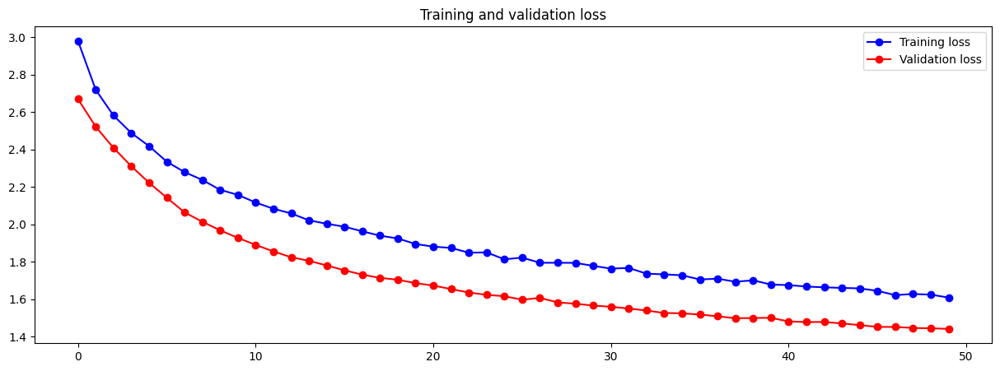

In [23]:
accloss(vgg9)

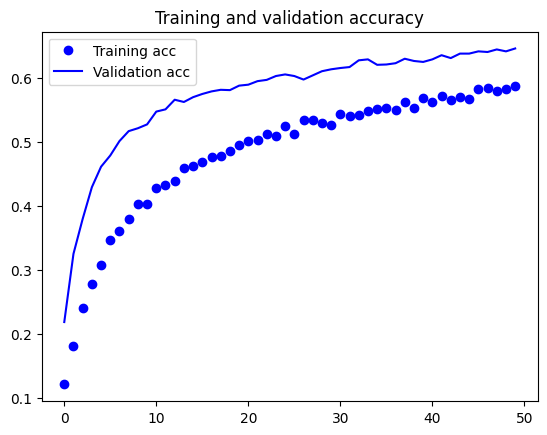

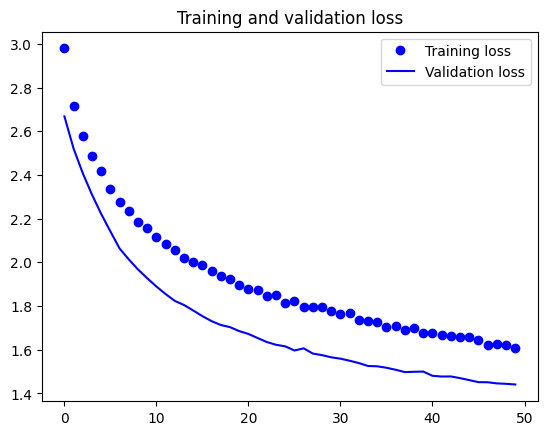

In [24]:
accloss1(vgg9)

In [25]:
vgg_model.save('food_model_two_vgg9.h5')

<B>Unfreeze 3rd, 4th & 5th block<b>

In [26]:
conv_base.trainable = True
for layer in conv_base.layers[:7]:
    layer.trainable = False

for i, layer in enumerate(conv_base.layers):
    print(i, layer.name, layer.trainable)

0 input_2 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 True
8 block3_conv2 True
9 block3_conv3 True
10 block3_pool True
11 block4_conv1 True
12 block4_conv2 True
13 block4_conv3 True
14 block4_pool True
15 block5_conv1 True
16 block5_conv2 True
17 block5_conv3 True
18 block5_pool True


In [27]:
vgg_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=0.3*1e-5),
              metrics=['acc'])

train_generator.reset();
validation_generator.reset();
vgg9 = vgg_model.fit(
      train_generator,
      steps_per_epoch=7500/32, 
      epochs=100,
      validation_data=validation_generator,
      validation_steps=2000/32
      ) 

Epoch 1/100
234/234 [==============================] - 69s 290ms/step - loss: 1.5403 - acc: 0.6069 - val_loss: 1.3069 - val_acc: 0.6845
Epoch 2/100
234/234 [==============================] - 69s 294ms/step - loss: 1.4111 - acc: 0.6495 - val_loss: 1.2092 - val_acc: 0.7175
Epoch 3/100
234/234 [==============================] - 69s 296ms/step - loss: 1.3425 - acc: 0.6705 - val_loss: 1.1624 - val_acc: 0.7325
Epoch 4/100
234/234 [==============================] - 68s 290ms/step - loss: 1.2892 - acc: 0.6868 - val_loss: 1.1235 - val_acc: 0.7475
Epoch 5/100
234/234 [==============================] - 69s 293ms/step - loss: 1.2342 - acc: 0.7075 - val_loss: 1.0909 - val_acc: 0.7520
Epoch 6/100
234/234 [==============================] - 68s 289ms/step - loss: 1.2021 - acc: 0.7213 - val_loss: 1.1100 - val_acc: 0.7550
Epoch 7/100
234/234 [==============================] - 69s 293ms/step - loss: 1.1550 - acc: 0.7364 - val_loss: 1.0597 - val_acc: 0.7660
Epoch 8/100
234/234 [===========================

Epoch 61/100
234/234 [==============================] - 69s 293ms/step - loss: 0.5702 - acc: 0.9292 - val_loss: 0.9111 - val_acc: 0.8525
Epoch 62/100
234/234 [==============================] - 69s 293ms/step - loss: 0.5666 - acc: 0.9315 - val_loss: 0.8803 - val_acc: 0.8680
Epoch 63/100
234/234 [==============================] - 68s 290ms/step - loss: 0.5697 - acc: 0.9279 - val_loss: 0.9165 - val_acc: 0.8485
Epoch 64/100
234/234 [==============================] - 70s 297ms/step - loss: 0.5647 - acc: 0.9281 - val_loss: 0.8600 - val_acc: 0.8640
Epoch 65/100
234/234 [==============================] - 69s 293ms/step - loss: 0.5465 - acc: 0.9371 - val_loss: 0.8719 - val_acc: 0.8605
Epoch 66/100
234/234 [==============================] - 69s 295ms/step - loss: 0.5514 - acc: 0.9337 - val_loss: 0.9583 - val_acc: 0.8455
Epoch 67/100
234/234 [==============================] - 69s 294ms/step - loss: 0.5573 - acc: 0.9329 - val_loss: 0.8786 - val_acc: 0.8635
Epoch 68/100
234/234 [===================

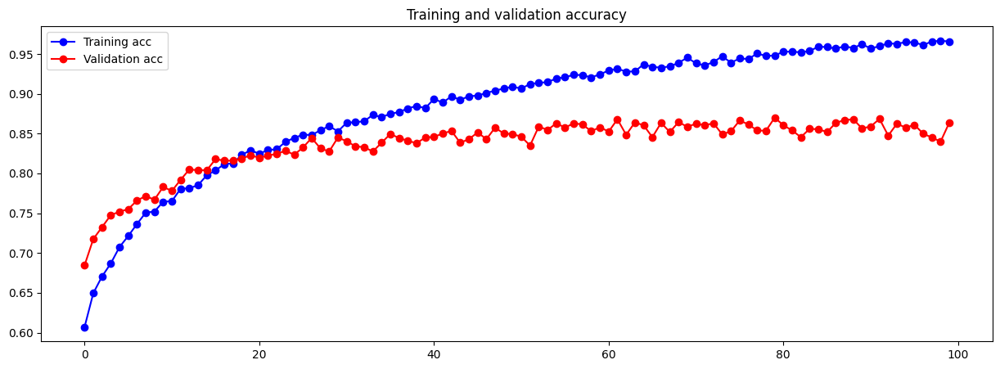

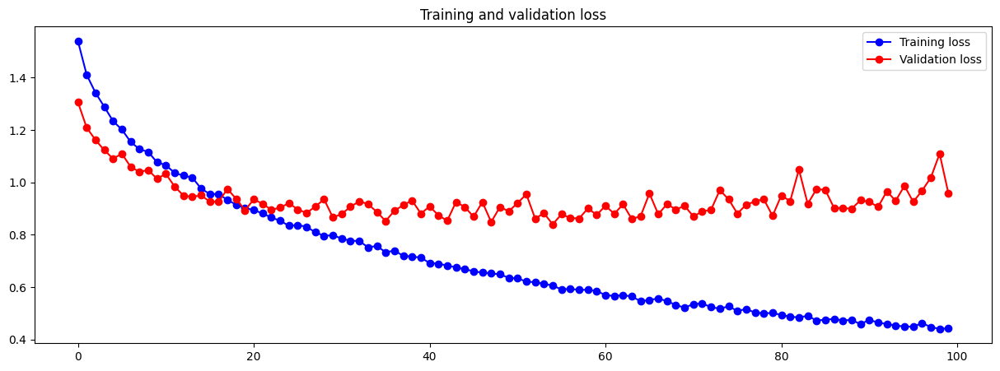

In [28]:
accloss(vgg9)

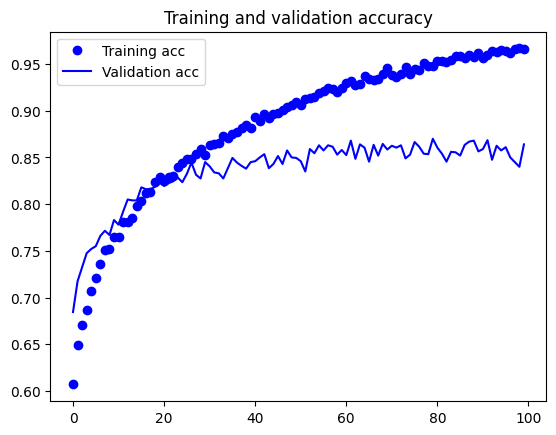

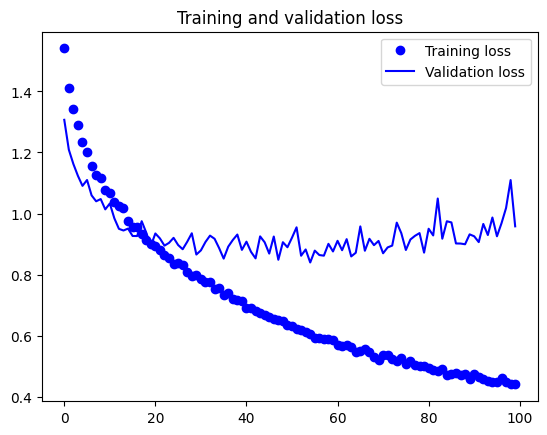

In [29]:
accloss1(vgg9)

In [30]:
vgg_model.save('food_model_two_vgg9.h5')

## Step 3 – Evaluate the Developed Models using Testing Images

In [4]:
import pandas as pd
#models_info_df = pd.DataFrame(columns=['model_name','test_acc','test_loss'])

<b>Model built from scratch<b>

In [5]:
img_size = 150
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
                test_dir,
                target_size =(img_size , img_size),
                batch_size = 32,
                class_mode = 'categorical')

Found 500 images belonging to 10 classes.


In [10]:
models_info = []

In [11]:
from tensorflow.keras.models import load_model

for file_name in os.listdir(base_dir):
    if file_name.startswith("food_model_one_") and file_name.endswith(".h5"):
        file_path = os.path.join(base_dir,file_name)
        loaded_model = load_model(file_path)
        test_loss, test_acc = loaded_model.evaluate(test_generator, steps = 500/32)
        
        model_name = file_name[:-3]
        model_info = {'model_name':file_name,'test_acc':test_acc,'test_loss':test_loss}
        
        models_info.append(model_info)

15/15 [==============================] - 1s 54ms/step - loss: 0.6060 - acc: 0.8120


<b>Model built with pretrained<b>

In [12]:
img_size = 224
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
                test_dir,
                target_size =(img_size , img_size),
                batch_size = 32,
                class_mode = 'categorical')

Found 500 images belonging to 10 classes.


In [13]:
for file_name in os.listdir(base_dir):
    if file_name.startswith("food_model_two_") and file_name.endswith(".h5"):
        file_path = os.path.join(base_dir,file_name)
        loaded_model = load_model(file_path)
        test_loss, test_acc = loaded_model.evaluate(test_generator, steps = 500/32)
        
        model_name = file_name[:-3]
        model_info = {'model_name':file_name,'test_acc':test_acc,'test_loss':test_loss}
        
        models_info.append(model_info)

15/15 [==============================] - 1s 69ms/step - loss: 0.9064 - acc: 0.8680


In [14]:
models_info_df = pd.DataFrame(models_info)

In [16]:
models_info_df.sort_values(by='test_acc', ascending=False)

,model_name,test_acc,test_loss
38,food_model_two_vgg5.h5,0.886,0.750354
40,food_model_two_vgg7.h5,0.870,0.775080
39,food_model_two_vgg6.h5,0.870,0.759515
42,food_model_two_vgg9.h5,0.868,0.906439
36,food_model_two_vgg3.h5,0.854,0.544342
37,food_model_two_vgg4.h5,0.850,0.604494
41,food_model_two_vgg8.h5,0.846,0.827776
35,food_model_two_vgg2.h5,0.842,0.583445
0,food_model_one_200epoch.h5,0.842,0.530593
23,food_model_one_kr6.h5,0.826,0.809704


In [19]:
(models_info_df[models_info_df['model_name'].str.startswith('food_model_two_')]).sort_values(by='test_acc', ascending=False)

,model_name,test_acc,test_loss
38,food_model_two_vgg5.h5,0.886,0.750354
39,food_model_two_vgg6.h5,0.870,0.759515
40,food_model_two_vgg7.h5,0.870,0.775080
42,food_model_two_vgg9.h5,0.868,0.906439
36,food_model_two_vgg3.h5,0.854,0.544342
37,food_model_two_vgg4.h5,0.850,0.604494
41,food_model_two_vgg8.h5,0.846,0.827776
35,food_model_two_vgg2.h5,0.842,0.583445
34,food_model_two_vgg1.h5,0.820,0.681879


In [18]:
(models_info_df[models_info_df['model_name'].str.startswith('food_model_two_')]).sort_values(by='test_loss', ascending=True)

,model_name,test_acc,test_loss
36,food_model_two_vgg3.h5,0.854,0.544342
35,food_model_two_vgg2.h5,0.842,0.583445
37,food_model_two_vgg4.h5,0.850,0.604494
34,food_model_two_vgg1.h5,0.820,0.681879
38,food_model_two_vgg5.h5,0.886,0.750354
39,food_model_two_vgg6.h5,0.870,0.759515
40,food_model_two_vgg7.h5,0.870,0.775080
41,food_model_two_vgg8.h5,0.846,0.827776
42,food_model_two_vgg9.h5,0.868,0.906439


In [20]:
model = load_model('food_model_two_vgg5.h5')
model.save('food_model_best.h5')

## Step 4  – Use the best model to make prediction

In [2]:
from tensorflow.keras.models import load_model
# Load the model
model = load_model('food_model_best.h5')

In [3]:
# Load the food list (in alphabetical order)
with open('3.txt', 'r') as f: # the .txt file which contains a list of food assigned to you
    x = f.readlines()
food_list =[]
for item in x:
    food_list.append(item.strip('\n'))
food_list = sorted(food_list) # food_list needs to be sorted alphabetically before feed into prediction() function
print(food_list)

['breakfast_burrito', 'croque_madame', 'fried_rice', 'hot_dog', 'huevos_rancheros', 'pad_thai', 'risotto', 'samosa', 'spaghetti_bolognese', 'strawberry_shortcake']


In [4]:
img_size = 224
# Define some related functions for image process and model prediction
from tensorflow.keras.preprocessing.image import load_img, img_to_array
def image_process(img):
    image = load_img(img, target_size =(img_size, img_size))
    image_array = img_to_array(image)/255
    return image_array

import pandas as pd
def prediction(model, img_array, items_l):
    prob = model.predict(img_array.reshape(1,img_size,img_size,3))
    pro_df = pd.DataFrame(prob, columns = items_l)
    result = items_l[np.argmax(prob)]
    return pro_df, result

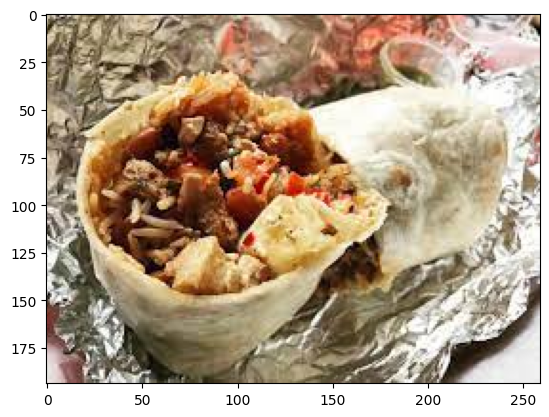

Actual: Breakfast Burrito
1/1 [==============================] - 0s 19ms/step
The prediction is:  breakfast_burrito 

    breakfast_burrito  croque_madame    fried_rice   hot_dog  huevos_rancheros  \
0           0.984845       0.000005  9.314240e-07  0.002041          0.012912   

   pad_thai       risotto    samosa  spaghetti_bolognese  strawberry_shortcake  
0  0.000004  3.094036e-07  0.000069             0.000009              0.000115  


In [10]:
# Make prediction for the image you downloaded from internet
import numpy as np
import matplotlib.pyplot as plt
img = 'breakfast_burrito.jpeg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
print("Actual: Breakfast Burrito")
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# link:
# https://eatbook.sg/burrito-singapore/

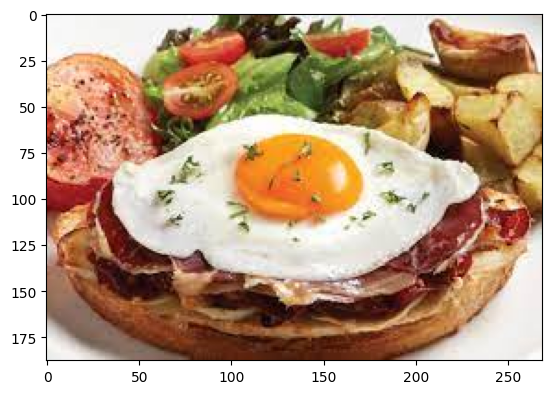

Actual: croque_madame
1/1 [==============================] - 0s 17ms/step
The prediction is:  croque_madame 

    breakfast_burrito  croque_madame    fried_rice       hot_dog  \
0       1.413959e-10       0.999891  8.172095e-10  2.026105e-11   

   huevos_rancheros      pad_thai       risotto        samosa  \
0          0.000109  3.603815e-12  2.004116e-11  2.379114e-13   

   spaghetti_bolognese  strawberry_shortcake  
0         3.015553e-09          3.708480e-12  


In [11]:
img = 'croque_madame.jpeg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
print("Actual: croque_madame")
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# link:
# https://www.parisbaguette.com.sg/product/pumpkin-cream-risotto/

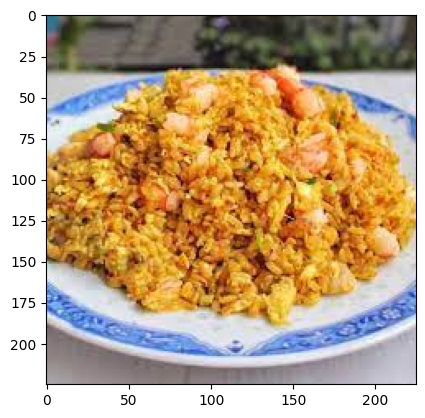

Actual: fried_rice
1/1 [==============================] - 0s 18ms/step
The prediction is:  fried_rice 

    breakfast_burrito  croque_madame  fried_rice       hot_dog  \
0       2.066086e-09   1.794082e-11    0.999998  2.352354e-09   

   huevos_rancheros      pad_thai   risotto        samosa  \
0      1.885867e-08  5.706621e-07  0.000001  4.366401e-09   

   spaghetti_bolognese  strawberry_shortcake  
0         3.674292e-09          1.311120e-11  


In [12]:
img = 'fried_rice.jpeg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
print("Actual: fried_rice")
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# link
# https://www.honestfoodtalks.com/singapore-fried-rice-recipe/

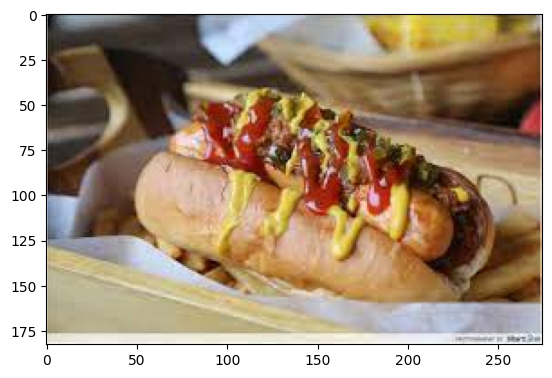

Actual: hot_dog
1/1 [==============================] - 0s 17ms/step
The prediction is:  hot_dog 

    breakfast_burrito  croque_madame  fried_rice   hot_dog  huevos_rancheros  \
0           0.290559       0.000159    0.000005  0.699194          0.009897   

   pad_thai       risotto    samosa  spaghetti_bolognese  strawberry_shortcake  
0  0.000008  9.351119e-07  0.000015             0.000159              0.000003  


In [13]:
img = 'hot_dog.jpeg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
print("Actual: hot_dog")
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# link
# https://thesmartlocal.com/read/hotdog-guide/

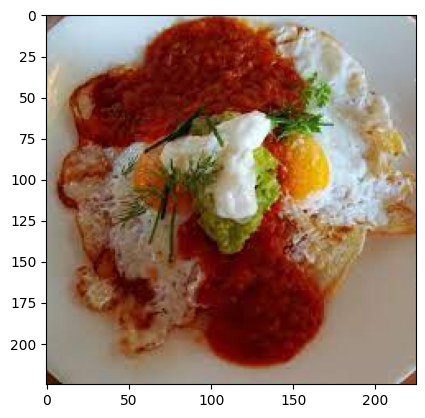

Actual: huevos_rancheros
1/1 [==============================] - 0s 20ms/step
The prediction is:  huevos_rancheros 

    breakfast_burrito  croque_madame  fried_rice       hot_dog  \
0           0.000355   5.904627e-07    0.000009  1.646400e-07   

   huevos_rancheros      pad_thai   risotto    samosa  spaghetti_bolognese  \
0          0.999207  3.833026e-08  0.000007  0.000003             0.000323   

   strawberry_shortcake  
0              0.000096  


In [14]:
img = 'huevos_rancheros.jpeg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
print("Actual: huevos_rancheros")
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# link
# https://www.burpple.com/dishes/1052898/super-huevos-rancheros-brunch

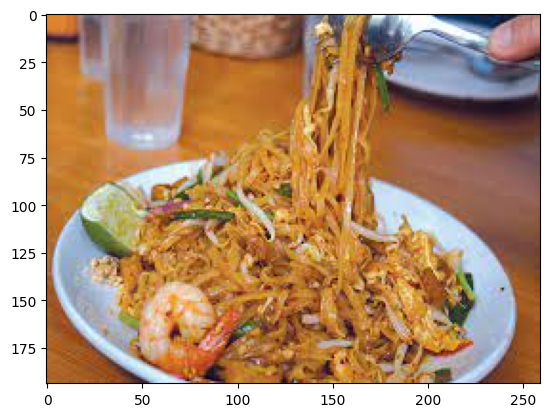

Actual: pad_thai
1/1 [==============================] - 0s 22ms/step
The prediction is:  pad_thai 

    breakfast_burrito  croque_madame  fried_rice   hot_dog  huevos_rancheros  \
0           0.001047       0.000013    0.011364  0.000212          0.000364   

   pad_thai   risotto    samosa  spaghetti_bolognese  strawberry_shortcake  
0  0.985281  0.000627  0.000005             0.001081              0.000005  


In [15]:
img = 'pad_thai.jpeg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
print("Actual: pad_thai")
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# link
# https://expatliving.sg/thai-restaurant-best-pad-thai-and-green-chicken-curry-in-singapore/

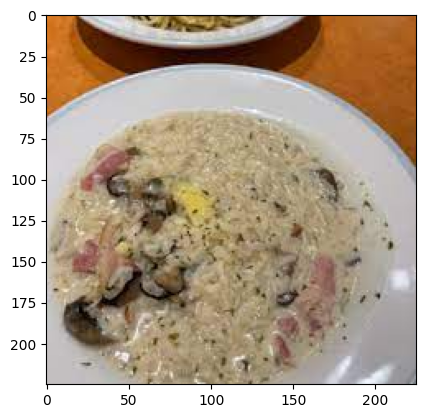

Actual: risotto
1/1 [==============================] - 0s 16ms/step
The prediction is:  risotto 

    breakfast_burrito  croque_madame  fried_rice       hot_dog  \
0           0.000005   1.335975e-07     0.00137  3.410785e-09   

   huevos_rancheros  pad_thai   risotto        samosa  spaghetti_bolognese  \
0          0.000014  0.000008  0.998581  1.797409e-07             0.000021   

   strawberry_shortcake  
0          1.901859e-07  


In [16]:
img = 'risotto.jpeg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
print("Actual: risotto")
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# link
# https://www.foodadvisor.com.sg/restaurant/saizeriya-city-square-mall/

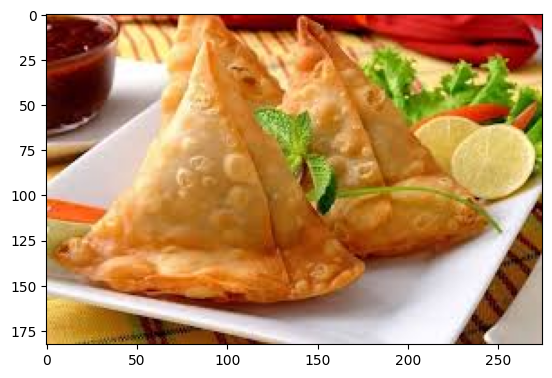

Actual: samosa
1/1 [==============================] - 0s 18ms/step
The prediction is:  samosa 

    breakfast_burrito  croque_madame    fried_rice       hot_dog  \
0       2.100970e-07   1.779763e-08  1.860868e-09  3.015261e-09   

   huevos_rancheros      pad_thai       risotto  samosa  spaghetti_bolognese  \
0      1.536861e-09  5.669456e-09  1.400788e-09     1.0         6.692118e-11   

   strawberry_shortcake  
0          3.806528e-11  


In [17]:
img = 'samosa.jpeg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
print("Actual: samosa")
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# link
# https://k4games.com.sg/fried-samosa-rental-singapore/

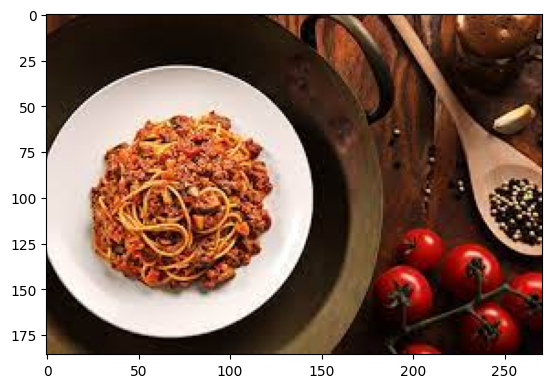

Actual: spaghetti_bolognese
1/1 [==============================] - 0s 17ms/step
The prediction is:  spaghetti_bolognese 

    breakfast_burrito  croque_madame    fried_rice       hot_dog  \
0           0.000006   6.343495e-08  2.000139e-08  1.439610e-07   

   huevos_rancheros  pad_thai       risotto    samosa  spaghetti_bolognese  \
0          0.000012  0.000065  3.396400e-08  0.000001             0.999913   

   strawberry_shortcake  
0              0.000003  


In [18]:
img = 'spaghetti_bolognese.jpeg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
print("Actual: spaghetti_bolognese")
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# link
# https://prego123.com.sg/recipes/spaghetti-bolognese

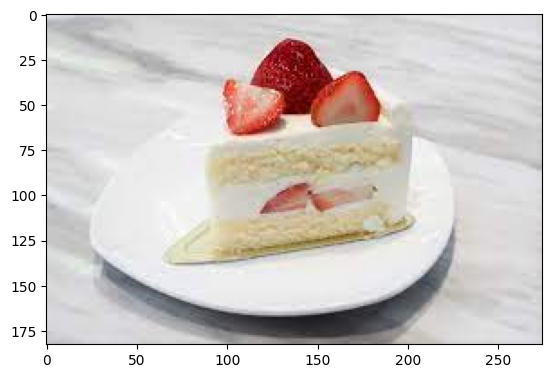

Actual: strawberry_shortcake
1/1 [==============================] - 0s 17ms/step
The prediction is:  strawberry_shortcake 

    breakfast_burrito  croque_madame    fried_rice       hot_dog  \
0       4.868672e-07   5.857486e-09  1.271263e-07  9.544623e-07   

   huevos_rancheros      pad_thai       risotto        samosa  \
0      1.269648e-09  8.702540e-10  3.226077e-07  1.197073e-09   

   spaghetti_bolognese  strawberry_shortcake  
0         5.342587e-09              0.999998  


In [19]:
img = 'strawberry_shortcake.jpeg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
print("Actual: strawberry_shortcake")
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# link 
# https://danielfooddiary.com/2020/07/14/strawberryshortcake/

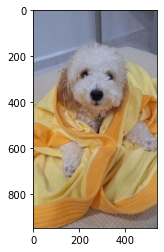

1/1 [==============================] - 0s 93ms/step
The prediction is:  croque_madame 

    breakfast_burrito  croque_madame  fried_rice   hot_dog  huevos_rancheros  \
0           0.011403       0.907175    0.000015  0.040966          0.025412   

   pad_thai   risotto    samosa  spaghetti_bolognese  strawberry_shortcake  
0  0.000024  0.000074  0.000013              0.01435              0.000568  


In [6]:
# Make prediction for the image you downloaded from internet
import numpy as np
import matplotlib.pyplot as plt
img = 'lexi.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
#print("Actual: Breakfast Burrito")
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# link:
# https://eatbook.sg/burrito-singapore/